# SCRAP ARTICLE'S TITLE AND CONTENT

In [1]:
import pandas as pd
import requests
from requests.adapters import HTTPAdapter
from requests.packages.urllib3.util.retry import Retry
from bs4 import BeautifulSoup
import re
import random
from tqdm import tqdm  # For the progress bar

In [2]:
# Load the CSV files
df_et = pd.read_csv('economic_times_articles_2020_to_2024.csv')
df_toi = pd.read_csv('times_of_india_articles_2020_to_2024.csv')

In [3]:
# Extract publication year from the Date column (assuming 'Date' column exists)
df_et['Year'] = pd.to_datetime(df_et['Date'], errors='coerce').dt.year
df_toi['Year'] = pd.to_datetime(df_toi['Date'], errors='coerce').dt.year

df_et

,Media Name,Article Link,Date,Year
0,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news,2020-01-01,2020
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/poli...,2020-01-01,2020
2,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/industry/...,2020-01-01,2020
3,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/defe...,2020-01-01,2020
4,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/spor...,2020-01-01,2020
...,...,...,...,...
590350,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/defe...,2024-12-31,2024
590351,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/new-...,2024-12-31,2024
590352,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/industry/...,2024-12-31,2024
590353,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/indi...,2024-12-31,2024


In [4]:
print("No. of articles from Economic Times: ", len(df_et))
print("No. of articles from Economic Times: ", len(df_toi))

No. of articles from Economic Times:  590355
No. of articles from Economic Times:  974032


In [5]:
# Filter out rows with invalid 'Year' (NaT or NaN)
df_et = df_et[df_et['Year'].notna()]
df_toi = df_toi[df_toi['Year'].notna()]

# Filter rows where 'Article Link' ends with '.cms'
df_et = df_et[df_et['Article Link'].str.endswith('.cms')]
df_toi = df_toi[df_toi['Article Link'].str.endswith('.cms')]

# Selecting total 50,000 articles randomly
num_articles_per_year = 1000            # 50,000 = 10,000 x 5 = (5000 x 2) x 5

# Sample articles per year for Economic Times (df_et)
df_et_sampled = df_et.groupby('Year').apply(lambda x: x.sample(min(num_articles_per_year, len(x)), random_state=42))

# Sample articles per year for Times of India (df_toi)
df_toi_sampled = df_toi.groupby('Year').apply(lambda x: x.sample(min(num_articles_per_year, len(x)), random_state=42))

# Combine the sampled DataFrames
df_sampled = pd.concat([df_et_sampled, df_toi_sampled], ignore_index=True)

# Shuffle the combined DataFrame to ensure randomness
df_sampled = df_sampled.sample(frac=1, random_state=1).reset_index(drop=True)

# Remove duplicates and reset index
df_sampled = df_sampled.drop_duplicates().reset_index(drop=True)

df = df_sampled.drop(columns=['Year'])

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_46200\18531706.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_et_sampled = df_et.groupby('Year').apply(lambda x: x.sample(min(num_articles_per_year, len(x)), random_state=42))
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_46200\18531706.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_toi_sampled = df_toi.groupby('Year').apply(lambda x: x.sample(mi

In [6]:
df_sampled.shape

(10000, 4)

In [7]:
df_sampled

,Media Name,Article Link,Date,Year
0,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/rajko...,2024-06-25,2024
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,2023-10-26,2023
2,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/tech/star...,2024-10-14,2024
3,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,2023-08-29,2023
4,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/kolka...,2020-09-15,2020
...,...,...,...,...
9995,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/industry/...,2022-01-28,2022
9996,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/jaipu...,2022-08-31,2022
9997,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,2020-06-22,2020
9998,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/madur...,2020-03-01,2020


In [8]:
# Group by 'Year' and 'Media Name' to count the number of articles for each combination
article_counts = df_sampled.groupby(['Year', 'Media Name']).size().reset_index(name='Article Count')

# Display the result as a table-like format
print(article_counts)

   Year          Media Name  Article Count
0  2020  THE ECONOMIC TIMES           1000
1  2020  THE TIMES OF INDIA           1000
2  2021  THE ECONOMIC TIMES           1000
3  2021  THE TIMES OF INDIA           1000
4  2022  THE ECONOMIC TIMES           1000
5  2022  THE TIMES OF INDIA           1000
6  2023  THE ECONOMIC TIMES           1000
7  2023  THE TIMES OF INDIA           1000
8  2024  THE ECONOMIC TIMES           1000
9  2024  THE TIMES OF INDIA           1000


In [9]:
df.reset_index(drop=True, inplace=True)

df.head()

,Media Name,Article Link,Date
0,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/rajko...,2024-06-25
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,2023-10-26
2,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/tech/star...,2024-10-14
3,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,2023-08-29
4,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/kolka...,2020-09-15


In [10]:
# Function to clean the content and title
def clean_content(content):
    unwanted_phrases = [
        'click here', 'Click Here', 'advertisement', 'Ad', 'Subscribe', 
        'Read More', 'Learn More', 'Join Now', 'Get Started', 'Sign Up', 
        'Click to Learn More', 'Buy Now', 'Limited Time Offer', 'Act Now', 
        'Don’t Miss Out', 'Exclusive Deal', 'Shop Now', 'Download Now', 
        'Try for Free', 'Free Trial', 'Register Now', 'See More', 
        'Follow Us', 'Stay Updated', 'Get Updates', 'Explore More', 
        'More Info', 'This Just In', 'Breaking News', 'Today’s Deals',
        'YOU MAY LIKE', 'Post comment', 'You can now subscribe to our Economic Times WhatsApp channel'
    ]

    # Remove unwanted phrases
    for phrase in unwanted_phrases:
        content = content.replace(phrase, '')

    # Remove HTML tags if any remain
    content = re.sub(r'<[^>]+>', '', content)

    # Remove invalid characters (non-ASCII and words containing unusual symbols)
    content = re.sub(r'[^\x00-\x7F]+', '', content)

    # Clean up formatting
    content = re.sub(r'\s+', ' ', content)  # Replace multiple whitespace with a single space
#     content = re.sub(r'(?<=[a-zA-Z])(?=[A-Z])', ' ', content)  # Add space before uppercase letters
    content = re.sub(r'(?<=[a-zA-Z])(?=\d)', ' ', content)  # Add space before digits
    content = re.sub(r'(?<=[\w])(?=[\W])', ' ', content)  # Add space before non-word characters

    return content.strip()

In [11]:
# Create a requests session with retry strategy
def create_session_with_retries(retries=3, backoff_factor=0.3, status_forcelist=(500, 502, 504), session=None):
    session = session or requests.Session()
    retry = Retry(
        total=retries,
        read=retries,
        connect=retries,
        backoff_factor=backoff_factor,
        status_forcelist=status_forcelist,
    )
    adapter = HTTPAdapter(max_retries=retry)
    session.mount("http://", adapter)
    session.mount("https://", adapter)
    return session

session = create_session_with_retries()

In [12]:
# Function to extract the Article ID from each link
def extract_article_id(link):
    match = re.search(r'articleshow/(\d+)\.cms', link)
    if match:
        return match.group(1)
    return None

# Function to extract all text inside the content block
def extract_content_block(content_element):
    if content_element:
        # Get all the text inside the content block, preserving the sequence
        content = content_element.get_text(separator=" ", strip=True)
        return clean_content(content)
    return 'No Content Found'

In [13]:
# Define scraping functions for Economic Times
def scrape_economic_times(article_link):
    article_id = extract_article_id(article_link)
    if not article_id:
        return None

    try:
        # Fetch the page content with retry mechanism and timeout
        response = session.get(article_link, timeout=10)
        soup = BeautifulSoup(response.text, 'html.parser')
    
        # Locate the main div using Article ID
        main_div = soup.find('div', {'data-article_id': article_id})
    
        if main_div:
            # Extract title from h1 tag with class 'artTitle font_faus'
            title_element = main_div.find('h1', class_='artTitle')
            title = title_element.get_text(strip=True) if title_element else 'No Title Found'
        
            # Extract content from div with class 'artText medium'
            content_element = main_div.find('div', class_='artText')
            content = extract_content_block(content_element)
        
            # Clean the title
            title = clean_content(title)
        
            return {'title': title, 'content': content}
    except (requests.exceptions.RequestException, requests.exceptions.SSLError) as e:
        print(f"Error scraping {article_link}: {e}")
    
    return None

In [14]:
# Define scraping functions for Times of India
def scrape_times_of_india(article_link):
    article_id = extract_article_id(article_link)
    if not article_id:
        return None

    try:
        # Fetch the page content with retry mechanism and timeout
        response = session.get(article_link, timeout=10)
        soup = BeautifulSoup(response.text, 'html.parser')
    
        # Locate the main div using Article ID
        main_div = soup.find('div', id=f'toi-article-container-{article_id}', class_='clearfix rel')
    
        if main_div:
            # Remove ad blocks and polling blocks
            for ad_block in main_div.find_all('div', {'data-type': 'in_view'}, recursive=False):
                ad_block.decompose()  # Remove ad blocks
            for ad_block2 in main_div.find_all('div', class_='lOvcW', recursive=False):
                ad_block2.decompose()  # Remove ad blocks
            for poll_block in main_div.find_all('div', id='poll-widget', recursive=False):
                poll_block.decompose()  # Remove polling blocks
        
            # Extract title from h1 tag with class 'HNMDR'
            title_element = main_div.find('h1', class_='HNMDR')
            title = title_element.get_text(strip=True) if title_element else 'No Title Found'
        
            # Extract content from div with class '_s30J clearfix'
            content_element = main_div.find('div', class_='_s30J clearfix')
            content = extract_content_block(content_element)
        
            # Clean the title
            title = clean_content(title)
        
            return {'title': title, 'content': content}
    except (requests.exceptions.RequestException, requests.exceptions.SSLError) as e:
        print(f"Error scraping {article_link}: {e}")

    return None

In [15]:
# Function to scrape articles from the provided DataFrame
def scrape_articles(df):
    articles = []
    
    # Progress bar for tracking progress
    for index, row in tqdm(df.iterrows(), total=df.shape[0], desc="Scraping Articles"):
        article_link = row['Article Link']
        media_name = row['Media Name']
        date = row['Date']
        
        if 'economictimes' in article_link:
            scraped_data = scrape_economic_times(article_link)
        elif 'timesofindia' in article_link:
            scraped_data = scrape_times_of_india(article_link)
        else:
            continue
        
        if scraped_data:
            articles.append({
                'Media Name': media_name,
                'Article Link': article_link,
                'Title': scraped_data['title'],
                'Content': scraped_data['content'],
                'Date' : date,
            })
    
    # Return the results as a DataFrame
    return pd.DataFrame(articles)

In [16]:
# Scrape the 10 sample articles
scraped_articles_df = scrape_articles(df)

# Save the scraped data into a CSV file
scraped_articles_df.to_csv('scraped_articles.csv', index=False)

print("Scraping complete. Data saved to 'scraped_articles.csv'.")

Scraping Articles:  42%|███████████████████████▏                               | 4221/10000 [35:13<16:51:53, 10.51s/it]

Error scraping https://economictimes.indiatimes.com/industry/services/education/textbook-publishers-are-trying-to-survive-the-pandemic-by-offering-digital-solutions-as-well/articleshow/85931306.cms: HTTPSConnectionPool(host='economictimes.indiatimes.com', port=443): Max retries exceeded with url: /industry/services/education/textbook-publishers-are-trying-to-survive-the-pandemic-by-offering-digital-solutions-as-well/articleshow/85931306.cms (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x00000290C3BBCB50>: Failed to resolve 'economictimes.indiatimes.com' ([Errno 11001] getaddrinfo failed)"))


Scraping Articles:  42%|███████████████████████▏                               | 4222/10000 [35:15<12:40:43,  7.90s/it]

Error scraping https://economictimes.indiatimes.com/news/elections/lok-sabha/india/agniveer-scheme-nda-ally-jdu-seeks-removal-of-problems-in-defence-program/articleshow/110762323.cms: HTTPSConnectionPool(host='economictimes.indiatimes.com', port=443): Max retries exceeded with url: /news/elections/lok-sabha/india/agniveer-scheme-nda-ally-jdu-seeks-removal-of-problems-in-defence-program/articleshow/110762323.cms (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x00000290C3BB1640>: Failed to resolve 'economictimes.indiatimes.com' ([Errno 11001] getaddrinfo failed)"))


Scraping Articles:  42%|███████████████████████▋                                | 4223/10000 [35:17<9:44:47,  6.07s/it]

Error scraping https://economictimes.indiatimes.com/markets/stocks/news/nikkei-ends-lower-as-rising-virus-cases-cloud-recovery-hopes/articleshow/76441443.cms: HTTPSConnectionPool(host='economictimes.indiatimes.com', port=443): Max retries exceeded with url: /markets/stocks/news/nikkei-ends-lower-as-rising-virus-cases-cloud-recovery-hopes/articleshow/76441443.cms (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x00000290C3BB1B50>: Failed to resolve 'economictimes.indiatimes.com' ([Errno 11001] getaddrinfo failed)"))


Scraping Articles:  42%|███████████████████████▋                                | 4224/10000 [35:19<7:42:02,  4.80s/it]

Error scraping https://economictimes.indiatimes.com/industry/transportation/airlines-/-aviation/indian-government-issues-letter-of-intent-to-tata-group-for-the-sale-of-air-india/articleshow/86940946.cms: HTTPSConnectionPool(host='economictimes.indiatimes.com', port=443): Max retries exceeded with url: /industry/transportation/airlines-/-aviation/indian-government-issues-letter-of-intent-to-tata-group-for-the-sale-of-air-india/articleshow/86940946.cms (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x00000290C3BB1820>: Failed to resolve 'economictimes.indiatimes.com' ([Errno 11001] getaddrinfo failed)"))


Scraping Articles:  42%|███████████████████████▏                               | 4225/10000 [35:32<11:35:49,  7.23s/it]

Error scraping https://economictimes.indiatimes.com/markets/stocks/news/crisil-declares-700-interim-dividend-for-cy23/articleshow/99618221.cms: HTTPSConnectionPool(host='economictimes.indiatimes.com', port=443): Max retries exceeded with url: /markets/stocks/news/crisil-declares-700-interim-dividend-for-cy23/articleshow/99618221.cms (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x00000290C3BBCFD0>: Failed to resolve 'economictimes.indiatimes.com' ([Errno 11001] getaddrinfo failed)"))


Scraping Articles: 100%|███████████████████████████████████████████████████████| 10000/10000 [1:26:42<00:00,  1.92it/s]


Scraping complete. Data saved to 'scraped_articles.csv'.


In [17]:
scraped_articles_df.head(50)

,Media Name,Article Link,Title,Content,Date
0,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/rajko...,BJP leader fears assault on life by Jun...,Rajkot : Five days after Junagadh BJP MP ...,2024-06-25
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,Israel denies visas to UN officials as ...,Israel 's ambassador to the United Nation...,2023-10-26
2,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/tech/star...,VCs apply PMF filter on early -stage sta...,Early -stage startups are up against stro...,2024-10-14
3,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,Islamabad High Court suspends Imran Khan ...,The Islamabad High Court on Tuesday susp...,2023-08-29
4,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/kolka...,Was jittery about the 6 -month gap but ...,It felt nice to be back in the driving...,2020-09-15
5,THE TIMES OF INDIA,https://timesofindia.indiatimes.com/sports/nfl...,Is Tom Brady 's Influence Pushing Shannon...,Image via Imago All that was about to ...,2023-11-11
6,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,Biz with over Rs 20 cr turnover to man...,Businesses with turnover of over Rs 20 ...,2022-02-26
7,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,Japan stocks end higher as auto sector ...,TOKYO : Japanese stocks ended higher in c...,2021-02-11
8,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,20 states carrying forward Rs 2 .6 lakh ...,Most states are likely to be in better ...,2021-08-13
9,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/chenn...,Hotel bar employees held for swindling 5L,Chennai : Three bar employees of a city ...,2024-08-26


In [19]:
# # Merging the DataFrames
# merged_df = pd.merge(scraped_articles_df, df[['Article Link', 'Date']], on='Article Link', how='left')

# merged_df.head()

,Media Name,Article Link,Title,Content,Date
0,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/kolka...,Kolkata International Film Festival physic...,With International Film Festival of India...,2020-10-03
1,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/barei...,Uttar Pradesh : 143 booked in Pilibhit fo...,Representative Image PILIBHIT : At least 1...,2020-03-26
2,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/jaipu...,SC breather for liquor shops,Jaipur : Hearing a case against the excis...,2021-01-26
3,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/poli...,Thousands of Congress workers descend at ...,Slogans of Make Rahul Gandhi INC preside...,2022-09-04
4,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/industry/...,McDonald 's cheese crackdown : Maharashtra ...,After finding misleading claims related t...,2024-02-27


In [20]:
# # Save the scraped data into a CSV file
# merged_df.to_csv('final_scraped_articles.csv', index=False)

# print("Data saved to 'final_scraped_articles.csv'.")

Data saved to 'final_scraped_articles.csv'.


# Categorize Articles

In [1]:
from transformers import pipeline
import pandas as pd
import re
from tqdm import tqdm
import plotly.express as px  
import warnings

# Suppress specific warnings
warnings.filterwarnings("ignore", message="Length of IterableDataset")

KeyboardInterrupt: 

In [ ]:
# Load the CSV files
df = pd.read_csv('scraped_articles.csv')

In [ ]:
len(df)

In [ ]:
# Choose 20 random entries
# df = df.sample(n=5000, random_state=1)  # random_state for reproducibility


In [ ]:
df.head()

In [ ]:
import plotly.express as px

# Data for categories and subcategories
data = {
    'Category': [
        'Politics', 'Politics', 'Politics', 'Politics', 'Politics',
        'Culture and Lifestyle', 'Culture and Lifestyle', 'Culture and Lifestyle','Culture and Lifestyle','Culture and Lifestyle','Culture and Lifestyle','Culture and Lifestyle',
        'Business', 'Business', 'Business', 'Business', 'Business', 'Business', 'Business',
        'Health', 'Health', 'Health', 'Health', 'Health', 'Health', 'Health',
        'Disaster', 'Disaster', 'Disaster', 'Disaster', 'Disaster','Disaster',
        'Economy', 'Economy', 'Economy', 'Economy', 'Economy','Economy', 'Economy',
        'Sports', 'Sports', 'Sports', 'Sports', 'Sports', 'Sports', 'Sports','Sports',
        'Science and Technology', 'Science and Technology', 'Science and Technology', 'Science and Technology','Science and Technology'
    ],
    'Subcategory': [
        'Domestic Politics', 'International Relations', 'Elections', 'Policy & Governance', 'Other',
        'Entertainment', 'Fashion', 'Travel', 'Art and Literature', 'Bollywood', 'Religion', 'Other',
        'Finance', 'Startups', 'Corporate News', 'Entrepreneurship', 'Stock Market', 'Mergers & Acquisitions', 'Other',
        'Public Health', 'Mental Health', 'Healthcare Industry', 'Nutrition', 'Pandemics', 'Medical Research', 'Other',
        'Natural Disasters', 'Human-made Disasters', 'Crisis Management', 'Relief Efforts', 'Accidents', 'Other',
        'Global Economy', 'Trade and Commerce', 'Inflation', 'Unemployment', 'Indian Economy', 'Budget', 'Other',
        'Cricket', 'Football', 'Hockey', 'Olympics', 'Tennis', 'Badminton', 'Kabaddi', 'Other',
        'Space and Astronomy', 'AI and Machine Learning', 'Biotechnology', 'Indian Innovations', 'Other'
    ]
}

# Creating the Sunburst chart
fig = px.sunburst(data, path=['Category', 'Subcategory'], title="Category-Subcategory Hierarchy")
fig.show()

In [ ]:
# Predefined categories
categories = ['Politics', 'Culture and Lifestyle', 'Business', 'Health', 'Disaster', 'Economy', 'Sports', 'Science and Technology']

# Sub-category mapping for each main category
subcategories = {
    'Politics': ['Domestic Politics', 'International Relations', 'Elections', 'Policy & Governance', 'Other'],
    'Culture and Lifestyle': ['Entertainment', 'Fashion', 'Travel', 'Art and Literature', 'Bollywood', 'Religion', 'Other'],
    'Business': ['Finance', 'Startups', 'Corporate News', 'Entrepreneurship', 'Stock Market', 'Mergers & Acquisitions', 'Other'],
    'Health': ['Public Health', 'Mental Health', 'Healthcare Industry', 'Nutrition', 'Pandemics', 'Medical Research', 'Other'],
    'Disaster': ['Natural Disasters', 'Human-made Disasters', 'Crisis Management', 'Relief Efforts', 'Accidents', 'Other'],
    'Economy': ['Global Economy', 'Trade and Commerce', 'Inflation', 'Unemployment', 'Indian Economy', 'Budget', 'Other'],
    'Sports': ['Cricket', 'Football', 'Hockey', 'Olympics', 'Tennis', 'Badminton', 'Kabaddi', 'Other'],
    'Science and Technology': ['Space and Astronomy', 'AI and Machine Learning', 'Biotechnology', 'Indian Innovations', 'Other']
}

In [ ]:
# Function to extract keywords from the URL
def extract_keywords_from_url(url):
    # Clean the URL by removing protocol and domain
    url_cleaned = re.sub(r'https?://', '', url)
    url_cleaned = re.sub(r'www\.', '', url_cleaned)
    
    # Split the URL into parts
    url_parts = re.split(r'[/\-]', url_cleaned)
    
    # Define unwanted keywords
    unwanted_keywords = {'timesofindia', 'indiatimes', 'economictimes', '.com', '.cms', 'articleshow'}
    
    # Extract keywords while filtering out unwanted ones
    keywords = [
        part for part in url_parts 
        if part and len(part) > 2 
        and not any(unwanted in part.lower() for unwanted in unwanted_keywords) 
        and not re.fullmatch(r'\d+', part)  # Exclude standalone numbers
        and not re.match(r'^\d+$', part)  # Exclude parts that are only numbers
    ]
    
    return ' '.join(keywords)

In [25]:
# Load a pretrained text classification model (zero-shot-classification)
classifier = pipeline('zero-shot-classification', model='facebook/bart-large-mnli', device=0)

In [26]:
# Extract keywords from the Article Link (URL)
df['Extracted Keywords'] = df['Article Link'].apply(extract_keywords_from_url)

In [27]:
# Function to classify the main category
def classify_main_category(keywords_and_title):
    result = classifier(keywords_and_title, categories)
    top_category = result['labels'][0] if result['scores'][0] > 0.5 else 'Others'  # Reduce the confidence threshold
    return top_category

# Function to classify the sub-category based on the main category
def classify_sub_category(keywords_and_title, main_category):
    if main_category in subcategories:
        subcategory_list = subcategories[main_category]
        result = classifier(keywords_and_title, subcategory_list)
        return result['labels'][0] if result['scores'][0] > 0.5 else 'Other'
    return 'Other'

In [10]:
# # Classify the main categories individually
# df['Main Category Result'] = classify_individually(df['Extracted Keywords'].tolist(), categories)

# # Extract the top category from the individual results
# df['Main Category'] = df['Main Category Result'].apply(lambda x: x['labels'][0] if x['scores'][0] > 0.5 else 'Others')

In [11]:
# # Batch classify the sub-categories based on the Main Category
# def classify_subcategory(row):
#     if row['Main Category'] != 'Others' and row['Main Category'] in subcategories:
#         sub_labels = subcategories[row['Main Category']]
#         sub_result = classifier(row['Combined Data'], sub_labels)
#         return sub_result['labels'][0] if sub_result['scores'][0] > 0.5 else 'Other'
#     return 'Other'

In [28]:
# Combine Title and Extracted Keywords for better context
df['Extracted Keywords'] = df['Article Link'].apply(extract_keywords_from_url)
# df['Combined Data'] = df['Title'] + ' ' + df['Extracted Keywords']

# Use tqdm for progress bar while classifying main categories
tqdm.pandas(desc="Classifying Main Category")
df['Main Category'] = df['Extracted Keywords'].progress_apply(classify_main_category)

# Use tqdm for progress bar while classifying sub-categories
tqdm.pandas(desc="Classifying Sub-category")
df['Sub-category'] = df.progress_apply(lambda row: classify_sub_category(row['Extracted Keywords'], row['Main Category']), axis=1)

Classifying Main Category:   0%|                                                              | 0/9807 [00:00<?, ?it/s]C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\transformers\models\bart\modeling_bart.py:497: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(
Classifying Sub-category: 100%|████████████████████████████████████████████████████| 9807/9807 [22:53<00:00,  7.14it/s]


In [29]:
# Display the resulting DataFrame
len(df)

9807

In [30]:
df.head()

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category
0,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/rajko...,BJP leader fears assault on life by Jun...,Rajkot : Five days after Junagadh BJP MP ...,2024-06-25,city rajkot bjp leader fears assault life juna...,Others,Other
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,Israel denies visas to UN officials as ...,Israel 's ambassador to the United Nation...,2023-10-26,news international world news israel denies vi...,Others,Other
2,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/tech/star...,VCs apply PMF filter on early -stage sta...,Early -stage startups are up against stro...,2024-10-14,tech startups vcs apply pmf filter early stage...,Others,Other
3,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/inte...,Islamabad High Court suspends Imran Khan ...,The Islamabad High Court on Tuesday susp...,2023-08-29,news international world news islamabad high c...,Others,Other
4,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/kolka...,Was jittery about the 6 -month gap but ...,It felt nice to be back in the driving...,2020-09-15,city kolkata was jittery about the month gap b...,Others,Other


In [31]:
# Filter out rows where Main Category is 'Others'
df_filtered = df[df['Main Category'] != 'Others']

# Display the filtered DataFrame
df_filtered.tail()

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category
9800,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,FM holds meeting with industry on direct...,NEW DELHI : Finance Minister Nirmala Sitha...,2020-02-10,news economy policy holds meeting with industr...,Economy,Other
9802,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/industry/...,Air India seeks to settle a $1 .2 bn l...,Air India is seeking to end a case fil...,2022-01-28,industry transportation airlines aviation air ...,Business,Corporate News
9804,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,Trending stocks : PTC India shares surge ...,NEW DELHI : Shares of PTC India Ltd . tra...,2020-06-22,markets stocks news trending stocksnbspptc ind...,Business,Stock Market
9805,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/madur...,Debris keeps piling on Rajaji hospital c...,Madurai : All sorts of debris continue to...,2020-03-01,city madurai debris keeps piling rajaji hospit...,Health,Other
9806,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/poli...,Congress reshuffle : Sonia Gandhi plays it...,"New Delhi : Sensing a brewing rebellion , ...",2020-09-12,news politics and nation congress reshuffle so...,Politics,Other


In [32]:
len(df_filtered)

4361

### Graphs

In [1]:
import pandas as pd
import plotly.express as px  

df_filtered = pd.read_csv('dataset/filtered_category_demo.csv')

In [2]:
# Count occurrences of each main category
main_category_counts = df_filtered['Main Category'].value_counts().reset_index()
main_category_counts.columns = ['Main Category', 'Count']

# Create bar chart
fig_bar = px.bar(main_category_counts, x='Main Category', y='Count', 
                  title='Distribution of Main Categories',
                  labels={'Count': 'Number of Articles'},
                  color='Main Category',
                 color_continuous_scale='Viridis',  # Using a catchy color scale
                  ) 


fig_bar.show()

# fig_bar.write_image(f"{img_path}\main_category_distribution.png")

In [6]:
# Create pie charts for each main category
for main_category in df_filtered['Main Category'].unique():
    # Filter the DataFrame for the current main category
    subcategory_counts = df_filtered[df_filtered['Main Category'] == main_category]['Sub-category'].value_counts().reset_index()
    subcategory_counts.columns = ['Sub-category', 'Count']

    # Create pie chart
    fig_pie = px.pie(subcategory_counts, values='Count', names='Sub-category',
                     title=f'Distribution of Sub-Categories in {main_category}',
                     color='Sub-category',
                     color_discrete_sequence=px.colors.qualitative.Set1)

    fig_pie.show()

In [37]:
df_filtered.to_csv('dataset/filtered_category_demo.csv', index=False)

print('Data saved to filtered_category_demo.csv')

Data saved to filtered_category_demo.csv


# Article Tone Detection

- **Model Used**: Twitter RoBERTa model fine-tuned for sentiment analysis.
- **Suitability**: 
  - Well-suited for analyzing social media texts.
  - Trained on a large dataset of tweets, allowing it to understand informal language and nuances.
- **Sentiment Classifications**:
  - Provides nuanced sentiment classifications.
  - Effective for discerning sentiment in short, informal texts.
- **Implementation Steps**:
  - Preprocess the article text.
  - Compute sentiment scores for the text.
  - Classify the sentiment into three categories: 
    - Negative
    - Neutral
    - Positive
- **Score Scaling**: 
  - Sentiment scores are scaled to a range of -5 to 5 for better interpretability.

In [38]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer
import pandas as pd
import re
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.special import softmax

In [39]:
df = pd.read_csv('dataset/filtered_category_demo.csv')

In [40]:
# Choose 20 random entries
# df = df.sample(n=50, random_state=42)  # random_state for reproducibility

In [41]:
len(df)

4361

In [42]:
# Combine Title and Content
df['Article_Text'] = df['Title'] + ' ' + df['Content']

In [43]:
# Minimal Preprocessing
def preprocess_text(text):
    text = re.sub(r'http\S+|www\S+', '', text)  # Remove URLs
    text = re.sub(r'[^\w\s]', '', text)  # Remove non-alphanumeric characters
    return text.strip()

tqdm.pandas()
df['Preprocessed_Text'] = df['Article_Text'].progress_apply(preprocess_text)

100%|████████████████████████████████████████████████████████████████████████████| 4361/4361 [00:00<00:00, 5119.21it/s]


In [44]:
# Load RoBERTa Model and Tokenizer
MODEL = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
         

In [45]:
# Function to chunk text into smaller segments
def chunk_text(text, max_length=512):
    tokens = tokenizer.encode(text, add_special_tokens=True)
    for i in range(0, len(tokens), max_length):
        yield tokens[i:i + max_length]

# Sentiment Scoring Function Using RoBERTa
def get_roberta_sentiment(text):
    chunks = list(chunk_text(text))
    scores = []
    
    for chunk in chunks:
        encoded_input = torch.tensor([chunk]).to(device)  # Move input to GPU
        with torch.no_grad():  # Disable gradient calculation
            output = model(encoded_input)
        chunk_scores = output[0][0].detach().cpu().numpy()  # Move scores to CPU
        scores.append(softmax(chunk_scores))  # Apply softmax to get probabilities
    
    # Average the scores across chunks
    avg_scores = np.mean(scores, axis=0)
    return avg_scores

# Scale Sentiment Scores
def extract_sentiment_scores(scores):
    positive_score = scores[2]
    negative_score = scores[0]
    neutral_score = scores[1]
    
    compound_score = (positive_score - negative_score) / np.sum(scores)
    
    # Scale the compound score to the range of -5 to 5
    if compound_score < -0.3:  # Adjusted threshold for Negative
        return compound_score * 5  # Scale Negative
    elif -0.3 <= compound_score <= 0.3:  # Adjusted threshold for Neutral
        return compound_score * 5  # Scale Neutral
    else:  # Positive
        return compound_score * 5  # Scale Positive

In [46]:
# Apply sentiment scoring
df['Sentiment_Scores'] = df['Preprocessed_Text'].progress_apply(get_roberta_sentiment)
df['Sentiment_Score'] = df['Sentiment_Scores'].apply(extract_sentiment_scores)

100%|██████████████████████████████████████████████████████████████████████████████| 4361/4361 [07:15<00:00, 10.02it/s]


In [48]:
# Tone Classification
def categorize_tone(score):
    if score <= -3:
        return 'Very Negative'
    elif -3 < score <= -1:
        return 'Negative'
    elif -1 < score < 1:
        return 'Neutral'
    elif 1 <= score < 3:
        return 'Positive'
    else:  # score => 3
        return 'Very Positive'

df['Article_Tone'] = df['Sentiment_Score'].apply(categorize_tone)

In [49]:
df.head()

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Preprocessed_Text,Sentiment_Scores,Sentiment_Score,Article_Tone
0,THE TIMES OF INDIA,https://timesofindia.indiatimes.com/sports/nfl...,Is Tom Brady 's Influence Pushing Shannon...,Image via Imago All that was about to ...,2023-11-11,sports nfl news tom bradys influence pushing s...,Sports,Football,Is Tom Brady 's Influence Pushing Shannon...,Is Tom Brady s Influence Pushing Shannon ...,"[0.027266482, 0.7237468, 0.24898678]",1.108601,Positive
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,Biz with over Rs 20 cr turnover to man...,Businesses with turnover of over Rs 20 ...,2022-02-26,news economy policy biz with over turnover man...,Business,Other,Biz with over Rs 20 cr turnover to man...,Biz with over Rs 20 cr turnover to man...,"[0.048547402, 0.88167214, 0.06978051]",0.106166,Neutral
2,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,20 states carrying forward Rs 2 .6 lakh ...,Most states are likely to be in better ...,2021-08-13,news economy finance states carrying forward l...,Economy,Other,20 states carrying forward Rs 2 .6 lakh ...,20 states carrying forward Rs 2 6 lakh ...,"[0.02960213, 0.7974939, 0.172904]",0.716509,Neutral
3,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/mumba...,Supreme Court observation on resignation ...,Uddhav Thackeray MUMBAI : Shiv Sena (UBT )...,2023-05-12,city mumbai apex court observation resignation...,Disaster,Other,Supreme Court observation on resignation ...,Supreme Court observation on resignation ...,"[0.27264738, 0.6927055, 0.034647163]",-1.190001,Negative
4,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/poli...,"Under PM Modi 's leadership , India to be...","Thiruvananthapuram (Kerala ) [India ], Octobe...",2022-11-17,news politics and nation under modis leadershi...,Sports,Other,"Under PM Modi 's leadership , India to be...",Under PM Modi s leadership India to be ...,"[0.032966617, 0.6520839, 0.31494948]",1.409914,Positive


In [50]:
# Drop the 'Sentiment_Scores' column
df = df.drop(columns=['Sentiment_Scores', 'Preprocessed_Text'])

In [51]:
df.head(2)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone
0,THE TIMES OF INDIA,https://timesofindia.indiatimes.com/sports/nfl...,Is Tom Brady 's Influence Pushing Shannon...,Image via Imago All that was about to ...,2023-11-11,sports nfl news tom bradys influence pushing s...,Sports,Football,Is Tom Brady 's Influence Pushing Shannon...,1.108601,Positive
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,Biz with over Rs 20 cr turnover to man...,Businesses with turnover of over Rs 20 ...,2022-02-26,news economy policy biz with over turnover man...,Business,Other,Biz with over Rs 20 cr turnover to man...,0.106166,Neutral


### Graphs

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_49888\751071482.py:13: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_49888\751071482.py:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




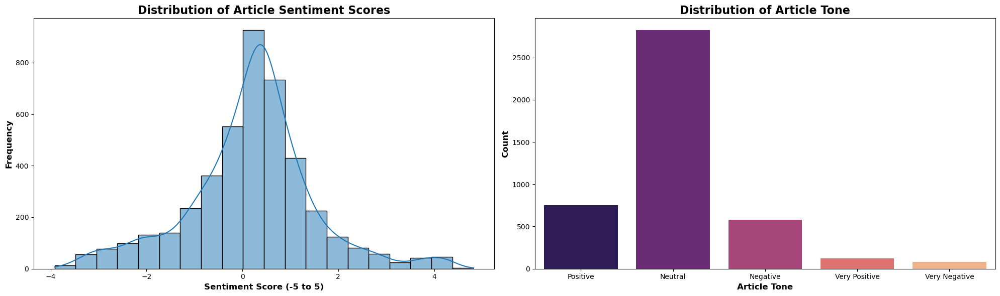

Image saved at: C:\Users\Lenovo\Desktop\DU CIC\SEMESTER 7\SK\Project\image\2) Article Tone\article_tone_distribution.png


In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Read the dataset
df = pd.read_csv('dataset/filtered_article_tone_demo.csv')

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 6))  # 1 row, 2 columns

# Visualization of Sentiment Score Distribution
sns.histplot(df['Sentiment_Score'], bins=20, kde=True, palette='plasma', ax=axs[0])  # Use a bold, vibrant color
axs[0].set_title('Distribution of Article Sentiment Scores', fontsize=16, fontweight='bold')
axs[0].set_xlabel('Sentiment Score (-5 to 5)', fontsize=12, fontweight='bold')
axs[0].set_ylabel('Frequency', fontsize=12, fontweight='bold')

# Visualization of Article Tone Distribution
sns.countplot(data=df, x='Article_Tone', palette='magma', ax=axs[1])  # Use 'magma' color palette for distinct tones
axs[1].set_title('Distribution of Article Tone', fontsize=16, fontweight='bold')
axs[1].set_xlabel('Article Tone', fontsize=12, fontweight='bold')
axs[1].set_ylabel('Count', fontsize=12, fontweight='bold')

# Adjust the layout to avoid overlap
plt.tight_layout()

# Define the directory and make sure it exists
save_directory = r'C:\Users\Lenovo\Desktop\DU CIC\SEMESTER 7\SK\Project\image\2) Article Tone'
if not os.path.exists(save_directory):
    os.makedirs(save_directory)

# Save the figure as a PNG file in the specified directory
save_path = os.path.join(save_directory, 'article_tone_distribution.png')
fig.savefig(save_path)

# Show the plots
plt.show()

print(f"Image saved at: {save_path}")


In [53]:
df.to_csv('dataset/filtered_article_tone_demo.csv', index=False)

print('Data saved to filtered_article_tone_demo.csv')

Data saved to filtered_article_tone_demo.csv


# RUN CODE FROM HERE

# News Type Classification

- **Manual Labeling**: We aim to manually label 5-10% of the articles to create a reliable training dataset. This portion is sufficient to capture the diversity of article types while minimizing the time and resources needed for labeling.

- **Semi-Supervised Learning**: We chose a semi-supervised approach to leverage both labeled and unlabeled data. This method allows us to improve the classification model's performance by:
  - Utilizing the vast amount of unlabeled articles, which enhances the model's understanding of article types.
  - Reducing the dependency on large labeled datasets, which can be time-consuming and costly to produce.

## Labelling 10% of Data

In [1]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.semi_supervised import SelfTrainingClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

In [2]:
# Load CSV file
file_path = 'dataset/filtered_article_tone_demo.csv'  # Change this to your CSV file path
data = pd.read_csv(file_path)

In [3]:
data.shape

(4361, 11)

In [25]:
# Add a new column for News_Type if it doesn't exist
if 'News_Type' not in data.columns:
    data['News_Type'] = None

# No. of article we wants to label
k = 440
    
# Loop through the articles and process them
for i in range(min(k, len(data))):  # Display up to 20 articles
    print(f"Article {i + 1}:")
    print(f"Title: {data.loc[i, 'Title']}\n")
    print(f"Article Text:\n{data.loc[i, 'Article_Text']}\n")
    
    # Instructions for article type classification
    instructions = """
    Please classify the above news article into one of three categories:
    
    1. **News Report**: Objective reporting on recent events, focusing on verified facts without the writer's personal views.
    
    2. **News Analysis**: In-depth examination and interpretation of news events, providing context and explaining significance, while maintaining a degree of objectivity.
    
    3. **Opinion**: Articles reflecting personal views, arguments, or beliefs on current issues, often persuasive and subjective.
    
    Consider the following criteria while classifying:
    - Language objectivity
    - Focus on facts versus interpretation
    - Author's intent
    - Article structure
    """
    
    print(instructions)
    
    # Get user input for article type
    article_type = input("Enter the news type ('News Report', 'News Analysis', 'Opinion'): ")
    
    # Validate input
    while article_type not in ['News Report', 'News Analysis', 'Opinion']:
        print("Invalid input. Please enter either 'News Report', 'News Analysis', 'Opinion'.")
        article_type = input("Enter the news type ('News Report', 'News Analysis', 'Opinion'): ")
    
    # Save the article type back to the DataFrame
    data.loc[i, 'News_Type'] = article_type

Article 1:
Title: In  Xi  Jinping 's  big  year , political  price  of  China 's  pandemic  policy  climbs

Article Text:
In  Xi  Jinping 's  big  year , political  price  of  China 's  pandemic  policy  climbs Protests  bubbling  in  big  cities , dismal  economic  indicators  and  rampant  discontent  online  -- China  's  zero -Covid  policy  is  morphing  from  a  propaganda  victory  to  a  political  liability  for  President  Xi  Jinping  . Hard  lockdowns , mass  testing  and  tight  border  controls  had  for  two  years  batted  back  the  virus  and  led  to  relatively  few  deaths  in  the  world 's  most  populous  nation . While  much  of  the  Western  world  suffered  huge  outbreaks , China 's  "dynamic  zero -Covid " approach  was  upheld  as  an  emblem  of  Xi 's  shrewd  leadership  and  celebrated  during  the  ruling  Communist  Party  's  centenary  last  year . Fawning  television  specials  and  orchestrated  ceremonies  placed  Xi  in  the  foreground  as  a

Enter the news type ('News Report', 'News Analysis', 'Opinion'): Opinion
Article 2:
Title: Cong  to  hold  press  conferences  in  35  cities  over  next  2  days  on  'Democracy  Dis 'qualified '

Article Text:
Cong  to  hold  press  conferences  in  35  cities  over  next  2  days  on  'Democracy  Dis 'qualified ' Upping  the  ante  over  Rahul  Gandhi 's  disqualification  from  Lok  Sabha  , the  Congress  will  hold  press  conferences  in  35  cities  over  the  next  two  days  on  'Democracy  Dis 'Qualified ' while  also  highlighting  other  issues  such  as  the  ani  matter  and  the  alleged  "clean  chit " to  fugitives . Gandhi  was  on  Thursday  sentenced  to  two  years  in  jail  by  a  Surat  court  in  a  2019  criminal  defamation  case  over  his  "why  all  thieves  have  Modi  surname " remark . He  was  subsequently  disqualified  from  Lok  Sabha . "Senior  Congress  leaders  will  address  press  conferences  in  35  cities  on  March  28  and  29  on  'Democ

In [ ]:
# Save updated DataFrame back to CSV
data.to_csv('dataset/filtered_article_type_initial_demo.csv', index=False)
print("Article types have been saved to the CSV file.")

## Semi-Supervised Approach

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from transformers import BertTokenizer, BertModel
from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn.functional as F
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Load your CSV file
file_path = 'dataset/filtered_article_type_initial_demo.csv'  # Change this to your CSV file path
data = pd.read_csv(file_path)

In [3]:
news_type_counts_ini = data['News_Type'].value_counts()
news_type_counts_ini

News_Type
News Report      364
News Analysis     52
Opinion           24
Name: count, dtype: int64

In [4]:
data.head(2)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type
0,THE TIMES OF INDIA,https://timesofindia.indiatimes.com/sports/nfl...,Is Tom Brady 's Influence Pushing Shannon...,Image via Imago All that was about to ...,2023-11-11,sports nfl news tom bradys influence pushing s...,Sports,Football,Is Tom Brady 's Influence Pushing Shannon...,1.108601,Positive,News Analysis
1,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,Biz with over Rs 20 cr turnover to man...,Businesses with turnover of over Rs 20 ...,2022-02-26,news economy policy biz with over turnover man...,Business,Other,Biz with over Rs 20 cr turnover to man...,0.106166,Neutral,News Report


In [5]:
# Encode the manually labeled 'News_Type' to numerical values
data['News_Type'] = data['News_Type'].fillna('NaN')  # Fill NaNs for consistency
label_encoder = LabelEncoder()
data['News_Type_Label'] = label_encoder.fit_transform(data['News_Type'])

# Separate labeled and unlabeled data
labeled_data = data[data['News_Type'] != 'NaN'].copy()
unlabeled_data = data[data['News_Type'] == 'NaN'].copy()

# Split the labeled data into train and test sets
train_labeled_data, test_labeled_data = train_test_split(
    labeled_data, test_size=0.2, random_state=42, stratify=labeled_data['News_Type_Label']
)
X_test, y_test = test_labeled_data['Article_Text'].values, test_labeled_data['News_Type_Label'].values

# Check if GPU is available and set device accordingly
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Tokenizer and model setup
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')
model = model.to(device)  # Move the model to GPU (if available)
model.eval()

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

In [6]:
# Encode texts into BERT embeddings
def encode_texts(texts, tokenizer, model, max_length=512, device='cpu'):
    embeddings = []
    for text in tqdm(texts, desc="Encoding texts"):
        inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=max_length, padding='max_length')
        inputs = {key: value.to(device) for key, value in inputs.items()}
        with torch.no_grad():
            outputs = model(**inputs)
            embeddings.append(outputs.last_hidden_state[:, 0, :].cpu().numpy())
    return np.vstack(embeddings)

In [7]:
# Encode training and test data
X_train_labeled = encode_texts(train_labeled_data['Article_Text'].fillna(''), tokenizer, model, device=device)
y_train_labeled = train_labeled_data['News_Type_Label'].values
X_test_embeddings = encode_texts(X_test, tokenizer, model, device=device)

# Semi-supervised learning with logistic regression
classifier = LogisticRegression(class_weight="balanced", max_iter=1000)

Encoding texts:   0%|                                                                          | 0/352 [00:00<?, ?it/s]C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\transformers\models\bert\modeling_bert.py:440: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(
Encoding texts: 100%|██████████████████████████████████████████████████████████████████| 88/88 [00:04<00:00, 18.43it/s]


In [8]:
# Function to calculate performance metrics and plot confusion matrix
def evaluate_model(classifier, X_test_embeddings, y_test):
    y_pred_test = classifier.predict(X_test_embeddings)
    accuracy = accuracy_score(y_test, y_pred_test)
    precision = precision_score(y_test, y_pred_test, average='weighted')
    recall = recall_score(y_test, y_pred_test, average='weighted')
    f1 = f1_score(y_test, y_pred_test, average='weighted')
    
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")

In [9]:
# Initial model training
classifier.fit(X_train_labeled, y_train_labeled)

LogisticRegression(class_weight='balanced', max_iter=1000)

In [10]:
# Initial evaluation on test data
print("\nInitial Model Performance on Test Set:")
evaluate_model(classifier, X_test_embeddings, y_test)


Initial Model Performance on Test Set:
Accuracy: 0.8068181818181818
Precision: 0.8199179292929294
Recall: 0.8068181818181818
F1 Score: 0.8117179755110789


In [11]:
# Function for iterative semi-supervised labeling
def semi_supervised_labeling(classifier, X_unlabeled, labeled_data, unlabeled_data, threshold=0.8):
    num_iterations = 0
    while len(unlabeled_data) > 0:
        # Predict probabilities for unlabeled data
        probs = classifier.predict_proba(X_unlabeled)
        max_probs = np.max(probs, axis=1)
        high_conf_indices = np.where(max_probs >= threshold)[0]

        # If no high-confidence samples, break loop
        if len(high_conf_indices) == 0:
            print("No high-confidence predictions found. Stopping iteration.")
            break

        # Add high-confidence samples to labeled data
        high_conf_labels = classifier.predict(X_unlabeled[high_conf_indices])
        labeled_data = pd.concat([labeled_data, unlabeled_data.iloc[high_conf_indices].assign(News_Type_Label=high_conf_labels)])
        unlabeled_data = unlabeled_data.drop(unlabeled_data.index[high_conf_indices])
        X_unlabeled = np.delete(X_unlabeled, high_conf_indices, axis=0)
        
        # Remove high-confidence samples from unlabeled data
        print(f"\nIteration {num_iterations + 1}: Added {len(high_conf_indices)} articles.")
        print(f"Remaining unlabeled articles: {len(unlabeled_data)}")

        # Retrain classifier with the expanded labeled dataset
        updated_embeddings = encode_texts(labeled_data['Article_Text'].fillna(''), tokenizer, model, device=device)
        updated_labels = labeled_data['News_Type_Label'].values
        classifier.fit(np.vstack([X_train_labeled, updated_embeddings]), np.hstack([y_train_labeled, updated_labels]))
        
        # Evaluation after each iteration
        print(f"\nModel Performance after Iteration {num_iterations + 1}:")
        evaluate_model(classifier, X_test_embeddings, y_test)
        
        num_iterations += 1

    # Assign remaining unlabeled articles the mode label
    if len(unlabeled_data) > 0:
        most_common_label = labeled_data['News_Type_Label'].mode()[0]
        unlabeled_data['News_Type_Label'] = most_common_label
        print(f"Assigned the mode ({most_common_label}) to {len(unlabeled_data)} remaining articles.")
        labeled_data = pd.concat([labeled_data, unlabeled_data])

    return labeled_data

In [13]:
# Encode unlabeled data
X_unlabeled_embeddings = encode_texts(unlabeled_data['Article_Text'].fillna(''), tokenizer, model, device=device)

# Run semi-supervised labeling with evaluation in each iteration
final_labeled_data = semi_supervised_labeling(classifier, X_unlabeled_embeddings, train_labeled_data, unlabeled_data, threshold=0.8)

Encoding texts: 100%|██████████████████████████████████████████████████████████████| 3921/3921 [03:34<00:00, 18.29it/s]



Iteration 1: Added 2752 articles.
Remaining unlabeled articles: 1169


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 3104/3104 [02:43<00:00, 18.97it/s]



Model Performance after Iteration 1:
Accuracy: 0.8181818181818182
Precision: 0.823051948051948
Recall: 0.8181818181818182
F1 Score: 0.8194444444444445

Iteration 2: Added 613 articles.
Remaining unlabeled articles: 556


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 3717/3717 [03:21<00:00, 18.44it/s]



Model Performance after Iteration 2:
Accuracy: 0.8068181818181818
Precision: 0.8156340187590189
Recall: 0.8068181818181818
F1 Score: 0.8105166914150582

Iteration 3: Added 174 articles.
Remaining unlabeled articles: 382


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 3891/3891 [03:31<00:00, 18.41it/s]



Model Performance after Iteration 3:
Accuracy: 0.8068181818181818
Precision: 0.8156340187590189
Recall: 0.8068181818181818
F1 Score: 0.8105166914150582

Iteration 4: Added 67 articles.
Remaining unlabeled articles: 315


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 3958/3958 [03:37<00:00, 18.21it/s]



Model Performance after Iteration 4:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 5: Added 37 articles.
Remaining unlabeled articles: 278


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 3995/3995 [03:41<00:00, 18.03it/s]



Model Performance after Iteration 5:
Accuracy: 0.7954545454545454
Precision: 0.8080209909595314
Recall: 0.7954545454545454
F1 Score: 0.8013249376885739

Iteration 6: Added 20 articles.
Remaining unlabeled articles: 258


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4015/4015 [03:41<00:00, 18.13it/s]



Model Performance after Iteration 6:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 7: Added 12 articles.
Remaining unlabeled articles: 246


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4027/4027 [03:42<00:00, 18.08it/s]



Model Performance after Iteration 7:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 8: Added 13 articles.
Remaining unlabeled articles: 233


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4040/4040 [03:48<00:00, 17.68it/s]



Model Performance after Iteration 8:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 9: Added 5 articles.
Remaining unlabeled articles: 228


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4045/4045 [03:41<00:00, 18.30it/s]



Model Performance after Iteration 9:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 10: Added 6 articles.
Remaining unlabeled articles: 222


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4051/4051 [03:40<00:00, 18.37it/s]



Model Performance after Iteration 10:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 11: Added 4 articles.
Remaining unlabeled articles: 218


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4055/4055 [03:40<00:00, 18.37it/s]



Model Performance after Iteration 11:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 12: Added 5 articles.
Remaining unlabeled articles: 213


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4060/4060 [03:41<00:00, 18.36it/s]



Model Performance after Iteration 12:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 13: Added 6 articles.
Remaining unlabeled articles: 207


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4066/4066 [03:42<00:00, 18.25it/s]



Model Performance after Iteration 13:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 14: Added 4 articles.
Remaining unlabeled articles: 203


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4070/4070 [03:41<00:00, 18.37it/s]



Model Performance after Iteration 14:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 15: Added 3 articles.
Remaining unlabeled articles: 200


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4073/4073 [03:42<00:00, 18.30it/s]



Model Performance after Iteration 15:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768

Iteration 16: Added 1 articles.
Remaining unlabeled articles: 199


Encoding texts: 100%|██████████████████████████████████████████████████████████████| 4074/4074 [03:42<00:00, 18.33it/s]



Model Performance after Iteration 16:
Accuracy: 0.7954545454545454
Precision: 0.8094475946588623
Recall: 0.7954545454545454
F1 Score: 0.8017676767676768
No high-confidence predictions found. Stopping iteration.
Assigned the mode (2) to 199 remaining articles.


In [14]:
final_labeled_data.tail(2)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label
4328,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,"Analyst Calls : Axis Bank , Coal India , In...",Good morning ! The domestic stock market ...,2020-04-03,markets stocks news analyst calls axis bank co...,Business,Stock Market,"Analyst Calls : Axis Bank , Coal India , In...",0.362415,Neutral,NaN,2
4356,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,FM holds meeting with industry on direct...,NEW DELHI : Finance Minister Nirmala Sitha...,2020-02-10,news economy policy holds meeting with industr...,Economy,Other,FM holds meeting with industry on direct...,-0.149569,Neutral,NaN,2


In [15]:
# Decode labels back to original names for readability
final_labeled_data['News_Type'] = label_encoder.inverse_transform(final_labeled_data['News_Type_Label'])

In [16]:
# Count the occurrences of each category in the 'News_Type' column
news_type_counts = final_labeled_data['News_Type'].value_counts()
news_type_counts

News_Type
News Report      3444
News Analysis     554
Opinion           275
Name: count, dtype: int64

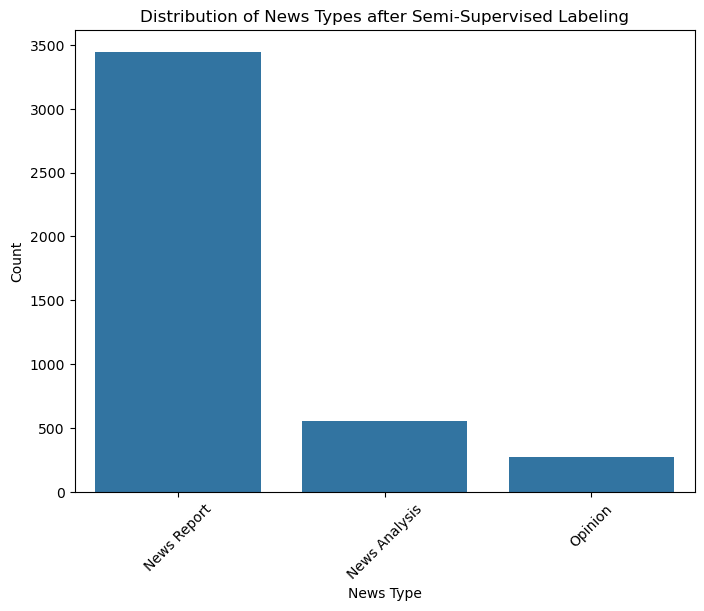

In [17]:
# Plot the distribution of News Types
plt.figure(figsize=(8, 6))
sns.countplot(data=final_labeled_data, x='News_Type', order=final_labeled_data['News_Type'].value_counts().index)
plt.title('Distribution of News Types after Semi-Supervised Labeling')
plt.xlabel('News Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [18]:
# Save the final labeled dataset to CSV
final_labeled_data.to_csv("dataset/filtered_article_type_demo.csv", index=False)
print("Labeled data saved to final_labeled_articles.csv")

Labeled data saved to final_labeled_articles.csv


In [19]:
final_labeled_data.tail(2)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label
4328,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,"Analyst Calls : Axis Bank , Coal India , In...",Good morning ! The domestic stock market ...,2020-04-03,markets stocks news analyst calls axis bank co...,Business,Stock Market,"Analyst Calls : Axis Bank , Coal India , In...",0.362415,Neutral,News Report,2
4356,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,FM holds meeting with industry on direct...,NEW DELHI : Finance Minister Nirmala Sitha...,2020-02-10,news economy policy holds meeting with industr...,Economy,Other,FM holds meeting with industry on direct...,-0.149569,Neutral,News Report,2


# Political Leaning

In [20]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from transformers import BertTokenizer, BertModel
import torch
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

In [21]:
file_path = 'dataset/filtered_article_type_demo.csv'
df = pd.read_csv(file_path)

In [22]:
df.head(1)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label
0,THE ECONOMIC TIMES,https://m.economictimes.com/news/sports/ind-vs...,Ind vs NZ : New Zealand script history w...,New Zealand on Sunday registered a histo...,2021-02-02,news sports ind new zealand script history the...,Sports,Other,Ind vs NZ : New Zealand script history w...,0.641992,Neutral,News Report,2


### Left Leaning Lexicon List

In [23]:
left_leaning_lexicon = [
    "equality", "justice", "progressive", "welfare", "reform", "inclusive", "diversity", "socialism", 
    "redistribution", "solidarity", "equity", "activism", "feminism", "environment", "sustainability", 
    "affordable care", "public healthcare", "public education", "minimum wage", "universal basic income", 
    "labor rights", "social safety net", "social democracy", "equal opportunity", "healthcare for all", 
    "tax fairness", "worker rights", "human rights", "anti-discrimination", "social justice", "antiracism", 
    "anti-poverty", "collective bargaining", "civil rights", "affordable housing", "free college education", 
    "anti-austerity", "public transportation", "income inequality", "LGBTQ rights", "refugee rights", 
    "universal healthcare", "climate change action", "carbon tax", "green economy", "clean energy", 
    "renewable energy", "environmental protection", "progressive taxation", "worker empowerment", 
    "anti-capitalism", "economic justice", "anti-globalization", "anti-imperialism", "anti-war", "anti-fascism", 
    "redistribution of wealth", "abolition rights", "disability rights", "abolitionism", "nationalization", 
    "anti-privatization", "gun control", "universal pension", "police reform", "universal voting rights", 
    "free speech", "criminal justice reform", "wealth gap", "green policies", "fair wages", "immigrant rights", 
    "political correctness", "racial justice", "abolition", "healthcare equity", "workers’ rights", "collective action", 
    "anti-bigotry", "healthcare access", "unionization", "multilateralism", "Medicare for All", "gender equality", 
    "workers’ compensation", "gun violence prevention", "economic democracy", "racial equity", "anti-corporatism", 
    "economic empowerment", "human dignity", "anti-monopoly", "public funding", "disability accessibility", 
    "fair access to education", "anti-deforestation", "public investment", "affordable public services", 
    "economic mobility", "anti-banking system", "green taxes", "paid family leave", "anti-fracking", "national healthcare", 
    "tax progressivity", "political reform", "free college", "public health system", "anti-corporate greed", 
    "abolition of private prisons", "gender inclusion", "migrant rights", "non-discrimination", "anti-racism education", 
    "tax justice", "housing justice", "voting rights", "affordable energy", "investment in public services", 
    "gender diversity", "equal access", "equal treatment", "progressive foreign policy", "carbon emissions", 
    "anti-capitalist feminism", "indigenous rights", "police abolition", "income redistribution", "financial reform", 
    "land rights", "international justice", "free internet", "prison abolition", "nationalized healthcare", 
    "social equity", "opposing gentrification", "pro-immigrant policies", "public utilities", "international solidarity", 
    "anti-colonialism", "political transparency", "free university", "mental health services", "family benefits", 
    "strong unions", "free public transport", "anti-exploitation", "end poverty", "green new deal", "affordable food", 
    "ethical consumption", "radical inclusion", "fair housing", "socialized medicine", "community organizing", 
    "state intervention", "anti-corporate lobbying", "anti-trade deals", "affordable electricity", "end hunger", 
    "rights of workers", "gun reform", "childcare accessibility", "disability justice", "anti-extractionism", 
    "gender-neutral policies", "anti-imperialist education", "women’s empowerment", "human rights education", 
    "public transportation investment", "public infrastructure", "equal justice under law", "anti-union busting", 
    "human rights violations", "humanitarian aid", "climate justice", "economic redistribution", "paid parental leave", 
    "gender-based violence prevention", "workers’ rights to organize", "immigration sanctuary", "cultural diversity", 
    "economic diversification", "equal access to resources", "anti-fascist resistance", "affordable transportation", 
    "anti-war movements", "transgender rights", "anti-privatization movements", "democratic socialism", 
    "public-sector unions", "anti-corporate corruption", "right to health", "community-led development", 
    "abolition of class divisions", "renewable resources", "protection of public spaces", "workers' collective", 
    "pro-immigrant", "pro-environment", "anti-militarism", "global solidarity", "free public healthcare", 
    "pro-union", "reproductive justice", "democracy promotion", "anti-unfair trade", "end wage disparity", 
    "dismantle corporate monopolies", "environmental justice", "global wealth tax", "public goods", "anti-eviction", 
    "educational equity", "community organizing", "public interest", "welfare state", "voting reform", "community engagement", 
    "class struggle", "pro-labor", "anti-fascist activism"
]

### Centrist/Neutral Lexicon List

In [24]:
centrist_lexicon = [
    "bipartisan", "compromise", "pragmatic", "middle ground", "consensus", "balanced policy", "moderation", 
    "collaboration", "harmony", "independent", "neutral", "unity", "objective", "open-minded", "cooperation", 
    "nonpartisan", "common ground", "practical solutions", "realism", "reasonable", "flexibility", "rational", 
    "open dialogue", "common sense", "civic engagement", "moderate", "pragmatism", "peace", "equitable", 
    "stable government", "long-term solutions", "pluralism", "functionalism", "gradual change", "policy balance", 
    "centrist reforms", "social harmony", "united governance", "inclusive policy", "calm approach", "practical politics", 
    "policy implementation", "unifying agenda", "cross-party cooperation", "gradual progress", "public consensus", 
    "governance reforms", "citizen-driven", "cooperative governance", "public-private partnerships", "peaceful resolution", 
    "national unity", "national interest", "democratic participation", "policy collaboration", "center-ground solutions", 
    "realpolitik", "legislative compromise", "public unity", "inclusive governance", "equitable reforms", 
    "national development", "independent voices", "policy negotiations", "open debate", "social responsibility", 
    "policy continuity", "grassroots participation", "incremental change", "fair governance", "strategic planning", 
    "socio-economic growth", "equal participation", "moderate politics", "inclusive progress", "balanced growth", 
    "mutual understanding", "economic stability", "cooperative politics", "unity in diversity", "positive governance", 
    "international relations", "policy transparency", "public trust", "economic cooperation", "moderate social reforms", 
    "peaceful coexistence", "regional balance", "policy inclusiveness", "right to dissent", "equitable development", 
    "sustainable growth", "centrist policy agenda", "international diplomacy", "non-confrontational", "constructive debate", 
    "social equilibrium", "collaborative governance", "open policy discussions", "civic responsibility", "sustainable policies", 
    "grassroots collaboration", "balanced democracy", "deliberative democracy", "mutual benefit", "reliable leadership", 
    "legislative process", "governance based on consensus", "fair electoral system", "pragmatic approach", "stable society", 
    "moderate taxation", "eclectic approach", "cohesive society", "comprehensive governance", "community participation", 
    "rational policies", "equal rights for all", "balanced economic policies", "inclusive development", "political moderation", 
    "policy continuity", "constitutional values", "moderate reforms", "equitable solutions", "strategic compromises", 
    "equality of opportunity", "fairness in governance", "economic pragmatism", "democratic reforms", "peaceful transitions", 
    "non-violent change", "comprehensive solutions", "moderate ideologies", "collaborative political agenda", "responsible governance", 
    "policy transparency", "institutional integrity", "just reforms", "economic compromise", "stable policy framework"
]

### Right Leaning Lexicon List

In [25]:
right_leaning_lexicon = [
    "nationalism", "patriotism", "security", "sovereignty", "tradition", "culture", "heritage", "values", "order", 
    "capitalism", "market economy", "privatization", "economic growth", "self-reliance", "individualism", "freedom", 
    "law and order", "family values", "fiscal conservatism", "economic liberalization", "entrepreneurship", "tax cuts", 
    "national pride", "strong defense", "self-sufficiency", "immigration control", "free market", "social order", 
    "national security", "capitalist", "nationalist", "privatization of services", "free trade", "economic liberalism", 
    "entrepreneurial spirit", "free enterprise", "business-friendly policies", "traditional family", "patriotic", "cultural pride", 
    "religious freedom", "protecting traditions", "economic competitiveness", "law and justice", "strong military", "conservative values", 
    "national integrity", "domestic security", "traditional values", "entrepreneurial freedom", "privatize", "deregulation", 
    "law and justice reform", "self-defense", "policing", "free market economy", "democratic conservatism", "national unity", 
    "corporate tax reduction", "defense spending", "political conservatism", "family-first policies", "market-driven economy", 
    "self-governance", "small government", "law enforcement", "patriotic values", "limited government", "security-first", 
    "strong borders", "Hindu nationalism", "economic development", "business empowerment", "opposing communism", 
    "political stability", "national pride", "cultural nationalism", "anti-terrorism", "military preparedness", "capitalist reforms", 
    "secure borders", "anti-communism", "family-focused", "religion in politics", "traditional institutions", "anti-secularism", 
    "nation first", "cultural identity", "economic empowerment", "pro-business", "military strength", "pro-Hindu policies", 
    "unilateral decisions", "state sovereignty", "anti-leftist", "defense reform", "capitalist economy", "tax incentives", 
    "trade protectionism", "economic conservatism", "empowering the market", "immigration reform", "defensive nationalism", 
    "right-wing", "militant nationalism", "conservative policies", "limited government intervention", "market reforms", 
    "strategic autonomy", "promoting domestic industries", "patriotic duty", "strong central government", "pro-privatization", 
    "law and order policies", "defending cultural heritage", "nationalistic policies", "capitalist growth", "anti-communist", 
    "secularism in decline", "national integration", "opposing welfare state", "defense of national interests", "self-governance", 
    "opposing foreign influence", "anti-globalization", "empowering private sector", "conservative economics", "anti-terrorism policies", 
    "national cohesion", "civilizational nationalism", "pro-business reforms", "free enterprise system", "political conservatism", 
    "strong national defense", "economic freedom", "religious identity", "political sovereignty", "anti-leftist agenda", 
    "right-wing populism", "patriotic spirit", "welfare reform", "pro-national security", "traditional leadership", "nationalistic identity", 
    "anti-multiculturalism", "economic nationalism", "cultural conservatism", "strong political leadership", "self-determination", 
    "sovereign control", "defending national values", "anti-foreign interference", "political stability", "self-rule", 
    "national government", "anti-socialism", "economic protectionism", "cultural preservation", "family-centered policies", 
    "national autonomy", "limited welfare", "strong political institutions", "economic individualism", "traditional society"
]

In [26]:
# Create a set to track the words that have already appeared
seen = set()

# Function to remove duplicates from a single list
def remove_duplicates_from_list(lexicon_list):
    return [word for word in lexicon_list if not (word in seen or seen.add(word))]

# Remove duplicates within each list while checking across the lists
left_leaning_lexicon = remove_duplicates_from_list(left_leaning_lexicon)
centrist_lexicon = remove_duplicates_from_list(centrist_lexicon)
right_leaning_lexicon = remove_duplicates_from_list(right_leaning_lexicon)

In [27]:
# TF-IDF Calculation for Lexicon Weighting
tfidf_vectorizer = TfidfVectorizer(vocabulary=left_leaning_lexicon + right_leaning_lexicon + centrist_lexicon)
tfidf_matrix = tfidf_vectorizer.fit_transform(df['Article_Text']).toarray()

# Average TF-IDF score for each lexicon category
def calculate_tfidf_scores(text):
    tfidf_vector = tfidf_vectorizer.transform([text]).toarray()[0]
    left_score = np.sum([tfidf_vector[i] for i, word in enumerate(tfidf_vectorizer.get_feature_names_out()) if word in left_leaning_lexicon])
    right_score = np.sum([tfidf_vector[i] for i, word in enumerate(tfidf_vectorizer.get_feature_names_out()) if word in right_leaning_lexicon])
    centrist_score = np.sum([tfidf_vector[i] for i, word in enumerate(tfidf_vectorizer.get_feature_names_out()) if word in centrist_lexicon])
    return left_score, right_score, centrist_score

C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\sklearn\feature_extraction\text.py:1364: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  warnings.warn(


In [28]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Embedding Model Setup for Contextual Similarity
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased').to(device)

# Generate embeddings for each lexicon category
def get_lexicon_embedding(lexicon):
    # Tokenize and move tokens to the same device
    tokens = tokenizer(" ".join(lexicon), return_tensors="pt", padding=True, truncation=True, max_length=512).to(device)
    outputs = model(**tokens)
    return outputs.last_hidden_state.mean(dim=1).detach()

left_embedding = get_lexicon_embedding(left_leaning_lexicon)
right_embedding = get_lexicon_embedding(right_leaning_lexicon)
centrist_embedding = get_lexicon_embedding(centrist_lexicon)

In [29]:
# Combined Scoring Function with Contextual Embeddings and TF-IDF
def compute_political_leaning(text):
    # TF-IDF scores
    left_score_tfidf, right_score_tfidf, centrist_score_tfidf = calculate_tfidf_scores(text)
    
    # Get article embedding
    tokens = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=512).to(device)
    outputs = model(**tokens)
    article_embedding = outputs.last_hidden_state.mean(dim=1).detach()
    
    # Contextual similarity scores
    left_similarity = cosine_similarity(article_embedding.cpu(), left_embedding.cpu())[0][0]
    right_similarity = cosine_similarity(article_embedding.cpu(), right_embedding.cpu())[0][0]
    centrist_similarity = cosine_similarity(article_embedding.cpu(), centrist_embedding.cpu())[0][0]
    
    # Combine scores
    left_score = left_score_tfidf + left_similarity
    right_score = right_score_tfidf + right_similarity
    centrist_score = centrist_score_tfidf + centrist_similarity

    # Determine political leaning based on the highest score
    if left_score > right_score and left_score > centrist_score:
        return "Left-leaning"
    elif right_score > left_score and right_score > centrist_score:
        return "Right-leaning"
    else:
        return "Centrist/Neutral"

In [30]:
tqdm.pandas()

# Apply the function to your dataset
df['Political_Leaning'] = df['Article_Text'].progress_apply(compute_political_leaning)

100%|██████████████████████████████████████████████████████████████████████████████| 4273/4273 [04:31<00:00, 15.76it/s]


In [31]:
df.tail(3)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label,Political_Leaning
4270,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/poli...,SC refuses to entertain plea on improvin...,NEW DELHI : The Supreme Court Thursday re...,2020-06-18,news politics and nation refuses entertain ple...,Politics,Policy & Governance,SC refuses to entertain plea on improvin...,-0.223533,Neutral,News Report,2,Left-leaning
4271,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,"Analyst Calls : Axis Bank , Coal India , In...",Good morning ! The domestic stock market ...,2020-04-03,markets stocks news analyst calls axis bank co...,Business,Stock Market,"Analyst Calls : Axis Bank , Coal India , In...",0.362415,Neutral,News Report,2,Left-leaning
4272,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,FM holds meeting with industry on direct...,NEW DELHI : Finance Minister Nirmala Sitha...,2020-02-10,news economy policy holds meeting with industr...,Economy,Other,FM holds meeting with industry on direct...,-0.149569,Neutral,News Report,2,Left-leaning


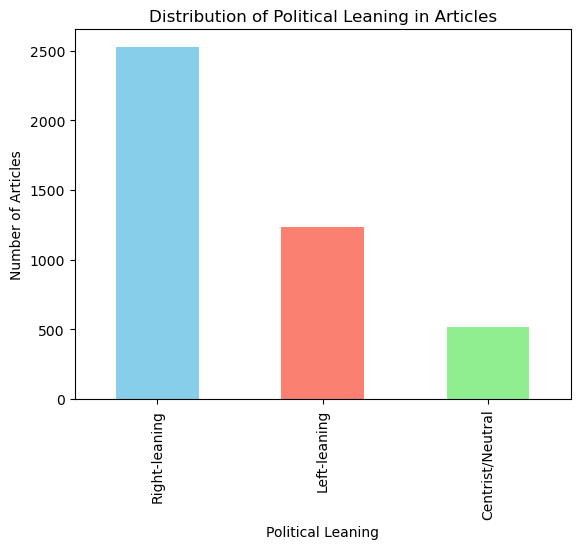

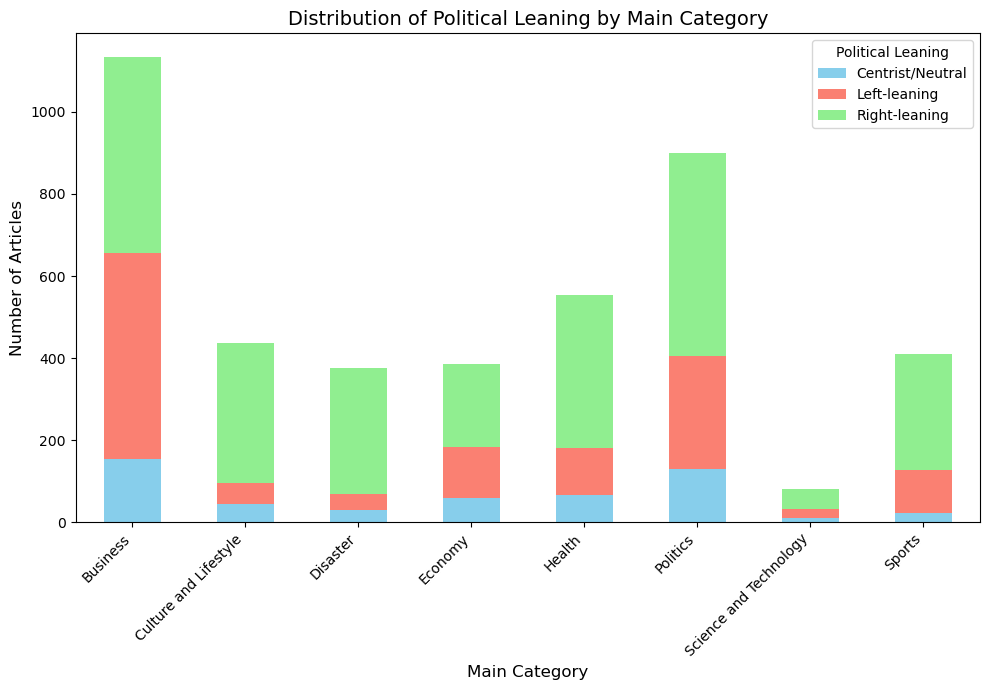

In [32]:
# Plot the distribution of political leanings
df['Political_Leaning'].value_counts().plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen'])
plt.title("Distribution of Political Leaning in Articles")
plt.xlabel("Political Leaning")
plt.ylabel("Number of Articles")

# Group by 'Main Category' and 'Political_Leaning', then count occurrences
category_leaning_counts = df.groupby(['Main Category', 'Political_Leaning']).size().unstack(fill_value=0)

# Plotting the results
category_leaning_counts.plot(kind='bar', stacked=True, color=['skyblue', 'salmon', 'lightgreen'], figsize=(10, 7))

# Add titles and labels
plt.title("Distribution of Political Leaning by Main Category", fontsize=14)
plt.xlabel("Main Category", fontsize=12)
plt.ylabel("Number of Articles", fontsize=12)
plt.xticks(rotation=45, ha="right")  # Rotate x labels for better readability
plt.legend(title='Political Leaning', loc='upper right')

# Show the plot
plt.tight_layout()
plt.show()

In [33]:
# Save to CSV
df.to_csv("dataset/articles_with_political_leaning.csv", index=False)
print("Labeled data saved to articles_with_political_leaning.csv")

Labeled data saved to articles_with_political_leaning.csv


# Bias/Non-Bias Classification

### Labelling 20% of Data

In [4]:
import pandas as pd
import numpy as np
import os
import random

In [2]:
# Load CSV file
file_path = 'dataset/articles_with_political_leaning.csv'  # Change this to your CSV file path
data = pd.read_csv(file_path)
print(data.shape)

(4273, 14)


In [7]:
# Add a new column for bias labeling if it doesn't exist
if 'Bias_Label' not in data.columns:
    data['Bias_Label'] = None

# No. of articles we want to label (adjust as needed)
k = 900

# Randomly shuffle the article indices
article_indices = list(range(len(data)))
random.shuffle(article_indices)

# Loop through the random article indices and process them
for i in range(min(k, len(data))):  # Display up to k articles
    # Select a random article index
    random_index = article_indices[i]
    
    # Display article title and content for labeling
    print(f"Article {i + 1}:")
    print(f"Title: {data.loc[random_index, 'Title']}\n")
    print(f"Article Text:\n{data.loc[random_index, 'Article_Text']}\n")
    
    # Instructions for bias classification
    instructions = """
    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles that present information in a way that favors a particular viewpoint, often by selective reporting, emotional language, or presenting one side disproportionately. 
    - Look for subjective language, one-sided arguments, and any manipulation of facts to support a particular agenda.

    2. **Unbiased**: Articles that provide a balanced and neutral view of the topic, presenting facts fairly and covering multiple perspectives without favoring one over the other.
    - Look for neutral language, balanced perspectives, and factual reporting without emotional appeals or manipulation.

    Consider the following criteria while classifying:
    - Tone of the article (Is it emotionally charged or neutral?)
    - Language used (Are there loaded words that suggest bias?)
    - Selection of sources (Are multiple viewpoints presented?)
    - Overall balance and fairness in presenting information
    """
    
    print(instructions)
    
    # Get user input for bias classification
    bias_label = input("Enter the bias label ('Biased' or 'Unbiased'): ")
    
    # Validate input
    while bias_label not in ['Biased', 'Unbiased']:
        print("Invalid input. Please enter either 'Biased' or 'Unbiased'.")
        bias_label = input("Enter the bias label ('Biased' or 'Unbiased'): ")
    
    # Save the bias label back to the DataFrame
    data.loc[random_index, 'Bias_Label'] = bias_label
    
    # Optionally, display a confirmation message before moving on to the next article
    print("Article classified. Moving to the next one...\n")

Article 1:
Title: Covid -19  recovery  rate  rises  to  65 .44 %, case  fatality  rate  drops  further  to  2 .13 %

Article Text:
Covid -19  recovery  rate  rises  to  65 .44 %, case  fatality  rate  drops  further  to  2 .13 % NEW  DELHI : Recoveries  among  COVID -19  patients  in  India  crossed  the  11  lakh -mark  on  Sunday  with  over  51 ,000  patients  recuperating  in  a  24 -hour  span , the  highest  recorded  so  far , pushing  the  recovery  rate  to  65 .44  per  cent , the  Union  health  ministry  said  on  Sunday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  There  are  5 ,67 ,730  active  cases  of  the  coronavirus  infection , which  is  the  "actual  caseload " of  COVID -19  for  the  country  presently  and  account  for  32 .43  per  cent  of  the  total  cases , it  said . All  active  cases  are  under  medical  supervision  e

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 3:
Title: Monkeypox  cases  top  5 ,000 : WHO

Article Text:
Monkeypox  cases  top  5 ,000 : WHO The  World  Health  Organization  said  on  Tuesday  that  5 ,322  laboratory -confirmed  cases  of  monkeypox  had  been  reported  to  it  in  the  current  outbreak , 85 % of  which  are  in  Europe  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Though  case  numbers  are  rapidly  increasing , the  United  Nations  health  agency  has  not  set  a  date  for  its  emergency  committee  on  monkeypox  to  convene  for  a  second  meeting . "From  January  1  to  June  30  this  year , we  have  5 ,322  laboratory -confirmed  cases  and  one  death ," WHO  spokeswoman  Fadela  Chaib  told  reporters  in  Geneva . The  number  has  increased  by  56 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 5:
Title: KCR : Youth  should  take  inspiration  from  Ilamma

Article Text:
KCR : Youth  should  take  inspiration  from  Ilamma Hyderabad : Remembering  Chityala  (Chakali ) Ilamma  s  sacrifices  on  the  occasion  of  official  celebrations  of  her  birth  anniversary  by  the  state  government , chief  minister  K  Chandrasekhar  Rao  said  the  current  generation  should  take  inspiration  from  her  bravery  and  dynamism  during  Telangana  armed  struggle . The  CM  hailed  Ilamma  as  a  democratic  activist  who  fought  legal  battles  in  courts  for  the  realisation  of  her  rights  and  was  a  symbol  of  self -respect  for  the  backward  communities . Ilammas  inspiration  is  very  much  embodied  in  the  achievement  of  Telangana  and  the  subsequent  development  of  the  new  state , he  said . The  governm -ent  is  organising  Ilammas  birth  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 7:
Title: More  investment  in  clean  energy  will  help  APAC  recover  from  COVID -19  crisis : ADB

Article Text:
More  investment  in  clean  energy  will  help  APAC  recover  from  COVID -19  crisis : ADB A  greater  investment  in  clean  energy  will  contribute  to  Asia -Pacific 's  recovery  from  the  COVID -19  crisis  and  make  economies  more  resilient  against  future  shocks , the  Asian  Development  Bank  (ADB ) said  on  Tuesday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  In  view  of  the  current  scenario , ADB  has  invited  proposals  for  digital  solutions  to  improve  waste  management , reduce  the  amount  of  material  sent  to  landfills , and  increase  sustainability  in  order  to  create  more  resilient

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 8:
Title: Realtor  M  3M  secures  Rs  1 ,500  crore  from  PAG  Credit  & Markets

Article Text:
Realtor  M  3M  secures  Rs  1 ,500  crore  from  PAG  Credit  & Markets Realty  developer  M  3M  has  secured  a  Rs  1 ,500 -crore  (about  $200  million ) debt  facility  from  alternative  investment  firm  PAG  Credit  & Markets  to  fund  its  portfolio  growth , two  people  aware  of  the  development  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "As  per  the  deal , the  money  will  come  in  four  tranches  of  Rs  600  crore , Rs  300  crore , Rs  250  crore  and  Rs  350  crore  and  be  paid  back  within  18  months ," said  one  of  the  people  cited  earlier . The  company  is  also  eyeing  more  acquisitions , so  money  w

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 9:
Title: A  story  from  the  Mahabharata  comes  alive  on  stage  at  Lucknow  University

Article Text:
A  story  from  the  Mahabharata  comes  alive  on  stage  at  Lucknow  University (L -R ) Bakul  Thakkar , Amit  Behl  and  Lubna  Salim  in  the  play  Paansa  (BCCL / itya  Yadav ) The  Arts  Quadrangle  at  the  Lucknow  University  held  an  air  of  festivity  as  a  former  student  and  renowned  theatre  and  film  personality  Salim  Arif  staged  his  play  Paansa  there  during  the  Centennial  celebrations  of  the  institution . A  scene  from  the  play  (BCCL / itya  Yadav ) A  scene  from  the  play  (BCCL / itya  Yadav ) More  than  40  artiste , including  Arif 's  better  half , popular  actress  Lubna  Salim  as  Draupadi , well -known  actors  Amit  Behl  as  Yudhishthir  and  Bakul  Thakkar  as  the  Yaksha , enacted  the  play  that  has  been  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 12:
Title: At  1 ,192 , number  of  pleas  filed  in  SAT  up  53 % this  fiscal

Article Text:
At  1 ,192 , number  of  pleas  filed  in  SAT  up  53 % this  fiscal ET  Intelligence  Group  : A  record  number  of  1 ,192  appeals  were  filed  before  the  Securities  Appellate  Tribunal  ( SAT  ) during  the  year  - up  53 % over  the  previous  year  revealed  the  regulator 's  FY  23  annual  report  released  on  Monday . This  increase  in  appeals  filed  is  directly  proportional  to  the  increase  in  Sebi 's  regulatory  action . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  During  FY  23 , Sebi  undertook  144  investigations  compared  to  59  in  the  previous  year . It  completed  adjudication  proceedings  against  3731  entit

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 14:
Title: MPPSC  prelims  scorecard  2021  released ; Here 's  how  to  check

Article Text:
MPPSC  prelims  scorecard  2021  released ; Here 's  how  to  check Madhya  Pradesh  Public  Service  Commission  released  the  prelims  scorecards  for  MPPSC  State  Service  Preliminary  and  State  Forest  Service  Examinations  2021  on  August  8 , 2022 . Candidates  can  download  the  scorecard  from  the  official  website  - mppsc .mp .gov .in  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  In  order  to  download  the  score  card , candidates  need  their  login  credentials  i .e . roll  number  and  date  of  birth . Candidates  can  also  check  their  OMR  sheets  after  paying  Rs  50 . It  will  help  in  cross -checking  the  answers  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 17:
Title: Bernstein  initiates  coverage  on  retail  and  restaurant  stocks

Article Text:
Bernstein  initiates  coverage  on  retail  and  restaurant  stocks Brokerage  Bernstein  has  initiated  coverage  on  seven  retail  and  restaurant  companies  Avenue  Supermarts  , Trent  , itya  Birla  Fashion  & Retail , Jubilant  FoodWorks , Westlife  Foodworld  , Devyani  International  and  Sapphire  Foods  India  . The  firm  has  outperform  rating  on  Avenue  Supermarts , Trent , Jubilant  FoodWorks  and  Devyani  and  underweight  on  itya  Birla  and  Westlife  World . Bernstein  said  that  as  organised  retailers  scale  up , tremendous  value  creation  opportunities  can  be  accessed  currently  by  unlocking  demand  beyond  the  top  40  cities  and  the  top  10 % of  the  pyramid  of  the  Indian  middle -class  market . Agencies  While  we  are  optimistic  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 19:
Title: Significant  percentage  of  organisations  see  AI  as  key  to  competitive  advantage : Report

Article Text:
Significant  percentage  of  organisations  see  AI  as  key  to  competitive  advantage : Report New  Delhi : A  significant  percentage  of  organisations  see  Artificial  Intelligence  as  key  to  competitive  advantage  and  said  they  have  experienced  a  notable  boost  in  productivity  through  AI  integration , according  to  a  new  report . According  to  the  "Industry  5 .0  and  AI  report ", compiled  by  BML  Munjal  University , 44  pc  of  organisations  have  experienced  a  significant  boost  in  productivity  through  AI  integration . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  ditionally , 21  pc 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 20:
Title: Zydus  gets  nod  for  liver  disease  drug

Article Text:
Zydus  gets  nod  for  liver  disease  drug Mumbai : Ahmedabad -based  Zydus  Cadila  announced  that  the  Drug  Controller  General  of  India  ( DCGI  ) has  approved  its  new  drug  application  of  Saroglitazar  for  the  treatment  of  non -cirrhotic  non -alcoholic  steatohepatitis  (NASH ). It  is  a  large  unmet  medical  need  as  there  is  currently  no  approved  drug  for  NASH  globally , a  disease  that  is  highly  prevalent  with  10 -30 % of  the  global  population  being  affected , a  company  statement  said . Saroglitazar  was  launched  in  India  in  September  2013 , for  the  treatment  of  diabetic  dyslipidemia  and  hypertriglyceridemia  in  patients  with  type -2  diabetes  not  controlled  by  statins  alone . NASH  is  a  progressive  disease  of  the  liver , which  sta

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 23:
Title: Its  important  to  understand  that  no  matter  how  you  look , we  are  all  equal : Abhinav

Article Text:
Its  important  to  understand  that  no  matter  how  you  look , we  are  all  equal : Abhinav The  #BlackLivesMatter  a  campaign  that  was  revived  after  the  killing  of  African -American  George  Floyd  in  the  US  has  gotten  people  all  over  the  world  together , demanding  equal  rights  for  everybody . Closer  home , cricketer  Dodda  Ganesh  recently  shared  fellow  sportsman  Abhinav  Mukund  s  post  on  being  subjected  to  racist  remarks , which  he  first  put  out  a  few  years  ago . I  always  endured  it  as  a  young  cricketer  growing  up  in  a  society  obsessed  with  fairness , reveals  Abhinav , who  became  the  second  cricketer  from  Tamil  Nadu  to  complete  10 ,000  runs  in  Ranji  Trophy  in  February . Pe

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 26:
Title: Major  fire  breaks  out  at  a  powerloom  unit , no  casualty

Article Text:
Major  fire  breaks  out  at  a  powerloom  unit , no  casualty Six  fire  tenders  from  Varachha  and  Kapodara  were  rushed  to  the  industrial  estate  on  Monday  afternoon  SURAT : A  major  fire  broke  out  at  the  powerloom  unit  located  at  Ashwani  Kumar  Road  on  Monday  afternoon . No  casualty  was  reported . Sources  in  the  fire  and  emergency  department  of  Surat  Municipal  Corporation  (SMC ) said  that  the  fire  broke  out  at  about  2 .45pm  at  four -storey  Vasundhara  industries  located  on  plot  number  1 -8  at  Ashwani  Kumar  Road . The  fire  broke  out  on  the  ground  floor  due  to  short  circuit  in  the  electric  metre  box . Sources  said  that  about  six  fire  tenders  from  Varachha  and  Kapodara  were  rushed  to  the  industrial  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 28:
Title: Committed  to  protect  Indian  national  Kulbhushan  Jadhav 's  life : MEA

Article Text:
Committed  to  protect  Indian  national  Kulbhushan  Jadhav 's  life : MEA New  Delhi : India  on  Thursday  said  it  was  committed  to  protecting  the  life  of  Indian  death  row  convict  Kulbhushan  Jadhav  amid  reports  that  the  Islamabad  High  Court  has  constituted  a  two -member  bench  to  hear  a  review  petition  in  his  case . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "We  stand  committed  to  protect  the  life  of  Indian  national  Kulbhushan  Jadhav ," external  affairs  ministry  spokesperson  Anurag  Srivastava  said  at  an  online  media  briefing . He  was  replying  to  a  batch  of  questions  relating  to  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 30:
Title: One -day  trip  to  Kodangal  saved  this  family  of  five  from  deadly  inferno

Article Text:
One -day  trip  to  Kodangal  saved  this  family  of  five  from  deadly  inferno Mohammed  Irfan  and  family . (Right ) People  walk  through  the  road , which  has  now  been  covered  in  mud  HYDERABAD : While  a  vacation  at  her  parents  home  proved  fatal  for  35 -year -old  Tahura  Farheen  and  her  family  - all  of  whom  had  perished  in  Monday 's  raging  fire  - a  one -day  trip  to  Kodangal  has  saved  Mohammed  Irfan  and  his  family  from  the  tragedy . His  family  of  five , including  a  four -month -old  baby , had  left  from  their  third -floor  home  in  Balaji  Residence , on  Sunday , as  Irfan  had  to  oversee  the  arrangements  for  his  younger  brother 's  wedding  being  held  at  Kodangal , on  November  16 . The  family 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 32:
Title: Rain , Hailstorm  Send  Many  Scurrying  For  Cover ; Orange  Alert  On  Sun  & Tue

Article Text:
Rain , Hailstorm  Send  Many  Scurrying  For  Cover ; Orange  Alert  On  Sun  & Tue Nagpur : A  sudden  shower , accompanied  by  hailstorm  for  around  an  hour  on  Saturday  afternoon  in  the  midst  of  summer  heat  left  a  trail  of  destruction  in  many  areas  of  the  city . Strong  winds  uprooted  over  16  trees  while  hailsstrom  lashed  a  few  localities  in  west  and  north  Nagpur . Water  logging  was  reported  in  east  Nagpur , especially  Kalamna  area . No  casualties  were  reported , said  officiating  chief  fire  officer  BP  Chandankhede , adding  vehicular  traffic  and  power  supply  were  affected  in  many  areas . The  department  is  yet  to  assess  the  loss  of  properties  due  to  the  thunderstorm  , he  added . The  India

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 34:
Title: Former  Vidhan  Sabha  Speaker  sits  on  fast , demands  construction  of  Lamgara  Tehsil

Article Text:
Former  Vidhan  Sabha  Speaker  sits  on  fast , demands  construction  of  Lamgara  Tehsil Almora : Former  legislative  assembly  Speaker  and  Jageshwar  MLA  Govind  Singh  Kunjwal  sat  on  a  24 -hour -long  hunger  strike  on  Monday  morning  at  Ramlila  Maidan  in  Lamgara  block  headquarters  of  Almora  district . He  said  that  even  after  four  years  of  coming  to  office , the  BJP  government  has  not  paid  any  attention  to  the  construction  of  Lamgara  Tehsil  and  the  government  college  building . It  is  worth  mentioning  that  the  approval  was  given  for  the  Lamgara  Tehsil  and  the  government  college  during  the  Harish  Rawat -led  Congress  government . However , the  projects  could  not  take  off  due  to  the 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 37:
Title: Govt  likely  to  hike  rural  job  scheme  spend  by  25 ,000  crore

Article Text:
Govt  likely  to  hike  rural  job  scheme  spend  by  25 ,000  crore The  government  is  likely  to  enhance  annual  expenditure  under  the  rural  employment  guarantee  scheme  by  over  25 ,000  crore  as  the  outgo  has  exceeded  70 % of  the  budgeted  allocation  in  the  first  four  and  a  half  months  of  the  fiscal  year . A  large  chunk  of  distressed  labour  from  urban  India  has  continued  to  seek  work  under  the  Mahatma  Gandhi  National  Rural  Employment  Guarantee  Scheme  ( MGNREGS  ). US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Data  show  the  expenditure  under  the  scheme  stood  at  52 ,572 .29  crore  on  Aug

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 39:
Title: Happy  Karwa  Chauth  2024 : Top  50  Wishes , Messages , and  Quotes  to  Share  with  Your  Family  and  Friends

Article Text:
Happy  Karwa  Chauth  2024 : Top  50  Wishes , Messages , and  Quotes  to  Share  with  Your  Family  and  Friends Karwa  Chauth  is  an  auspicious  Hindu  festival  celebrated  by  married  couples , praying  for  the  long  lives  of  their  spouse . In  India , it  is  observed  with  great  love  and  enthusiasm . This  year , Karwa  Chauth  falls  on  Sunday , October  20 . The  Puja  Muhurat  is  from  5 :46  PM  to  7 :02  PM , while  the  vrat  (fast ) lasts  for  13  hours  and  29  minutes . According  to  the  Drik  Panchang , Upasana  time  begins  at  6 :25  AM  and  ends  at  7 :54  PM . On  this  special  occasion , married  women  observe  a  nirjala  vrat , refraining  from  both  food  and  water , from  sunrise  until 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 40:
Title: Maruti  ready  for  tomorrow  with  a  million  more  vehicles

Article Text:
Maruti  ready  for  tomorrow  with  a  million  more  vehicles New  Delhi : The  country 's  largest  automaker  , Maruti  Suzuki  , said  it  will  set  up  an  additional  production  capacity  of  1  million  units  to  meet  increasing  demand  for  its  cars  and  sport  utility  vehicles  in  the  local  market  and  abroad . The  company  - which  fell  short  of  attaining  the  2  million  annual  sales  milestone  by  around  34 ,000  units  in  the  last  financial  year  - said  with  a  slew  of  new  launches  planned  in  the  fast -growing  SUV  segment , it  expects  to  outperform  industry  growth  of  5 -7 % projected  for  the  ongoing  financial  year . The  automaker , which  on  Wednesday  exceeded  market  expectations  by  reporting  a  43 % increase  in  standalo

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 42:
Title: Patrick  Mahomes  and  Brittany  skip  Taylor  Swifts  concert  for  annual  Kansas  City  tradition  while  Travis  Kelce  misses  Eras  Tour

Article Text:
Patrick  Mahomes  and  Brittany  skip  Taylor  Swifts  concert  for  annual  Kansas  City  tradition  while  Travis  Kelce  misses  Eras  Tour Patrick  Mahomes  and  Brittany  skip  Taylor  Swifts  concert  for  Annual  Kansas  City  tradition  while  Travis  Kelce  misses  Eras  Tour  In  Kansas  City  , high  school  football  games  are  a  beloved  tradition , drawing  NFL  stars  to  the  sidelines  for  a  taste  of  community  spirit . Recently , Patrick  Mahomes  and  his  wife  Brittany  took  a  break  from  their  busy  schedules  to  enjoy  a  game  at  Blue  Valley , cheering  on  the  sons  of  fellow  coaches . However , amidst  the  excitement , the  notable  absence  of  Travis  Kelce  turned  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 44:
Title: Correction  to  slope  at  Malpe  after  landslide  to  cost  Rs  7cr

Article Text:
Correction  to  slope  at  Malpe  after  landslide  to  cost  Rs  7cr Panaji : TheNorth  Goa  collector  has  invoked  special  provisions  of  the  Disaster  Management  Act  to  procure  additional  land  to  correct  the  slope  along  the  newly  constructed  Malpe -Pernem  highway , which  has  been  shut  for  traffic  since  July  7  following  a  landslide . Work  towards  this  end  is  estimated  to  cost  Rs  7  crore . The  ministry  of  road  transport  and  highways  had  earlier  said  that  the  road  would  be  opened  on  Sep  30 , after  the  slope  is  corrected . The  collector  will  take  up  acquisition  of  the  additional  land  under  the  Disaster  Management  Act , which  allows  land  to  be  acquired  without  following  the  long  drawn  out  land  ac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 47:
Title: Nagpur  in  race  to  co -host  G  20  meets  in  2023

Article Text:
Nagpur  in  race  to  co -host  G  20  meets  in  2023 Nagpur : As  India  assumes  presidency  of  the  G  20  for  one  year  starting  this  December , Nagpur  is  in  the  race  to  host  one  or  more  of  the  almost  200  meetings  scheduled  to  be  held  across  the  country  in  the  year . From  Maharashtra , Mumbai , Pune  and  Aurangabad  are  already  on  the  co -host  list , said  sources  in  the  state  government . These  series  of  meetings  will  end  with  the  G  20  Leaders ' Summit  at  the  level  of  heads  of  state  (prime  ministers /presidents ), which  is  scheduled  for  September  9 -10  next  year , at  New  Delhi . So , while  Nagpur  wont  play  host  to  heads  of  states , it  is  trying  to  end  up  on  the  G  20s  year -long  Indian  itinerary  for  fore

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 50:
Title: Karnataka  reports  2  new  Covid -19  cases  without  travel  & contact  history

Article Text:
Karnataka  reports  2  new  Covid -19  cases  without  travel  & contact  history BENGALURU : Two  positive  cases  of  Covid -19  reported  in  Karnataka  on  Friday  of  patients  not  having  a  travel  history  to  the  virus -infected  countries  or  known  contact  history  has  raised  concerns  about  the  possibilities  of  community  transmission  of  the  disease . The  state  health  department  has , however , denied  the  speculations  and  said  there  was  no  proof  for  community  transmission . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  One  of  the  patients  is  a  60 -year -old  man  from  Tumakuru  who  died  of  Cov

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 52:
Title: Policybazaar  parent 's  IPO  subscribed  53 % on  day  1

Article Text:
Policybazaar  parent 's  IPO  subscribed  53 % on  day  1 Mumbai : The  Rs  5 ,710 -crore  initial  public  offering  ( IPO  ) of  PB  Fintech , owner  of  Policybazaar  , has  been  subscribed  53 % on  Monday , the  first  day  of  bidding  . The  public  offer  received  bids  for  18 .3  million  shares  against  34 .5  million  on  offer . The  retail  investors ' portion  was  fully  subscribed  on  Monday , while  a  portion  set  aside  for  non -institutional  investors  was  subscribed  6 %. The  qualified  institutional  buyers ' segment  was  subscribed  56 %. Policybazaar  aims  to  raise  Rs  5 ,710  crore , and  the  IPO  comprises  a  fresh  issue  of  Rs  3 ,750  crore  and  an  offer -for -sale  of  Rs  1 ,960  crore . The  IPO  will  close  on  November  3 . It  has  set  a  pr

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 54:
Title: Nijaat  campaign : Bilaspur  police  nets  2 ,579  drug  peddlers

Article Text:
Nijaat  campaign : Bilaspur  police  nets  2 ,579  drug  peddlers Raipur : After  Bilaspur  police  lauched  the  Nijaat ' campaign  to  crackdown  on  the  drug  peddlers  and  bootleggers , th  ecampaign  has  yielded  positive  results  over  the  course  of  the  last  five  months , with  12 % reduction  in  total  IPC  crimes  compared  to  the  same  period  in  previous  years . ASP  Rajendra  Jaiswal  and  Rahuldev  Sharma  said  that  during  the  five -month  campaign , a  total  of  2 ,579  individuals  were  arrested  in  2 ,454  NDPS  and  excise  cases  (2 ,442  accused  in  Excise  cases  and  137  accused  in  NDPS  cases ). Out  of  these , 402  accused  involved  in  non -bailable  offenses  were  sent  to  jail . Law  enforcement  officials  seized  4 ,804  liters  o

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 57:
Title: Prizes  for  Berlin  Spl  Olympics  winners  before  Chaturthi

Article Text:
Prizes  for  Berlin  Spl  Olympics  winners  before  Chaturthi Porvorim : Sports  minister  Govind  Gaude  told  the  House  during  Question  Hour  on  Thursday  that  winners  of  the  Special  Olympics  World  Summer  Games  in  Berlin  will  be  awarded  cash  prizes  before  Ganesh  Chaturthi . While  responding  to  a  question  tabled  by  opposition  leader  Yuri  Alemao , Gaude  said  his  department  has  always  extended  full  support  to  all  winners . The  cash  rewards  are  about  Rs  73  lakh , said  Gaude  Alemao  complained  that  19  medal  winners  of  the  Special  Olympics  were  not  given  reward  money  citing  paucity  of  funds . They  were  not  provided  with  sports  material . Your  department  has  no  clue  what 's  happening  with  special  sportspersons

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 60:
Title: 26 -year -old  medical  student  ends  life  in  Bhavanipuram

Article Text:
26 -year -old  medical  student  ends  life  in  Bhavanipuram Picture  used  for  representational  purpose  only  VIJAYAWADA : A  medical  student  ended  her  life  by  hanging  herself  at  her  residence  located  at  Meera  Saheb  Street  in  Bhavanipuram  on  Friday . The  deceased  was  identified  as  N  Devi  Priyanka  (26 ), pursuing  her  post -graduation  in  pulmonology  at  Katuri  Medical  College  in  Guntur . According  to  police , the  incident  happened  at  around  3  am  on  Friday  when  her  family  members  found  her  hanging  using  her  scarf . Cops  said  that  they  are  yet  to  ascertain  the  reason  behind  the  extreme  step , however , they  suspect  that  her  recent  love  failure  could  be  a  factor . Police  said  that  Priyanka  was  in  a  relatio

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 63:
Title: Transforming  India 's  power  grid : Highlights  from  the  Transmission  & Distribution  Conclave  2024

Article Text:
Transforming  India 's  power  grid : Highlights  from  the  Transmission  & Distribution  Conclave  2024 The  Transmission  and  Distribution  Conclave  organised  by  ETEnergyworld  along  with  their  industry  partner , CTC  Global  served  as  a  pivotal  forum  to  explore  the  intricate  dynamics  of  energy  transition , grid  resilience , and  efficiency  in  our  evolving  energy  landscape . With  a  focus  on  transmission  and  distribution  technologies , discussions  delved  into  critical  intersections  with  renewable  energy  policy , shaping  a  sustainable  future  for  global  energy  systems . Experts  and  stakeholders  addressed  challenges  and  opportunities  inherent  in  powering  the  grid  of  the  future , emphasis

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 64:
Title: Punjab : Navjot  Singh  Sidhu  to  meet  K  C  Venugopal , Harish  Rawat  on  October  14

Article Text:
Punjab : Navjot  Singh  Sidhu  to  meet  K  C  Venugopal , Harish  Rawat  on  October  14 Amid  continued  turmoil  in  the  Punjab  Congress , state  unit  chief  Navjot  Singh  Sidhu  will  meet  AICC  general  secretaries  K  C  Venugopal  and  Harish  Rawat  at  the  party  headquarters  here  on  Thursday . The  meeting  comes  after  Sidhu  had  last  month  posted  his  resignation  on  Twitter  apparently  miffed  at  the  appointments  and  cabinet  reshuffle  under  Chief  Minister  Charanjit  Singh  Channi  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Channi  had  last  month  replaced  Amarinder  Singh  as  the  chief  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 66:
Title: CWG  champion  lifter  Achinta  Sheuli  dropped  from  Asian  Games  squad

Article Text:
CWG  champion  lifter  Achinta  Sheuli  dropped  from  Asian  Games  squad Achinta  Sheuli . (TOI  Photo ) Women 's  sabre  team , which  includes  Bhavani , not  cleared  NEW  DELHI : Indian  men 's  weightlifting  team  comprising  Birmingham  CWG  gold  medallist  Achinta  Sheuli  and  N  Ajith , women 's  fencing  squad  with  CA  Bhavani  Devi  as  its  member  and  a  host  of  disciplines  like  modern  pentathlon , triathlon  and  taekwondo  have  been  dropped  from  the  Indian  contingent  for  the  upcoming  Asian  Games  in  Hangzhou . They  all  failed  to  fulfill  the  sports  ministry 's  selection  criteria  which  states  that  athletes ' performance  in  individual  events  during  the  last  12  months  "should  not  fall  below  the  performance  achieved 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 69:
Title: Make  voters  aware  about  'jungle  raj ' before  NDA  came  to  power  in  Bihar : PM  Modi  to  BJP  workers

Article Text:
Make  voters  aware  about  'jungle  raj ' before  NDA  came  to  power  in  Bihar : PM  Modi  to  BJP  workers Patna , Prime  Minister  Narendra  Modi  on  Tuesday  called  upon  BJP  workers  across  Bihar  to  educate  young  voters  about  the  " jungle  raj  " that  prevailed  in  the  state  before  the  NDA  came  to  power . In  an  interaction  with  them  via  the  'NAMO  app ', Modi  also  asked  booth  level  workers  of  the  BJP , which  has  an  alliance  with  four  other  parties  in  Bihar , to  work  in  coordination  with  coalition  partners  and  make  people  aware  that  "every  vote  they  cast  in  favour  of  the  NDA , will  be  for  Modi ". US  Election  2024  US  Election  Result  Live  Updates  Swing  state  re

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 71:
Title: Rajasthan : 'Glass  industry  is  facing  threat  from  plastic  lobby '

Article Text:
Rajasthan : 'Glass  industry  is  facing  threat  from  plastic  lobby ' JAIPUR : Rajasthan  is  wooing  the  glass  and  ceramic  industry  by  setting  up  dedicated  industrial  zones  at  Soniyana  in  Chittorgarh , Ghiloth  near  Neemrana  and  Gajner  in  Bikaner . In  fact , Asahi  India  Glass  is  set  to  invest  Rs  1 ,400  crore  at  Soniyana  for  a  new  factory , said  a  RIICO  official  at  the  executive  committee  meeting  of  All  India  Glass  Manufacturers ' Federation  ( AIGMF  ) on  Saturday . Companies  like  Saint  Gobain  , Jaipur  Tuff , Borosil , Parryware  and  others  have  been  operating  in  the  state  for  quite  some  time . But  AIGMF  representatives  said  that  the  state  government  should  make  policy  changes  to  promote  the  glass

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 73:
Title: Jauljibi  trade  fair  inaugurated  by  CM  Dhami

Article Text:
Jauljibi  trade  fair  inaugurated  by  CM  Dhami Pithoragarh : The  historical  Jauljibi  trade  fair  made  a  comeback  this  year  after  being  cancelled  in  2020  because  of  the  Covid  pandemic . It  was  inaugurated  by  chief  minister  Pushkar  Singh  Dhami  on  Sunday  at  the  confluence  of  rivers  Gori  and  Kali  in  the  Jauljibi  town  of  Pithoragarh  district . The  town  is  both  religiously  and  historically  significant  and  is  located  along  the  Nepal  border , which  is  64  kilometers  away  from  the  Pithoragarh  town . It  was  earlier  considered  to  be  the  centre  of  the  Kailash  Mansarovar  pilgrimage  route  and  has  a  rich  trading  history . It  was  also  a  point  of  exchange  for  Tibetan , Nepalese , and  North  Indian  traders . Although  the  fa

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 75:
Title: ADIA  picks  1 .2 % stake  in  Reliance  Retail  for  Rs  5 ,512  crore

Article Text:
ADIA  picks  1 .2 % stake  in  Reliance  Retail  for  Rs  5 ,512  crore NEW  DELHI : Reliance  Industries  on  Tuesday  announced  that  a  wholly -owned  subsidiary  of  Abu  Dhabi  Investment  Authority  ( ADIA  ) will  invest  Rs  5 ,512 .50  crore  in  its  retail  arm , Reliance  Retail  Ventures . ADIAs  investment  will  translate  into  a  1 .20  per  cent  equity  stake  in  Reliance  Retail  on  a  fully  diluted  basis . This  investment  values  Reliance  Retail  at  a  pre -money  equity  value  of  Rs  4 .285  lakh  crore . With  this  investment , the  company  has  raised  Rs  37 ,710  crore  from  leading  global  investors  including  Silver  Lake , KKR , General  Atlantic , Mubadala , GIC , TPG  and  ADIA  in  less  than  four  weeks . We  are  delighted  with  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 77:
Title: Mask  up  as  Delhi 's  air  quality  worsens ; experts  warn  of  respiratory  disorders

Article Text:
Mask  up  as  Delhi 's  air  quality  worsens ; experts  warn  of  respiratory  disorders As  an  eye -stinging  haze  covers  the  nation 's  capital , hospitals  in  Delhi  are  overflowing  with  patients  with  cough , nasal  congestion , shortness  of  breath , and  even  asthma  attacks . Doctors  recommended  resuming  the  use  of  masks  to  protect  against  pollution  as  Delhi 's  air  quality  remained  "severe ." US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  overall  Air  Quality  Index  ( AQI  ) for  Delhi  was  426  at  9 .10  am  on  Wednesday , despite  experts ' predictions  that  the  air  quality  will  impro

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 78:
Title: Renovatio : Leading  social  renewal  through  service

Article Text:
Renovatio : Leading  social  renewal  through  service FOR  PEACE  OF  MIND : Since  last  three  years , core  members  of  the  organization  are  conducting  sessions  on  spirituality  and  meditation  for  thousands  of  people  across  the  country , including  the  paramilitary  forces  and  prisoners  in  Central  Jail  (Pic  by  Madhu  Kumre ) The  seeds  of  this  NGO  were  sown  after  a  march  organized  through  a  call  given  by  Nakul  Agrawal  to  protest  Nirbhaya  gang  rape  in  2012 . The  group  expanded  its  horizon  to  offer  services  in  education , child  welfare , waste  management , disaster  relief  and  other  social  causes . At  present , the  group  is  holding  Facebook  live  sessions  daily  to  help  those  stranded  by  coronavirus  and  will  launch  an 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 80:
Title: 9k -cr  seizures  during  polls  so  far , 2 .5x  than  in  2019  elections

Article Text:
9k -cr  seizures  during  polls  so  far , 2 .5x  than  in  2019  elections New  Delhi : In  the  two  months  since  the  announcement  of  Lok  Sabha  election  dates , enforcement  agencies  have  seized  nearly  Rs  9 ,000  crore  worth  of  cash  , liquor , drugs  , precious  metals  and  freebies  from  across  the  country . This  amount  is  more  than  two  and  a  half  times  the  total  seizures  (Rs  3 ,475  crore ) made  during  the  entire  2019  LS  elections  . With  three  more  rounds  of  polling  scheduled  for  over  the  next  two  weeks , the  total  value  of  seizures  during  this  general  elections  is  expected  to  rise . According  to  Election  Commission  data  released  on  Saturday , out  of  the  total  Rs  8 ,889  crore  worth  of  seizure

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 82:
Title: 12  NCR  cities  among  worlds  25  most  polluted  in  2021 , Bhiwadi  the  worst

Article Text:
12  NCR  cities  among  worlds  25  most  polluted  in  2021 , Bhiwadi  the  worst The  report  showed  that  air  quality  in  many  of  these  cities  had  deteriorated  since  2020 . GURUGRAM : The  dismal  picture  of  air  pollution  in  Delhi -NCR  has  been  captured  in  a  world  air  quality  pollution  report  compiled  by  a  Swiss  firm , IQAir . A  total  of  12  NCR  cities , including  Delhi , Noida , Ghaziabad  and  Gurugram , are  among  the  25  most  polluted  places  in  the  world , according  to  the  survey  that  compared  last  years  data  with  that  of  2020 . At  an  average  of  106 .2  ug /m  3 , Bhiwadi  in  Rajasthan  was  found  to  have  the  worst  PM  2 .5  level  last  year . The  other  NCR  cities  on  the  list  were  Delhi  (96 .

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 84:
Title: Money  trail  leads  to  BJP  through  bonds , alleges  AAP

Article Text:
Money  trail  leads  to  BJP  through  bonds , alleges  AAP New  Delhi : The  Aam  Aadmi  Party  claimed  on  Saturday  that  the  money  trail  in  Delhi  liquor  policy  case  led  to  the  BJP  through  electoral  bonds  purchased  by  Aurobindo  Pharma  director  Sharath  Chandra  Reddy  , who  was  arrested  in  the  case  in  2022 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  A  day  after  Delhi  chief  minister  Arvind  Kejriwal  was  sent  to  seven -day  custody  of  the  Enforcement  Directorate  (ED ), AAP  senior  leadership  accused  the  BJP  of  using  electoral  bonds  to  "coerce " people . The  ED  had  told  the  court  that  Arvind  Kejriwal

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 86:
Title: Man  gets  14  yr  RI  for  raping  minor

Article Text:
Man  gets  14  yr  RI  for  raping  minor Bhopal : A  special  POCSO  court  sentenced  a  man  to  14  years  of  rigorous  imprisonment  and  slapped  a  fine  of  Rs  1  lakh  on  the  charge  of  raping  a  minor  girl  and  getting  her  abortion  done  as  she  became  pregnant . As  per  the  prosecution , based  on  survivor  complaint  the  police  registered  an  FIR  on  August  28 , 2016 , She  alleged  that  when  she  had  gone  to  pick  up  her  vehicle  from  a  mall  with  her  mother , the  accused  Rupesh  Jaiswal  and  his  friend  Arpit  Saxena  took  the  key  of  vehicle  and  started  misbehaving  with  them . They  threatened  to  kill  her  and  make  her  pictures  viral . She  said  Rupesh  had  raped  her  at  a  hotel  in  Indore  and  when  she  became  pregnant , he  got  the  

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 88:
Title: Union  Minister  Giriraj  Singh  accuses  Congress , RJD  of  temple  vandalism  in  Bihar

Article Text:
Union  Minister  Giriraj  Singh  accuses  Congress , RJD  of  temple  vandalism  in  Bihar Purnea : Union  Minister  Giriraj  Singh  has  alleged  that  members  of  the  Congress  and  RJD  vandalised  a  temple  and  its  idol  in  Sanhaula , Bhagalpur , at  5  a .m . on  Sunday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Speaking  to  ANI , Singh  said , "Some  individuals  have  vandalised  a  temple  and  its  idol  in  Sanhaula , Bhagalpur , at  5  a .m . I  have  received  information  that  the  RJD  and  Congress  are  responsible  for  this . Their  aim  is  to  incite  riots  and  make  it  seem  as  if  this  occurred  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 90:
Title: Asteroid  over  22  metres  in  diameter  to  pass  by  Earth  on  September  1 : NASA

Article Text:
Asteroid  over  22  metres  in  diameter  to  pass  by  Earth  on  September  1 : NASA WASHINGTON : An  asteroid  with  diameters  between  22  and  49  metres  will  shoot  pass  Earth  in  a  distance  closer  than  Earth  from  the  Moon  on  September  1 , according  to  the  National  Aeronautics  and  Space  ministration  ( NASA  ). US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "Will  asteroid  2011  ES  4  hit  Earth ? No ! 2011  ES  4 's  close  approach  is  'close ' on  an  astronomical  scale  but  poses  no  danger  of  actually  hitting  Earth . Planetary  defence  experts  expect  it  to  safely  pass  by  at  least  45 ,00

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 92:
Title: 70 -80  BJP  MPs  on  radar  of  leadership  as  party  looks  to  declare  names

Article Text:
70 -80  BJP  MPs  on  radar  of  leadership  as  party  looks  to  declare  names New  Delhi  : With  BJP  aiming  to  announce  its  first  list  of  Lok  Sabha  candidates  soon , around  70 -80  MPs  are  on  the  radar  of  the  party  's  central  leadership  and  their  performance  and  winnability  prospects  for  the  2024  polls  are  being  examined  on  various  parameters , sources  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  BJP 's  central  election  committee  which  comprises  Prime  Minister  Narendra  Modi  is  likely  to  meet  this  week , which  could  be  followed  by  the  announcement  of  the  first  list  o

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 94:
Title: Mallikarjun  Kharge  raises  NEET , Manipur , Agniveer  in  Rajya  Sabha

Article Text:
Mallikarjun  Kharge  raises  NEET , Manipur , Agniveer  in  Rajya  Sabha Participating  in  the  discussion  on  the  motion  of  thanks  to  the  President 's  address  in  the  Rajya  Sabha , Leader  of  Opposition  Mallikarjun  Kharge  lashed  out  at  the  BJP -led  government , saying  there  have  been  exam  paper  leaks  , cancellation  of  several  exams , train  accidents , three  terror  attacks  in  Jammu  and  Kashmir , roof  leakage  in  Ram  temple , collapsing  of  canopy  at  three  airports , an  increase  in  toll  taxes  and  depreciation  of  the  rupee . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Talking  about  NEET  paper  l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 96:
Title: About  50 % of  employers  in  India  looking  to  skill  workers  in  Gen  AI  by  end  of  FY  25 : Survey

Article Text:
About  50 % of  employers  in  India  looking  to  skill  workers  in  Gen  AI  by  end  of  FY  25 : Survey One  out  of  every  two  organisations  in  India  is  looking  at  upskilling  employees  in  generative  artificial  intelligence  ( Gen  AI  ) by  the  end  of  FY  25 , a  survey  by  professional  learning  platform  Great  Learning  shows . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Great  Learning  conducted  the  survey  recently  with  the  learning , development  and  business  unit  heads  of  more  than  100  organisations  with  a  headcount  of  10 ,000  to  15 ,000 . The  surveys  findings 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 98:
Title: Cautious  optimism  in  opposition  camp  over  'anti -BJP  alliance '

Article Text:
Cautious  optimism  in  opposition  camp  over  'anti -BJP  alliance ' As  leaders  of  about  26  parties  gathered  in  the  city  for  the  second  edition  of  the  Opposition  conclave  in  pursuit  of  an  anti -BJP  unity , they  expressed  cautious  optimism  that  after  Tuesday 's  meeting  there  was  a  possibility  of  announcing  formation  of  a  national  alliance  for  the  Lok  Sabha  polls . However , they  underscored  that  it 's  "a  work  in  progress " and  instant  final  agreements  on  all  key  issues  - such  as  capping  the  alliance  by  inking  seat -sharing  formula  among  partners , announcement  of  a  final  common  programme  and  sorting  out  of  leadership  issues  - shouldn 't  be  expected  here  itself . US  Election  2024  US  Election 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 99:
Title: Amway  repositions  skin -care  brand  Artistry

Article Text:
Amway  repositions  skin -care  brand  Artistry Amway  India  has  repositioned  its  premium  skin -care  brand  Artistry  by  entering  the  skin  nutrition  segment  under  the  Artistry  Skin  Nutrition  line , the  direct  selling  company  said  in  a  statement . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Amway  said  it  has  introduced  products  under  the  anti -aging  umbrella  with  plant -based  botanicals  from  Nutrilite  farms . The  paraben -free , vegan  skincare  space  is  increasingly  gaining  traction . Ajay  Khanna  , CMO  at  Amway  said  in  a  statement , health -conscious  consumers  are  looking  for  products  that  are  enhanced  with  nutri

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 101:
Title: BofA  Securities  upgrades  Power  Grid  to  a  buy

Article Text:
BofA  Securities  upgrades  Power  Grid  to  a  buy Mumbai : Bank  of  America  Securities  has  upgraded  Power  Grid  Corporation  to  'buy ' citing  defensive  characteristics  of  the  stock  and  high  dividend  yield . Shares  of  Power  Grid  ended  up  0 .3 % at  209 .20  on  Friday . "Considering  its  defensive  characteristics  led  by  an  assured  returns  based  regulated  business  model  and  our  cautious  view  on  macro  volatility , we  believe  this  sharp  underperformance  is  unwarranted ," said  Bank  of  America  Securities . Valuation  at  1 .7  times  on  two -year  forward  book  value  are  not  overly  expensive  after  about  15 % correction  from  the  top , the  brokerage  said . Bank  of  America  Securities  said  transmission  capex  in  India  has  peaked  which

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 103:
Title: How  a  Goldman  Sachs  manager  is  preparing  for  a  post -Covid  world

Article Text:
How  a  Goldman  Sachs  manager  is  preparing  for  a  post -Covid  world By  Vildana  Hajric  Chaos  has  ruled  markets  for  months . With  a  pandemic  pummeling  the  economy , and  everyone  from  central  banks  to  mom  and  pop  investors  trying  to  push  asset  prices  back  up , its  a  setting  guaranteed  to  strain  the  insights  of  fund  managers . Consider  a  quantity  called  dispersion , or  how  varied  individual  stock  returns  are . Bashed  around  in  earnings  season , differences  between  winners  and  losers  in  the  S &P  500  are  right  now  almost  twice  the  average  of  the  last  decade . That  creates  openings  for  active  managers  who  can  hunt  beyond  indexes  for  companies  positioned  to  bounce , according  to  Katie  Koch

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 104:
Title: Covid -19  : Kerala  Govt  employees  to  give  one  month  salary  to  CM  Fund

Article Text:
Covid -19  : Kerala  Govt  employees  to  give  one  month  salary  to  CM  Fund Bengaluru  : Kerala  Chief  Minister  Pinarayi  Vijayan  on  Wednesday  announced  that  the  elected  representatives  in  the  State  - ministers , MLAs , members  of  different  boards  and  members  of  local  self  government  bodies  would  take  a  30 % cut  in  their  monthly  salary  and  honorarium  for  a  period  of  one  year . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Covid -19  has  had  a  huge  impact  on  the  economy  but  we  are  not  going  back  on  welfare  schemes . Kerala  has  been  hit  badly  and  we  are  a  consumer  state . The

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 106:
Title: Joyride  turns  fatal  for  7 -yr -old

Article Text:
Joyride  turns  fatal  for  7 -yr -old TNN  Ludhiana : A  seven -year -old  Shimlapuri  boy  died  as  he  hit  a  grille  after  falling  off  an  amusement  ride  at  a  Dussehra  fair  in  Giaspura  on  Friday  evening . The  boy , Kushandeep  Singh , was  sitting  in  the  lap  of  his  elder  sister  at  the  time . He  had  gone  to  the  fair  with  his  mother  Sharanjit  Kaur  and  three  elder  sisters . Sahnewal  SHO  sub -inspector  Balwinder  Singh  said  the  operator  had  refused  to  allow  Kushandeep  on  the  ride , considering  his  age , but  his  mother  insisted , so  his  sister , aged  17 , took  him  in  her  lap  when  the  ride  started . Kushandeep  fell  down  and  hit  the  grille  installed  around  the  ride  as  a  safety  measure . He  was  taken  to  a  hospital , where  docto

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 108:
Title: From  August  1 , BMC  e -nods  for  Ganpati  pandals

Article Text:
From  August  1 , BMC  e -nods  for  Ganpati  pandals Image  used  for  representative  purpose  only  MUMBAI : Online  permissions  for  setting  up  Ganpati  pandals  on  city  roads  will  be  granted  from  August  1 , the  BMC  said  on  Tuesday . The  11 -day  festival  will  begin  on  September  19  this  year . Civic  officials  said  a  one -window  system  will  be  implemented  for  pandal  permi -ssion  so  that  the  mandals  do  not  have  to  separately  apply  to  police , traffic  police  and  fire  brigade . Applications  can  be  submitted  on  the  BMC  website  from  August  1  to  September  13 , up  to  5pm . "Pandal  permission  will  be  given  free  of  cost , but  a  security  deposit  of  Rs  1 ,000  is  required ," said  BMC . "With  the  application , mandals  will  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 110:
Title: Two  held  in  Delhi  for  targeting  300  in  fake  visa  fraud

Article Text:
Two  held  in  Delhi  for  targeting  300  in  fake  visa  fraud Around  300  people  have  fallen  prey  to  their  scam  in  the  last  four  months . (Representative  image ) NEW  DELHI : Two  men  who  duped  people  by  promising  them  jobs  and  visas  in  Middle  Eastern  countries  have  been  arrested . Around  300  people  have  fallen  prey  to  their  scam  in  the  last  four  months . The  two  accused  have  been  identified  as  Gograj  (31 ) and  Sushil  (23 ). One  of  their  associates  is  currently  absconding . Six  mobile  phones  and  eight  SIM  cards  have  been  recovered  from  the  arrested  men . According  to  police , the  accused  had  opened  a  firm  in  the  name  of  Meet  Visa . Their  targets  were  persons  looking  for  jobs  in  the  Middle  Ea

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 113:
Title: GMR  Infra  shares  soar  over  12 % on  stake  sale  in  airport  biz

Article Text:
GMR  Infra  shares  soar  over  12 % on  stake  sale  in  airport  biz Shares  of  GMR  Infrastructure  on  Monday  surged  over  12  per  cent  after  the  CCI  gave  approval  for  the  GMR  group  's  proposed  49  per  cent  stake  sale  in  its  airport  business  to  France 's  Groupe  ADP  .The  stock  hit  a  high  of  Rs  26 .55 , up  12 .5  per  cent , on  the  BSE . Later , it  shed  some  gains  to  trade  higher  by  10 .81  per  cent  at  Rs  26 .15 . The  Competition  Commission  of  India  (CCI ) on  Friday  gave  approval  for  GMR  group 's  proposed  49  per  cent  stake  sale  in  its  airport  business  to  France 's  Groupe  ADP . The  regulator 's  clearance  is  through  the  green  channel , which  allows  for  an  automatic  system  for  speedy  approval 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 115:
Title: Thespo  launches  new  digital  theatre  offering , starting  with  pandemic  loss

Article Text:
Thespo  launches  new  digital  theatre  offering , starting  with  pandemic  loss The  productions  under  this  banner  will  take  place  every  second  weekend  of  the  month  Pune : The  Mumbai -based  Q  Theatre  Productions  will  launch  its  newest  digital  theatre  offering  on  Friday  , titled  Thespo : Young  Live  Digital . The  opening  play  combines  issues  of  the  pandemic  and  the  identity  crisis  of  a  young  Muslim  man  in  2021 . The  productions  under  this  banner  will  take  place  every  second  weekend  of  the  month . The  ticket  aggregator  Insider .in  will  carry  the  show  live  on  Friday  and  Saturday  evening . The  play , titled  Miah -Boy  Diaries , is  written  and  performed  by  Kolkata -based  theatre  artist  Ati

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 117:
Title: Hold  Oberoi  Realty , target  price  Rs  944 : ICICI  Securities

Article Text:
Hold  Oberoi  Realty , target  price  Rs  944 : ICICI  Securities ICICI  Securities  has  hold  call  on  Oberoi  Realty  with  a  target  price  of  Rs  944 . The  current  market  price  of  Oberoi  Realty  Ltd . is  Rs  927 .75 . Time  period  given  by  analyst  is  one  year  when  Oberoi  Realty  Ltd . price  can  reach  defined  target . Oberoi  Realty  Ltd ., incorporated  in  the  year  1998 , is  a  Large  Cap  company  (having  a  market  cap  of  Rs  33782 .28  Crore ) operating  in  Real  Estate  sector . Oberoi  Realty  Ltd . key  Products /Revenue  Segments  include  Income  from  Project  Development , Lease  Rentals , Income  from  Hospitality  and  Other  Operating  Revenue  for  the  year  ending  31 -Mar -2021 . Financials  For  the  quarter  ended  30 -09 -2021 , t

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 119:
Title: CDSL  Q  4  results : Net  profit  drops  18 %; total  income  rises  6 .5 %

Article Text:
CDSL  Q  4  results : Net  profit  drops  18 %; total  income  rises  6 .5 % New  Delhi : Central  Depository  Services  (India ) Limited  ( CDSL  ) on  Monday  reported  an  18  per  cent  decline  in  its  net  profit  to  Rs  28 .07  crore  for  three  months  ended  March  2020 . In  comparison , the  company  had  reported  a  net  profit  of  Rs  34 .4  crore  in  the  year -ago  period , CDSL  said  in  a  regulatory  filing  to  NSE . The  company 's  total  income  for  the  quarter  ended  March  31 , 2020 , increased  by  6 .5  per  cent  to  Rs  73  crore  from  Rs  68 .5  crore  in  the  same  period  last  fiscal . The  company  said  it  has  taken  a  one -time  charge  for  a  non -recurring  previous  years ' anticipated  statutory  liability  of  Rs  10 .5

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 121:
Title: Seers  express  displeasure  over  AIMIM  referring  to  Ayodhya  by  its  old  name  'Faizabad '

Article Text:
Seers  express  displeasure  over  AIMIM  referring  to  Ayodhya  by  its  old  name  'Faizabad ' Ahead  of  AIMIM  president  Asaduddin  Owaisi  's  visit  here , seers  have  raised  objections  to  Ayodhya 's  former  name , Faizabad , being  used  in  the  party 's  posters  put  up  in  the  district  and  termed  it  an  "anti -Hindutva " move . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  They  have  warned  that  if  Ayodhya  is  not  mentioned  in  the  posters , then  Owaisi  's  public  meeting  in  the  district  will  not  be  allowed . Owaisi  will  visit  the  mausoleum  of  18th  century  Sufi  Saint  Sheikh 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 123:
Title: Hyderabad  best  city  to  live  and  work , says  Survey

Article Text:
Hyderabad  best  city  to  live  and  work , says  Survey Aerial  view  of  Hyderabad  (File  photo ) HYDERABAD : Hyderabad  has  been  ranked  the  best  city  to  work  and  live  across  the  country  in  a  survey  conducted  by  a  destination  discovery  website . The  survey , conducted  by  Holidify .com , ranked  34  best  cities  to  live  and  work  in  India . In  the  survey , Hyderabad  bagged  the  top  spot  by  scoring  4 .0  out  of  5 , beating  cities  such  as  Mumbai , Pune , Bengaluru  and  Chennai  among  others  on  the  chart . As  per  the  survey , the  best  time  to  visit  Hyderabad  is  between  September  and  March . A  city  of  contrasts , Hyderabad  exudes  an  old -world  charm  of  its  own  with  the  Old  City  (Charminar  side ), Hitech  City  (Cyberab

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 125:
Title: Buy  Hero  MotoCorp , target  price  Rs  4580 : Axis  Securities

Article Text:
Buy  Hero  MotoCorp , target  price  Rs  4580 : Axis  Securities Axis  Securities  has  buy  call  on  Hero  MotoCorp  with  a  target  price  of  Rs  4580 . The  current  market  price  of  Hero  MotoCorp  is  Rs  4100 .2 . Hero  MotoCorp  Ltd . , incorporated  in  the  year  1984 , is  a  Large  Cap  company  (having  a  market  cap  of  Rs  82317 .04  Crore ) operating  in  Auto  sector . Hero  MotoCorp  Ltd  . key  Products /Revenue  Segments  include  Motorised  Two  Wheelers  Upto  350cc  Engine  Capacity , Spares  (Two  Wheelers ), Sale  of  services , Other  Operating  Revenue  and  Duty  Drawback  for  the  year  ending  31 -Mar -2023 . Financials  For  the  quarter  ended  30 -09 -2023 , the  company  reported  a  Consolidated  Total  Income  of  Rs  9741 .17  Crore , up  7 .32 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 127:
Title: Stocks  in  the  news : ITC , Zomato , UPL , ani  Green , NMDC  and  Telcos

Article Text:
Stocks  in  the  news : ITC , Zomato , UPL , ani  Green , NMDC  and  Telcos Nifty  futures  on  the  Singapore  Exchange  traded  64 .5  points , or  0 .37  per  cent  lower  at  17 ,328 .5 , signaling  that  Dalal  Street  was  headed  for  a  negative  start  on  Tuesday . Here  are  a  dozen  stocks  which  may  buzz  the  most  in  today 's  trade : ani  Green  , Siemens , Indus  Towers : ani  Green  Energy  , Siemens , Indus  Towers , Bosch , Godrej  Properties  , Tube  Investments  , Voltas , Deepak  Nitrite  , Thermax , Bank  of  India  , Sheela  Foam , Brigade  Enterprises  , Saregama  India  and  Shyam  Metaliks  and  Energy  are  among  the  companies  that  will  announce  their  earnings  for  the  quarter  ended  June  2022 . Telcos : India 's  biggest  ever  auc

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 128:
Title: CAA  illogical , immoral , ill -timed : Ramchandra  Guha

Article Text:
CAA  illogical , immoral , ill -timed : Ramchandra  Guha Ahmedabad : Historian  Ramchandra  Guha  called  the  Citizenship  Amendment  Act  (CAA ), that  was  passed  in  the  winter  session  of  Parliament , illogical , immoral  and  ill -timed . Guha , also  a  biographer  of  Gandhi , delivered  a  public  lecture  on  What  would  Gandhi  make  of  India  today ? in  Ahmedabad  on  Saturday . Speaking  on  Hindu -Muslim  harmony  as  one  of  the  four  pillars  of  Gandhis  idea  of  Swaraj , Guha  said , Even  if  Gandhi  had  never  existed , any  morally  upright  consciences , democratic  citizens  who  believe  in  the  Constitution , would  non -violently  oppose  CAA . The  act  is  illogical , immoral  and  ill -timed . It  is  illogical  because  it  completely  excludes  the  la

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 130:
Title: Cyrus  Mistry  death : Police  yet  to  find  out  the  reason  behind  fatal  accident

Article Text:
Cyrus  Mistry  death : Police  yet  to  find  out  the  reason  behind  fatal  accident Former  chairman  of  Tata  Group  Cyrus  Mistry  died  in  a  car  accident  on  Sunday  afternoon  when  the  Mercedes  vehicle  in  which  he  was  travelling  met  with  a  fatal  accident  at  Palghar . District  and  police  officials  said  that  they  are  prima  facie  treating  the  case  as  an  accident  but  would  investigate  what  caused  the  accident . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Cyrus  Mistry  was  travelling  with  three  other  people , Darius  Pandole , his  wife  Anahita  and  Dariuss  brother  Jehangir . Pan

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 131:
Title: Air  quality  satisfactory , better  than  last  year : Report

Article Text:
Air  quality  satisfactory , better  than  last  year : Report The  agriculture  directorate  has  recommended  a  drive  against  burning  of  leaves , and  regular  checks  and  control  on  burning  of  municipal  waste  PANAJI : The  Goa  State  Pollution  Control  Board  (GSPCB ) has  categorised  air  quality  in  the  state  in  2019 -20  as  satisfactory . The  board  monitored  ambient  air  quality  at  17  locations  from  March  2019  to  this  March , and  submitted  its  report  to  the  environment  department . Comparison  of  PM  10  data  of  2019 -2020  with  2018 -209  indicates  considerable  reduction , said  the  GSPCB  in  its  air  quality  report . While  15  out  of  17  stations  exceeded  the  annual  standard  in  2018 -19 , only  five  did  so  in  2019 -202

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 133:
Title: Lok  Sabha  revokes  disqualification  of  NCP  member  Mohammad  Faizal

Article Text:
Lok  Sabha  revokes  disqualification  of  NCP  member  Mohammad  Faizal New  Delhi : The  Lok  Sabha  Secretariat  Wednesday  reinstated  the  parliamentary  membership  of  Mohammed  Faizal , Nationalist  Congress  Party  (NCP ) leader  and  the  lawmaker  from  Lakshadweep . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  decision  came  moments  before  the  SC  was  to  hear  Faizal 's  plea  seeking  reinstatement  after  suspension  from  the  legislature  following  his  conviction  in  an  attempt -to -murder  case . The  notification  issued  by  the  Secretariat  on  Wednesday  acknowledged  that  the  conviction  and  sentence  of  Faiza

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 135:
Title: Projects ' completion  priority  for  Gujarat  CM  Bhupendra  Patel

Article Text:
Projects ' completion  priority  for  Gujarat  CM  Bhupendra  Patel Gujarat  CM  Bhupendra  Patel  will  work  for  completion  of  projects  and  vitalising  the  bureaucracy . Patel , who  met  Prime  Minister  Narendra  Modi  and  home  minister  Amit  Shah  on  Monday , was  in  the  capital  to  get  specific  pointers  from  the  two  to  put  in  place  a  government  that  would  be  ready  to  face  polls  in  the  next  few  months , government  insiders  said . Patel  has  been  tasked  with  delivering  'responsive  governance ' and  putting  the  government  in  election  mode . He  has  also  been  asked  to  crack  the  whip  on  the  bureaucracy  and  make  it  more  effective , particularly  after  the  mounting  criticism  of  slow  delivery  of  services  during  C

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 138:
Title: AAP  leaders  were  seen  bursting  crackers  during  pollution  crisis : Congress  leader  Abhishek  Dutt

Article Text:
AAP  leaders  were  seen  bursting  crackers  during  pollution  crisis : Congress  leader  Abhishek  Dutt Congress  leader  Abhishek  Dutt  alleged  on  Sunday  that  AAP  leaders  were  seen  bursting  crackers  and  celebrating  at  a  time  when  Delhi  was  suffering  from  worsening  air  pollution . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Speaking  to  ANI , Dutt  said  "AAP  leaders  were  seen  bursting  crackers  and  celebrating  at  a  time  when  Delhi  was  suffering  from  air  pollution . These  people  are  responsible  for  the  air  pollution  here . They  only  do  the  work  of  going  and  c

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 140:
Title: iti  Rao  Hydari  and  Siddharth  get  married  in  simple  South  Indian  ceremony . Pics  here

Article Text:
iti  Rao  Hydari  and  Siddharth  get  married  in  simple  South  Indian  ceremony . Pics  here Aaand  they  are  now  man  and  wife ! After  keeping  fans  guessing  over  their  current  relationship  status , lovebirds  iti  Rao  Hydari  and  Siddharth  have  (finally ) tied  the  knot ! Taking  to  Instagram  on  Monday , the  pair  dropped  some  gorgeous  photos  from  their  wedding  ceremony  and  wrote , You  are  my  sun , my  moon , and  all  my  Stars  To  being  Pixie  Soulmates  for  eternity , to  laughter , to  never  growing  up ... To  Eternal  Love , Light  & Magic  (heart  emojis ) Mrs . & Mr . u -Siddhu ! The  pictures  have  gone  viral  on  the  image  and  video -sharing  portal , gaining  more  than  474K  likes . US  Election  20

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 142:
Title: Now , AI  to  help  cops  detect  fake  number  plates  & stolen  vehicles

Article Text:
Now , AI  to  help  cops  detect  fake  number  plates  & stolen  vehicles Gurgaon : The  police  have  launched  an  AI -powered  system  that  will  utilise  the  existing  network  of  CCTV  cameras  to  scan  and  verify  vehicle  number  plates . The  system  will  detect  fake  number  plates  and  help  nab  criminals  who  use  such  plates  on  their  vehicles  to  avoid  being  tracked  down , said  a  senior  police  officer . The  AI  system  will  also  scan  vehicles ' pollution  certificates  and  fitness  certificates  and  in  case  they  are  expired  send  alerts  to  the  traffic  police . It  will  instantly  cross -check  number  plates  with  govt  records  to  identify  discrepancies  and  is  equipped  to  trace  vehicles  using  their  physical  charact

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 144:
Title: No  one  involved  in  looting  public  money  will  be  spared : Dilip  Ghosh

Article Text:
No  one  involved  in  looting  public  money  will  be  spared : Dilip  Ghosh West  Bengal  BJP  president  Dilip  Ghosh  on  Sunday  threatened  to  put  a  local  government  officer  and  a  panchayat  member  behind  bars  in  Birbhum  district  over  reports  of  funds  misappropriation , and  said  no  one  involved  in  looting  public  money  would  be  spared . Ghosh , during  a  party  meeting  in  the  district 's  Mayureswar  area , said  that  several  allegations  of  misbehaviour  and  embezzlement  of  public  money  have  been  raised  against  a  block  development  officer , who  apparently  works  in  collusion  with  a  panchayat  member . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 146:
Title: Hero  MotoCorp  launches  community  riding  platform  XCLAN  for  Xpulse  bike  owners

Article Text:
Hero  MotoCorp  launches  community  riding  platform  XCLAN  for  Xpulse  bike  owners Two -wheeler  major  Hero  MotoCorp  on  Thursday  said  it  has  launched  a  new  community  riding  platform  for  owners  of  its  Xpulse  bike . The  XCLAN  platform  will  be  the  first  official  Xpulse  owners  club  that  will  provide  a  stage  for  owners  to  engage  with  each  other , build  their  cohort , and  develop  camaraderie  with  budding  and  experienced  riders . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  inaugural  chapters  will  be  rolled  out  in  five  cities  across  the  country  - Dehradun , Guwahati , Be

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 148:
Title: Monsoon  Parliament  Session : Budget , Economic  Survey , six  bills  and  more  to  lead  a  stormy  session  starting  July  22

Article Text:
Monsoon  Parliament  Session : Budget , Economic  Survey , six  bills  and  more  to  lead  a  stormy  session  starting  July  22 After  the  first  session  that  undertook  oath  ceremony  post  the  Lok  Sabha  elections , the  Parliament  will  commence  again  for  the  upcoming  Monsoon  session  that  will  include  Economic  Survey , Budget  and  more  starting  from  July  22  and  continuing  till  August  12 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  With  the  key  highlight  of  the  session  to  be  Union  Budget  by  Finance  Minister  on  Tuesday , the  Monsoon  Session  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 149:
Title: Child  PGI  will  now  have  a  gynae  dept  for  girls  under  18

Article Text:
Child  PGI  will  now  have  a  gynae  dept  for  girls  under  18 Noida : Child  PGI  in  Sector  30  is  set  to  start  a  dedicated  gynaecology  department  for  girls  under  the  age  of  18 . Previously , patients  requiring  gynaecological  care  were  referred  to  the  district  hospital  or  other  govt  facilities  due  to  the  lack  of  a  specialised  centre  for  gynaecology . "So  far , for  any  gynaecology -related  issues , patients  were  first  diagnosed  in  the  medicine  department  and  then  referred  to  other  hospitals  due  to  a  lack  of  gynaecologists . However , many  young  girls  face  problems  nowadays , so  we  decided  to  run  a  dedicated  centre  for  them ," said  Dr  AK  Singh  , director  of  Child  PGI , Noida . He  added  that  the  d

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 151:
Title: Games  like  these  happen : Indian  skipper  Rohit  after  eight -wicket  loss  to  NZ

Article Text:
Games  like  these  happen : Indian  skipper  Rohit  after  eight -wicket  loss  to  NZ Following  a  loss  to  New  Zealand  in  the  first  Test , Indian  skipper  Rohit  Sharma  acknowledged  that  "games  like  these " happen , while  further  affirming  to  move  forward  and  give  it  all  as  a  side  in  the  next  two  Tests . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Bengaluru 's  crowd  witnessed  history  in  the  making  as  Rachin  Ravindra  , Matt  Henry  and  William  O 'Rourke  shined  to  deliver  a  crushing  eight -wicket  loss  to  India  on  Sunday , despite  a  fine  fightback  from  Indian  batters  in  the

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 152:
Title: Villager  from  Bhadradri  Kothagudem  district  threatens  officials , Telangana  high  court  seeks  clarification

Article Text:
Villager  from  Bhadradri  Kothagudem  district  threatens  officials , Telangana  high  court  seeks  clarification Telangana  high  court  HYDERABAD : The  Telangana  high  court  on  Tuesday  asked  a  villager  of  Bhadradri  Kothagudem  district  to  reply  to  charges  that  he  was  intimidating  officials  after  they  served  a  notice  to  demolish  his  house . The  court  gave  one  weeks  time  to  V  Gopal  Rao  of  Chunchupalles  Vidyanagar  Colony . A  bench  of  Chief  Justice  Hima  Kohli  and  Justice  B  Vijaysen  Reddy  was  hearing  a  writ  plea  filed  by  Gopal  Rao , who  challenged  the  demolition  notice  issued  by  the  gram  panchayat  to  pull  down  his  house . Officials  said  the  house  was  built 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 154:
Title: PM  Modi  announces  ex -gratia  of  Rs  2  lakh  for  kin  of  each  diseased  in  Rajasthan 's  Dholpur  accident

Article Text:
PM  Modi  announces  ex -gratia  of  Rs  2  lakh  for  kin  of  each  diseased  in  Rajasthan 's  Dholpur  accident Following  a  bus -tempo  (three -wheeled  auto -rickshaw ) collision  in  Rajasthan 's  Dholpur , which  resulted  in  the  deaths  of  12  people , Prime  Minister  Narendra  Modi  on  Sunday  expressed  his  condolences  and  announced  an  ex -gratia  payment  of  Rs . 2  lakh  for  the  next  of  kin  of  each  deceased . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Prime  Minister  also  announced  Rs . 50 ,000  for  those  injured  in  the  accident . "The  accident  in  Dholpur , 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 156:
Title: PM  Modi  launches  India 's  first  'Namo  Bharat  Rapid  Rail ' connecting  Ahmedabad  and  Bhuj

Article Text:
PM  Modi  launches  India 's  first  'Namo  Bharat  Rapid  Rail ' connecting  Ahmedabad  and  Bhuj Boosting  country 's  railway  infrastructure , Prime  Minister  Narendra  Modi  on  Monday  flagged  off  country 's  first  Vande  Metro  , now  renamed  as  Namo  Bharat  Rapid  Rail  service , between  Bhuj  and  Ahmedabad . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Ahmedabad -Bhuj  Vande  Metro  service  will  stop  at  nine  stations  and  cover  the  360 -kilometre  distance  in  5  hours  and  45  minutes  at  a  top  speed  of  110  kilometres  per  hour . It  will  depart  from  Bhuj  at  5 :05  am  and  reac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 157:
Title: Madhya  Pradesh  minister  booked  for  violation  of  Model  Code  of  Coduct ; Congress  seeks  his  removal

Article Text:
Madhya  Pradesh  minister  booked  for  violation  of  Model  Code  of  Coduct ; Congress  seeks  his  removal A  case  has  been  registered  against  Madhya  Pradesh  Transport  and  Revenue  Minister  Govind  Singh  Rajput  for  "violation  of  Mode  Code  of  Conduct " in  force  in  the  state  for  the  assembly  polls  next  month . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Congress  has  demanded  his  removal  over  "open  and  blatant  offer  that  he  will  pay  Rs  25  lakh " to  the  booth  where  most  votes  are  cast  in  favour  of  the  ruling  party  in  the  state . According  to  the  FIR

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 159:
Title: One  killed , 50  injured  after  bus  turns  turtle  on  expressway

Article Text:
One  killed , 50  injured  after  bus  turns  turtle  on  expressway Kanpur : A  person  died  while  nearly  50  others  were  injured  when  a  double -decker  bus  overturned  after  hitting  the  road  divider  on  the  Agra -Lucknow  Expressway  in  Behtamujawar  police  area  of  Unnao  district  on  Thursday  morning . There  were  around  60  passengers  in  the  double -decker  bus  travelling  from  Anand  Vihar  terminus , Delhi  to  Gorakhpur  . Near  milestone  246  in  Gadha  village  under  Behtamujawar  police  station  of  Unnao , the  driver  lost  control  over  the  bus  and  it  crashed  into  a  road  divider  around  7  am , said  police . The  accident  led  to  a  traffic  snarl  on  the  expressway  for  nearly  an  hour . Bangarmau  circle  officer  Gaurav

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 162:
Title: Judd  Trump  breaks  record  in  Champion  of  Champions  match  against  Ronnie  O 'Sullivan . Details  here

Article Text:
Judd  Trump  breaks  record  in  Champion  of  Champions  match  against  Ronnie  O 'Sullivan . Details  here Judd  Trump  battled  to  rediscover  his  best  form  behind  the  Rockets ' 6 -1  lead . However , he  came  alive  in  the  eighth  frame , knocking  in  a  remarkable  maximum  to  the  delight  of  the  packed  audience  in  Boston . O 'Sullivan , unlike  the  audience , remained  seated  while  Trump  celebrated  the  maximum  break , which  is  rare  in  these  circumstances . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Normally , following  a  147 , the  opponent  would  give  a  handshake  or  a

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 164:
Title: Congress  most  credible  of  national  opposition  parties ; worth  reforming , reviving : Shashi  Tharoor

Article Text:
Congress  most  credible  of  national  opposition  parties ; worth  reforming , reviving : Shashi  Tharoor As  Congress ' top  brass  met  to  deliberate  on  its  recent  electoral  debacle , its  leader  Shashi  Tharoor  on  Sunday  pointed  to  the  party  having  the  largest  number  of  MLAs  in  the  country  in  the  Opposition  camp  and  asserted  that  it  was  "worth  reforming  and  reviving ". Taking  to  Twitter , Tharoor  shared  a  list  of  the  number  of  MLAs  that  respective  parties  in  the  county  have  nationwide . According  to  the  list  shared  by  him , Congress  has  over  750  MLAs , the  most  after  the  BJP  which  has  over  1 ,400  legislators . US  Election  2024  US  Election  Result  Live  Updates  Swin

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 166:
Title: India , Denmark  ink  pact  to  increase  cooperation  on  IPRs

Article Text:
India , Denmark  ink  pact  to  increase  cooperation  on  IPRs NEW  DELHI : India  and  Denmark  on  Saturday  inked  a  Memorandum  of  Understanding  (MoU ) to  increase  cooperation  in  the  area  of  intellectual  property  rights  (IPRs ) by  exchanging  best  practices  and  collaborating  in  training  programmes . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  two  sides  will  draw  up  a  biennial  work  plan  to  implement  the  MoU  which  will  include  detailed  planning  for  carrying  out  cooperation  activities , including  scope  of  action , the  Commerce  and  Industry  Ministry  said  in  a  statement . The  MoU  aims  to  increase

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 168:
Title: Ind  vs  NZ : New  Zealand  script  history  with  a  Test  win  in  India  after  36  years

Article Text:
Ind  vs  NZ : New  Zealand  script  history  with  a  Test  win  in  India  after  36  years New  Zealand  on  Sunday  registered  a  historic  Test  win  in  India  after  36  years  as  the  beat  the  hosts  by  eight  wickets  in  the  first  Test  at  Bengaluru  in  a  rain  curtailed  match . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Chasing  a  modest  total  of  107  to  win , New  Zealand  started  the  day  on  a  bad  note , losing  a  wicket  of  the  second  ball . However , Will  Young  battled  a  stunning  spell  of  fast  bowling  from  Jasprit  Bumrah  and  Mohammed  Siraj  to  reamain  unbeaten  on  48 . Rac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 169:
Title: Jumbo  dies , calf  hurt  after  being  hit  by  train  in  Terai

Article Text:
Jumbo  dies , calf  hurt  after  being  hit  by  train  in  Terai RUDRAPUR : A  male  elephant  and  a  calf  were  hit  by  a  speeding  train  when  the  pachyderms  were  trying  to  cross  a  railway  track  and  move  towards  the  Gaula  range  of  the  Terai  eastern  forest  division . While  the  male  jumbo , around  20  years  old , died , the  calf , roughly  eight  years  old , sustained  critical  injuries . The  incident  occurred  around  3am  on  Thursday  near  the  Lalkuan -Bareilly  railway  section  . Forest  range  officer  of  Gaula  range  initiated  a  rescue  operation  and  a  team  reached  the  spot  and  transported  the  injured  calf  to  Lalkuan  for  medical  care . Divisional  forest  officer  (DFO ) of  the  Terai  forests , Sandeep  Kumar , said , "

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 171:
Title: M  V  Jayarajan  re -elected  as  CPM  Kannur  dist  secy

Article Text:
M  V  Jayarajan  re -elected  as  CPM  Kannur  dist  secy Kozhikode : MV  Jayarajan  (61 ) was  re -elected  as  CPMs  Kannur  district  secretary  at  the  district  meet  of  the  party  at  Eripuram  . Earlier , Jayarajan  had  assumed  duties  as  the  district  secretary  when  P  Jayarajan  was  made  the  CPM  candidate  at  Vadakara  constituency  during  recent  Lok  Sabha  elections . Jayarajan  is  also  a  member  of  the  party  state  committee  and  a  law  graduate . The  Kannur  district  meet  of  the  party  came  to  a  conclusion  on  Sunday . dressing  the  closing  ceremony  chief  minister  Pinarayi  Vijayan  lashed  out  against  IUML  for  the  objectionable  remarks  made  at  Waqf  protection  meet , the  mass  gathering  held  at  Kozhikode  beach  a  few  days  ago 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 174:
Title: IPL  2024 : Sunrisers  Hyderabad  records  the  highest  PowerPlay  score  in  T  20  cricket

Article Text:
IPL  2024 : Sunrisers  Hyderabad  records  the  highest  PowerPlay  score  in  T  20  cricket Sunrisers  Hyderabad  recorded  the  greatest  PowerPlay  score  in  T  20  cricket  - 125 /0  - in  the  35th  IPL  2024  match  against  Delhi  Capitals  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Abhishek  Sharma  and  Head , the  openers , have  each  struck  a  half -century . Abhishek  Sharma  hit  40  in  10  balls , while  Travis  Head  scored  the  second -fastest  fifty  in  the  2024  Indian  Premier  League  in  16  balls . JioCinema  (@JioCinema ) Head  and  Abhishek  scored  13  fours  and  11  sixes  in  th

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 176:
Title: Bhopal : Women  in  khaki  more  cautious ? 694  policemen , 34  women  cops  positive

Article Text:
Bhopal : Women  in  khaki  more  cautious ? 694  policemen , 34  women  cops  positive Health  workers  collect  samples  for  Covid  test , at  a  police  station  in  Bhopal . As  many  as  728  cops  have  tested  positive  in  the  city  so  far  BHOPAL : As  per  the  data  prepared  by  police  department , 728  cops  including  694  male  cops  and  34  women  cops  tested  positive  for  Covid -19  in  Bhopal  till  October  9  . The  data  also  suggests  that  women  cops  are  more  cautious  while  working  in  the  field  and  follow  Covid -19  protocols  much  more  seriously  than  their  male  counterparts . The  data  also  suggests  that  immunity  of  women  cops  is  much  stronger  than  the  male  cops . Women  cops  maintain  that  while  wo

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 179:
Title: Acute  heart  failure  a  major  healthcare  challenge : Study

Article Text:
Acute  heart  failure  a  major  healthcare  challenge : Study Kochi  : Acute  heart  failure  is  emerging  as  the  biggest  healthcare  challenge  among  various  cardiac  diseases  prevalent  in  Kerala , according  to  a  recent  study  conducted  by  the  Cardiology  Society  of  India  ( CSI  ), Kerala  chapter . While  the  world  average  age  of  hospital  admission  with  heart  failure  is  70 , Kerala  registers  more  patients  over  the  age  of  60 . While  7 % of  patients  admitted  with  heart  failure  die  while  in  hospital , 11 % die  within  the  next  three  months . During  the  initial  three  month  period  after  diagnosis , 11 % of  patients  are  re -admitted  to  the  hospital  with  consequences  of  heart  failure  illness , the  study  found . The  major 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 181:
Title: More  than  1 ,000  evacuated  in  rain -ravaged  Jamnagar

Article Text:
More  than  1 ,000  evacuated  in  rain -ravaged  Jamnagar Four  houses  collapsed  due  to  high  tide  in  Saiyadrajpara  village  of  Una  taluka  in  Gir  Somnath  district  on  Tuesday  RAJKOT : At  least  1  ,038  people  in  Jamnagar  district  were  evacuated  while  76  stranded  were  rescued  by  the  National  Disaster  Response  Team  (NDRF ) and  other  agencies  as  torrential  rain  since  Sunday  left  several  villages  marooned . Water  levels  swelled  menacingly  in  villages  of  Jamnagar  as  incessant  downpour  forced  opening  up  of  the  gates  of  many  dams  and  caused  flash  floods  in  the  rivers  and  rivulets . In  Jodia , nine  people  got  stranded  after  water  suddenly  started  increasing  in  their  farm  since  Monday  evening  and  they  were  als

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 183:
Title: L &T  surges  6 % as  co  seen  as  big  beneficiary  of  Budget  2021

Article Text:
L &T  surges  6 % as  co  seen  as  big  beneficiary  of  Budget  2021 NEW  DELHI : Shares  of  Larsen  & Toubro  (L &T ) climbed  6  per  cent  on  hopes  the  stock  would  be  a  major  beneficiary  of  the  government 's  capex  push . Edelweiss  said  the  best  beneficiary  of  the  Budget  in  the  capital  goods  sector  remains  L &T , given  that  more  than  50  per  cent  of  its  annual  domestic  inflow  comes  from  water  transportation , which  has  seen  handsome  allocation . "ditionally , stress  on  project  cash  flows , clarity  on  funding , have  been  a  cyclical  challenge  for  L &T , which  gets  addressed  to  some  extent  directionally ," it  said . At  9 .40  am , the  stock  was  trading  5 .73  per  cent  higher  at  Rs  1 ,532 .55  on  BSE . IIFL 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 185:
Title: Gujarat : Second  wave  proved  to  be  a  killer

Article Text:
Gujarat : Second  wave  proved  to  be  a  killer Going  by  the  figures , nearly  220  people  died  every  day  in  the  month  of  April , which  includes  death  from  Covid -19 , natural  deaths , accidental  deaths  and  suicide . (Representative  image ) RAJKOT : The  number  deaths  registered  in  four  cities  of  Gujarat , especially  Rajkot , in  April  have  almost  tripled  or  quadrupled  compared  to  the  same  month  last  year , indicating  the  high  mortality  caused  by  the  monstrous  spike  in  Covid -19  in  the  second  wave . The  average  death  figures  every  month  in  Rajkot  city  till  March  was  reported  to  be  between  1 ,000  and  1500 . However , when  the  second  wave  hit , the  city  registered  a  massive  five -fold  rise  in  mortalities  in  the  month 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 187:
Title: Air  India  places  order  for  800  LEAP  engines  for  400  narrow -body  planes : GE  Aerospace

Article Text:
Air  India  places  order  for  800  LEAP  engines  for  400  narrow -body  planes : GE  Aerospace GE  Aerospace  on  Tuesday  said  it  has  signed  a  deal  with  Air  India  for  the  largest  LEAP  engine  order  of  more  than  800  LEAP  engines  for  the  airline 's  orders  of  400  Airbus  and  Boeing  single -aisle  aircraft . Besides , GE  Aerospace  has  an  order  for  40  GEnx -1B  and  20  GE  9X  engines  as  well  as  multi -year  engine  services  agreement  with  respect  to  20  Boeing  787  and  10  Boeing  777X  aircraft . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "Air  India  also  announced  a  CF

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 190:
Title: Axis  Bank  shares  jump  nearly  2 % after  Citi  deal

Article Text:
Axis  Bank  shares  jump  nearly  2 % after  Citi  deal New  Delhi : Shares  of  Axis  Bank  gained  nearly  2  per  cent  in  morning  trade  on  Thursday , after  the  company  said  it  will  acquire  US -based  Citi 's  consumer  business  in  India  for  Rs  12 ,325  crore . The  stock  jumped  1 .82  per  cent  to  Rs  763 .90  on  the  BSE  . At  the  NSE , it  gained  1 .67  per  cent  to  Rs  763 . Axis  Bank  on  Wednesday  said  it  will  acquire  US -based  Citi 's  consumer  business  in  India  for  Rs  12 ,325  crore  in  one  of  the  largest  deals  in  the  Indian  financial  services  space , which  will  help  it  close  the  gap  with  larger  peers  like  ICICI  Bank  and  HDFC  Bank . The  two  lenders  signed  a  definitive  agreement  for  the  sale , which  will  involv

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 192:
Title: Godrej  Properties  acquires  many  plots  with  Rs  20 ,000  crore  revenue  potential  this  fiscal

Article Text:
Godrej  Properties  acquires  many  plots  with  Rs  20 ,000  crore  revenue  potential  this  fiscal To  expand  business  amid  strong  housing  demand , realty  firm  Godrej  Properties  Ltd  has  acquired  multiple  land  parcels  so  far  this  fiscal  that  have  the  potential  to  generate  revenue  of  around  Rs  20 ,000  crore  . Godrej  Properties  has  surpassed  the  guidance  for  the  2023 -24  fiscal  to  achieve  Rs  15 ,000  crore  worth  new  business  development , which  means  adding  land  parcels  through  outright  purchases  and  partnerships  with  landowners . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ?

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 193:
Title: Labourer  buried  while  digging  well

Article Text:
Labourer  buried  while  digging  well Jaisalmer  : One  of  five  labourers , among  them  two  brothers , digging  a  well  at  Jakhron  ki  Dhani  in  Barmer  district  died  as  the  well  caved  in  and  buried  the  labourer  underneath . The  deceased , Devaram , has  left  behind  a  wife  who  is  physically  challenged  and  two  sons  and  four  daughters . TNN  We  also  published  the  following  articles  recently  Two  labourers  rescued  from  construction  site  in  Ajmer  Two  labourers , a  man  and  a  woman , were  injured  in  Ajmer  when  a  wall  adjacent  to  an  under -construction  commercial  complex  collapsed  on  them . It  took  30  minutes  to  rescue  them , and  they  were  taken  to  JLN  Hospital  for  treatment . Police  and  officials  from  the  municipal  corporation  hal

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 195:
Title: IAF  chopper  crash : Group  Capt  Varun  Singh  succumbs  to  injuries

Article Text:
IAF  chopper  crash : Group  Capt  Varun  Singh  succumbs  to  injuries Decorated  air  warrior  Group  Captain  Varun  Singh  died  at  a  military  hospital  in  Bengaluru  on  Wednesday , a  week  after  he  was  seriously  injured  in  the  chopper  crash  near  Coonoor  that  killed  CDS  Gen  Bipin  Rawat  , his  wife  and  11  armed  forces  personnel . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Indian  Air  Force  said  the  'braveheart ' Group  Captain  succumbed  to  his  injuries  this  morning . "IAF  is  deeply  saddened  to  inform  the  passing  away  of  braveheart  Group  Captain  Varun  Singh , who  succumbed  this  morning  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 196:
Title: Dont  politicise  Amul  issue : CM  Bommai  rules  out  blocking  dairy  brand 's  entry  into  Karnataka

Article Text:
Dont  politicise  Amul  issue : CM  Bommai  rules  out  blocking  dairy  brand 's  entry  into  Karnataka Chief  Minister  Basavaraj  Bommai  on  Saturday  ruled  out  blocking  entry  of  Amul  s  milk  and  curd  into  Bengaluru , amid  increasing  calls  from  the  Opposition  Congress  and  JDS  to  do  so  and  protect  the  interests  of  Karnatakas  dairy  farmers . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Opposition  parties  have  sought  to  make  the  Gujarat -based  dairy  brands  plans  for  marketing  its  milk  and  curd  in  the  lucrative  market  of  Bengaluru  into  a  major  political  is

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 198:
Title: Ind  vs  NZ : New  Zealand  script  history  with  a  Test  win  in  India  after  36  years

Article Text:
Ind  vs  NZ : New  Zealand  script  history  with  a  Test  win  in  India  after  36  years New  Zealand  on  Sunday  registered  a  historic  Test  win  in  India  after  36  years  as  the  beat  the  hosts  by  eight  wickets  in  the  first  Test  at  Bengaluru  in  a  rain  curtailed  match . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Chasing  a  modest  total  of  107  to  win , New  Zealand  started  the  day  on  a  bad  note , losing  a  wicket  of  the  second  ball . However , Will  Young  battled  a  stunning  spell  of  fast  bowling  from  Jasprit  Bumrah  and  Mohammed  Siraj  to  reamain  unbeaten  on  48 . Rac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 199:
Title: Meeting  2030  renewable  energy  target  may  push  India 's  solar  equipment  imports  to  $30  bn /yr , says  GTRI

Article Text:
Meeting  2030  renewable  energy  target  may  push  India 's  solar  equipment  imports  to  $30  bn /yr , says  GTRI The  country 's  target  of  installing  500  GW  of  renewable  energy  by  2030  may  push  solar  equipment  import  bill  to  about  USD  30  billion  per  year  and  increase  dependence  on  Chinese  goods , think  tank  GTRI  said  in  a  report  on  Sunday . It  said  developing  a  self -reliant  solar  manufacturing  industry  in  India  will  require  significant  investment  to  create  an  integrated  supply  chain , especially  in  areas  like  polysilicon  and  wafer  production . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  v

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 200:
Title: Did  Hurricane  Milton  wash  ashore  a  '1700s  Ghost  Ship ' in  St  Augustine ?

Article Text:
Did  Hurricane  Milton  wash  ashore  a  '1700s  Ghost  Ship ' in  St  Augustine ? There  was  a  social  media  buzz  on  Wednesday  with  rumours  of  a  1700s  ghost  ship  that  allegedly  washed  ashore  near  St  Augustine , Florida  , following  Hurricane  Milton  . Despite  several  inconsistencies , the  story  went  viral , captivating  thousands  of  users . However , it  was  eventually  debunked  as  false . The  rumour  emerged  a  week  after  Hurricane  Milton  made  landfall  in  Florida . Despite  the  fact  that  the  storm  hit  on  October  9exactly  one  week  before  the  alleged  sightingand  on  the  opposite  side  of  the  state , the  ghost  ship  story  still  gained  significant  traction . The  original  post  amassed  over  21 ,000  shar

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 202:
Title: Check  Out  5  Best  Jeans  for  Kids  in  India

Article Text:
Check  Out  5  Best  Jeans  for  Kids  in  India Jeans  are  a  go -to  piece  of  clothing  that  conveys  an  urban  and  edgy  vibe  and  are  suitable  for  every  occasion . Every  aspect  of  our  personalities  is  mirrored  in  the  jeans  we  wear , from  the  modest  basic  to  the  vibrant  style  statements . For  kids , however , a  good  pair  of  jeans  must  also  be  comfortable  for  regular  wear . Finding  the  ideal  pair  of  jeans  for  kids  that  complements  both  style  and  utility  is  crucial . Numerous  denim  brands  today  provide  a  variety  of  kids  jeans  in  styles  like  narrow , slim -fit , straight -leg , regular , and  relaxed . Let  us  go  through  this  list  of  the  best  jeans  for  kids  in  India , and  let  our  children  revel  in  joyous  comfort . 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 204:
Title: Students  bogged  down  by  exam  stress , parental  pressure : Experts

Article Text:
Students  bogged  down  by  exam  stress , parental  pressure : Experts Ludhiana : Even  though  two  recent  cases  of  suicide  by  students  in  the  city  have  brought  the  issue  of  mental  health  among  teenagers  to  fore , concrete  efforts  are  needed  to  understand  the  situation . According  to  experts , there  has  been  a  substantial  increase  in  cases  of  mental  ailment  among  students  but  no  study  has  been  done  to  assess  their  problems . Most  of  the  cases  are  related  to  mounting  academic  pressure  , with  teenagers  suffering  from  excessive  stress  over  their  performance  in  exams . Dr  Arvind  Goyal , consultant  psychiatrist  at  the  civil  hospital  and  general  secretary  of  Ludhiana  Psychiatrist  Forum  said  that  he

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 206:
Title: Women 's  Reservation  Bill  still  alive  as  it  has  been  passed  by  Rajya  Sabha : Jairam  Ramesh

Article Text:
Women 's  Reservation  Bill  still  alive  as  it  has  been  passed  by  Rajya  Sabha : Jairam  Ramesh Swaimadhopur  (Rajasthan ): The  Congress  is  committed  to  the  Women 's  Reservation  Bill  to  ensure  one -third  of  seats  in  Lok  Sabha  and  state  legislative  assemblies  for  women , party  spokesperson  Jairam  Ramesh  said  on  Monday . dressing  the  press  on  the  sidelines  of  the  party 's  Bharat  Jodo  Yatra  here , he  said  the  bill , which  was  passed  in  Rajya  Sabha  during  the  Manmohan  Singh -led  government  around  11  years  ago , was  still  alive  as  Rajya  Sabha  never  dissolves . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 208:
Title: Man  kills  brother  for  row  with  wife

Article Text:
Man  kills  brother  for  row  with  wife Hyderabad : A  45 -year -old  man  was  murdered  by  his  brother , for  arguing  with  his  brothers  wife , at  Chandrayangutta  on  Thursday . Police  said  G  Anjaneyulu  died  after  he  was  hit  with  a  boulder  by  Suresh  in  an  inebriated  state . tnn


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles that present information in a way that favors a particular viewpoint, often by selective reporting, emotional language, or presenting one side disproportionately. 
    - Look for subjective language, one-sided arguments, and any manipulation of facts to support a particular agenda.

    2. **Unbiased**: Articles that provide a balanced and neutral view of th

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 211:
Title: Lenovo  elevates  Priya  Tikare  as  director  and  head  of  HR

Article Text:
Lenovo  elevates  Priya  Tikare  as  director  and  head  of  HR Technology  firm  Lenovo  India  on  Monday  announced  the  appointment  of  Priya  Tikare  as  director  and  head  of  human  resources . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Tikare , who  will  be  based  in  Bengaluru , will  lead  all  HR  functions  for  the  India  business , serving  as  the  HR  head  as  well  as  site  HR  leader . In  her  new  role , Tikare  will  lead  innovation  within  the  talent  management  ecosystem , and  will  focus  on  developing  programmes  and  systems  that  empower  employees  , foster  collaboration , and  enhance  overall  productivity 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 213:
Title: Left  NC  for  Jammu 's  sake , had  differences  with  Abdullahs : Devender  Rana

Article Text:
Left  NC  for  Jammu 's  sake , had  differences  with  Abdullahs : Devender  Rana Devender  Rana  has  had  an  interesting  journey  in  politics . He  won  the  Nagrota  assembly  constituency  in  Jammu  district  in  December  2014  on  a  National  Conference  ticket , the  lone  candidate  from  the  party  to  score  a  victory  in  the  region  then . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Brother  of  Jitendra  Singh , Union  MoS  in  the  PMO , Rana  was  once  a  close  associate  of  Omar  Abdullah  . But  the  two  are  now  bitter  foes . Rana , who  is  now  BJP  candidate  from  Nagrota , had  won  this  seat  by  4 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 214:
Title: Why  have  European  car  makers  struggled  to  succeed  in  India ?

Article Text:
Why  have  European  car  makers  struggled  to  succeed  in  India ? Remember  Opel  Astra  ? It  was  Indias  first  tryst  with  German  technology  on  the  roads . With  automatic  transmission  a  rarity  in  those  days  ventilated  disc  brakes  and  a  CFC -free  air -conditioning  system , Astra  quickly  became  the  car  to  dream  for . It  single -handedly  launched  the  premium  luxury  sedan  segment  in  India . Opel , then  owned  by  Detroit , US -based  auto  major  General  Motors , doubled  down , launching  Corsa  with  an  ad  campaign  that  auto  enthusiasts  still  rememberAchtung  Babyflaunting  its  German  origins . The  Opel  cars  scored  high  on  product  satisfaction , but  the  sheen  wore  off  quickly , thanks  to  expensive  maintenance  and  s

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 215:
Title: Shots  fired  at  AAP  MLA  Naresh  Yadav 's  convoy  in  Delhi , one  killed : Police

Article Text:
Shots  fired  at  AAP  MLA  Naresh  Yadav 's  convoy  in  Delhi , one  killed : Police Police  personnel  near  the  incident  site  NEW  DELHI : Unidentified  people  opened  fire  at  the  convoy  of  the  newly  elected  Aam  Aadmi  Party  legislator  Naresh  Yadav  in  Southwest  Delhi  when  he  and  his  supporters  were  returning  home  after  visiting  a  temple  after  his  victory , killing  a  party  volunteer , police  and  a  senior  AAP  leader  said . The  firing  incident  happened  in  Kishangarh  village  late  Tuesday  night . Police  said  they  have  detained  a  person  for  questioning  and  the  incident  appears  to  be  a  case  of  personal  enmity . Sources  said  seven  rounds  were  fired  at  the  MLA 's  convoy . Another  person  in

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 217:
Title: Himachal  Pradesh  elections : Which  way  will  Sujanpur  vote ?

Article Text:
Himachal  Pradesh  elections : Which  way  will  Sujanpur  vote ? Sujanpur  Assembly  constituency  is  one  of  the  68  constituencies  in  the  Himachal  Pradesh  Legislative  Assembly , and  is  part  of  Hamirpur  Lok  Sabha  constituency . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Congress  candidate  here  is  Rajinder  Singh  Rana  , who  defeated  BJP  stalwart  Prem  Kumar  Dhumal  in  2017 . It  was  this  upset  victory  which  quashed  hopes  of  Dhumal  becoming  the  chief  minister  though  the  BJP  went  on  to  get  a  solid  majority . The  BJP  then  chose  Jai  Ram  Thakur  as  the  CM  of  Himachal  Pradesh . Rajinder  Rana  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 219:
Title: Will  gasoline  prices  drop  in  2022 ? It  depends  on  OPEC  and  US  shale

Article Text:
Will  gasoline  prices  drop  in  2022 ? It  depends  on  OPEC  and  US  shale NEW  YORK : Whether  fuel  pump  prices  fall  in  2022  depends  on  two  groups  of  producers  who  are  struggling  to  increase  oil  output  in  the  wake  of  the  pandemic : OPEC  and  its  allies  and  U .S . shale  firms . The  global  oil  industry 's  slow  response  to  the  surging  demand  in  2021  has  contributed  to  soaring  energy  costs  and  inflationary  pressures  worldwide . As  the  economy  recovers  and  populations  resume  road , rail  and  air  travel , global  oil  demand  has  nearly  rebounded  to  pre -pandemic  levels . Supply  has  not  recovered  so  fast  - so  to  keep  up  with  demand , the  industry  is  burning  through  oil  kept  in  storage . Bench

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 220:
Title: Goa  to  join  Punjab  and  Gujarat  at  Millets  Fest  in  Leicester

Article Text:
Goa  to  join  Punjab  and  Gujarat  at  Millets  Fest  in  Leicester SUPERFOOD  Panaji : A  vibrant  celebration  of  communities  from  Goa , Gujarat  and  Punjab  will  unfold  in  Leicester , United  Kingdom  with  the  first  ever  millets  festival  to  be  held  on  August  9 . Coordinating  the  event , Steve  White  MBE , expressed  his  enthusiasm , stating , We  are  thrilled  to  bring  the  Millets  Fest  to  Leicester , an  occasion  that  epitomizes  the  essence  of  cultural  harmony  and  sustainable  living . This  celebration  of  millets  and  their  culinary  prowess  is  a  step  towards  a  healthier  and  more  environmentally  conscious  future . The  festival  will  showcase  the  diverse  cultural  expressions  of  Goa , Gujarat , and  Punjab , while  fe

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 222:
Title: CAMS  IPO  price  band  fixed  at  Rs  1 ,229 -1 ,230 ; issue  to  open  on  Monday

Article Text:
CAMS  IPO  price  band  fixed  at  Rs  1 ,229 -1 ,230 ; issue  to  open  on  Monday NEW  DELHI : Computer  Age  Management  Services ' ( CAMS  ) IPO  will  hit  the  primary  market  on  Monday , September  21 , with  the  firm  setting  the  price  band  for  the  issue  at  Rs  1 ,229 -1 ,230  per  share . The  initial  public  offering  (IPO ) will  be  an  offer  for  sale  (OFS ) of  1 ,82 ,46 ,600  shares  by  NSE  Investments  which  at  the  upper  limit  of  the  price  band  suggests  an  issue  size  of  Rs  2 ,242  crore . The  anchor  allotment  will  be  announced  on  Friday . The  IPO  will  close  on  Sep  23 . "The  company  is  Indias  largest  registrar  and  transfer  agent  of  mutual  funds  with  an  aggregate  market  share  of  approximately 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 224:
Title: Father  & 2  kids  die , mother  injured  as  house  collapses  due  to  rain  in  Sambhal

Article Text:
Father  & 2  kids  die , mother  injured  as  house  collapses  due  to  rain  in  Sambhal Police  said  the  family  members  were  asleep  when  the  roof  collapsed  MEERUT /BAREILLY : A  35 -year -old  man  and  his  two  children  -- a  2 -year -old  boy  and  newborn  baby  -- were  killed  while  his  wife  was  injured  after  the  roof  of  their  single -room  house  collapsed  due  to  heavy  rain  in  Uttar  Pradesh 's  Sambhal  district  around  1am  Wednesday . The  incident  took  place  in  Ghosli  village  , said  SHO  of  Junawai  police  station , Anil  Kumar  Singh . Mahaveer  Shrivastav  (35 ), his  wife  Sunita  Devi  (30 ) and  their  two  sons  were  sleeping  when  the  roof  collapsed . Neighbours  rushed  them  to  a  community  healt

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 226:
Title: Covid  claims  8  lives , infects  207

Article Text:
Covid  claims  8  lives , infects  207 Ludhiana : Eight  people  died  of  Covid  and  207  tested  positive  in  the  district  on  Tuesday . Chief  medical  officer  SP  Singh  said  the  casualties  are  a  79 -year -old  man  of  Punjab  Mata  Nagar  , an  85 -year -old  man  of  ATI  Road , a  71 -year -old  woman  of  Cemetery  Road , a  59 -year -old  woman  of  Haibowal  Kalan  , a  75 -year -old  man  of  SKS  Nagar  , Pakhowal  Road , a  62 -year -old  man  of  Shalimar  Park , an  84 -year -old  man  of  Bilaspur , and  an  85 -year -old  woman  of  AC  Market  . The  districts  toll  tally  has  increased  to  2 ,227  and  the  case  count  to  1 ,08 ,384 . As  many  as  1 ,03 ,345  (95 .35 %) have  recovered . On  Tuesday , the  health  department  teams  collected  2 ,981  samples . The  district  ha

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 228:
Title: Kerala  tops  youth  unemployment  rate , Delhi  registers  lowest : PLFS  Survey

Article Text:
Kerala  tops  youth  unemployment  rate , Delhi  registers  lowest : PLFS  Survey Kerala  recorded  the  highest  unemployment  rate  among  the  15 -29  age  group  in  urban  areas  for  the  January -March  quarter  of  2024 , while  Delhi  had  the  lowest  joblessness  rate  , according  to  the  latest  Periodic  Labour  Force  Survey  ( PLFS  ) released  by  the  Ministry  of  Statistics  and  Programme  Implementation  ( MOSPI  ). US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  survey , which  covered  22  states  and  Union  territories , identified  Jammu  & Kashmir , Telangana  , Rajasthan , and  Odisha  as  other  states  with  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 230:
Title: Congress  reshuffle : Sonia  Gandhi  plays  it  safe , forms  please -all  AICC  team

Article Text:
Congress  reshuffle : Sonia  Gandhi  plays  it  safe , forms  please -all  AICC  team New  Delhi : Sensing  a  brewing  rebellion , the  Gandhis  played  it  safe  when  Sonia  Gandhi  reconstituted  a  please -all  mega  Congress  Working  Committee  on  Friday . The  generation -balanced  reconstitution  has  22  permanent  members , 26  permanent  invitees  and  nine  special  invitees . It  has  retained  almost  all  seniors , including  change  seekers  Ghulam  Nabi  Azad  , Anand  Sharma , Mukul  Wasnik  and  Jitin  Prasada  along  with  younger  leaders  and  new  faces . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Rahul  Gandh

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 231:
Title: 'India 's  tourism  sector  may  lose  Rs  5  lakh  cr , 4 -5  cr  jobs  could  be  cut  due  to  COVID -19 '

Article Text:
'India 's  tourism  sector  may  lose  Rs  5  lakh  cr , 4 -5  cr  jobs  could  be  cut  due  to  COVID -19 ' NEW  DELHI : The  coronavirus  pandemic  would  have  a  debilitating  impact  on  India 's  tourism  sector  with  the  industry  estimating  an  overall  loss  of  Rs  5  lakh  crore  and  job  cuts  for  4 -5  crore  people . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Of  the  total  losses , the  organised  sector  in  the  industry  -- branded  hotels , tour  operators , travel  agencies  which  are  the  mainstay  of  the  sector  - may  be  hit  the  hardest  with  an  estimated  loss  of  around  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 232:
Title: PM  Modi  to  address  poll  rallies  in  Rajasthan  on  Thursday , Friday

Article Text:
PM  Modi  to  address  poll  rallies  in  Rajasthan  on  Thursday , Friday Prime  Minister  Narendra  Modi  will  address  a  public  meeting  at  Karauli -Dholpur  on  Thursday  and  at  Barmer  in  Rajasthan  on  Friday  in  support  of  the  respective  BJP  candidates . Prime  Minister  Modi  will  reach  Jaipur  airport  at  12 .30  pm  on  April  11 . From  here  he  will  leave  for  Karauli  and  address  the  Vijay  Shankhnad  Sabha  in  Karauli  at  1 .15  pm , state  BJP  spokesperson  Pramod  Vashishth  said  in  a  release . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Modi  will  address  the  Vijay  Shankhnad  public  meeting  on  A

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 234:
Title: School  girl  shakes  a  leg  to  Shraddha  Kapoor 's  hit  song , 'Stree ' reacts  to  viral  video

Article Text:
School  girl  shakes  a  leg  to  Shraddha  Kapoor 's  hit  song , 'Stree ' reacts  to  viral  video A  heartwarming  video  of  a  young  girl  dancing  to  Shraddha  Kapoor  s  hit  song  " Aayi  Nai  " from  Stree  2  has  taken  the  Internet  by  storm . The  clip , posted  by  Instagram  user  mitalis_dance , showcases  Shivanya  Purohit , who  effortlessly  performs  the  songs  signature  moves  while  her  classmates  watch  in  admiration . Purohit 's  impressive  confidence  for  her  age  shines  as  she  pairs  the  song 's  upbeat  rhythm  with  precise  choreography  and  energetic  expressions . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  w

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 237:
Title: Loans  disbursed  by  digital  lender  rises  by  27 % on  year  to  reach  Rs  37 ,676  crore , says  FACE

Article Text:
Loans  disbursed  by  digital  lender  rises  by  27 % on  year  to  reach  Rs  37 ,676  crore , says  FACE Loans  disbursed  by  digital  lenders  has  grown  by  27 % on  year  in  value  to  reach  37 ,686  crore , data  collated  by  Fintech  Association  for  Consumer  Empowerment  (FACE ), an  RBI -recognised  Self -Regulatory  Organization  in  the  Fintech  sector  (SRO -FT ) has  shown . Though  the  loan  growth  declined  5 % owing  to  seasonal  disturbances , FACE  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  In  terms  of  volume  loans  crossed  2 .64  crore  mark  and  registered  a  growth  of

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 239:
Title: Bihar  records  333  dengue  cases , highest  in  a  single  day

Article Text:
Bihar  records  333  dengue  cases , highest  in  a  single  day Image  used  for  representative  purpose  only  PATNA : The  state  registered  the  highest  single -day  333  dengue  cases  on  Wednesday , as  the  tally  crossed  the  3 ,000 -mark  (3 ,099 ) in  Bihar  this  year  so  far . As  per  the  bulletin  issued  by  the  State  Health  Society  , Patna  had  the  maximum  91  dengye  cases  on  Wednesday , followed  by  Bhagalpur  (27 ) and  Saran  (20 ). The  total  number  of  dengue  patients  admitted  in  the  12  government  hospitals  stood  at  274 , including  the  highest  115  at  JLN  Medical  College  and  Hospital  at  Bhagalpur , followed  by  31  at  VIMS , Pawapuri  and  25  at  ANMMCH , Gaya  . AIIMS -Patna  had  20  patients  admitted  while  IGIMS  and  P

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 242:
Title: Incomplete  transmission  restricted  rate  cuts , says  Shaktikanta  Das

Article Text:
Incomplete  transmission  restricted  rate  cuts , says  Shaktikanta  Das Even  as  inflation  is  now  well  within  the  central  bank 's  comfort  zone , the  MPC  decided  to  hold  the  policy  repo  rate  at  6 .5  percent  as  the  transmission  of  the  cumulative  250  bps  policy  rate  hike  is  still  underway  according  to  Reserve  Bank  of  India  governor  Shaktikanat  Das . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  central  bank  cumulatively  raised  the  repurchase  rates  by  250  basis  points  ( one  basis  point  is  0 .01  percent ) since  the  summer  of  2022 . The  transmission  ranged  between  107  basis  point

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 244:
Title: Who  is  Shehbaz  Sharif , Pakistan 's  new  prime  minister

Article Text:
Who  is  Shehbaz  Sharif , Pakistan 's  new  prime  minister Pakistan  's  National  Assembly  unanimously  elected  Shehbaz  Sharif  , the  younger  brother  of  Nawaz  Sharif  , as  the  new  prime  minister  of  the  country , two  days  after  Imran  Khan  's  government  lost  the  no -confidence  motion . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Pakistan  Muslim  League -Nawaz  (PML -N ) president  Shehbaz  Sharif  was  the  frontrunner  for  the  PM 's  post  and  the  leader  of  the  rainbow  coalition  of  opposition  parties  which  removed  Imran  Khan  from  office . Shehbaz  was  the  only  candidate  left  in  the  race  after  former  foreign 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 246:
Title: Elon  Musk  says  he  will  not  sell  more  Tesla  stock  for  another  two  years

Article Text:
Elon  Musk  says  he  will  not  sell  more  Tesla  stock  for  another  two  years Tesla  Chief  Executive  Officer  Elon  Musk  said  on  Thursday  he  will  not  sell  any  more  Tesla  stock  for  about  another  two  years . While  speaking  in  a  Twitter  Spaces  audio  chat , Musk  said  he  foresees  the  economy  will  be  in  a  "serious  recession " in  2023  and  consumer  demand  will  be  lower . Musk  has  previously  made  promises  about  not  selling  Tesla  stock  before  subsequently  selling  it . Shares  of  Tesla  rose  3 % to  $129 .23  in  after -hours  trading  on  Thursday  following  an  11 % drop  in  regular  trading  hours . Asked  whether  he  would  bring  in  someone  such  as  venture  capitalist  David  Sacks  to  run  Twitter  to 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 249:
Title: 10  stocks  from  different  sub -segments  of  financial  service  space  with  more  than  25 % upside  potential

Article Text:
10  stocks  from  different  sub -segments  of  financial  service  space  with  more  than  25 % upside  potential Just  because  of  the  stock , HDFC  bank  came  under  pressure , a  narrative  got  built , that  the  whole  banking  and  financial  services  sector  is  facing  headwinds . But  the  fact  is  financial  service  is  a  very  broad  term , it  would  be  wrong  to  look  at  them  with  the  same  lens . Each  segment  is  an  industry  in  itself  which  is  governed  by  an  operating  matrix  which  is  very  different  from  another . For  example , a  Housing  finance  company  can  be  happy  with  10  percent


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WOR

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 252:
Title: 'Vettaiyan ' box  office  collection  day  8 : Rajinikanth -Amitabh  Bachchan 's  film  mints  Rs  3 .15  crore

Article Text:
'Vettaiyan ' box  office  collection  day  8 : Rajinikanth -Amitabh  Bachchan 's  film  mints  Rs  3 .15  crore Picture  Credit : X  Rajinikanth -Amitabh  Bachchan 's  film  Vettaiyan  has  been  one  of  the  films  fans  have  been  eagerly  awaiting . It  portrays  two  of  the  most  towering  and  legendary  actors  together  after  33  years . However , the  film 's  earnings  declined  on  the  first  day  of  the  second  week . According  to  a  report  by  Sacnilk , the  investigative  thriller  film  made  over  Rs  3 .15  crore  on  the  second  Thursday , as  per  the  early  estimates . This  brings  the  total  earnings  of  the  film  to  over  Rs  122 .10  crore  in  India , including  all  languages . Vettaiyan  Movie  Rev

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 254:
Title: Tesla 's  Elon  Musk  says  stock  sale  impact  'closer  to  tax  maximization '

Article Text:
Tesla 's  Elon  Musk  says  stock  sale  impact  'closer  to  tax  maximization ' Tesla  CEO  Elon  Musk  said  Saturday  the  result  of  his  sale  of  nearly  $7  billion  worth  of  Tesla  shares  this  week  was  "closer  to  tax  maximization  than  minimization ." Musk  was  responding  to  a  Twitter  commenter  who  said  Musk  would  end  up  with  more  Tesla  shares  if  he  sold  options  instead  of  shares . "A  careful  observer  would  note  that  my  (low  basis ) share  sale  rate  significantly  exceeds  my  10b  (high  basis ) option  exercise  rate , thus  closer  to  tax  maximization  than  minimization ," the  world 's  richest  person  and  Tesla 's  top  shareholder  said  in  a  tweet . Musk  had  previously  said  he  would  have  to  exerci

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 256:
Title: Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella

Article Text:
Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella The  Bhartiya  Janata  Party  (BJP ) on  Saturday  released  the  first  list  of  66  candidates  for  the  upcoming  Jharkhand  Assembly  Elections  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  saffron  party  has  fielded  former  state  Chief  Minister  Champai  Soren  from  Saraikella  and  state  chief  Babulal  Marandi  from  Dhanwar  . The  party  named  Sita  Soren , the  sister -in -law  of  JMM  leader  and  Chief  Minister  Hemant  Soren , as  its  nominee  from  Jamtara .

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 258:
Title: Amazon  Great  Indian  Festival  2023 : Up  To  60 % off  on  Top  Microwave  Brands , Samsung , LG , IFB , And  More

Article Text:
Amazon  Great  Indian  Festival  2023 : Up  To  60 % off  on  Top  Microwave  Brands , Samsung , LG , IFB , And  More Get  ready  to  spice  up  your  kitchen  game  because  the  Amazon  Great  Indian  Festival  is  back , and  this  time  it 's  sizzling  hot ! Brace  yourselves  for  a  microwave  revolution  with  jaw -dropping  deals  on  top  brands  like  Samsung , LG , IFB , and  more . We 're  talking  up  to  60 % off , folks ! It 's  not  just  a  festival ; it 's  a  kitchen  party , and  you 're  invited . Imagine  effortlessly  whipping  up  your  favorite  dishes  with  the  latest  tech  from  the  giants  of  microwave  innovationall  without  burning  a  hole  in  your  pocket . Whether  you 're  a  culinary  maestro

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 259:
Title: Rajasthan : 17  BSF  jawans  back  from  poll  duty  test  Covid  +ve

Article Text:
Rajasthan : 17  BSF  jawans  back  from  poll  duty  test  Covid  +ve Most  of  those  who  tested  positive  are  asymptomatic  and  are  being  monitored  JAISALMER : Covid  cases  are  being  reported  among  BSF  personnnel  returning  from  election  duties  in  Tamil  Nadu , Kerala  and  West  Bengal  and  armed  forces  jawans  returning  from  holiday . Two  days  ago , 17  jawans  of  BSF  who  returned  to  Jaisalmer  from  election  duty  tested  positive . Most  of  them  are  asymptomatic . The  remaining  jawans  are  staying  separately  and  their  health  is  being  monitored . Since  all  the  jawans  have  been  administered  second  dose  of  vaccine  there  is  no  reason  to  worry . Army  and  Air  Force  jawans  returning  from  holidays  were  also  found  po

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 262:
Title: Guv  turns  down  Babuls  request  on  MLA  oath

Article Text:
Guv  turns  down  Babuls  request  on  MLA  oath Kolkata : Bengal  governor  Jagdeep  Dhankhar  on  Monday  turned  down  Trinamools  Ballygunge  bypoll  winner  Babul  Supriyo  s  request  on  social  media  urging  that  the  speaker , and  not  the  deputy  speaker , of  the  Bengal  assembly  be  allowed  to  administer  oath  to  him . Dhankhar  said  that  Supriyos  request , made  in  the  public  domain , was  untenable  under  the  Constitution , which  provided  that  the  powers  were  vested  in  the  governor  or  his  representative  to  administer  oath . Accordingly , the  governor  had  on  Saturday  assigned  the  job  to  deputy  speaker  Ashis  Banerjee . Dhankhar  noted  that  Supriyo  had  approached  the  speaker  on  April  27 , 11  days  after  he  was  declared  elected , when

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 265:
Title: Cricketer  case : Influencer  moves  HC  against  cops

Article Text:
Cricketer  case : Influencer  moves  HC  against  cops Mumbai : Social  media  influencer  Sapna  Gill  on  Monday  moved  Bombay  High  Court  seeking  disciplinary  proceedings  against  seven  police  officers  , including  Mumbai  commissioner  Vivek  Phansalkar , for  not  registering  an  FIR  on  her  complaint  against  cricketer  Prithvi  Shaw . Gill  had  accused  Shaw  of  molesting  her  at  a  pub  in  Andheri  following  an  argument  over  clicking  selfies . pti  We  also  published  the  following  articles  recently  Court  directs  police  to  enquire  influencer 's  molestation  allegation  against  cricketer  Prithvi  Shaw  Metropolitan  Magistrate  directs  police  to  investigate  Sapna  Gill 's  molestation  complaint  against  Prithvi  Shaw  by  June  19 . Court  rejects 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 268:
Title: End  of  Rahul  Dravid 's  era ? BCCI  to  advertise  for  new  Team  India 's  new  head  coach  soon , says  Jay  Shah

Article Text:
End  of  Rahul  Dravid 's  era ? BCCI  to  advertise  for  new  Team  India 's  new  head  coach  soon , says  Jay  Shah The  Board  of  Control  for  Cricket  in  India  ( BCCI  ) Secretary , Jay  Shah  , has  reportedly  confirmed  that  an  will  soon  be  released  to  hire  a  new  head  coach  for  the  Indian  cricket  team  . This  announcement  comes  amidst  speculation  about  the  future  of  Rahul  Dravid  , who  has  been  serving  as  the  head  coach  since  November  2021 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Dravid 's  contract  as  the  head  coach  of  the  Indian  team  is  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 270:
Title: Cognizant  bags  multi -year  IT  deal  from  Insurer  AXA

Article Text:
Cognizant  bags  multi -year  IT  deal  from  Insurer  AXA Software  exporter  Cognizant  has  said  it  has  won  a  multi -year  IT  services  deal  from  multinational  Insurer  AXA  UK  & Ireland , a  digital  win  for  the  company  amid  lowering  quarterly  bookings  last  quarter . AXA  is  looking  at  a  more  digitally  enabled  technology  ecosystem  with  a  focus  on  overall  costs , and  Cognizant  will  provide  a  wide  range  of  IT  services  from  service  desk  support  to  app  development  to  IT  infrastructure  management . Digitally  enabled  IT  helps  deliver  better  customer  experience  and  cuts  overall  cost , Rob  Walker , President  for  Global  Growth  Markets  for  Cognizant . Cognizant 's  banking  and  financial  services  business  accounts  for  a  l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 273:
Title: Amazon  Great  Indian  Festival  Sale  2024  LIVE  Now : Up  to  60 % off  on  Refrigerators

Article Text:
Amazon  Great  Indian  Festival  Sale  2024  LIVE  Now : Up  to  60 % off  on  Refrigerators Explore  the  widest  range  of  refrigerators  during  the  Amazon  Great  Indian  Festival  Sale  2024 , where  you  can  avail  huge  discounts  and  exciting  offers  on  top  refrigerator  brands . Whether  you  need  a  single -door  for  compact  spaces  or  a  side -by -side  refrigerator  with  the  latest  technology , this  sale  has  it  all . Featuring  advanced  cooling , energy -efficient  models , and  smart  features , the  selection  caters  to  every  household  need . Dont  miss  the  chance  to  grab  your  ideal  fridge  at  unbeatable  prices  and  elevate  your  kitchen  experience ! Festive  Deals  on  Top  Brands  of  Refrigerators  Deals  on

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 274:
Title: PM  has  failed  to  assure  hungry  masses , workers : AITUC

Article Text:
PM  has  failed  to  assure  hungry  masses , workers : AITUC New  Delhi : The  Prime  Minister  has  failed  to  assure  crores  of  downtrodden  hungry  people  and  workers  in  his  address  to  the  nation  on  Tuesday , All  India  Trade  Union  (AITUC ) General  Secretary  Amarjeet  Kaur  said . Earlier  on  Tuesday , Prime  Minister  Narendra  Modi  announced  extension  of  the  nationwide  lockdown  till  May  3  to  contain  COVID -19 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  In  a  statement , Kaur  said , "Prime  Minister  fails  to  assure  crores  of  the  poor  downtrodden  hungry  masses  and  the  workers . The  address  of  Prime  minis

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 276:
Title: 71  show  cause  notices  issued  to  online  gaming  firms  involving  GST  demand  of  Rs  1 .12  lakh  cr : Finance  Ministry

Article Text:
71  show  cause  notices  issued  to  online  gaming  firms  involving  GST  demand  of  Rs  1 .12  lakh  cr : Finance  Ministry As  many  as  71  show  cause  notices  have  been  issued  to  online  gaming  companies  for  alleged  GST  evasion  of  over  Rs  1 .12  lakh  crore  during  financial  years  2022 -23  and  2023 -24 , the  finance  ministry  said  on  Tuesday . The  total  Goods  and  Services  Tax  (GST ) evasion  detected  by  central  GST  officers  in  the  current  fiscal  (till  October , 2023 ) was  Rs  1 .51  lakh  crore , while  154  persons  have  been  arrested . A  recovery  of  Rs  18 ,541  crore  was  made  so  far  this  fiscal . US  Election  2024  US  Election  Result  Live  Updates  Swing  st

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 278:
Title: Congress  presidential  poll : Rahul  Gandhi  keeps  suspense  on  with  cryptic  answers

Article Text:
Congress  presidential  poll : Rahul  Gandhi  keeps  suspense  on  with  cryptic  answers Congress  leader  Rahul  Gandhi  said  if  he  does  not  file  nomination  for  the  party  presidential  election , then  he  can  be  asked  the  reason  for  that  Congress  leader  Rahul  Gandhi  said  if  he  does  not  file  nomination  for  the  party  presidential  election , then  he  can  be  asked  the  reason  for  that  1  2  3  4  NAGERCOIL  (KANYAKUMARI ): ding  a  fresh  twist  to  the  ongoing  suspense  about  the  Congress  presidents  post , Rahul  Gandhi  on  Friday  said  if  he  does  not  file  nomination  for  the  presidential  election , then  he  can  be  asked  the  reason  for  that . But  Rahul  also  said  that  he  was  very  clear  in  his

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 280:
Title: Delhi  AQI  level  drops  to  226 ; residents  face  breathing  issues

Article Text:
Delhi  AQI  level  drops  to  226 ; residents  face  breathing  issues NEW  DELHI : A  layer  of  smog  enveloped  New  Delhi  on  Saturday , with  the  Air  Quality  Index  (AQI ) dropping  to  226 , considered  'Poor ' by  the  Central  Pollution  Control  Board . The  highest  AQI  levels  were  recorded  at  Akshardham  and  Anand  Vihar , reaching  334 , categorized  as  'Very  Poor '. AIIMS  and  surrounding  areas  reported  an  AQI  of  253 , while  India  Gate  saw  levels  at  251 , also  categorized  as  'Poor '. Local  resident  Ashish  Kumar  Meena  noted  a  significant  rise  in  pollution  in  the  Akshardham  area  over  the  last  two  days , causing  health  issues . He  stated , "The  pollution  level  here  has  increased  a  lot  in  the  last  two  days . It

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 282:
Title: Ram  Gopal  Varma  sets  the  record  straight  on  contesting  Lok  Sabha  elections , says  dumbos  misread  tweet

Article Text:
Ram  Gopal  Varma  sets  the  record  straight  on  contesting  Lok  Sabha  elections , says  dumbos  misread  tweet Renowned  filmmaker  Ram  Gopal  Varma  , widely  known  as  RGV , stirred  up  a  storm  of  speculation  recently  when  he  hinted  at  entering  the  political  arena  by  announcing  his  intention  to  contest  in  the  Lok  Sabha  elections  from  the  Pithapuram  constituency  in  Andhra  Pradesh  . However , in  a  surprising  turn  of  events , Varma  clarified  that  his  tweet  about  "contesting  from  Pithapuram " was  actually  in  reference  to  a  short  film  contest  and  not  a  political  bid . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 284:
Title: Dubai  fines  bank  for  inadequate  anti -money  laundering  controls

Article Text:
Dubai  fines  bank  for  inadequate  anti -money  laundering  controls The  Dubai  Financial  Services  Authority  (DFSA ) has  fined  $3  million  or  11 ,100 ,131  dirhams  on  the  Mirabaud  (Middle  East ) Limited  or  Mirabaud  bank  for  failing  to  have  adequate  anti -money  laundering  ( AML  ) systems  and  controls  between  June  2018  and  October  2021 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Dubai  financial  regulator  found  that  "weaknesses  in  Mirabauds  AML  systems  and  controls  meant  that  it  processed  transactions , for  a  group  of  nine  interconnected  client  accounts  managed  by  the  same  Relationship 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 286:
Title: 15k  homes  damaged  in  coastal  areas , 2k  trees  uprooted

Article Text:
15k  homes  damaged  in  coastal  areas , 2k  trees  uprooted Kolkata : Nearly  15 ,000  houses  in  24  blocks  and  79  municipal  wards , mostly  in  the  southern  coastal  areas  , were  affected , said  a  govt  official , apart  from  about  2 ,140  trees  being  uprooted  in  the  state . However , after  the  devastation  during  Aila  and  Amphan , Sundarbans  residents  managed  to  avoid  huge  losses  during  Remal , though  one  died . The  impact  on  the  tiger  reserve  was  also  lower  than  during  previous  cyclones  as  Remals  landfall  coincided  with  neap  tide , said  chief  wildlife  warden  Debal  Roy . Most  forest  outposts  and  camps  have  managed  to  ride  over  safely , with  only  the  Jhila  camp  getting  inundated . Timely  evacuation  of  people  f

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 289:
Title: Stocks  waiting  for  operating  leverage  to  kick  in  will  fly  now : Shyam  Sekhar

Article Text:
Stocks  waiting  for  operating  leverage  to  kick  in  will  fly  now : Shyam  Sekhar Indias  government -run  companies  have  a  problem  of  perception  with  stock  investors , thanks  to  a  legacy  of  unprofessional  management , irrational  profit  extraction  and  random  offloading  of  shares  by  the  promoter  entity . As  some  PSUs  come  out  of  these  traps  and  turn  more  nimble -footed , contrarian  investors  are  rushing  in  to  capture  value . Market  veteran  Shyam  Sekhar  is  vocal  about  it . Public  sector  stocks  have  been  beaten  down  irrationally  in  the  past  despite  superior  balance  sheets , just  because  the  government  is  their  owner , says  he . Take  out  the  name  of  the  owner  and  look  at  their  bala

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 290:
Title: Covid -19 : A  wide  range  of  vaccines  act  as  booster  to  AstraZeneca , Pfizer  shots , says  study

Article Text:
Covid -19 : A  wide  range  of  vaccines  act  as  booster  to  AstraZeneca , Pfizer  shots , says  study NEW  DELHI : Up  to  six  different  Covid -19  boosters  were  found  to  be  safe , and  provoked  strong  immune  responses  in  people  who  have  previously  received  a  two -dose  course  of  the  Oxford -AstraZeneca -developed  Covishield , or  Pfizer -BioNTechs  BNT  162b  2 , the  first  randomised  phase  2  trial  of  boosters  given  after  two  doses  of  either  vaccine  , published  in  The  Lancet  shows . The  study  assumes  significance  as  most  countries , particularly  the  ones  with  high  vaccination  coverage , including  India , are  now  mulling  over  the  need  for  an  additional  dose  in  the  wake  of  the  n

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 292:
Title: Zomato , RBL  partner  for  credit  card

Article Text:
Zomato , RBL  partner  for  credit  card Mumbai : Zomato  has  partnered  RBL  Bank  and  Mastercard  for  a  co -branded  credit  card  , which  provides  rewards  that  can  be  redeemed  in  the  app . Zomato  customers  can  use  the  app  to  apply  for  the  card  which  comes  in  two  version  Edition  Classic  Card  and  Edition  Card . Besides , spend -linked  rewards , the  card  provides  Zomato  Gold  city  membership  for  the  Classic  card  and  global  membership  on  the  Edition  card . The  Edition  Cards  have  been  specially  made  for  those  who  are  always  exploring  food  across  the  globe , said  Zomato  VP  Pradyot  Ghate . He  added  the  card  rewards  transaction  both  on  the  app  as  well  as  in  restaurants . RBL  Bank  has  taken  the  partner  route  to  grow  its  cr

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 295:
Title: BHEL  inks  pact  with  CIL , NLCIL  to  set  up  coal  gasification  based  plants

Article Text:
BHEL  inks  pact  with  CIL , NLCIL  to  set  up  coal  gasification  based  plants Haridwar : BHEL  on  Thursday  entered  into  an  agreement  with  Coal  India  Limited  and  NLC  India  Limited  for  setting  up  coal  gasification  based  plants  in  the  country . The  agreement  in  this  regard  was  signed  in  the  presence  of  heavy  industries  minister  Mahendra  Nath  Pandey , coal  and  mines  minister  Pralhad  Joshi , and  Niti  Aayog  member  V  K  Saraswat , a  BHEL  press  release  said . BHEL  and  CIL  ( Coal  India  Ltd  ) will  jointly  set  up  coal  gasification  based  plants  under  the  agreement . Apart  from  this , NLCIL  will  establish  a  lignite -based  gasification  pilot  plant , it  said . The  agreement  is  being  looked  upon

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 297:
Title: Kaleshwaram  irrigation  project  got  environmental  clearance  'ex  post  facto ' in  violation  of  law : NGT

Article Text:
Kaleshwaram  irrigation  project  got  environmental  clearance  'ex  post  facto ' in  violation  of  law : NGT NEW  DELHI : The  National  Green  Tribunal  (NGT ) on  Tuesday  held  that  environmental  clearance  was  granted  to  the  Kaleshwaram  lift  irrigation  project  in  Telangana  "ex  post  facto " in  violation  of  legal  requirement , and  formed  a  committee  to  assess  the  extent  of  damage  caused  and  identify  the  restoration  measures . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  green  panel  directed  the  Ministry  of  Environment  and  Forests  (MoEF ) to  constitute  a  sev

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 299:
Title: Indian -origin  professor  named  Dean  of  Purdue 's  College  of  Engineering

Article Text:
Indian -origin  professor  named  Dean  of  Purdue 's  College  of  Engineering Arvind  Raman  , an  Indian -origin  professor  and  administrator  has  been  named  the  Dean  of  Purdue  University  's  prestigious  College  of  Engineering  based  in  the  US  state  of  Indiana  . Raman , an  IIT  Delhi  graduate  and  the  executive  associate  dean  of  engineering  and  the  Robert  V . ams  Professor  in  Mechanical  Engineering  at  the  university , was  named  the  Dean  on  Monday  by  the  Purdue  executive  vice  president  for  academic  affairs  and  diversity , Patrick  Wolfe  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "P

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 302:
Title: AAP  launches  campaign  to  oust  BJP  from  power  in  Delhi  civic  bodies

Article Text:
AAP  launches  campaign  to  oust  BJP  from  power  in  Delhi  civic  bodies The  Aam  Aadmi  Party  on  Saturday  blew  the  bugle  for  the  municipal  polls  in  Delhi  launching  a  massive  'MCD  Badlaav ' campaign  to  oust  the  BJP  from  power . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  campaign , which  seeks  to  reach  voters  in  every  nook  and  corner  of  the  national  capital  ahead  of  the  civic  polls  early  next  year , was  jointly  launched  by  Delhi  Deputy  Chief  Minister  Manish  Sisodia  and  Environment  Minister  Gopal  Rai  in  the  presence  of  AAP  workers , MLAs , councillors  and  office  bearer

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 303:
Title: Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella

Article Text:
Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella The  Bhartiya  Janata  Party  (BJP ) on  Saturday  released  the  first  list  of  66  candidates  for  the  upcoming  Jharkhand  Assembly  Elections  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  saffron  party  has  fielded  former  state  Chief  Minister  Champai  Soren  from  Saraikella  and  state  chief  Babulal  Marandi  from  Dhanwar  . The  party  named  Sita  Soren , the  sister -in -law  of  JMM  leader  and  Chief  Minister  Hemant  Soren , as  its  nominee  from  Jamtara .

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 305:
Title: Bhadra  Kal  in  this  years  Karwa  Chauth ? Know  what  it  means

Article Text:
Bhadra  Kal  in  this  years  Karwa  Chauth ? Know  what  it  means Karwa  Chauth  is  a  significant  festival  for  married  women  in  India , celebrating  love  and  commitment  between  spouses . This  time  it  falls  on  20th  October  2024 - - that  is  on  the  fourth  day  of  the  waning  moon  in  the  month  of  Kartik  . On  this  day , women  fast  from  sunrise  to  moonrise  , praying  for  their  husbands  health , well -being , and  long  life . Special  rituals  are  followed  during  this  festival , including  worshipping  the  moon  and  eating  a  special  meal  called  Sargi  before  dawn . As  Karwa  Chauth  is  just  around  the  corner , it  is  of  immense  significance  to  truly  understand  the  meaning  of  Bhadra  Kal  during  this  time , while  als

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 307:
Title: Scientists  crack  reasons  behind  resilience  of  dengue -spreaders

Article Text:
Scientists  crack  reasons  behind  resilience  of  dengue -spreaders NEW  DELHI : The  biochemistry  that  empowers  the  eggs  of  Aedes  Aegypti  mosquitoes , responsible  for  the  spread  of  dengue  and  zika  viruses , to  survive  long  periods  without  water  and  bounce  back  to  life  when  suitable  environments  return  has  finally  been  unravelled . Researchers  from  IIT  Mandi  and  the  Institute  for  Stem  Cell  Science  and  Regenerative  Medicine  (inStem ) Bengaluru  have  claimed  to  have , for  the  first  time , deciphered  the  molecular  reasons  behind  this  remarkable  endurance . Top  Picks  For  You  Dengue  still  reported  in  Delhi , but  doctors  expect  dip  in  cases  with  cold  Mumbai : 90 -yr -old  admitted  with  both  dengue  & malari

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 309:
Title: The  Government  E -Marketplace  is  catching  up  with  Amazon , Flipkart : Economic  Survey

Article Text:
The  Government  E -Marketplace  is  catching  up  with  Amazon , Flipkart : Economic  Survey The  Government  E -Marketplace  ( GeM  ) is  catching  up  with  e -commerce  giants  like  Amazon  and  Flipkart  and  also  helping  small  businesses  grow  faster , says  the  Economic  Survey  that  was  released  on  Tuesday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  GeM  was  launched  in  2016  to  bring  in  transparency  to  the  procurement  process  of  various  departments . It  aims  to  streamline  and  improve  efficiency  in  public  procurement  through  e -bidding . GeM  attained  an  annual  procurement  of  Rs 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 310:
Title: PB  Fintech  Q  1  Results : Policybazaar  parent  posts  cons  PAT  of  Rs  60  crore  versus  YoY  loss ; revenue  jumps  52 %

Article Text:
PB  Fintech  Q  1  Results : Policybazaar  parent  posts  cons  PAT  of  Rs  60  crore  versus  YoY  loss ; revenue  jumps  52 % PB  Fintech  , operator  of  Policybazaar , on  Tuesday  reported  a  consolidated  net  profit  of  Rs  60  crore  for  the  quarter  ended  June  30 , 2024 , against  a  loss  of  Rs  12  crore  reported  in  the  year  ago  period . The  revenue  grew  52 % YoY  to  Rs  1 ,010  crore . The  total  insurance  premium  for  the  April -June  quarter  was  reported  at  Rs  4 ,871  crore , growth  of  62 % on  a  YoY  basis . The  company  reported  a  66 % YoY  jump  in  its  new  core  online  insurance  premium  while  the  new  (Health  & Life  Insurance ) premium  surged  by  78 %. The  credi

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 312:
Title: Why  is  L &T  still  so  cheap ? Time  to  look  at  Federal  Bank  again ? Deven  Choksey  answers

Article Text:
Why  is  L &T  still  so  cheap ? Time  to  look  at  Federal  Bank  again ? Deven  Choksey  answers Deven  Choksey  , MD , DRChoksey  FinServ  Pvt . Ltd  , says  L &T  on  one  hand , shows  extremely  high  competitiveness  in  bidding  and  winning  the  contracts . On  the  other  hand , the  input  cost  control  has  to  be  there . In  a  given  situation , which  remains  quite  fluid , it  is  difficult  for  companies  to  maintain  the  margin  beyond  a  point . Of  course , they  have  got  a  pass  over  clause  in  most  of  their  contracts . But  all  said  and  done , there  are  certain  challenges  in  the  margin . As  a  result  of  which , the  margins  have  remained  relatively  more  competitive . That  is  where  they  are  

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 313:
Title: Microblogging  platform  Koo  bags  $4 .1  million  in  funding

Article Text:
Microblogging  platform  Koo  bags  $4 .1  million  in  funding Mumbai : Microblogging  app  Koo  has  raised  $4 .1  million  in  Series  A  funding  from  existing  investors  Accel , Kalaari  Capital , Blume  Ventures  and  Dream  Incubator , and  participation  from  new  investor  3one  4  Capital . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Founded  in  2020 , Koo  allows  users  to  connect , comment , and  engage  in  13  local  languages  like  a  Twitter  for  Indian  languages . Within  10  months  of  launch , the  app  has  garnered  close  to  3  million  downloads  on  Android  and  iOS , and  has  1  million  active  users , the  company  sai

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 315:
Title: HDFC  Bank  Q  2  Results : PAT  rises  5 % YoY  to  Rs  16 ,821  crore , beats  Street  estimates

Article Text:
HDFC  Bank  Q  2  Results : PAT  rises  5 % YoY  to  Rs  16 ,821  crore , beats  Street  estimates India 's  largest  private  sector  lender  HDFC  Bank  on  Saturday  reported  that  its  standalone  profit  after  tax  for  the  quarter  ended  September  2024  rose  5 .3 % year -on -year  (YoY ) to  Rs  16 ,821  crore . The  PAT  figure  was  above  Street  estimates . During  the  quarter , HDFC  Bank 's  net  interest  income  (NII ) rose  10 % YoY  to  Rs  30 ,113  crore  and  was  in  line  with  ET  Now  poll  estimates . The  core  net  interest  margin  (NIM ) was  at  3 .46 % on  total  assets , and  3 .65 % based  on  interest -earning  assets . The  lender 's  total  deposits  grew  15 .1 % YoY  in  the  September  quarter  to  Rs  25 ,00 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 317:
Title: Talk  of  CAA  being  against  a  community  mischievous : Govt

Article Text:
Talk  of  CAA  being  against  a  community  mischievous : Govt NEW  DELHI : The  government  on  Tuesday  told  the  Supreme  Court  that  the  Citizenship  Amendment  Act  , 2019 , which  has  sparked  protests , was  not  targeted  against  any  particular  community  and  instead  held  it  out  as  a  reinstatement  of  Indian  ideals  of  secularism  , equality  and  fraternity , one  that  corrects  historical  injustice  to  minorities  living  in  fear  in  neighbouring  theocracies . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  assertion  that  the  CAA  is  against  any  particular  community  is  erroneous , unfounded  and  designedly  mischie

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 319:
Title: Revival  plan  adds  more  superspecialties  to  Indoras  two -decade -old  hospital  project

Article Text:
Revival  plan  adds  more  superspecialties  to  Indoras  two -decade -old  hospital  project NAGPUR : Four  years  after  the  city  got  prestigious  All  India  Institute  of  Medical  Sciences  (AIIMS ) at  Mihan , another  tertiary  health  care  services  and  research  centre  on  par  with  it  as  well  as  Government  Medical  College  and  Hospital  (GMCH ) and  Indira  Gandhi  Government  Medical  College  and  Hospital  (IGGMCH ) has  now  been  planned  at  Indora . The  IGGMCH -administered  Babasaheb  Ambedkar  Hospital  and  Research  Centre  (BAHRC ) is  now  a  Rs  1 ,024  crore  project , with  615  beds  which  can  be  augmented  up  to  900 , 28  postgraduate  and  superspecialty  departments /courses , dental  OPD  beside  having  its

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 321:
Title: Here 's  how  Taapsee  Pannu  planned  her  hush -hush  wedding  with  Mathias  Boe

Article Text:
Here 's  how  Taapsee  Pannu  planned  her  hush -hush  wedding  with  Mathias  Boe Taapsee  Pannu  stunned  fans  and  the  industry  alike  when  news  broke  of  her  wedding  with  longtime  boyfriend  Mathias  Boe  in  Udaipur  . Unlike  the  typical  glitz  and  glamour  associated  with  celebrity  weddings , Taapsee  opted  for  a  low -key  affair , without  any  official  announcements  or  photographs . Even  with  a  star -studded  guest  list , including  friends , family , and  fellow  celebs , the  event  remained  under  wraps  until  days  later , when  the  first  leaked  video  surfaced , offering  a  glimpse  into  the  hushed  celebrations . According  to  DNA , a  source  close  to  the  actress  revealed  the  meticulous  planning  behind  this 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 323:
Title: Blackstone -backed  Aadhar  Housing  Finance  gets  Sebi  nod  to  launch  Rs  5 ,000  crore  IPO

Article Text:
Blackstone -backed  Aadhar  Housing  Finance  gets  Sebi  nod  to  launch  Rs  5 ,000  crore  IPO Capital  markets  regulator  Sebi  has  approved  the  IPO  of  leading  affordable  housing  finance  company  Aadhar  Housing  Finance  . The  company , which  aims  to  raise  around  Rs  5 ,000  crore  through  the  offer , had  filed  its  draft  papers  in  February . Earlier , Aadhar  Housing  filed  draft  papers  with  Sebi  in  January  2021  and  got  the  regulator 's  nod  in  May  2022  to  raise  just  over  Rs  7 ,000  crore . But  it  didn 't  proceed  with  the  plans  The  revised  issue  plan  comprises  a  fresh  equity  issue  of  Rs  1 ,000  crore  and  an  offer  for  sale  of  Rs  4 ,000  crore . Under  the  OFS , promoter  BCP  Topc

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 325:
Title: It 's  time  for  change  across  country : Congress  after  Haryana  CM , cabinet  ministers  resign

Article Text:
It 's  time  for  change  across  country : Congress  after  Haryana  CM , cabinet  ministers  resign Amid  fast -paced  political  developments  in  Haryana  which  saw  Chief  Minister  Manohar  Lal  Khattar  and  his  cabinet  ministers  resigning  on  Tuesday , the  Congress  said  it  was  time  for  change  across  the  country . The  development  came  amid  speculation  of  cracks  emerging  in  the  BJP -Jannayak  Janata  Party  (JJP ) coalition  over  seat  sharing  ahead  of  the  Lok  Sabha  elections  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Congress  general  secretary  Jairam  Ramesh  said  the  chao

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 327:
Title: Floods  hit  10  lakh  more  in  north  Bihar

Article Text:
Floods  hit  10  lakh  more  in  north  Bihar The  floodwaters  of  Sikrahna  river  inundate  Gobri  village  in  East  Champaran  district  on  Wednesday  PATNA  : The  flood  situation  remained  grim  in  north  Bihar  as  nearly  10  lakh  more  people  were  affected  on  Wednesday . According  to  disaster  management  department , the  population  affected  by  the  floods  surged  from  29 .62  lakh  as  on  Tuesday  to  38 .47  lakh  by  Wednesday  evening . Water  resources  department  was  on  alert  owing  to  few  rivers  in  north  Bihar  maintaining  a  rising  trend . Water  resources  department  minister  Sanjay  Kumar  Jha  told  TOI  that  Burhi  Gandak  and  Bagmati  rivers  were  showing  rising  trend . We  are  keeping  strict  vigil  on  the  water  level  in  Burhi  Gandak  and

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 329:
Title: Cant  just  make  apps  for  farmers : TAC  CEO

Article Text:
Cant  just  make  apps  for  farmers : TAC  CEO Pune : The  founder  and  CEO  of  agriculture  stakeholder  platform  The  Agri  Collaboratory  (TAC ), Nipun  Mehrotra , speaking  on  the  second  day  of  the  entrepreneurship  summit  TiECON  2022  in  Pune , said  that  while  the  Indian  agricultural  space  is  a  giant  market  waiting  for  products , the  sectors  needs  cannot  be  met  by  technology  alone . There  are  huge  opportunities  in  businesses  such  as  rural  finance , and  core  technologies  such  as  internet  of  things , drip  irrigation , among  many  others . We  need  to  create  agriculture  stacks , but  also  build  one  road  that  everyone  can  leverage , in  the  form  of  digital  public  goods , like  the  way  UPI  has  succeeded  through  open -source  innovat

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 331:
Title: Diabetes  management  in  the  time  of  urbanisation : An  Indian  perspective

Article Text:
Diabetes  management  in  the  time  of  urbanisation : An  Indian  perspective Urbanisation , is  a  transformative  shift  for  society , but  not  without  its  share  of  uncertainties . A  country 's  public  health  is  often  challenged  during  its  transformation  and  development . Thats  how  rapid  urbanisation  and  economic  development  in  India  took  a  toll  on  the  increased  prevalence  of  chronic  diseases , including  type  2  diabetes , hypertension , and  metabolic  syndrome . 1  Diabetes  epidemics  are  evident  in  rural  areas  that  are  undergoing  socioeconomic  development  and  urbanisation . 2  National  Family  Health  Survey  (NFHS ) reports  state  that  diabetes  poses  a  significant  threat  to  households  nationwide . 3  With  li

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 333:
Title: UltraTech  Cement  Q  3  Results : Profit  drops  38 % YoY  to  Rs  1 ,058  crore , revenue  up  19 .5 %

Article Text:
UltraTech  Cement  Q  3  Results : Profit  drops  38 % YoY  to  Rs  1 ,058  crore , revenue  up  19 .5 % itya  Birla  Group  company  UltraTech  Cement  today  reported  38 % on -year  drop  in  its  consolidated  net  profit  at  Rs  1 ,058 .20  crore  in  the  December  quarter . Its  revenue  from  operations  , however , rose  19 .5 % YoY  to  Rs  15 ,520 .93  crore . The  company 's  operating  margin  dropped  to  15 % in  Q  3  from  19 % in  the  year -ago  period  but  was  up  100  bps  sequentially . Volume  growth  was  strong  during  the  quarter  but  cost  pressures  resulted  in  subdued  margins . UltraTech  said  its  domestic  grey  cement  sales  volume  rose  13 % YoY  and  12 % QoQ , respectively . Energy  and  raw  material  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 335:
Title: 'Vettaiyan ' box  office  collection  day  8 : Rajinikanth -Amitabh  Bachchan 's  film  mints  Rs  3 .15  crore

Article Text:
'Vettaiyan ' box  office  collection  day  8 : Rajinikanth -Amitabh  Bachchan 's  film  mints  Rs  3 .15  crore Picture  Credit : X  Rajinikanth -Amitabh  Bachchan 's  film  Vettaiyan  has  been  one  of  the  films  fans  have  been  eagerly  awaiting . It  portrays  two  of  the  most  towering  and  legendary  actors  together  after  33  years . However , the  film 's  earnings  declined  on  the  first  day  of  the  second  week . According  to  a  report  by  Sacnilk , the  investigative  thriller  film  made  over  Rs  3 .15  crore  on  the  second  Thursday , as  per  the  early  estimates . This  brings  the  total  earnings  of  the  film  to  over  Rs  122 .10  crore  in  India , including  all  languages . Vettaiyan  Movie  Rev

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 337:
Title: Clinical  trials  indicate  India 's  vaccines  will  be  effective  against  Covid -19  variants : ICMR

Article Text:
Clinical  trials  indicate  India 's  vaccines  will  be  effective  against  Covid -19  variants : ICMR Indian  Council  of  Medical  Research  ( ICMR  ) Director  General  Dr  Balram  Bhargava  has  said  interim  results  of  the  ongoing  clinical  trials  indicated  that  the  indigenous  Covid -19  vaccines  would  be  effective  against  the  mutated  virus  strains  reported  from  the  United  Kingdom , South  Africa  and  Brazil . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  A  paper  on  Covaxin 's  neutralisation  potential  against  the  UK  strain  has  been  accepted  for  publication , he  said  here  

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 339:
Title: Kateel  calls  a  halt  to  signature  campaign  against  Deputy  CM  posts

Article Text:
Kateel  calls  a  halt  to  signature  campaign  against  Deputy  CM  posts BENGALURU : A  low -profile  campaign  within  the  BJP  to  bring  pressure  on  party  leaders  to  do  away  with  the  posts  of  deputy  chief  minister  has  suffered  a  setback . BJP  state  president  Nalinkumar  Kateel  is  said  to  have  discouraged  the  campaign  undertaken  by  an  MLA  close  to  chief  minister  BS  Yediyurappa  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  CMs  political  secretary  MP  Renukacharya , who  represents  Honnali  in  the  Assembly , has  been  a  vocal  critic  of  the  deputy  CM  posts . He  had  been  gathering  signature

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 341:
Title: L &T  Technology  Services  Q  3  results : Net  profit  up  13 %, reaffirms  guidance

Article Text:
L &T  Technology  Services  Q  3  results : Net  profit  up  13 %, reaffirms  guidance Larsen  and  Toubro  Technology  Services  ( LTTS  ) reported  a  net  profit  of  Rs  336 .2  crore , up  13 .3 % over  the  year  for  the  third  quarter . The  company  reaffirmed  its  FY  24  guidance  of  17 .5 -18 .5 % revenue  growth . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sequentially , profit  was  up  6 .6 %. Revenue  for  the  quarter  stood  at  Rs  2 ,422  crore , up  12 .3 % YoY  and  up  1 ,5 % sequentially . Operating  margin  for  the  quarter  stood  at  17 .2 %, up  10  basis  points  over  the  quarter . The  company  als

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 343:
Title: Madurais  incubation  forum  helps  develop  agri  business

Article Text:
Madurais  incubation  forum  helps  develop  agri  business Madurai : The  Madurai  Agribusiness  Incubation  Forum , (MABIF ) an  incubation  facility  supported  by  Nabard  and  housed  in  the  Tamil  Nadu  Agriculture  University , has  incubated  over  168  start -ups  including  90  farmer  producer  groups  and  provided  start -ups  in  the  agriculture  sector  with  the  best  opportunities  to  grow  big . It  is  open  to  incubating  ventures  from  across  the  country . MABIF  CEO  R  Sivakumar  said  that  the  centre , established  in  2018 , works  on  the  principle  that  agricultural  needs  to  be  sustainable  and  eco -friendly . It  has  been  conceived  as  a  value  chain  incubator , focussing  on  nurturing  innovative  early  stage  enterprises  that  have  pot

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 345:
Title: Why  have  onion  prices  crashed  in  the  past  three  weeks ?

Article Text:
Why  have  onion  prices  crashed  in  the  past  three  weeks ? On  December  8 , the  central  government  banned  the  export  of  onions  till  March  2024 . This  resulted  in  the  onion  prices  crashing  by  more  than  60 % in  less  than  three  weeks . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  While  explaining  the  rationale  for  banning  the  exports , the  government  said  that  it  had  considered  the  delay  in  the  kharif  arrival , and  the  quantity  of  onion  exported . The  quantity  of  onion  exported  remained  strong  right  from  July  onward  not  just  because  there  was  a  global  shortage  of  onions  and  the  demand 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 346:
Title: Flood  alert  today  for  Pune  district , nine  other  places

Article Text:
Flood  alert  today  for  Pune  district , nine  other  places Water  from  the  Katraj  lake  gushes  out  after  the  heavy  downpour  on  Wednesday  and  Thursday  PUNE : Triple  digit  rain  lashed  many  locations  in  Maharashtra  till  Thursday  morning  making  Pune  with  110mm  from  8 .30am  on  Wednesday  to  8 .30am  on  Thursday , one  of  the  wettest  places  in  the  state . Pune  recorded  more  rain  than  the  hotspots  of  Mumbai  (Santa  Cruz ), Velhe , Purandar , Dodamarg , Shrivardhan , Khed  and  Shirur . The  Central  Water  Commission  has  issued  a  flood  alert  for  Palghar , Thane , Mumbai , Raigad , Ratnagiri , Sindhudurg , Pune , Kolhapur , Satara , Sangli  on  Friday . River  Nira  at  Sarati  in  Pune  district  of  Maharashtra  was  flowing  above  the

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 348:
Title: Disha  rape  and  murder  case : Panel  examines  CCTV  footage  of  crime  scene

Article Text:
Disha  rape  and  murder  case : Panel  examines  CCTV  footage  of  crime  scene Representative  image  HYDERABAD : The  Supreme  Court -appointed  inquiry  commission  examined  the  CCTV  footage  of  the  Disha  rape  and  murder  case  during  oral  arguments  of  investigating  officer  (IO ) ACP  V  Surenders  advocate  on  Thursday . The  commission  also  sought  clarity  on  arrest  and  re -arrest  of  the  accused  as  mentioned  in  the  case  diary . The  commission  members  checked  the  video  footage  at  Thondupally  toll  plaza  on  November  27 , 2019 , to  verify  if  it  showed  the  accused  carrying  Disha  to  a  secluded  place  adjacent  to  their  parked  truck  next  to  the  highway . The  IOs  counsel  Keerthi  Kiran  Kota  played  the  C

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 351:
Title: Uttar  Pradesh : Two  BSP  ex -MLAs , Congress  leaders  join  saffron  fold

Article Text:
Uttar  Pradesh : Two  BSP  ex -MLAs , Congress  leaders  join  saffron  fold The  induction  was  held  in  the  presence  of  UP  BJP  chief  Swatantra  Dev  Singh  and  partys  UP  in  charge  Radha  Mohan  Singh  in  Lucknow  LUCKNOW : Several  leaders  from  opposition  parties , mainly  BSP  and  Congress , joined  the  BJP  on  Sunday . Among  them  were  former  BSP  MLAs  Suraj  Pal  and  GM  Singh  and  Congress  vice -president  Virendra  Kumar  Pasi . The  induction  was  held  in  the  presence  of  UP  BJP  chief  Swatantra  Dev  Singh  and  partys  UP  incharge  Radha  Mohan  Singh  at  the  party  office  in  Lucknow . Singh , while  inducting  the  leaders  into  the  saffron  family , claimed  that  several  parties  were  influenced  by  the  public  welfar

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 354:
Title: SC  gives  one  week  to  Gautam  Navlakha , Anand  Teltumbde  to  surrender

Article Text:
SC  gives  one  week  to  Gautam  Navlakha , Anand  Teltumbde  to  surrender NEW  DELHI : The  Supreme  Court  granted  one  more  week  to  activists  Gautam  Navlakha  and  Anand  Teltumbde  to  surrender  in  the  Bhima  Koregaon  case  , extending  its  earlier  order  granting  them  protection  from  arrest  till  that  time  in  connection  with  charges  slapped  against  them  under  the  stringent  Unlawful  Activities  Prevention  Act  (UAPA ). Though  we  expected  that  the  accused  would  surrender , honouring  the  order  of  this  court , they  have  not  done  so . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  We  are  told  tha

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 356:
Title: Andhra  Pradesh  govt  fixes  school , college  fee  for  three  years

Article Text:
Andhra  Pradesh  govt  fixes  school , college  fee  for  three  years The  Andhra  Pradesh  School  Education  Regulatory  and  Monitoring  Commission  has  fixed  the  fee  structure  for  schools  and  intermediate  colleges  in  the  state  for  three  academic  years  beginning  2021 -22 . dressing  a  press  conference  here  on  Thursday , Commission  Chairman  Justice  (Retd .) R  Kanta  Rao  said  it  was  for  the  first  time  that  school  and  college  fee  was  being  regulated  in  AP  though  several  other  states  have  already  been  doing  it . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  He  said  the  maximum  annual  tuition  fe

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 358:
Title: Parties  to  deploy  top  guns  in  poll -bound  state  after  Diwali

Article Text:
Parties  to  deploy  top  guns  in  poll -bound  state  after  Diwali Shimla : Poll  campaign  in  Himachal  Pradesh  is  set  to  gain  momentum  after  Diwali  as  all  the  prominent  political  parties , including  BJP , Congress , AAP  and  even  the  CPM  have  submitted  their  list  of  star  campaigners  with  the  Election  Commission . Congress  and  BJP  have  submitted  a  list  of  40  star  campaigners ; CPM  has  25  while  AAP  has  submitted  a  list  of  20 . Prominent  star  campaigners  for  the  Congress  party  include  names  of  former  AICC  president  Sonia  Gandhi  , AICC  president  Mallikarjun  Kharge , Rahul  Gandhi , Priyanka  Gandhi , Rajasthan  chief  minister  Ashok  Gehlot  and  Chhattisgarh  chief  minister  Bhupesh  Baghel  along  with  others 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 360:
Title: ER , SER  to  run  puja  specials

Article Text:
ER , SER  to  run  puja  specials Kolkata : To  meet  the  unprecedented  rush  of  holidayers  during  the  festive  season , Eastern  and  South -Eastern  Railways  have  planned  some  puja  special  trains  during  Oct  and  Nov . Eastern  Railway  s  Sealdah  division  will  run  extra  trains  on  routes  like  Kolkata -Puri , Kolkata -Patna , Sealdah -Vadodara , Sealdah  Gorakhpur , Sealdah  Lucknow , and  Jammu  Tawi -Kolkata . These  trains  are  being  introduced  to  cater  to  the  increased  passenger  traffic  during  Durga  Puja  and  Diwali , providing  additional  travel  options  for  the  public , an  ER  spokesperson  said . South -Eastern  Railway  too  has  planned  special  trains  linking  destinations  like  Kolkata , Puri , Chennai  and  Patna . An  SER  spokesperson  said , The  routes  hav

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 362:
Title: Banarasis  gear  up  for  Holi  at  this  do

Article Text:
Banarasis  gear  up  for  Holi  at  this  do The  gaiety  of  the  season  of  spring  was  visible  at  a  bash  organised  by  a  ladies  club . The  femme  brigade  came  dressed  mainly  in  yellow  which  was  the  colour  code  of  the  event . Even  the  dcor  was  mainly  done  with  marigold  that  further  added  to  the  vibrancy . The  beautiful  ambience  made  the  ladies  go  on  clicking  mode . (L ) Gauri  Kedia  (R ) Ritu  Pathak  and  Sugandha  Srivastav  (BCCL / Unmesh  Pandey ) (L ) Gauri  Kedia  (R ) Ritu  Pathak  and  Sugandha  Srivastav  (BCCL / Unmesh  Pandey ) The  performances  took  the  theme  a  bit  further  with  the  office  bearers  Poonam  Maheshwari  , Jyoti  Chandak  and  Manisha  Kishnani  dancing  on  the  song  Piya  Basanti  Re  . Next  to  take  on  the  stage  was

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 364:
Title: Down  History  Lane : When  Lt  Gen  Niazienjoyed  life  in  a  POW  camp  at  Jabalpur

Article Text:
Down  History  Lane : When  Lt  Gen  Niazienjoyed  life  in  a  POW  camp  at  Jabalpur Lt  General  AAK  Niazi  (centre ) signing  the  surrender  documents  in  Dhaka  on  December  16 ,1971  Nagpur : The  city  is  hosting  the  victory  flame  taken  around  the  country  to  mark  50  years  of  the  1971  war  with  Pakistan  till  January  26 . The  event  brings  alive  the  story  of  the  war  ending  with  93 ,000  Pakistani  troops  surrendering  to  India . The  most  high -profile  prisoner  of  war  (POW ) Lt  General  AAK  Niazi  who  signed  the  surrender  document  was  hosted  not  too  far  from  Nagpur , five  decades  ago . For  over  two  years , Niazi , who  was  the  commander  of  the  Pakistani  forces  on  the  eastern  front , was  ke

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 366:
Title: Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today

Article Text:
Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today As  India  tried  to  make  a  comback  against  Kiwis  after  dissapointing  play  by  scoring  mere  46 , rain  halted  India 's  charge  as  Sarfaraz  Khan 's  maiden  unbeaten  century  and  Rishabh  Pant 's  brisk  53  not  out  took  India  to  a  strong  position  of  344 /3 , trailing  by  12  runs  on  day  four  of  the  opening  Test  against  New  Zealand  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sarfaraz  picked  from  where  he  had  l

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 368:
Title: Global  hardware  firms  talk  to  local  companies  on  PLI  longlist

Article Text:
Global  hardware  firms  talk  to  local  companies  on  PLI  longlist Top  global  technology  hardware  brands  have  intensified  talks  with  local  companies  that  applied  for  the  revised  production -linked  incentive  (PLI ) scheme  to  set  up  an  ecosystem  for  making  notebooks , desktops , and  servers  in  India  - and  helping  achieve  the  federal  goal  of  70 % local  output  in  three  years  for  these  items .We  have  partnered  with  local  OEMs  (original  equipment  manufacturers ) and  already  have  a  small -scale  facility  where  we  manufacture


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles that present information in a way that favors a parti

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 371:
Title: Ktaka  gears  up  for  LS  polls  with  5 .3  crore  eligible  voters

Article Text:
Ktaka  gears  up  for  LS  polls  with  5 .3  crore  eligible  voters Bengaluru : The  state  has  5 ,37 ,85 ,815  voters  eligible  to  exercise  their  franchise  in  the  upcoming  Lok  Sabha  elections , scheduled  in  April -May , as  per  the  final  electoral  rolls  announced  by  the  Election  Commission  of  India  (ECI ) Monday . The  number  could  go  up  further  as  voters  have  time  to  enrol  till  the  announcement  of  elections . Efforts  have  been  made  to  enrol  all  electors  in  the  rolls  and  to  create  error -free , robust  electoral  rolls  across  all  assembly  constituencies , chief  electoral  officer  (CEO ) Manoj  Kumar  Meena  said . As  per  data  released  by  the  CEOs  office , the  final  electoral  list  has  2 ,69 ,33 ,750  male  vo

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 373:
Title: Don 't  blame  SVB  or  ani  for  dull  market ; broad  bull  market  unlikely  in  India  anytime  soon : Shankar  Sharma

Article Text:
Don 't  blame  SVB  or  ani  for  dull  market ; broad  bull  market  unlikely  in  India  anytime  soon : Shankar  Sharma The  ani  Group  or  SVB  was  not  the  reason  why  the  Indian  markets  have  been  somnolent  in  the  last  two  or  three  months .. The  reasons  are  more  internal . The  reasons  are  that  there  is  a  slowdown  in  the  economy  based  on  the  GDP  numbers  that  we  have  seen , says  market  veteran  Shankar  Sharma  . What  kind  of  a  market  are  we  in  not  here , not  there ? Yes , you  can  call  it  the  midpoint . It  is  a  very  boring  sideways  market . It  might  look  exciting  because  it  has  been  down  from  the  peaks  a  bit , but  it  has  been  a  very  slow  grinding

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 374:
Title: Buy  Life  Insurance  Corporation  of  India , target  price  Rs  917 : ICICI  Securities

Article Text:
Buy  Life  Insurance  Corporation  of  India , target  price  Rs  917 : ICICI  Securities ICICI  Securities  has  buy  call  on  Life  Insurance  Corporation  of  India  with  a  target  price  of  Rs  917 . The  current  market  price  of  Life  Insurance  Corporation  of  India  is  Rs  626 .75 . Life  Insurance  Corporation  of  India , incorporated  in  the  year  1956 , is  a  Small  Cap  company  (having  a  market  cap  of  Rs  396482 .48  Crore ) operating  in  Financial  Services  sector . Life  Insurance  Corporation  of  India  key  Products /Revenue  Segments  include  Amount  transferred  from  Policyholder  Account , Interest , Dividend  & Rent , Profit /Loss  on  Sale /Redemption  of  Investments  and  Other  Operating  Revenue  for  the  year  en

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 376:
Title: Supreme  Court  junks  Vodafone  Idea  plea  against  one -time  spectrum  levies

Article Text:
Supreme  Court  junks  Vodafone  Idea  plea  against  one -time  spectrum  levies The  Supreme  Court  dismissed  Vodafone  Idea  's  petition  against  levying  one  time  spectrum  charges  (OTSC ) and  came  down  heavily  on  the  telco  when  the  latter  appealed  that  the  plea  was  not  related  to  the  adjusted  gross  revenue  ( AGR  ) case  at  all . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "Don 't  pay  anything ..not  this , not  AGR . You  will  still  not  be  touched ," said  the  SC  bench  led  by  Justice  Arun  Mishra . SC 's  directions  come  at  a  time  when  the  top  court  is  scheduled  to  hear  the  modi

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 378:
Title: Rushad  Rana  recalls  how  Aishwarya  Rai  and  Preity  Zinta  ignored  him  during  Mohabbatein  and  'Veer  Zaara ' shoot

Article Text:
Rushad  Rana  recalls  how  Aishwarya  Rai  and  Preity  Zinta  ignored  him  during  Mohabbatein  and  'Veer  Zaara ' shoot Rushad  Rana  is  a  household  name  for  the  Hindi  television  audience . He  has  worked  in  several  films  including  Shah  Rukh  Khan  starrer  Rab  Ne  Bana  Di  Jodi , Aishwarya  Rai  Bachchan  and  SRKs  Mohabbatein  and  Preity  Zinta  and  SRKs  Veer  Zaara  . The  actor  recently  opened  up  about  how  Aishwarya  and  Preity  chose  to  look  through  him  during  the  shoot  of  Mohabbatein  and  Veer  Zaara . In  an  interview  with  Siddharth  Kannan , the  actor  recalled  that  Aishwarya  ignored  him  during  the  shoot  of  Mohabbatein . She  chose  to  look  right  through  us , h

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 380:
Title: If  Nitish  Kumar  wins  elections  by  mistake , Bihar  will  be  ruined : Chirag  Paswan

Article Text:
If  Nitish  Kumar  wins  elections  by  mistake , Bihar  will  be  ruined : Chirag  Paswan Patna : Lok  Janshakti  Party  (LJP ) chief  Chirag  Paswan  on  Wednesday  attacked  Bihar  Chief  Minister  Nitish  Kumar  saying  that  if  Kumar  wins  the  upcoming  election  by  mistake  then  the  state  will  be  on  the  verge  of  getting  ruined . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "If  the  current  Chief  Minister  again  wins  this  election  by  mistake  then  our  state  will  lose . Our  state  will  again  stand  on  the  verge  of  getting  ruined . I  wonder  how  he  promotes  casteism . It  is  not  appropriat

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 382:
Title: Diabetes  management  in  the  time  of  urbanisation : An  Indian  perspective

Article Text:
Diabetes  management  in  the  time  of  urbanisation : An  Indian  perspective Urbanisation , is  a  transformative  shift  for  society , but  not  without  its  share  of  uncertainties . A  country 's  public  health  is  often  challenged  during  its  transformation  and  development . Thats  how  rapid  urbanisation  and  economic  development  in  India  took  a  toll  on  the  increased  prevalence  of  chronic  diseases , including  type  2  diabetes , hypertension , and  metabolic  syndrome . 1  Diabetes  epidemics  are  evident  in  rural  areas  that  are  undergoing  socioeconomic  development  and  urbanisation . 2  National  Family  Health  Survey  (NFHS ) reports  state  that  diabetes  poses  a  significant  threat  to  households  nationwide . 3  With  li

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 384:
Title: Kotak  Mahindra  Bank  increases  customer  base , customer  assets  by  20 % YoY

Article Text:
Kotak  Mahindra  Bank  increases  customer  base , customer  assets  by  20 % YoY Kotak  Mahindra  Bank  has  reported  a  significant  growth  in  its  financial  performance  for  the  first  quarter  of  FY  25 , with  the  Profit  After  Tax  (PAT ) reaching  Rs  6 ,250  crore , an  81  per  cent  increase  from  Rs  3 ,452  crore  in  first  quarter  of  FY  24 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  profit  of  Kotak  bank  surged  because  of  the  selling  of  stake  in  Kotak  General  Insurance  to  Zurich  Insurance  group . Excluding  the  gains  (net  of  tax ) of  Rs  2 ,730  crore  from  the  divestment  of  its  st

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 385:
Title: Mask  on , Samarth  Shandilya  steps  out  for  a  haircut  in  Delhi  ahead  of  his  shoot

Article Text:
Mask  on , Samarth  Shandilya  steps  out  for  a  haircut  in  Delhi  ahead  of  his  shoot Not  very  happy  with  his  #LockdownLook , Samarth  Shandilya  stepped  out  for  a  haircut  after  "almost  five  months ". Did  he  like  the  new  look ? Just  look  at  that  grin ! (Location  courtesy : Lakme  Salon , GK  2 ) Due  to  the  coronavirus -led  lockdown , salons  in  the  country  were  shut  for  three  months ; and  even  after  they  were  allowed  to  reopen , most  people  were  reluctant  to  go  because  of  the  physical  proximity  involved . TV  actor  Samarth  Shandilya  , who  has  been  at  his  home  in  Delhi  since  June , had  been  itching  to  get  his  hair  and  beard  back  in  order . But  like  any  prudent  person  would  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 387:
Title: Ind  vs  NZ : Memes  galore  after  India  lose  to  New  Zealand  at  home  after  36  years

Article Text:
Ind  vs  NZ : Memes  galore  after  India  lose  to  New  Zealand  at  home  after  36  years New  Zealand  on  Sunday  registered  a  historic  Test  win  in  India  after  36  years  as  the  beat  the  hosts  by  eight  wickets  in  the  first  Test  at  Bengaluru  in  a  rain  curtailed  match . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Chasing  a  modest  total  of  107  to  win , New  Zealand  started  the  day  on  a  bad  note , losing  a  wicket  of  the  second  ball . However , Will  Young  battled  a  stunning  spell  of  fast  bowling  from  Jasprit  Bumrah  and  Mohammed  Siraj  to  reamain  unbeaten  on  48 . R

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 389:
Title: Rajasthan  health  department  gears  up  to  tackle  dengue  challenge

Article Text:
Rajasthan  health  department  gears  up  to  tackle  dengue  challenge Representative  image  JAIPUR : A  day  after  the  Union  health  ministry  alerted  Rajasthan  on  the  emerging  challenge  of  Serotype -II  Dengue  , which  is  linked  to  more  cases  and  complications  than  other  forms  of  the  disease , the  states  health  department  has  stepped  up  its  measures  tackle  the  situation . A  senior  health  department  official  said  they  were  taking  measures  for  early  detection  of  cases  and  preventing  breeding  of  mosquitoes , however , they  have  intensified  their  measures  now . "Our  department  had  written  to  all  district  collectors  to  start  fogging  and  prevent  mosquito  breeding  in  the  state . Several  areas  with  stagnant

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 391:
Title: Six  murders  in  24  hours  leave  police  red -faced  in  Bihar

Article Text:
Six  murders  in  24  hours  leave  police  red -faced  in  Bihar Representative  image  PATNA : Altogether  six  people , including  two  members  of  a  family , were  killed  in  four  separate  incidents  in  the  state  during  the  last  24  hours  on  Sunday . While  a  father -son  duo  was  killed  in  Saharsa , two  deaths  were  reported  from  both  Patna  and  Bhagalpur  districts . Reports  reaching  the  police  headquarters  said  that  one  Hardev  Mandal  (55 ), and  his  son  Ramesh  Mandal  (25 ), were  killed  when  they  were  returning  home  from  Mahua  Bazar  on  a  motorbike  in  Saharsa  district  late  on  Saturday  night . The  assailants  intercepted  the  father -son  duo  near  Motibari  under  Basanhi  police  station  and  shot  at  them  from  point 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 393:
Title: Rachakonda  cops  want  Chinese  man  back  in  custody

Article Text:
Rachakonda  cops  want  Chinese  man  back  in  custody Picture  used  for  representational  purpose  only  HYDERABAD : When  Chinese  national  HE  Jian , alias  Mark , was  questioned  by  Rachakonda  police  few  days  ago  after  being  arrested  in  the  instant  loan  app  harassment  case , he  was  tight  lipped . As  a  result , police  are  in  the  process  of  taking  Jian  into  custody  once  again  with  the  permission  of  a  local  court . Sources  in  Rachakonda  police  said  all  through  the  investigation , Jian  was  mostly  smiling  while  evading  the  interrogators  questions  by  claiming  that  he  was  ignorant  about  the  loan  app  business . Apart  from  smiling  during  the  questioning , Jian  asked  us  to  provide  spicy  chicken  burger , when  he  was  as

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 396:
Title: Ind  vs  NZ : New  Zealand  script  history  with  a  Test  win  in  India  after  36  years

Article Text:
Ind  vs  NZ : New  Zealand  script  history  with  a  Test  win  in  India  after  36  years New  Zealand  on  Sunday  registered  a  historic  Test  win  in  India  after  36  years  as  the  beat  the  hosts  by  eight  wickets  in  the  first  Test  at  Bengaluru  in  a  rain  curtailed  match . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Chasing  a  modest  total  of  107  to  win , New  Zealand  started  the  day  on  a  bad  note , losing  a  wicket  of  the  second  ball . However , Will  Young  battled  a  stunning  spell  of  fast  bowling  from  Jasprit  Bumrah  and  Mohammed  Siraj  to  reamain  unbeaten  on  48 . Rac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 397:
Title: UP  RERA  approves  revival  of  Elegant  Infracon  stuck  project  in  Greater  Noida

Article Text:
UP  RERA  approves  revival  of  Elegant  Infracon  stuck  project  in  Greater  Noida The  Uttar  Pradesh  Real  Estate  Regulatory  Authority  ( UP -RERA  ) has  authorised  the  developer  of  Elegant  Infracon  project  in  Greater  Noida  to  complete  the  stuck  project  with  the  help  of  Floral  Realtech , another  real  estate  company . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  According  to  the  audit  by  UP  RERA  , Rs  120  crore  can  be  raised  after  completion  of  the  project  that  includes  Rs  65 .93  crore  from  the  existing  allottees  and  Rs  47 .58  crore  by  selling  the  remaining  unsold  units

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 399:
Title: NTPC  reaches  2GW  renewable  energy  capacity

Article Text:
NTPC  reaches  2GW  renewable  energy  capacity NEW  DELHI : State -run  NTPC 's  renewable  energy  capacity  has  topped  2GW  (gigawatts ) as  the  country 's  largest  power  producer  pivots  from  coal  to  green  energy  with  a  target  of  35GW  installed  capacity  by  2027 . NTPC  hit  the  milestone  with  the  commissioning  of  a  92MW  (megawatt ) floating  solar  project , the  largest  such  project , on  the  reservoir  of  its  Kayamkulam  gas  power  station  in  Alappuzha  district  of  Kerala  . The  company  has  22  projects  with  a  total  capacity  of  4  GW  of  renewable  energy  capacity  under  implementation , while  5  GW  capacity  is  under  tendering . The  floating  project  covers  480  acres  of  reservoir  surface  and  generates  electricity  from  more  than  th

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 402:
Title: Rajasthan : Cyber  crooks  cheat  man  of  Rs  95 ,000  for  medicines

Article Text:
Rajasthan : Cyber  crooks  cheat  man  of  Rs  95 ,000  for  medicines Representative  image  JAIPUR : A  man  from  Ajmer  who  was  attempting  to  get  medicines  for  his  mother  suffering  from  mucormycosis  was  cheated  of  Rs  95 ,000  by  cyber  frauds  on  the  pretext  of  providing  him  the  required  medicines . According  to  Mansarover  police , Satish  Beri , a  native  of  Dhola  Bhatta  area  in  Ajmer , approached  them  on  Friday  evening  and  lodged  an  FIR  of  cheating  against  unknown  persons . The  victim  stated  that  his  mother  is  undergoing  treatment  for  mucormycosis  at  a  private  hospital  in  Mansarover  area . The  doctors  advised  him  to  arrange  for  some  medicines  necessary  for  the  treatment . Thus , the  victim  after  fai

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 405:
Title: Six  per  cent  more  rainfall  than  normal  recorded  in  country  so  far ; deficiency  in  N  India

Article Text:
Six  per  cent  more  rainfall  than  normal  recorded  in  country  so  far ; deficiency  in  N  India NEW  DELHI : The  country  has  received  six  per  cent  more  rainfall  than  normal  so  far  in  this  monsoon  season , but  precipitation  in  parts  of  north  India  remains  deficient , the  India  Meteorological  Department  (IMD ) said  on  Sunday . The  IMD  has  four  meteorological  divisions  and  rainfall  has  been  more  than  normal  in  the  south  peninsula , central  India , and  east  and  northeast  India  divisions . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  But  the  northwest  India  div

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 407:
Title: Three  youths  die  after  car  falls  into  gorge  on  Nainital -Bhowali  road

Article Text:
Three  youths  die  after  car  falls  into  gorge  on  Nainital -Bhowali  road REpresentative  image  DEHRADUN  : The  bodies  of  three  local  youths , who  had  gone  missing  on  Wednesday  while  they  were  returning  after  attending  a  wedding , were  found  on  Friday . The  men  had  died  after  the  car  they  were  travelling  in  plunged  into  a  500 -metre -deep  gorge  near  Bhumiyadhar  on  the  Nainital -Bhowali  road . All  three  victims  were  Haldwani  residents  . Officials  said  that  they  had  died  on  the  spot  and  their  bodies  were  recovered  from  the  gorge  by  a  State  Disaster  Response  Force  (SDRF ) team  on  Friday  morning . The  deceased  have  been  identified  as  Shubham  Kandpal  (24 ), Girish  Joshi  (26 ), and  Ganesh 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 409:
Title: Is  Tom  Brady 's  Influence  Pushing  Shannon  Sharpe  to  vocate  for  a  Radical  Overhaul  of  the  Raiders  Amid  Calls  for  Tanking  the  Season ?

Article Text:
Is  Tom  Brady 's  Influence  Pushing  Shannon  Sharpe  to  vocate  for  a  Radical  Overhaul  of  the  Raiders  Amid  Calls  for  Tanking  the  Season ? Image  via  Imago  All  that  was  about  to  remain  was  for  Tom  Brady  to  vocally  confirm  that  he  was  not  retiring , and  "the  football  world " would  have  its  everyday  gossip  over  with , at  least  until  the  divorce  public  news  broke  out  concerning  his  separation  from  Gisele  Bundchen  in  2022 , by  when  he  famously  declared , "I 've  never  quit  on  anything  in  my  life ." Even  then , his  eventual  choice  seemed  apt  at  the  time . On  the  latest  episode  of  Nightcap , Shannon  Sharpe  and  Chad  "Ocho

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 411:
Title: Conor  McGregor  vs  Michael  Chandler  UFC  fight  date : When  will  MMA  fight  take  place ?

Article Text:
Conor  McGregor  vs  Michael  Chandler  UFC  fight  date : When  will  MMA  fight  take  place ? UFC  superstars  Conor  McGregor  and  Michael  Chandler  were  revealed  as  coaches  for  the  revival  of  "The  Ultimate  Fighter " last  year , with  the  anticipation  that  they  would  eventually  face  each  other  in  a  fight . However , as  of  now , there  is  still  no  resolution  in  sight  for  this  matchup . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Conor  McGregor  initially  asserted  that  the  fight  between  him  and  Michael  Chandler  would  occur  during  UFC  International  Fight  Week  in  June , a 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 413:
Title: Another  PIL  challenges  ban  on  vegetable  sales

Article Text:
Another  PIL  challenges  ban  on  vegetable  sales Ahmedabad : Another  PIL  was  filed  in  the  Gujarat  high  court  on  Monday  challenging  the  Ahmedabad  Municipal  Corporations  abrupt  decision  taken  on  May  6  to  prohibit  sale  of  vegetables  and  groceries . Petitioner  advocate  Vinod  Pandya  has  contended  that  the  decision  to  close  down  all  vending  centres  except  for  milk  and  medicines  without  making  an  alternative  arrangement  was  not  proper . He  has  contended  in  his  PIL  that  stopping  supplies  of  essential  food  items  is  against  the  law . To  stop  spread  of  Covid -19 , the  authorities  could  have  changed  shop  timings , but  shutting  them  down  is  never  an  option . vocate  Pandya  has  also  contended  that  the  order  was  so  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 415:
Title: Kabir  Khan  reveals  Salman  Khan  and  Katrina  Kaif  had  broken  up  before  casting  for  Ek  Tha  Tiger : 'He  knew  my  connection  with  her '

Article Text:
Kabir  Khan  reveals  Salman  Khan  and  Katrina  Kaif  had  broken  up  before  casting  for  Ek  Tha  Tiger : 'He  knew  my  connection  with  her ' Kabir  Khan  recently  opened  up  about  the  intriguing  journey  of  bringing  ex -lovers  Salman  Khan  and  Katrina  Kaif  together  for  Yash  Raj  Films  ' (YRF ) Tiger  franchise  . The  director  revealed  the  challenges  and  emotions  behind  casting  the  duo , especially  considering  their  relationship  dynamics  at  the  time . During  a  conversation  with  casting  director  Mukesh  Chhabra  for  Mashable  India 's  The  Bombay  Dreams , Kabir  recalled  the  initial  discomfort  between  Salman  and  Katrina , who  had  just  ended  t

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 417:
Title: Trust  motion  passed , Delhi  CM  Arvind  Kejriwal  says  MLAs  won 't  take  bait

Article Text:
Trust  motion  passed , Delhi  CM  Arvind  Kejriwal  says  MLAs  won 't  take  bait Chief  minister  Arvind  Kejriwal  speaks  during  the  budget  session  of  Delhi  Assembly  NEW  DELHI : In  a  bid  to  show  that  AAP  legislators  were  solidly  behind  the  state  government  even  though  BJP  was  allegedly  threatening  them  to  desert  the  party , chief  minister  Arvind  Kejriwal  tabled  a  confidence  motion  in  Delhi  Assembly  on  Wednesday , which  was  then  passed  by  voice  vote  in  favour  of  the  government . Speaking  in  the  assembly , Kejriwal  said , "BJP  had  planned  a  no -confidence  motion  against  the  AAP -led  government , for  which  they  needed  at  least  14  MLAs ." He  claimed  that  AAP  MLAs  were  enticed  with  offe

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 419:
Title: JK  Cement  receives  nod  to  commence  operations  in  Rajasthan , MP , Haryana , Gujarat

Article Text:
JK  Cement  receives  nod  to  commence  operations  in  Rajasthan , MP , Haryana , Gujarat JK  Cement  on  Saturday  said  it  has  received  permission  from  authorities  to  commence  operations  at  its  manufacturing  facilities  in  Rajasthan  , Madhya  Pradesh  and  Haryana  along  with  its  new  project  site  at  Gujarat . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Operations  have  partially  resumed  or  are  being  resumed  after  initiating  all  necessary  safety  measures  for  workmen  and  employees , as  stipulated  by  government  authorities , JK  Cement  said  in  a  regulatory  filing . The  company  has 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 421:
Title: Some  opposition  parties  support  Jagan 's  protest

Article Text:
Some  opposition  parties  support  Jagan 's  protest YSRCP  chief  YS  Jagan  Mohan  Reddy  staged  a  day -long  protest  against  " post -poll  violence  " in  Andhra  Pradesh  at  Jantar  Mantar  here  and  received  support  from  INDIA  bloc  parties  and  AIADMK . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Reddy  demanded  imposition  of  President 's  rule  in  the  state . He  alleged  that  violence  had  been  perpetrated  by  the  ruling  TDP  cadres  . Reddy  had  invited  all  political  parties  to  highlight  the  attacks . SP  chief  Akhilesh  Yadav , Shiv  Sena  (UBT ) leaders  Sanjay  Raut  and  Priyanka  Chaturvedi , Trinamool 's  Nadimul  Haq  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 423:
Title: Nitin  Gadkari  asks  India  Inc  to  clear  MSME  dues

Article Text:
Nitin  Gadkari  asks  India  Inc  to  clear  MSME  dues NEW  DELHI : Union  minister  Nitin  Gadkari  has  asked  the  industry  to  release  payments  due  to  micro , small  and  medium  enterprises  (MSMEs ) in  the  country . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  This  will  help  bring  liquidity , Gadkari  told  senior  members  of  FICCI  via  video  conferencing . MSMEs  should  be  protected  through  this  economic  crisis . The  National  Highways  Authority  of  India  is  also  working  on  fast -tracking  arbitration  cases , which  will  help  inject  liquidity  into  the  market , said  Gadkari , who  is  the  minister  for  road  transport  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 425:
Title: Bhadra  Kal  in  this  years  Karwa  Chauth ? Know  what  it  means

Article Text:
Bhadra  Kal  in  this  years  Karwa  Chauth ? Know  what  it  means Karwa  Chauth  is  a  significant  festival  for  married  women  in  India , celebrating  love  and  commitment  between  spouses . This  time  it  falls  on  20th  October  2024 - - that  is  on  the  fourth  day  of  the  waning  moon  in  the  month  of  Kartik  . On  this  day , women  fast  from  sunrise  to  moonrise  , praying  for  their  husbands  health , well -being , and  long  life . Special  rituals  are  followed  during  this  festival , including  worshipping  the  moon  and  eating  a  special  meal  called  Sargi  before  dawn . As  Karwa  Chauth  is  just  around  the  corner , it  is  of  immense  significance  to  truly  understand  the  meaning  of  Bhadra  Kal  during  this  time , while  als

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 427:
Title: Sukhbir  Badal  looks  to  President  Ram  Nath  Kovind  for  parliament  session

Article Text:
Sukhbir  Badal  looks  to  President  Ram  Nath  Kovind  for  parliament  session SAD  president  Sukhbir  Badal  CHANDIGARH : SAD  president  Sukhbir  Badal  has  sought  President  Ram  Nath  Kovind  s  intervention  to  immediately  convene  winter  session  of  Parliament . In  a  letter  written  to  the  President  on  Friday , Sukhbir  said  it  was  ridiculous  to  give  Covid -19  as  excuse  to  justify  the  cancellation  of  Parliaments  winter  session  . How  do  you  convince  the  people  that  Parliament  could  meet  to  pass  the  three  controversial  bills  at  a  time  when  the  pandemic  was  at  its  peak , which  required  the  Prime  Minister  to  start  the  nations  fight  against  it  with  a  long , countrywide  lockdown . Now , by  the  g

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 430:
Title: Nipah  virus  claims  another  life  in  Kerala  district , masks  up , schools  shut : Symptoms , treatment  and  transmission  explained

Article Text:
Nipah  virus  claims  another  life  in  Kerala  district , masks  up , schools  shut : Symptoms , treatment  and  transmission  explained In  response  to  the  recent  Nipah  virus  death  in  Malappuram  district  of  Kerala , the  state  government  has  imposed  strict  containment  measures  in  affected  areas . The  government  has  taken  swift  action  to  control  the  potential  spread  of  the  virus , which  has  claimed  many  lives  in  Kerala  since  its  first  outbreak  in  2018 . Following  the  death  of  a  24 -year -old  male  from  Nipah  virus  infection  on  September  9 , 2024 , the  Kerala  government  quickly  declared  five  wards  in  two  panchayats  of  Malappuram  district  as  co

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 431:
Title: Take  action  against  KCR : Cong  urges  guv

Article Text:
Take  action  against  KCR : Cong  urges  guv Hyderabad : Congress  MLC  T  Jeevan  Reddy  on  Monday  urged  governor  Tamilisai  Soundararajan  and  chief  secretary  Somesh  Kumar  to  look  into  the  derogatory  comment  made  by  CM  K  Chandrasekhar  Rao  stating  CMs  post  is  like  footwear . Order  an  inquiry  and  initiate  legal  action  for  undermining  the  Constitution , he  said . TNN


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles that present information in a way that favors a particular viewpoint, often by selective reporting, emotional language, or presenting one side disproportionately. 
    - Look for subjective language, one-sided arguments, and any manipulation of facts to su

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 434:
Title: Ranveer  Singh 's  'Anniyan ' remake  in  trouble , producer  Ravichandran  to  move  HC  against  Shankar  and  Jayantilal  Gada ?

Article Text:
Ranveer  Singh 's  'Anniyan ' remake  in  trouble , producer  Ravichandran  to  move  HC  against  Shankar  and  Jayantilal  Gada ? Photo : Instagram  Aascar  Ravichandran , producer  of  the  Tamil  film  Anniyan  (2005 ) is  moving  court  against  director  Shankar  and  producer  Jayantilal  Gada  over  the  remake  of  the  film . Ravichandran  has  already  filed  a  complaint  against  Shankar  with  the  South  Indian  Film  Chamber  of  Commerce  (SIFCC ) and  claims  that  the  body  is  going  to  support  him . Speaking  to  ETimes , Ravichandran  said , I  am  going  to  court  against  Shankar  and  Jayantilal  Gada . They  cannot  make  the  film  without  my  consent  as  I  own  the  copyright  of  the  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 436:
Title: T  withdrawshonorariumfor  politicos

Article Text:
T  withdrawshonorariumfor  politicos Hyderabad : Following  the  Election  Commission  of  Indias  (ECI ) objection  over  enhancement  of  honorarium  to  the  elected  representatives  of  local  bodies , the  Telangana  government  on  Friday  withdrew  the  GO . The  ECI  received  complaints  that  the  state  government  had  increased  the  salaries  of  elected  representatives  of  urban  local  bodies , who  are  voters  in  the  MLC  polls . Municipal  administration  secretary  C  Sudarshan  Reddy  issued  another  GO  (No  201 ) withdrawing  the  earlier  order  on  hike  in  honorarium . The  government  on  Thursday  issued  the  GO  (No  199 ) increasing  the  honorarium  to  mayors , deputy  mayors , vice -chairpersons , corporators , ward  members  and  co -option  members  in  urban  local  bodi

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 438:
Title: Happy  Teachers  Day  2024 : Images , Greetings , Quotes , Wishes , Messages , Pictures , Cards  and  GIFs

Article Text:
Happy  Teachers  Day  2024 : Images , Greetings , Quotes , Wishes , Messages , Pictures , Cards  and  GIFs Teacher 's  Day  is  of  utmost  importance  because  it  gives  us  a  chance  to  acknowledge  the  contribution  of  teachers  in  building  a  society . On  this  day , people  go  above  and  beyond  to  show  their  appreciation  and  affection  for  teachers . Students  express  gratitude  by  making  greeting  cards , offering  flowers  and  gifts  to  their  teachers . To  show  their  appreciation  and  respect  for  their  educators , some  people  also  host  cultural  programs  and  get -togethers  in  their  schools  and  universities . On  this  day , people  from  all  walks  of  life  pause  to  recognize  the  crucial  part 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 440:
Title: Rajinikanth  greets  Modi , says  third  term  a  'big  achievement '

Article Text:
Rajinikanth  greets  Modi , says  third  term  a  'big  achievement ' Superstar  Rajinikanth  on  Sunday  said  Narendra  Modi  assuming  office  for  the  third  term  as  Prime  Minister  is  a  big  achievement  and  people  have  ensured  a  strong  opposition  and  it  is  a  healthy  sign  for  democracy . Speaking  to  reporters  before  leaving  for  Delhi  from  his  residence , the  top  actor  said  after  Jawaharlal  Nehru  , it  is  Narendra  Modi  who  will  be  taking  over  as  PM  for  the  third  term  in  office , an  achievement . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Rajinikanth  is  all  set  to  take  part  in  the  sweari

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 442:
Title: Relearning  parenting  at  Vidarbha  Lit  Fest

Article Text:
Relearning  parenting  at  Vidarbha  Lit  Fest Nagpur : If  you  were  ever  confused  and  also  at  your  wits  end  as  you  watched  your  angry  teenager  stomp  out  of  the  room , take  heart . The  Vidarbha  Literary  Festival  is  all  set  to  connect  you  to  the  vibrant  world  of  the  book  called  Unparenting : Sharing  Awkward  Truths  with  Curious  Kids  on  Saturday , and  reaffirm  your  faith  in  yourself  as  a  parent . Published  by  Penguin  Random  house , Unparenting  is  a  book  for  both  young  and  new  parents , in  which  author  Reema  Ahmad  discusses  the  new  age  woes  of  being  parents  to  children  who  are  growing  up  at  an  enormously  fast  pace . Reemas  book  teaches  parents  to  unlearn  all  they  knew  about  being  conventional  parents , and  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 444:
Title: Optical  Illusion : Only  1 % sharp  observers  can  find  the  hidden  Tiger  in  this  jungle  safari  picture

Article Text:
Optical  Illusion : Only  1 % sharp  observers  can  find  the  hidden  Tiger  in  this  jungle  safari  picture Tricky  visuals  that  test  your  ability  to  see  details  are  known  as  optical  illusions . They  aid  researchers  in  their  understanding  of  how  the  brain  interprets  visual  data . ditionally , these  puzzles  help  you  think  more  clearly  and  creatively . Your  memory  and  problem -solving  skills  can  be  enhanced  by  regularly  engaging  in  these  exercises . Are  you  a  champion  at  puzzles ? Now  let 's  find  out ! In  this  challenging  task , a  tiger  is  hiding  in  plain  sight  in  a  forest . Finding  the  hidden  tiger  in  ten  seconds  is  the  task  at  hand . Are  you  able  to ? This 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 447:
Title: Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella

Article Text:
Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella The  Bhartiya  Janata  Party  (BJP ) on  Saturday  released  the  first  list  of  66  candidates  for  the  upcoming  Jharkhand  Assembly  Elections  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  saffron  party  has  fielded  former  state  Chief  Minister  Champai  Soren  from  Saraikella  and  state  chief  Babulal  Marandi  from  Dhanwar  . The  party  named  Sita  Soren , the  sister -in -law  of  JMM  leader  and  Chief  Minister  Hemant  Soren , as  its  nominee  from  Jamtara

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 449:
Title: Reliance  Retail  takes  on  Nykaa , launches  omni -channel  beauty  product  platform  Tira

Article Text:
Reliance  Retail  takes  on  Nykaa , launches  omni -channel  beauty  product  platform  Tira Indias  largest  retailer  Reliance  Retail  Limited  today  announced  the  launch  of  Tira , an  omni -channel  platform  for  beauty  products . With  Tiras  launch , Reliance  will  be  taking  on  Nykaa  , Tata  Cliq  Palette , Myntra  and  other  players  in  the  market  for  beauty  products . Reliance  Retail  launched  its  flagship  Tira  store  at  Jio  World  Drive  in  Bandra  Kurla  Complex  in  Mumbai , along  with  the  launch  of  Tira  app  and  website . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Reliance  Retail 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 451:
Title: Kalyana  Karnataka  Lok  Sabha  Elections  2024  results : Dates , schedule , phases , constituencies , candidates , other  details ; All  you  need  to  know

Article Text:
Kalyana  Karnataka  Lok  Sabha  Elections  2024  results : Dates , schedule , phases , constituencies , candidates , other  details ; All  you  need  to  know The  2024  Lok  Sabha  elections  in  Karnataka  are  gearing  up  to  be  a  closely  watched  contest , especially  in  the  Kalyana  Karnataka  region , where  the  Bharatiya  Janata  Party  (BJP ) faces  a  challenging  electoral  landscape . The  BJP  , which  swept  all  five  seats  in  the  region  during  the  2019  Lok  Sabha  elections , may  encounter  stiff  opposition  from  the  Congress  , buoyed  by  its  performance  in  the  2023  assembly  polls  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 453:
Title: Liam  Payne 's  death : All  you  need  to  know  about  the  investigation , drug  case  and  other  unanswered  questions

Article Text:
Liam  Payne 's  death : All  you  need  to  know  about  the  investigation , drug  case  and  other  unanswered  questions Argentine  authorities  continue  to  investigate  the  death  of  former  One  Direction  singer  Liam  Payne  , who  died  Wednesday  at  age  31  after  falling  three  stories  from  a  hotel  balcony  in  Buenos  Aires . Payne  was  a  beloved  member  of  the  group , which  formed  in  2010  after  its  members  - Payne , Harry  Styles  , Niall  Horan , Louis  Tomlinson  and  Zayn  Malik  - auditioned  for  "The  X -Factor " singing  competition  series  as  solo  acts  and  were  brought  together  by  judge  Simon  Cowell  to  form  the  band . They  became  one  of  the  most  successful  boy  ban

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 454:
Title: Hub  of  infotech , Telangana  turns  cybercrime  hotspot

Article Text:
Hub  of  infotech , Telangana  turns  cybercrime  hotspot Representative  photo  HYDERABAD : A  flourishing  IT  industry  , coupled  with  a  thick  concentration  of  high  net  worth  individuals  (HNIs ), has  put  Hyderabad  on  the  hit  list  of  cyber  criminals , with  Telangana  accounting  for  the  highest  15 % share  of  malware  attacks  reported  from  across  the  country  in  2023 , a  report  says . A  bevy  of  attackers  worm  their  way  into  systems  to  make  the  state  the  geographical  hotspot  for  such  strikes , from  the  rookie  OTP  fraudsters  of  Jharkhand  cyber -crime  den  Jamtara  to  skilled  malware  attackers  working  out  of  plush  offices . According  to  the  latest  India  Cyber  Threat  Report , Telangana  was  closely  followed  by  Tamil  Na

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 457:
Title: CBSE  all  set  to  announce  Class  10th  & 12th  results  on  mobile  apps  alongside  official  website

Article Text:
CBSE  all  set  to  announce  Class  10th  & 12th  results  on  mobile  apps  alongside  official  website The  Central  Board  of  Secondary  Education  (CBSE ) is  all  set  to  announce  the  results  for  Class  10  and  Class  12  soon  on  the  Umang  App  and  DigiLocker . The  results  for  Class  12  are  expected  to  be  declared  first , followed  by  the  results  of  Class  10 . According  to  the  sources , the  board  is  likely  to  declare  results  by  July  15 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Though  there  is  no  confirmation  from  CBSE  yet , as  per  some  reports , the  result

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 458:
Title: CBI  needs  more  manpower  in  appt  probe : HC

Article Text:
CBI  needs  more  manpower  in  appt  probe : HC Kolkata : The  Calcutta  High  Court  on  Monday  observed  that  CBI  s  Special  Investigating  Team  ( SIT  ) probing  the  teacher  recruitment  scam  needs  additional  manpower  for  a  speedy  and  judicious  completion  of  its  work . I  feel  there  are  signals  of  more  instances  of  corruption . In  that  case , SIT  would  need  additional  manpower  for  the  probe . So , if  necessary  I  will  pass  an  order  for  increasing  the  manpower , Justice  Abhijit  Gangopadhyay  said  while  hearing  a  case . Of  late , the  judge  has  made  observations  regarding  the  progress  of  investigation . On  November  3 , he  said  that  he  wonders  if  the  masterminds  of  the  scam  will  be  nabbed  during  his  lifetime . On  November  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 460:
Title: RSSB  chief  seeks  not  to  put  ITR  on  record

Article Text:
RSSB  chief  seeks  not  to  put  ITR  on  record New  Delhi : The  chief  of  Radha  Soami  Satsang  Beas  ( RSSB  ), Gurinder  Singh  Dhillon  , has  sought  exception  from  filing  income  tax  returns  ( ITR  ), telling  the  Delhi  High  Court  that  it  contained  'personal  information ' and  that  this  was  not  an  'appropriate  stage ' to  produce  such  documents . The  court  had  earlier  asked  Dhillon  and  his  family  members  to  file  ITRs , after  he  denied  of  having  any  liability  towards  RHC  Holdings , a  company  promoted  by  Malvinder  and  Shivinder  Singh . The  Singh  brothers , who  had  previously  controlled  Religare  Enterprises  and  Ranbaxy  Laboratories  , are  facing  probes  by  various  agencies  for  alleged  financial  irregularities . They  were  also

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 462:
Title: War  of  billionaires : Musk , Tata , Mittal  & Amazon  on  one  side , Ambani  on  other  for  satellite  spectrum

Article Text:
War  of  billionaires : Musk , Tata , Mittal  & Amazon  on  one  side , Ambani  on  other  for  satellite  spectrum Elon  Musk  wants  his  Starlink  to  beam  down  wireless  internet  in  India  from  satellites  orbiting  the  earth , but  the  licensing  regime  his  group  favours  has  put  him  at  odds  with  Mukesh  Ambani 's  Reliance  . After  meeting  Prime  Minister  Narendra  Modi  in  New  York  last  week , Musk  on  June  21  said  he  was  keen  to  launch  Starlink  in  India  that  "can  be  incredibly  helpful " in  bringing  the  internet  to  remote  villages  that  lack  on -ground  infrastructure . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 463:
Title: William  Barr  says  United  States  now  overly  reliant  on  Chinese  goods  and  services

Article Text:
William  Barr  says  United  States  now  overly  reliant  on  Chinese  goods  and  services WASHINGTON : The  United  States  has  become  overly  reliant  on  Chinese  goods  and  services , including  face  masks , medical  gowns  and  other  protective  equipment  designed  to  curb  the  spread  of  the  coronavirus  , Attorney  General  William  Barr  said  Thursday  as  he  also  cautioned  American  business  leaders  against  promoting  policies  favorable  to  Beijing . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Barr  asserted  that  China  had  not  only  dominated  the  market  on  protective  gear , exposing  Ameri

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 464:
Title: Coronavirus  shuts  door  on  other  viruses , sales  of  many  drugs  fall

Article Text:
Coronavirus  shuts  door  on  other  viruses , sales  of  many  drugs  fall Mumbai : Medicine  sales  have  fallen  in  the  country  amid  the  Covid -19  pandemic  as  the  lockdown  measures  seem  to  have  helped  significantly  reduce  the  incidence  of  other  infectious  diseases . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  After  early  panic  buying  in  March , pharmacies  are  now  left  with  large  stock  of  drugs  with  few  takers , industry  insiders  said . Sales  of  anti -infectives  have  fallen  34 % month  on  month  so  far  in  April  while  sales  of  respiratory  drugs  (excluding  asthma  products ) have  dropped  20

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 466:
Title: An  important  winter  ritual  was  going  on  picnics : Pritam

Article Text:
An  important  winter  ritual  was  going  on  picnics : Pritam Winter  is  the  season  of  joy , laughter , food , picnics  and  merry  times . Seeing  a  lit -up  Park  Street , the  hustle  and  bustle  of  New  Market  , snuggling  under  a  blanket  is  what  winter  in  Kolkata  is  to  me . Moreover , when  I  was  a  kid , the  annual  examinations  used  to  be  over  before  the  winter  holidays . That  made  the  holidays  more  fun . Later  on , the  exams  were  shifted  to  March . Visiting  New  Market  and  Park  Street  on  Christmas  was  a  must . From  New  Market , we  used  to  buy  plum  cakes  and  that  time  of  the  year  was  all  about  eating . Park  Street  was  also  a  must -visit  for  us  to  enjoy  the  lights  and , of  course , to  eat . Another  w

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 468:
Title: Covaxin  shortage  hits  vaccination  drive

Article Text:
Covaxin  shortage  hits  vaccination  drive Indore : Scarcity  of  Covaxin  jabs  on  Wednesday  hit  the  ongoing  vaccination  drive  for  children  aging  15 -17  years  in  the  city  while  recipients  of  precaution  dose , who  have  earlier  received  two  doses  of  the  same  Covid -19  vaccine , also  faced  the  same  difficulties  due  to  the  shortage . Shortage  of  Covaxin  was  reported  at  the  time  when  Indore  district  administration  has  launched  a  crackdown  against  schools /madrasas  on  their  failing  to  inoculate  students  aging  15 -17  years  while  salary  of  the  frontline  and  healthcare  workers  are  only  being  released  after  their  showing  certificate  of  the  precaution  dose . Due  to  scarcity  of  Covaxin  doses , no  vaccination  drive  for  teenagers 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 471:
Title: JP  Nadda  calls  for  BJP  outreach  in  south  India , covering  all  polling  booths

Article Text:
JP  Nadda  calls  for  BJP  outreach  in  south  India , covering  all  polling  booths Asserting  that  the  party  has  not  yet  reached  the  pinnacle  of  success , BJP  President  JP  Nadda  has  given  a  call  to  the  rank  and  file  to  increase  the  political  footprint  of  the  organisation  to  the  level  of  all  the  10 .4  Lakh  polling  booths  across  the  country  by  December -end  and  appoint  panna  pramukhs  at  these  booths  by  next  April . He  emphasised  on  increasing  its  outreach  to  the  southern  states  and  putting  in  all  efforts  to  win  the  forthcoming  Assembly  elections  in  five  states . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 472:
Title: Quality  education , health  taking  Delhi  on  US  growth  path : Minister  Satyendar  Jain

Article Text:
Quality  education , health  taking  Delhi  on  US  growth  path : Minister  Satyendar  Jain The  UK  and  the  US  developed  only  because  of  free  quality  education  and  healthcare . The  AAP  government  is  bringing  the  same  kind  of  development  to  Delhi , said  health  minister  Satyendar  Jain . NEW  DELHI : Health  minister  Satyendar  Jain  on  Wednesday  said  that  the  Delhi  government  is  bringing  development  in  Delhi  through  the  same  path  that  countries  like  the  United  Kingdom  and  the  US  have  taken  by  providing  quality  healthcare  and  quality  education . Delhi  government  is  for  the  people  and  by  the  people  and  is  the  only  government  working  to  provide  quality  amenities  to  the  underprivilege

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 474:
Title: When  40  percent  of  Delhi  is  living  in  slums , how  could  the  CM  live  in  such  a  luxurious  house ?: Swati  Maliwal

Article Text:
When  40  percent  of  Delhi  is  living  in  slums , how  could  the  CM  live  in  such  a  luxurious  house ?: Swati  Maliwal New  Delhi : Aam  Aadmi  Party  (AAP ) Rajya  Sabha  MP  Swati  Maliwal  on  Sunday  questioned  how  the  party 's  national  convenor , Arvind  Kejriwal  , could  live  in  a  luxurious  house  when  40  percent  of  Delhi 's  population  resides  in  slums . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Taking  to  X , Swati  Maliwal  wrote  in  a  post : "The  great  man  who  built  this  palace  had  once  criticised  the  10  ACs  installed  in  Sheila 's  house

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 476:
Title: BJP  Rajya  Sabha  member  Vinay  Sahasrabuddhe  to  head  HRD  committee  of  Parliament

Article Text:
BJP  Rajya  Sabha  member  Vinay  Sahasrabuddhe  to  head  HRD  committee  of  Parliament NEW  DELHI : Vice  President  M  Venkaiah  Naidu  has  appointed  newly  elected  Rajya  Sabha  members  to  various  department  related  standing  committees  of  Parliament  with  Jyotiraditya  Scindia  as  member  of  the  Human  Resource  Development  panel , Digvijay  Singh  in  Urban  Development , Sharad  Pawar  in  Defence , Mallikarjun  Kharge  in  Commerce  and  former  Chief  Justice  of  India  Ranjan  Gogoi  in  External  Affairs . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  A  day  after  45  of  the  newly -elected  61  members

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 478:
Title: Banks  told  to  keep  eye  on  excess  withdrawals

Article Text:
Banks  told  to  keep  eye  on  excess  withdrawals Hyderabad : All  banks  in  Huzurabad  have  been  instructed  to  identify  sudden  and  suspicious  activity  in  savings  accounts  with  by -elections  round  the  corner . The  authorities  said  they  will  specifically  monitor  accounts  from  where  there  was  more  than  Rs  1  lakh  withdrawal  or  deposit . Banks  have  also  been  asked  to  check  for  sudden  activity  where  money  is  transferred  through  digital  wallets  or  other  means . So  far , police  have  seized  Rs  1 .38  crore  of  accounted  money  which  was  being  transported  since  the  beginning  of  the  month . Huzurabad  will  go  to  polls  on  October  30 . Karimnagar  district  collector  RV  Karnan , who  is  also  the  district  election  officer , hel

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 481:
Title: Starbucks ' new  CEO  arrives  with  more  power

Article Text:
Starbucks ' new  CEO  arrives  with  more  power From  day  one , Starbucks  ' incoming  CEO  Brian  Niccol  will  have  more  power  than  his  predecessor . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Niccol , who  is  leaving  Chipotle  Mexican  Grill  , will  become  CEO  and  chairman  the  moment  he  joins  Starbucks  on  September  9 . By  contrast , Laxman  Narasimhan  spent  more  than  five  months  as  the  CEO -in -training  under  company  patriarch  Howard  Schultz  and  he  never  took  on  the  board  chairman  position . Only  after  an  intense  period  of  shadowing  Schultz  did  he  gain  the  ability  to  set  the  company 's  strategy . The  vastly

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 483:
Title: With  just  one  bidder  left , BPCL  divestment  scrapped

Article Text:
With  just  one  bidder  left , BPCL  divestment  scrapped The  government  has  scrapped  the  BPCL  divestment  process  as  there  was  just  one  bidder  left  in  the  fray  after  the  two  others  dropped  out  due  to  their  inability  to  tie  up  funds  for  the  acquisition , said  an  official . "The  government  has  officially  withdrawn  the  BPCL  proposal ," the  official  said . "There  were  three  bidders  initially . But  effectively  there  was  just  one  bidder  - Vedanta  . After  due  diligence , the  other  two  could  not  tie  up  funding ." Nominations  for  ET  MSME  Awards  are  now  open . The  last  day  to  apply  is  November  30 , 2024 . Click  here  to  submit  your  entry  for  any  one  or  more  of  the  22  categories  and  stand  a  chance  to  win  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 485:
Title: Covid  vaccine  will  be  available  in  Dec  end  or  Jan  1st  week : Thakare

Article Text:
Covid  vaccine  will  be  available  in  Dec  end  or  Jan  1st  week : Thakare Nagpur : Collector  Ravindra  Thakare  has  said  Covid  vaccine  will  be  made  available  in  December  end  or  first  week  of  January , as  per  a  statement  issued  by  the  district  information  office  (DIO ) on  Tuesday . Doctors , nurses  and  high -risk  patients  will  be  vaccinated  on  priority  wise . Each  and  every  Corona  yoddha  will  be  administered  vaccine , said  the  DIO  release  quoting  Thakare . The  statement  comes  in  the  backdrop  of  three  companies  filing  applications  with  the  Drugs  Controller  General  of  India  for  emergency  use  authorization  of  their  vaccine  candidates . Thakare , also  chairman  of  disaster  management  authority 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 487:
Title: Veterans  rekindle  bond  over  sports

Article Text:
Veterans  rekindle  bond  over  sports CJ  Samuel  (L ) and  Maniyamma  V  have  been  regulars  at  senior  athletic  events  and  share  a  26 -year -old  friendship  THIRUVANANTHAPURAM : The  41st  State  Masters  Athletic  Championship  was  not  just  a  platform  for  the  older  generation  to  flaunt  their  athletic  skills  but  also  a  chance  to  rekindle  their  friendships . The  event  was  organized  by  Malayali  Masters  Athletics  Association  on  Sunday , for  the  first  time  after  the  pandemic . Among  the  crowd , CJ  Samuel  (80 ) and  Maniyamma  V  (70 ) seemed  rather  absorbed  in  their  quick  catch -up . We  are  regulars  at  senior  athletic  events  and  share  a  26 -year -old  friendship . It  feels  surreal  to  return  to  the  track  at  this  age  and  be  here  among  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 490:
Title: Clean  energy  investment  set  to  run  at  double  fossil -fuel  spend

Article Text:
Clean  energy  investment  set  to  run  at  double  fossil -fuel  spend Investment  in  clean  energy  technologies  will  climb  to  $2  trillion  this  year , almost  double  the  amount  spent  on  fossil  fuels , according  to  the  International  Energy  Agency . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Two -thirds  of  the  record  $3  trillion  invested  in  energy  sources  in  2024  will  be  devoted  to  sectors  such  as  renewables  , electric  vehicles  , nuclear  power , grids , storage  and  efficiency , even  as  higher  financing  costs  hinder  projects , the  Paris -based  agency  said . The  remaining  $1  trillion  will  go

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 491:
Title: UK  expands  COVID  vaccines  to  at -risk  5  to  11 -year -old  kids

Article Text:
UK  expands  COVID  vaccines  to  at -risk  5  to  11 -year -old  kids The  UK  's  National  Health  Service  (NHS ) on  Sunday  expanded  its  COVID -19  vaccination  programme  to  cover  vulnerable  children  aged  five  to  11  years . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Eligible  children  include  those  with  diabetes , immunosuppression , learning  disabilities , and  other  serious  conditions  that  place  them  at  a  high  risk  from  COVID -19 . NHS  England  said  nearly  500 ,000  eligible  children  in  England  are  set  to  receive  their  first  dose  of  a  COVID  vaccine  in  line  with  advice  set  out  by  the  Joint 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 493:
Title: Cybersecurity  jobs : Why  so  few  women ?

Article Text:
Cybersecurity  jobs : Why  so  few  women ? File  photo  for  representation  MUMBAI : With  cybercrime  on  the  rise  since  the  pandemic , the  demand  for  cyber -related  talent  has  gone  up  substantially . There  has  been  a  25 % increase  in  demand  for  talent  in  cyberspace  on  an  annualised  basis  since  the  pandemic  broke . Industry  experts  say  theres  a  war  for  talent  in  this  segment  and , according  to  TeamLease  Services , India  is  expected  to  have  over  1 .5  million  unfulfilled  job  vacancies  in  cybersecurity  by  2025 . However , even  as  organisations  scramble  to  fill  in  the  vacancies , typically  from  engineering  colleges , theres  a  big  piece  thats  missing  in  the  pie : Women . The  percentage  of  women  in  cyberspace  is  extremely  low 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 495:
Title: Yogi  ityanath : Monk  who  packs  a  bulldozers  punch

Article Text:
Yogi  ityanath : Monk  who  packs  a  bulldozers  punch LUCKNOW : Long  before  the  UP  electorate  gave  him  the  mandate  for  an  unprecedented  second  successive  term  in  office , Yogi  ityanath  already  had  PM  Narendra  Modi  s  all -important  vote . Ayenge  toh  Yogi  hi , the  PMs  battle  cry  at  rallies  across  UP , resonated  as  much  for  its  repeated  endorsement  of  the  CMs  governance  credentials  as  for  its  anthemic  impact . Back  in  2017 , BJP  didnt  even  have  a  CM  face , a  template  the  party  followed  in  several  other  states . Top  Picks  For  You  A  star  is  born : Yogi  ityanath  joins  saffron  pantheon  Yogi , a  surprise  choice  for  the  chief  ministership  after  that  landslide  victory , has  since  become  the  X -factor  that  has 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 498:
Title: Trending  stocks : Gillette  India  shares  down  1 %

Article Text:
Trending  stocks : Gillette  India  shares  down  1 % NEW  DELHI : Shares  of  Gillette  India  traded  1 .04  per  cent  down  in  Friday  's  trade  at  11 :36AM  (IST ). Around  545  shares  changed  hands  on  the  counter . The  counter  opened  at  Rs  4935 .0  and  touched  an  intraday  high  and  low  of  Rs  4962 .15  and  Rs  4886 .05  , respectively , in  the  session  so  far . The  stock  quoted  a  52 -week  high  of  Rs  8200 .0  and  a  52 -week  low  of  Rs  4420 .0  . Market  cap  of  the  company  stood  at  Rs  16145 .98  crore  on  May  08  . Shaving  products  maker  reported  a  40 .31  per  cent  decline  in  net  profit  to  Rs  52 .38  crore  for  the  January -March  quarter  2020 . The  company , which  follows  the  July -June  financial  year , had  reported  a  prof

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 500:
Title: Doubt  over  future  role  of  Jyotiraditya  Scindia , his  loyalists  in  MP  politics , says  Congress 's  Jaivardhan  Singh

Article Text:
Doubt  over  future  role  of  Jyotiraditya  Scindia , his  loyalists  in  MP  politics , says  Congress 's  Jaivardhan  Singh Congress  leader  Jaivardhan  Singh  on  Wednesday  hit  out  at  Union  minister  Jyotiraditya  Scindia  , saying  that  the  future  role  of  the  latter , who  quit  the  grand  old  party  three  years  ago  and  joined  the  BJP  , is  doubtful  in  his  home  state  in  Madhya  Pradesh  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  He  said  it  was  also  doubtful  whether  Scindia  loyalists , who  defected  to  the  Bharatiya  Janata  Party  (BJP ) along  with  h

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 502:
Title: Covid  2nd  Wave : Life  claims  of  private  insurers  spike  in  FY  22

Article Text:
Covid  2nd  Wave : Life  claims  of  private  insurers  spike  in  FY  22 Chennai : Private  insurers  have  recorded  a  substantial  jump  in  life  insurance  claims  during  FY  22 , due  to  the  deadly  onslaught  of  Covid -19  second  wave . Insurance  companies  have  recorded  near  doubling  of  claims  in  the  last  fiscal  (FY  22 ) than  the  two  previous  financial  years  of  2019 -20  and  2020 -21  due  to  higher  fatalities  and  it  also  resulted  in  larger  payouts  by  insurers  towards  settling  the  claims , multiple  sources  in  the  industry  said . Hyderabad  based  Shriram  Life  Insurance  Company  (SLIC ), which  has  a  significant  rural  customer  base , settled  53 ,800  claims  in  FY  22 , when  compared  with  25 ,054  and  27 ,184  c

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 504:
Title: Atishi  to  replace  Arvind  Kejriwal  as  Delhi  Chief  Minister

Article Text:
Atishi  to  replace  Arvind  Kejriwal  as  Delhi  Chief  Minister The  Aam  Aadmi  Party  on  Tuesday  appointed  Atishi  as  the  Chief  Minister  of  the  national  capital  as  Arvind  Kejriwal  tendered  his  resignation  after  meeting  with  Lieutenant  Governor  VK  Saxena . The  newly  appointed  leader  of  the  legislative  party  will  simultaneously  stake  a  claim  for  the  post  of  Chief  Minister . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  : Atishi 's  journey  to  the  top : From  an  activist , advisor  and  AAPs  force  to  the  next  CM  of  Delhi  In  first  statement  after  being  named  as  Delhi  CM  , Atishi  thanked  'guru '

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 505:
Title: Sport  enthusiast ? Here 's  all  the  major  sports  events  that  will  take  place  in  2024

Article Text:
Sport  enthusiast ? Here 's  all  the  major  sports  events  that  will  take  place  in  2024 The  coming  year  promises  a  spectacular  array  of  sporting  events , featuring  the  Olympic  Games  , Euro  2024  , and  the  Tour  de  France  among  the  highlights . Anticipation  builds  as  we  await  potential  historic  moments , such  as  Novak  Djokovic  's  pursuit  of  becoming  the  greatest  major  winner  in  tennis  history . The  new  year  kicks  off  with  a  bang , with  the  Tyson  Fury  and  Oleksandr  Usyk  clash , marking  the  first  undisputed  heavyweight  bout  in  a  quarter -century . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winni

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 506:
Title: Govt  approves  inland  water  sports  during  monsoon

Article Text:
Govt  approves  inland  water  sports  during  monsoon Panaji : To  boost  monsoon  tourism , the  state  government  has  decided  to  permit  water  sports  from  June  to  September  15 . However , water  sports  will  be  restricted  to  inland  waters  and  fair -weather  days . On  Tuesday , the  department  of  inland  waterways  issued  a  notification  stating  that  the  Captain  of  Ports  (CoP ) has  given  the  go -ahead  for  water  sports  during  the  rains  in  inland  waters . The  rivers  Sal , Chapora , Zuari , Nerul , Sinquerim , Mandovi  at  Diwar  island  away  from  the  navigational  channel  and  Dona  Paula  Bay  have  been  identified  for  monsoon  sports . While  water  sports  activities  are  permitted  across  Goas  beaches , they  are  banned  during  the  monsoo

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 508:
Title: With  Disney  move , Mukesh  Ambani  stays  true  to  form : Think  big  and  act  big

Article Text:
With  Disney  move , Mukesh  Ambani  stays  true  to  form : Think  big  and  act  big With  Reliance  Industries  (RIL ) subsidiary  Viacom  18  merging  with  Walt  Disney 's  local  unit  Star  India  to  create  the  country 's  biggest  media  and  entertainment  business  valued  at  about  $8 .5  billion , RIL  Chairman  Mukesh  Ambani  has  made  his  signature  move  think  big  and  act  big . The  merged  entity  will  have  a  staggering  750  million  viewers  across  the  country , almost  half  the  population  of  India . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  If  one  thing  can  define  the  entrepreneurial  sty

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 509:
Title: SBI  to  acquire  SBI  CAPS  subsidiary  for  Rs  708  cr

Article Text:
SBI  to  acquire  SBI  CAPS  subsidiary  for  Rs  708  cr State  Bank  of  India  (SBI ) on  Tuesday  said  it  will  acquire  SBI  CAPS  subsidiary  for  Rs  708 .07  crore . SBI  plans  to  acquire  100  per  cent  of  SBICAPS  Venture  Ltd  (SVL ) for  which  all  regulatory  approvals  are  in  place , the  bank  said  in  a  filing . SVL  which  is  in  asset  management  and  investment  management  has  assets  under  management  of  Rs  33 ,055  crore  at  the  end  of  December  2023 . During  the  nine  months , the  company  recorded  a  net  profit  of  Rs  42 .06  crore . The  proposed  transaction  of  acquisition  is  being  done  on  an  arm 's  length  basis , it  said . The  acquisition  will  be  completed  by  February  25 , 2024 , it  added . (You  can  now  subscribe  to  o

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 513:
Title: Israeli  troops  round  up  Palestinian  men  in  northern  Gaza  as  UN  warns  aid  operation  is  'in  tatters '

Article Text:
Israeli  troops  round  up  Palestinian  men  in  northern  Gaza  as  UN  warns  aid  operation  is  'in  tatters ' DEIR  AL -BALAH : Israel  said  Friday  that  the  military  was  rounding  up  Palestinian  men  in  northern  Gaza  for  interrogation , searching  for  Hamas  militants , while  desperate  Palestinians  in  the  south  crowded  into  an  ever -shrinking  area , and  the  UN  warned  that  its  aid  operation  is  "in  tatters ." The  detentions  pointed  to  Israeli  efforts  to  secure  the  military 's  hold  on  northern  Gaza  as  the  war  entered  its  third  month . Furious  urban  fighting  has  continued  in  the  north , underscoring  Hamas ' heavy  resistance , and  tens  of  thousands  of  residents  are  beli

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 515:
Title: ICICI  Bank  Q  2  profit  soars  36 %; SME  loans  grow  29 %

Article Text:
ICICI  Bank  Q  2  profit  soars  36 %; SME  loans  grow  29 % Mumbai : ICICI  Bank  's  net  profit  rose  36 % to  10 ,261  crore  in  the  second  quarter  amid  continued  loan  growth  and  a  rise  in  fee  income  as  asset  quality  remained  stable . Total  advances  in  the  July -September  period  rose  18 % from  the  year  earlier , led  by  a  21 % growth  in  retail  loans , which  comprised  54 % of  the  total  loan  portfolio  at  India 's  second  biggest  private  sector  lender . Business  banking  loans , or  mid -corporate  credit  above  the  threshold  of  250  crore , grew  30 % year -on -year . Loans  to  small  and  medium  enterprises  (SMEs ) grew  29 %. The  overall  corporate  portfolio  grew  15 % in  the  September  quarter  from  the  year  earlier . Ex

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 517:
Title: TCS  inks  840m  contract  with  UKs  Nest

Article Text:
TCS  inks  840m  contract  with  UKs  Nest Bengaluru : TCS  has  won  a  massive  contract  from  Nest  , UKs  largest  workplace  pension  scheme , which  will  offset  some  of  the  concerns  that  arose  from  the  companys  recent  loss  of  part  of  the  over  $2 -billion  deal  from  Transamerica . The  Nest  contract  is  worth  840  million  with  an  initial  tenure  of  10  years . Theres  an  option  to  extend  the  tenure  by  eight  years . If  extended , the  total  value  of  the  contract  in  its  18 -year  tenure  would  be  1 .5  billion . The  contract  is  an  expansion  of  the  two  companies  partnership . TCS  will  focus  on  digitally  transforming  Nests  scheme  administration  services , delivering  enhanced  member  experiences  and  furthering  the  schemes  mission  of  de

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 520:
Title: Rachin  Ravindra : From  cheering  for  NZ  at  a  Bengaluru  bar  in  2019  to  being  part  of  2023  World  Cup  batch

Article Text:
Rachin  Ravindra : From  cheering  for  NZ  at  a  Bengaluru  bar  in  2019  to  being  part  of  2023  World  Cup  batch Rachin  Ravindra  found  the  night  of  July  14 , 2019 , one  of  the  longest  and  hardest  to  endure  as  he  watched  New  Zealand  's  heartbreaking  defeat  to  England  in  the  ODI  World  Cup  final  sitting  in  a  Bengaluru  pub . Ravindra , then  all  of  19  was  on  an  annual  trip  to  India  with  his  father 's  cricket  club  and  the  roller -coaster  experience  of  watching  the  final  is  still  etched  in  his  memory . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? F

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 521:
Title: 'Vettaiyan ' box  office  collection  day  8 : Rajinikanth -Amitabh  Bachchan 's  film  mints  Rs  3 .15  crore

Article Text:
'Vettaiyan ' box  office  collection  day  8 : Rajinikanth -Amitabh  Bachchan 's  film  mints  Rs  3 .15  crore Picture  Credit : X  Rajinikanth -Amitabh  Bachchan 's  film  Vettaiyan  has  been  one  of  the  films  fans  have  been  eagerly  awaiting . It  portrays  two  of  the  most  towering  and  legendary  actors  together  after  33  years . However , the  film 's  earnings  declined  on  the  first  day  of  the  second  week . According  to  a  report  by  Sacnilk , the  investigative  thriller  film  made  over  Rs  3 .15  crore  on  the  second  Thursday , as  per  the  early  estimates . This  brings  the  total  earnings  of  the  film  to  over  Rs  122 .10  crore  in  India , including  all  languages . Vettaiyan  Movie  Rev

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 523:
Title: ET  Exclusive : Samsung  India  to  lay  off  over  200  executives  with  business  slowing  down

Article Text:
ET  Exclusive : Samsung  India  to  lay  off  over  200  executives  with  business  slowing  down Korean  electronics  giant  Samsung  Electronics  is  going  to  lay  off  over  200  executives  in  the  Indian  business  across  functions  with  business  growth  slowing  down  due  to  poor  consumer  demand  impacting  its  sales , the  company  losing  market  share  in  its  cash  cow  business  of  smartphones  and  in  a  bid  to  reduce  costs  to  improve  profit , four  senior  industry  executives  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  lay -offs  will  happen  in  mobile  phones , consumer  e

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 524:
Title: Cooch  Behar  Trophy : After  Danish  Malewar 's  century , allrounders  join  Vidarbha 's  run  feast  against  Haryana

Article Text:
Cooch  Behar  Trophy : After  Danish  Malewar 's  century , allrounders  join  Vidarbha 's  run  feast  against  Haryana NAGPUR : Vidarbha  batters  sent  Haryana  on  a  leather  hunt  for  the  second  consecutive  day . If  Rohit  Binkar  scored  a  ton  on  Day -1 , Danish  Malewar  notched  up  110  in  Hisar  on  Sunday . The  dual  century  effort  combined  with  allrounders  Dharmedra  Thakur  (93  n .o ), Ashit  Singh  (64 ), Gaurav  Farde  (46 ) contributions  have  taken  Vidarbha  to  a  mammoth  637  for  8  at  stumps  on  Day -2  of  the  Cooch  Behar  Trophy  encounter . This  is  the  second  600 + total  for  Vidarbha  in  the  tournament . From  here , Vidarbha  will  press  for  an  innings  victory . When  Vid

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 526:
Title: Salman  Khan  expresses  his  gratitude  towards  fans  for  all  the  support  and  concern

Article Text:
Salman  Khan  expresses  his  gratitude  towards  fans  for  all  the  support  and  concern Photo : Salman  Khan  Instagram  Salman  Khan  took  to  his  Instagram  account  to  express  his  gratitude  towards  fans  for  all  the  support  and  concern . Sharing  a  picture  he  wrote , "To  all  my  fans .. thank  u  for  your  love  support  n  concern . Khayal  rakho  apna  n  parivaar  ka . God  bless  n  loveee  u  tooo ..." Check  out  the  post  here : Earlier  in  the  day , an  emotional  Salman  thanked  the  judge  after  receiving  a  breather  from  the  Jodhpur  District  and  Sessions  Court , which  dismissed  two  pleas  filed  by  the  Rajasthan  government  against  the  Bollywood  actor  in  a  case  related  to  submitting  a  false  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 528:
Title: India 's  Q  2  GDP  Growth : Slowing  speedometer  in  global  race  cant  deter  the  fastest  growing  economy

Article Text:
India 's  Q  2  GDP  Growth : Slowing  speedometer  in  global  race  cant  deter  the  fastest  growing  economy There  are  two  headlines  that  you  can  choose  from  Indias  expected  fiscal  second  quarter  growth  numbers . One  is  that  the  gross  domestic  product  growth  reading  is  likely  to  beat  forecasts , the  other  is  that  the  print  will  show  a  moderation  from  the  first  quarter  number , which  was  a  four -quarter  high . Nonetheless , India  is  poised  to  maintain  its  status  as  the  fastest -growing  major  economy  in  the  world . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ?

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 529:
Title: Simone  Biles , and  the  pandemic , have  taught  us  the  value  of  pausing , and  the  virtue  in  getting  out  of  the  rat  race

Article Text:
Simone  Biles , and  the  pandemic , have  taught  us  the  value  of  pausing , and  the  virtue  in  getting  out  of  the  rat  race Tennis  fans  will  recognise  these  words  from  Andre  Agassis  powerful  autobiography , Open : I  tell  myself  that  tonight  will  be  an  exam  for  which  Ive  been  studying  29  years . Whatever  happens  tonight , Ive  already  been  through  it  at  least  once  before . If  its  a  physical  test , if  its  mental , its  nothing  new . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Please  let  this  be  over . I  dont  want  it  to  be  over

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 530:
Title: How  exercise  affects  your  appetite

Article Text:
How  exercise  affects  your  appetite Does  being  active  make  us  ravenous  afterward  and  prone  to  eating  more  than  we  perhaps  should ? Or  does  it  blunt  our  appetites  and  make  it  easier  for  us  to  skip  that  last , tempting  slice  of  pie ? US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  A  new  study  provides  timely , if  cautionary , clues . The  study , which  involved  overweight , sedentary  men  and  women  and  several  types  of  moderate  exercise , found  that  people  who  worked  out  did  not  overeat  afterward  at  an  enticing  buffet  lunch . However , they  also  did  not  skip  dessert  or  skimp  on  portions . The  findings  offer  a  rem

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 531:
Title: Zuari  FarmHub  appoints  Prasanna  H  K  as  the  Chief  Financial  Officer

Article Text:
Zuari  FarmHub  appoints  Prasanna  H  K  as  the  Chief  Financial  Officer Zuari  FarmHub  has  appointed  Prasanna  H  K  as  the  Chief  Financial  Officer  to  further  strengthen  and  boost  the  company 's  financial  operations  and  key  long -term  business  strategies . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Prasanna , a  veteran  finance  leader , with  extensive  experience  in  fundraising , fund  accounting , valuation  of  companies , controllership , business  finance , financial  planning  & analysis , compliance , and  reporting , he  will  be  leading  the  finance  section  within  the  ventz  group , the  parent  com

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 533:
Title: Gold  declines  Rs  241  amid  weak  global  trends

Article Text:
Gold  declines  Rs  241  amid  weak  global  trends Gold  in  the  national  capital  on  Thursday  fell  by  Rs  241  to  Rs  50 ,671  per  10  grams , reflecting  a  decline  in  international  precious  metal  prices , according  to  HDFC  Securities . In  the  previous  trade , the  precious  metal  settled  at  Rs  50 ,912  per  10  grams . Silver , however , grows  Rs  87  to  Rs  61 ,384  per  kg  from  Rs  61 ,297  per  kg  in  the  previous  trade . In  the  international  market , gold  was  trading  lower  at  USD  1 ,848  per  ounce  and  silver  was  flat  at  USD  21 .85  per  ounce . "Gold  prices  traded  down  with  spot  gold  prices  at  COMEX  trading  0 .13  per  cent  lower  at  USD  1 ,848  per  ounce  on  Thursday . Gold  prices  traded  under  pressure  on  strong  bond  yie

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 536:
Title: Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella

Article Text:
Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella The  Bhartiya  Janata  Party  (BJP ) on  Saturday  released  the  first  list  of  66  candidates  for  the  upcoming  Jharkhand  Assembly  Elections  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  saffron  party  has  fielded  former  state  Chief  Minister  Champai  Soren  from  Saraikella  and  state  chief  Babulal  Marandi  from  Dhanwar  . The  party  named  Sita  Soren , the  sister -in -law  of  JMM  leader  and  Chief  Minister  Hemant  Soren , as  its  nominee  from  Jamtara

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 538:
Title: School  girl  shakes  a  leg  to  Shraddha  Kapoor 's  hit  song , 'Stree ' reacts  to  viral  video

Article Text:
School  girl  shakes  a  leg  to  Shraddha  Kapoor 's  hit  song , 'Stree ' reacts  to  viral  video A  heartwarming  video  of  a  young  girl  dancing  to  Shraddha  Kapoor  s  hit  song  " Aayi  Nai  " from  Stree  2  has  taken  the  Internet  by  storm . The  clip , posted  by  Instagram  user  mitalis_dance , showcases  Shivanya  Purohit , who  effortlessly  performs  the  songs  signature  moves  while  her  classmates  watch  in  admiration . Purohit 's  impressive  confidence  for  her  age  shines  as  she  pairs  the  song 's  upbeat  rhythm  with  precise  choreography  and  energetic  expressions . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  w

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 540:
Title: Cheque -bounce  case : Congress  rejects  BJPs  demands  for  Bangarappa  Jrs  resignation

Article Text:
Cheque -bounce  case : Congress  rejects  BJPs  demands  for  Bangarappa  Jrs  resignation The  ruling  Congress  on  Monday  rejected  BJPs  demands  for  resignation  of  Education  Minister  Madhu  Bangarappa  in  the  wake  of  his  conviction  by  a  special  court  in  Bengaluru  in  a  cheque -bounce  case . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Congress  maintained  that  the  conviction  had  been  handed  down  in  a  case  involving  the  ministers  personal  business , and  the  case  has  nothing  to  do  with  his  official  position . The  minister , who  hails  from  Shivamogga  district , has  not  misu

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 542:
Title: Important  to  restore  faith  in  NBFCs , says  Reserve  Bank  of  India

Article Text:
Important  to  restore  faith  in  NBFCs , says  Reserve  Bank  of  India The  Reserve  Bank  of  India  on  Friday  acknowledged  that  non -banking  financial  companies  have  face  reputation  loss  due  to  failure  of  large  entities  in  the  recent  times . Speaking  at  an  event  deputy  governor  M . Rajeshwar  Rao  said  that  it  was  important  to  restore  trust  in  these  critical  entities . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  reputation  of  non -banking  financial  sector  has  been  dented  in  recent  times  by  failure  of  certain  entities  due  to  idiosyncratic  factors , Rao  said . The  challenge  therefo

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 544:
Title: Gujarat : Hiss  of  superstition  kills  red  sand  boas

Article Text:
Gujarat : Hiss  of  superstition  kills  red  sand  boas Red  sand  boas  are  force -fed  ball  bearings  and  chicken  and  mutton  pieces  by  using  a  rod  to  push  the  items  into  their  mouths . The  snakes  price  rises  with  its  weight  AHMEDABAD : Red  sand  boas  are  the  most  benign  snakes  in  the  world  but  they  expose  the  virulent  cruelty  of  humans , especially  in  Gujarat . Known  in  the  state  as  Do  Mua  (double  headed ), the  snakes  are  mercilessly  killed . Believers  in  black  magic  think  that  drinking  the  snakes  blood  will  give  supernatural  powers . Moreover , red  sand  boas  are  butchered  because  of  the  unfounded  conviction  that  their  meat  can  cure  AIDS , asthma , and  erectile  dysfunction . Even  the  skeleton  is  not  spa

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 546:
Title: How  much  car  loan  should  you  take ?

Article Text:
How  much  car  loan  should  you  take ? Buying  a  house  is  one  of  the  most  important  financial  decisions  one  makes . And  number  two  on  the  list  of  big  money  decisions , for  many , is  buying  a  car . Many  people  finance  their  vehicle  purchase  by  taking  a  loan .Currently , car  loan  interest  rates  are  the  lowest  they  have  been  in  a  while . In  a  recent  Economic  Times  news  report , Kotak  Mahindra  Prime  MD  Vyomesh  Kapasi  said , "The  car  loan  interest  rates  are  down  125  basis  points . The  ongoing


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles that present information in a way that favors a particular viewpoint, often by selective reporting, emot

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 548:
Title: Rahul  Gandhi  to  visit  poll -bound  Puducherry  on  Feb  17

Article Text:
Rahul  Gandhi  to  visit  poll -bound  Puducherry  on  Feb  17 NEW  DELHI : Congress  leader  Rahul  Gandhi  will  visit  the  poll -bound  Puducherry  on  February  17 , said  sources  on  Sunday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  former  Congress  president  is  likely  to  address  public  meetings  while  kick -starting  the  party 's  campaign  for  the  Union  Territory , where  Assembly  polls  are  scheduled  to  be  held  in  the  next  few  months . Currently , Congress  is  heading  the  government  in  Puducherry  under  Chief  Minister  V  Narayanasamy  . Chief  Election  Commissioner  of  India  (CEC ) Sunil  Arora  has  said  t

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 550:
Title: Telangana  clocks  608  new  Covid  cases , max  329  in  Hyderabad

Article Text:
Telangana  clocks  608  new  Covid  cases , max  329  in  Hyderabad Representative  Image  HYDERABAD : Continuing  the  upward  trend , Telangana  clocked  608  new  cases  of  Covid -19  on  Friday . The  number  of  active  cases  further  increased  to  5 ,146 . Of  the  new  cases , 329  were  recorded  in  the  Hyderabad  district  alone  while  54  were  recorded  in  Medchal -Malkajgiri  and  67  in  Ranga  Reddy  . Other  districts  witnessing  a  surge  in  cases  include  Bhadradri  Kothagudem  , Khammam , Nalgonda  , Sangareddy  and  Hanumakonda  . The  total  number  of  cases  so  far  in  the  state  stood  at  8 ,05 ,137 . Total  recoveries  stood  at  7 ,95 ,880  with  459  recoveries  on  Friday . The  current  positivity  rate  is  2 .1 %, while  the  recovery  rate

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 552:
Title: HDFC  Bank  Q  2  Results : PAT  rises  5 % YoY  to  Rs  16 ,821  crore , beats  Street  estimates

Article Text:
HDFC  Bank  Q  2  Results : PAT  rises  5 % YoY  to  Rs  16 ,821  crore , beats  Street  estimates India 's  largest  private  sector  lender  HDFC  Bank  on  Saturday  reported  that  its  standalone  profit  after  tax  for  the  quarter  ended  September  2024  rose  5 .3 % year -on -year  (YoY ) to  Rs  16 ,821  crore . The  PAT  figure  was  above  Street  estimates . During  the  quarter , HDFC  Bank 's  net  interest  income  (NII ) rose  10 % YoY  to  Rs  30 ,113  crore  and  was  in  line  with  ET  Now  poll  estimates . The  core  net  interest  margin  (NIM ) was  at  3 .46 % on  total  assets , and  3 .65 % based  on  interest -earning  assets . The  lender 's  total  deposits  grew  15 .1 % YoY  in  the  September  quarter  to  Rs  25 ,00 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 554:
Title: Massive  thermal  plant  fuel  leak  pollutes  Siberian  river

Article Text:
Massive  thermal  plant  fuel  leak  pollutes  Siberian  river MOSCOW : Russian  authorities  have  declared  a  state  of  emergency  after  more  than  20 ,000  tonnes  of  diesel  fuel  seeped  into  a  Siberian  river  sparking  concerns  from  environmentalists . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  World  Wildlife  Fund  environmental  group  on  Tuesday  praised  local  efforts  to  contain  the  spill  with  a  floating  dam , blocking  dangerous  pollutants  from  flowing  into  a  lake  near  the  Arctic  city  of  Norilsk . Satellite  images  published  by  the  WWF  showed  large  red  spillages  in  the  Ambarnaya  river  and  local 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 556:
Title: PM  Modi  inaugurates  eye  hospital  in  Varanasi

Article Text:
PM  Modi  inaugurates  eye  hospital  in  Varanasi Prime  Minister  Narendra  Modi  inaugurated  an  eye  hospital  in  his  parliamentary  constituency  Varanasi  on  Sunday . Run  by  the  Kanchi  Math  , R  J  Sankara  Eye  Hospital  will  offer  comprehensive  consultations  and  treatments  for  various  eye  conditions . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  hospital  will  benefit  people  of  20  districts  of  eastern  Uttar  Pradesh  as  well  as  those  living  in  the  border  areas  of  Bihar , Madhya  Pradesh  and  Chhattisgarh , according  to  people  associated  with  the  Kanchi  Math . This  is  the  Kanchi  Math 's  14th  hospital  in  the  c

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 558:
Title: What  happened  in  Sandeshkhali  is  beyond  any  Indian 's  comprehension : Smriti  Irani

Article Text:
What  happened  in  Sandeshkhali  is  beyond  any  Indian 's  comprehension : Smriti  Irani NEW  DELHI : What  happened  in  West  Bengal 's  Sandeshkhali  is  beyond  the  comprehension  of  any  Indian , Union  minister  Smriti  Irani  said  on  Monday  and  questioned  the  Congress ' silence  on  alleged  sexual  abuse  of  women  by  TMC  supporters  in  the  village . Congress  people  want  to  go  there  and  talk  but  the  "shehzada ", who  is  still  lost  in  the  maze  of  politics , has  not  said  a  word  on  this  matter , the  Women  and  Child  Development  minister  said  in  an  apparent  reference  to  senior  party  leader  Rahul  Gandhi . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 560:
Title: Transparency  has  been  hallmark  of  EC : Poll  panel  sources  on  electoral  bond  verdict

Article Text:
Transparency  has  been  hallmark  of  EC : Poll  panel  sources  on  electoral  bond  verdict Transparency  has  been  the  hallmark  of  the  Election  Commission  , poll  panel  sources  said  on  Thursday  responding  to  the  verdict  of  the  Supreme  Court  annulling  the  electoral  bonds  scheme  for  political  funding . A  five -judge  constitution  bench  headed  by  Chief  Justice  D  Y  Chandrachud  directed  that  the  State  Bank  of  India  (SBI ), the  authorised  financial  institution  under  the  scheme , must  disclose  details  of  each  electoral  bond  encashed  by  political  parties . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 562:
Title: Kolkata : After  4  months , rowing  likely  to  resume  at  Rabindra  Sarobar  this  week

Article Text:
Kolkata : After  4  months , rowing  likely  to  resume  at  Rabindra  Sarobar  this  week Rabindra  Sarobar  Kolkata : Rowing  at  Rabindra  Sarobar  is  likely  to  resume  this  week  almost  after  four  months  after  the  National  Green  Tribunal  (NGT ), last  week , cleared  the  only  roadblock  regarding  petrol  engine  operated  rescue  boats  that  had  stopped  resumption  of  rowing  activities  since  the  death  of  two  young  rowers  on  May  21 . Rowing  was  suspended  there  by  KMDA  on  May  22 . Following  the  NGTs  clarification  that  it  had  never  passed  an  order  prohibiting  petrol - or  diesel -run  rescue  boats  in  the  Lake , all  three  rowing  clubs  had  written  to  KMDA  demanding  an  immediate  instruction  to  re

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 564:
Title: Diabetes  management  in  the  time  of  urbanisation : An  Indian  perspective

Article Text:
Diabetes  management  in  the  time  of  urbanisation : An  Indian  perspective Urbanisation , is  a  transformative  shift  for  society , but  not  without  its  share  of  uncertainties . A  country 's  public  health  is  often  challenged  during  its  transformation  and  development . Thats  how  rapid  urbanisation  and  economic  development  in  India  took  a  toll  on  the  increased  prevalence  of  chronic  diseases , including  type  2  diabetes , hypertension , and  metabolic  syndrome . 1  Diabetes  epidemics  are  evident  in  rural  areas  that  are  undergoing  socioeconomic  development  and  urbanisation . 2  National  Family  Health  Survey  (NFHS ) reports  state  that  diabetes  poses  a  significant  threat  to  households  nationwide . 3  With  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 566:
Title: ODI  World  Cup  final : India  vs  Australia  head -to -head  record

Article Text:
ODI  World  Cup  final : India  vs  Australia  head -to -head  record Rohit  Sharma  and  Pat  Cummins  NEW  DELHI : In  a  clash  of  cricketing  titans , India  and  Australia  are  poised  to  write  a  new  chapter  in  their  historic  rivalry  as  they  prepare  to  face  off  in  the  World  Cup  final  at  Ahmedabad 's  Narendra  Modi  Stadium  today . Favourites  India  have  dominated  the  tournament , starting  with  a  resounding  victory  against  second -ranked  Australia  in  the  opener . They  carried  that  momentum  through  an  impressive  streak  of  10  consecutive  wins , securing  their  place  in  the  final  with  an  unblemished  record . Top  Picks  For  You  IND  vs  AUS , ODI  World  Cup  Final : When  and  where  to  watch , live  telecast , live  st

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 568:
Title: West  Bengal 's  new  governor  Ananda  Bose  calls  Mamata  Banerjee  as  "the  artistic  CM  of  a  poetic  state

Article Text:
West  Bengal 's  new  governor  Ananda  Bose  calls  Mamata  Banerjee  as  "the  artistic  CM  of  a  poetic  state The  new  governor  of  West  Bengal  CV  Ananda  Bose  called  the  West  Bengal  Chief  Minister  Mamata  Banerjee  "the  artistic  chief  minister  of  a  poetic  state  while  addressing  the  28  Kolkata  International  Film  Festival  (KIFF ) in  Kolkata  on  Wednesday . This  comes  after  Bengal  witnessed  continuous  tussle  between  the  West  Bengal  government  and  former  Governor  Jagdeep  Dhankhar  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  During  his  speech  at  the  in

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 570:
Title: SUV  crushes  elderly  man  to  death , torched  by  irate  mob

Article Text:
SUV  crushes  elderly  man  to  death , torched  by  irate  mob Prayagraj : An  irate  mob  of  locals  set  an  SUV  on  fire  near  Nagai  Ka  Pura  village  under  the  limits  of  Koraon  police  station  in  trans - Yamuna  late  on  Thursday  night  after  it  crushed  a  70 -year -old  man  to  death . The  deceased , identified  as  Paras  Nath  Singh , was  a  resident  of  Nagai  Ka  Pura  village . Police  said  that  a  speeding  SUV  knocked  down  an  aged  man  at  Nagai  Ka  pura  village  when  he  was  crossing  the  road  late  on  Thursday  night . When  the  locals  rushed  to  the  spot , they  found  the  old  mans  body  trapped  under  the  wheels  of  the  SUV . The  irate  locals  first  pelted  stones  on  the  SUV  and  later  set  it  ablaze  after  removing

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 572:
Title: Supreme  Court  observation  on  resignation  of  Uddhav  Thackeray  underscores  historic  blunder

Article Text:
Supreme  Court  observation  on  resignation  of  Uddhav  Thackeray  underscores  historic  blunder Uddhav  Thackeray  MUMBAI : Shiv  Sena  (UBT ) leader  Uddhav  Thackeray 's  sudden  resignation  from  the  chief  minister 's  post  on  July  29 , 2022  has  cost  him  the  possibility  of  being  reinstated . The  Supreme  Court  has  said  it  is  not  possible  to  restore  status  quo  ante  for  the  MVA  as  the  former  CM  had  chosen  to  quit  and  not  face  a  floor  test . Thackeray  resigned  at  the  peak  of  the  rebellion  within  his  party  on  the  very  day  the  apex  court  refused  to  stay  the  floor  test  ordered  by  then  governor  B  S  Koshyari . The  move  had  been  criticised  by  MVA  allies , who  were  kept  in 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 574:
Title: 86  lakh  unaccounted  cash  seized

Article Text:
86  lakh  unaccounted  cash  seized Hyderabad : Saidabad  police  intercepted  an  employee  of  a  private  firm  and  seized  86  lakh  unaccounted  cash  from  his  possession  at  Saidabad  on  Monday . Acting  on  a  tip -off , police  intercepted  Nandamuri  Manoj  , marketing  executive  working  for  businessman  Vikash  Khane  of  Ranigun  in  Saidabad  while  he  was  travelling  on  a  scooter  from  Saidabad  to  Secunderabad . Manoj  confessed  to  police  that  as  per  the  instructions  of  his  employer , who  runs  pipes  business  in  Ranigunj , he  picked  up  the  cash  from  Naresh  at  Saidabad . tnn


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles that present information in a way that favor

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 576:
Title: Why  Hardik  Pandya -Natasa  Stankovic  divorced ? Internet  buzzes  again

Article Text:
Why  Hardik  Pandya -Natasa  Stankovic  divorced ? Internet  buzzes  again The  recent  separation  of  Indian  cricketer  Hardik  Pandya  and  actress  Natasa  Stankovic  has  led  to  speculations  and  rumours  among  fans  and  media  alike . Since  their  split  became  official  in  July  2024 , there  has  been  a  frenzy  to  uncover  the  reasons  behind  their  breakup . Despite  both  parties  remaining  largely  silent  on  the  specifics , recent  social  media  activity  by  Natasa  has  fueled  ongoing  discussions  about  the  reasons  behind  their  divorce . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Did  Hardik  Pandya  Cheat 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 578:
Title: 7 .29  lakh  gig  workers  registered  on  e -shram  portal

Article Text:
7 .29  lakh  gig  workers  registered  on  e -shram  portal As  many  as  7 ,29 ,447  gig  workers  are  registered  in  the  country  on  the  e -shram  portal  , a  national  database  for  unorganised  workforce , Parliament  was  informed  on  Thursday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  According  to  the  Code  on  Social  Security  , a  gig  worker  is  a  person  who  performs  work  or  participates  in  a  work  arrangement  and  earns  from  such  activities  outside  of  traditional  employer -employee  relationship . "As  per  the  e -shram  portal , the  number  of  gig  workers  registered  in  the  country  as  on  December  2 , 2021  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 580:
Title: Focus  on  organizational  strength , Didi  as  party  face , social  schemes  to  fill  void  in  Matua  belt

Article Text:
Focus  on  organizational  strength , Didi  as  party  face , social  schemes  to  fill  void  in  Matua  belt Mallicks  daughter  Priyadarshini  and  other  family  members  at  Bankshall  court  KOLKATA /HABRA : The  arrest  of  forest  minister  Jyoti  Priya  Mallick  by  the  Enforcement  Directorate  (ED ) just  a  few  months  prior  to  Lok  Sabha  election  is  likely  to  see  the  Trinamool  Congress  take  up  an  aggressive  strategy  to  plug  any  organizational  loopholes  following  the  arrest  of  its  five -time  MLA , who  has  virtually  helmed  the  party  affairs  in  North  24  Parganas  for  more  than  two  decades . Mallick  has  held  considerable  influence  over  the  state 's  Matua  community  - the  largest  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 582:
Title: Businesses  should  be  profitable  from  point  of  view  of  financial  returns  as  well  as  impact  on  society : Jamshyd  Godrej , Godrej  & Boyce

Article Text:
Businesses  should  be  profitable  from  point  of  view  of  financial  returns  as  well  as  impact  on  society : Jamshyd  Godrej , Godrej  & Boyce Jamshyd  Godrej  , Chairman  & MD , Godrej  & Boyce  , says : Our  vision  is  to  grow  10 -12 % a  year . That  is  our  long  term  average  growth . That  has  been  that  way  and  will  stay  that  way , we  hope . We  see  that  all  businesses  should  be  profitable  from  the  point  of  view  of  not  just  financial  returns , but  also  from  their  impact  on  society . And  I  think  that  as  we  go  along , we  have  to  keep  on  being  innovative . You  cannot  have  a  thriving  company  without  having  innovative  products  and 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 583:
Title: F &O  Ban : Biocon , IB  Housing  Finance  under  ban  for  trade  on  Wednesday

Article Text:
F &O  Ban : Biocon , IB  Housing  Finance  under  ban  for  trade  on  Wednesday Two  stocks  - Biocon  and  Indiabulls  Housing  Finance  - are  under  the  F &O  ban  for  trade  on  Wednesday , 22  March  2023 , according  to  data  available  on  NSE . While  Indiabulls  has  been  under  the  ban  since  the  previous  week , Biocon  entered  the  ban  on  Monday . The  Future  & Options  contracts  of  any  stock  enter  the  ban  period  when  the  open  interest  (OI ) on  it  crosses  95 % of  the  market -wide  positions  limits  or  MWPL . The  ban  on  it  is  reversed  only  if  the  open  interest  falls  below  80 %. Traders  who  trade  in  indices  do  not  encounter  a  situation  of  security  ban . According  to  data  available  on  Trendlyne , the  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 585:
Title: Bihar : Nalanda  hospital  gets  8  ventilators

Article Text:
Bihar : Nalanda  hospital  gets  8  ventilators Bihar  health  minister  Mangal  Pandey . (File  Photo ) PATNA : State  health  minister  Mangal  Pandey  on  Wednesday  inaugurated  eight  high -end  ventilators  to  cater  to  the  needs  of  newborn  and  children  at  Nalanda  Medical  College  and  Hospital  ( NMCH  ). Of  these  eight  ventilators , four  each  are  for  paediatric  and  neonatal  departments . Pandey  asked  the  hospital  administration  to  start  the  use  of  the  ventilators  with  immediate  effect . It  is  a  big  achievement  for  our  department  as  we  have  been  able  to  strengthen  the  health  infrastructure  with  these  high -end  ventilators . Now , it  will  be  easier  to  treat  infants  in  the  critical  stage , Pandey  said . These  ventilators , which  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 588:
Title: Tourism  Village  2nd  phase  projects  inaugurated

Article Text:
Tourism  Village  2nd  phase  projects  inaugurated Thiruvananthapuram : Tourism  minister  Kadakampally  Surendran  inaugurated  the  second  phase  development  projects  at  Akkulam  Tourist  Village  here  on  Thursday . The  projects  were  completed  at  a  cost  of  Rs  9 .34  crore . The  minister  also  inaugurated  works  of  the  Rs  185 .23 -crore  Akkulam  Lake  conservation  project , which  is  being  funded  by  Kerala  Infrastructure  Investment  Fund  Board  (KIIFB ). The  project  aims  at  scientifically  preserving  the  lake  with  the  active  participation  of  the  local  community . Surendran  said  that  with  the  completion  of  all  the  projects  Akkulam  would  become  a  major  sought -after  tourist  destination  in  the  city . For  Akkulam , the  development  proj

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 590:
Title: Caterer  Sodexo  weighs  acquisition  of  US  rival  Aramark : Reports

Article Text:
Caterer  Sodexo  weighs  acquisition  of  US  rival  Aramark : Reports French  food  catering  firm  Sodexo  is  exploring  a  potential  acquisition  of  its  U .S . rival  Aramark  , Bloomberg  News  reported  on  Wednesday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sodexo  has  been  periodically  discussing  the  deal  with  food  and  facilities  management  provider  Aramark  in  recent  months , the  report  said , citing  people  familiar  with  the  matter . However , there  is  no  guarantee  that  the  talks  will  lead  to  a  deal  and , in  any  case , a  potential  deal  could  face  antitrust  scrutiny  . Sodexo  would  also  need 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 592:
Title: Surat , Indore  show  people 's  affection  for  BJP , says  Rajnath  Singh

Article Text:
Surat , Indore  show  people 's  affection  for  BJP , says  Rajnath  Singh Defence  Minister  Rajnath  Singh  on  Tuesday  termed  the  Congress  a  "sinking  ship " and  said  the  developments  in  Surat  and  Indore  showed  the  people 's  affection  for  the  ruling  BJP  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Several  Congress  candidates  had  been  elected  unopposed  in  the  past , he  said  at  a  rally  at  Mandhata  in  Madhya  Pradesh  in  support  of  BJP  candidate  from  Khandwa  and  sitting  MP  Dnyaneshwar  Patil . "This  time  there  was  a  miracle  in  Lok  Sabha  elections . The  BJP  candidate  from  Surat  won  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 594:
Title: Cancer  care  initiative

Article Text:
Cancer  care  initiative Kolkata : Governor  C  V  Ananda  Bose  on  Monday  announced  setting  up  of  a  cancer  care  initiative  to  provide  financial  assistance  to  100  poor  women  cancer  patients  who  are  in  need  of  financial  help . The  Raj  Bhavan  in  a  post  on  its  X  handle  announced  that  the  first  hundred  applicants  will  get  this  help . tnn  We  also  published  the  following  articles  recently  Molestation  case : Bengal  governor  C  V  Ananda  Bose  shows  CCTV  footage  of  Raj  Bhavan  to  common  people  West  Bengal  Governor  C  V  Ananda  Bose  addressed  molestation  allegations  by  a  female  contract  employee  at  Raj  Bhavan  by  showing  CCTV  footage  to  the  public , excluding  Mamata  Banerjee  and  her  police . Molestation  allegations : West  Bengal  governor  CV 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 596:
Title: Indian  economy  will  continue  to  face  inflationary  pressures  in  near  term : Report

Article Text:
Indian  economy  will  continue  to  face  inflationary  pressures  in  near  term : Report New  Delhi : The  Indian  economy  is  likely  to  face  inflationary  pressures  in  the  near  term , as  factors  like  supply  chain  disruption  and  lack  of  low -wage  workers  are  expected  to  offset  the  deflationary  pressures  from  subdued  demand  in  the  economy , says  a  report . According  to  Dun  & Bradstreet 's  latest  Economy  Forecast , inflationary  pressures  are  building  up  both  from  the  demand  and  the  supply  side . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Dun  & Bradstreet  expects  the  Consumer 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 598:
Title: Happy  Karwa  Chauth  2024 : Top  50  Wishes , Messages , and  Quotes  to  Share  with  Your  Family  and  Friends

Article Text:
Happy  Karwa  Chauth  2024 : Top  50  Wishes , Messages , and  Quotes  to  Share  with  Your  Family  and  Friends Karwa  Chauth  is  an  auspicious  Hindu  festival  celebrated  by  married  couples , praying  for  the  long  lives  of  their  spouse . In  India , it  is  observed  with  great  love  and  enthusiasm . This  year , Karwa  Chauth  falls  on  Sunday , October  20 . The  Puja  Muhurat  is  from  5 :46  PM  to  7 :02  PM , while  the  vrat  (fast ) lasts  for  13  hours  and  29  minutes . According  to  the  Drik  Panchang , Upasana  time  begins  at  6 :25  AM  and  ends  at  7 :54  PM . On  this  special  occasion , married  women  observe  a  nirjala  vrat , refraining  from  both  food  and  water , from  sunrise  until  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 599:
Title: Man  files  nomination  as  BJP  Ngp  candidate , party  calls  it  frivolous

Article Text:
Man  files  nomination  as  BJP  Ngp  candidate , party  calls  it  frivolous Nagpur : There  was  a  surprising  development  on  the  first  day  of  filing  nomination  paper  for  the  Lok  Sabha  election  as  one  Venkateshwar  Mahaswami  submitted  papers  claiming  to  be  the  official  candidate  of  Bharatiya  Janata  Party  ( BJP  ) in  Nagpur . BJP  city  president  Bunty  Kukde  said  such  claims  are  baseless . BJP  has  already  declared  Union  minister  Nitin  Gadkari  as  its  candidate  from  Nagpur . District  information  officer  Rahul  Bhurey  told  TOI , Even  20  candidates  can  file  nomination  papers  claiming  they  are  official  candidate  of  a  political  party , however  name  will  be  finalized  only  after  verification  of  document

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 601:
Title: Meeting  2030  renewable  energy  target  may  push  India 's  solar  equipment  imports  to  $30  bn /yr , says  GTRI

Article Text:
Meeting  2030  renewable  energy  target  may  push  India 's  solar  equipment  imports  to  $30  bn /yr , says  GTRI The  country 's  target  of  installing  500  GW  of  renewable  energy  by  2030  may  push  solar  equipment  import  bill  to  about  USD  30  billion  per  year  and  increase  dependence  on  Chinese  goods , think  tank  GTRI  said  in  a  report  on  Sunday . It  said  developing  a  self -reliant  solar  manufacturing  industry  in  India  will  require  significant  investment  to  create  an  integrated  supply  chain , especially  in  areas  like  polysilicon  and  wafer  production . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 602:
Title: Two  months  since  winning  Oly  bronze , Kusale  still  awaits  govt  recognition

Article Text:
Two  months  since  winning  Oly  bronze , Kusale  still  awaits  govt  recognition 1  2  3  Pune /Kolhapur : It 's  been  more  than  two  months  since  Swapnil  Kusale  won  a  bronze  medal  at  Paris  Olympics  , but  the  shooting  champion  says  he  is  yet  to  hear  officially  about  any  reward  from  the  state  govt . Swapnil  had  clinched  bronze  in  the  men 's  50m  rifle  3  Position  event  at  the  Paris  Games  on  Aug  1 . With  this  bronze , Swapnil  became  the  only  second  athlete  from  Maharashtra  to  win  an  individual  medal  at  the  Olympics . The  first  athlete  to  win  an  individual  medal , also  a  bronze , was  wrestler  Khashaba  Jadhav  at  the  1952  Helsinki  Games . Swapnil 's  medal  came  after  72  years . State  g

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 604:
Title: Delhi  Discoms  approach  HC  over  DERC -issued  regulations

Article Text:
Delhi  Discoms  approach  HC  over  DERC -issued  regulations New  Delhi  : Delhi  discoms  have  approached  the  court  against  Delhi  Electricity  Regulatory  Commission  over  its  'Business  Plan  Regulations ', an  official  said  on  Sunday . The  discoms  challenged  the  regulations  issued  by  the  power  regulator  in  the  High  Court  earlier  this  month , they  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  matter  is  sub  judice  so  nothing  can  be  said  officially  said  a  top  DERC  official  seeking  anonymity . The  Business  Plan  Regulations  when  issued  had  invited  the  discoms  to  give  their  objections  and  sugg

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 606:
Title: Nushratt  Bharuccha : I  have  seen  so  many  people  getting  trolled , don 't  know  why  I  thought  it  would  never  happen  to  me  -Exclusive

Article Text:
Nushratt  Bharuccha : I  have  seen  so  many  people  getting  trolled , don 't  know  why  I  thought  it  would  never  happen  to  me  -Exclusive Nushratt  Bharuccha  plays  a  fiercely  independent  girl  in  her  upcoming  film  Janhit  Mein  Jaari . She 's  quintessentially  orthodox  and  non -combative , but  at  the  same  time , she 's  self -confident  and  resilient . She  sells  condoms  and  she 's  not  shy  of  telling  people  that  it 's  an  important  job . Keeping  that  spirit  in  mind , we  asked  Nushratt  how  she  reacted  the  first  time  that  she  was  offered  the  script  of  the  film . She  said , "The  very  first  time , I  wasn 't  given  a  script  for  Janhit  Me

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 608:
Title: India 's  consumer  durables  market  poised  to  be  world 's  4th  largest  by  2027 : CII

Article Text:
India 's  consumer  durables  market  poised  to  be  world 's  4th  largest  by  2027 : CII India  's  consumer  durables  market  is  expected  to  touch  a  size  of  Rs  5  lakh  crore  by  FY  30  and  will  become  the  fourth  largest  in  the  world  by  2027 , industry  body  CII  said  on  Monday . While  the  country 's  products  are  inching  towards  global  reliability , it  is  imperative  to  build  a  robust  quality  ecosystem  and  adopt  standardisation  in  the  sector  and  also  export  Indian  standards  globally , said  B  Thiagarajan , Chairman , CII  National  Committee  on  Consumer  Electronics  and  Durables . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 609:
Title: Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today

Article Text:
Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today As  India  tried  to  make  a  comback  against  Kiwis  after  dissapointing  play  by  scoring  mere  46 , rain  halted  India 's  charge  as  Sarfaraz  Khan 's  maiden  unbeaten  century  and  Rishabh  Pant 's  brisk  53  not  out  took  India  to  a  strong  position  of  344 /3 , trailing  by  12  runs  on  day  four  of  the  opening  Test  against  New  Zealand  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sarfaraz  picked  from  where  he  had  l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 611:
Title: Corporate  Radar : Dividends , rights  issues , AGMs  and  Q  4  earnings

Article Text:
Corporate  Radar : Dividends , rights  issues , AGMs  and  Q  4  earnings NEW  DELHI : A  host  of  quarterly  earnings , board  meetings  and  corporate  actions  are  scheduled  for  Monday . At  least  five  stocks  will  go  ex -dividend  today . They  included  Angel  One , Caplin  Point  Laboratories  , Coforge , Cyient  and  Dolat  Algotech . Angel  One  had  announced  a  final  dividend  of  Rs  2 .25  per  share . Cyient  had  announced  a  final  dividend  of  Rs  14  per  share . Caplin  Point  (Rs  2 ), Coforge  (Rs  13 ) and  Dolat  Agrotech  (Re  0 .25 ) had  announced  interim  dividends  recently . Zomato  , SAIL , Bharat  Electronics , Divi 's  Laboratories , The  Ramco  Cements  , Birlasoft , The  New  India  Assurance  Company  and  Graphite  India  are  amo

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 613:
Title: Mumbai  Indians  skipper  Hardik  Pandya  missing  IPL  2024  not  true : Sources

Article Text:
Mumbai  Indians  skipper  Hardik  Pandya  missing  IPL  2024  not  true : Sources Amid  swirling  speculations  about  star  all -rounder  Hardik  Pandya  missing  the  upcoming  IPL  2024  season , sources  told  ET  Online  on  Saturday  that  there  is  no  official  confirmation  of  his  exclusion  from  the  tournament . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  sources  said  the  all -rounder  is  training  and  it  is  too  soon  to  say  anything  as  there  is  still  time  for  the  tournament . Pandya  left  the  recently  concluded  ICC  ODI  Men 's  World  Cup  midway  due  to  an  ankle  injury  and  reports  have  s

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 615:
Title: Kangana  Ranaut  defends  witches . When  the  Queen  stars  ex -boyfriend  accused  her  of  witchcraft

Article Text:
Kangana  Ranaut  defends  witches . When  the  Queen  stars  ex -boyfriend  accused  her  of  witchcraft Witches  have  found  a  new  advocate  in  Kangana  Ranaut  . The  actress -politician  recently  took  to  X  (formerly  Twitter , and  penned  an  impassioned  post  on  witches , describing  them  as  women  who  have  discovered  their  higher  higher  self .. An  X  user , John  Collins , wrote , "Dont  be  afraid  of  witches , be  afraid  of  the  ones  who  burned  them ." US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sharing  the  tweet , the  Tanu  Weds  Manu  star  wrote , "Witches  are  women  who  are 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 617:
Title: Candidates  skip  rural  areas , focus  on  urban  pockets  for  campaigning

Article Text:
Candidates  skip  rural  areas , focus  on  urban  pockets  for  campaigning Mysuru : With  less  than  10  days  remaining  for  campaigning  to  end  for  the  second  phase  of  Lok  Sabha  elections  on  April  26 , rural  Mysuru  is  yet  to  get  into  election  mode  -- unlike  the  urban  pockets  . Both  the  Congress  and  BJP  are  primarily  focusing  on  urban  areas , leaving  campaigning  in  rural  areas  to  booth -level  workers . According  to  party  workers , and  the  general  public , in  rural  areas , only  door -to -door  campaigning  is  being  carried  out , with  key  functionaries  holding  meetings  only  in  the  towns . Campaigning  for  Lok  Sabha  elections  is  very  different  compared  to  assembly  elections . It  is  difficult  to  cov

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 619:
Title: AAP  leaders  were  seen  bursting  crackers  during  pollution  crisis : Congress  leader  Abhishek  Dutt

Article Text:
AAP  leaders  were  seen  bursting  crackers  during  pollution  crisis : Congress  leader  Abhishek  Dutt Congress  leader  Abhishek  Dutt  alleged  on  Sunday  that  AAP  leaders  were  seen  bursting  crackers  and  celebrating  at  a  time  when  Delhi  was  suffering  from  worsening  air  pollution . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Speaking  to  ANI , Dutt  said  "AAP  leaders  were  seen  bursting  crackers  and  celebrating  at  a  time  when  Delhi  was  suffering  from  air  pollution . These  people  are  responsible  for  the  air  pollution  here . They  only  do  the  work  of  going  and 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 621:
Title: BJP  is  insecure : NCP  (Pawar  Sr )

Article Text:
BJP  is  insecure : NCP  (Pawar  Sr ) Mumbai : NCP  (Sharad  Pawar  group ) said  its  MLA  Rohit  Pawars  recent  Yuva  Sangharsh  Yatra  has  hit  a  nerve  and  made  the  BJP  insecure  , prompting  it  to  misuse  government  agencies  to  target  and  harass  him  by  searching  a  companys  premises  linked  to  him . NCP  (Sharad  Pawar  group ) national  spokesperson  Clyde  Crasto  said  the  central  agencys  searches  will  not  deter  Rohit  Pawar  or  stop  him  in  his  tracks . Crasto  said , He  will  come  out  stronger . It  is  clear  that  the  Sangharsh  Yatra  has  made  the  BJP  insecure . Rohit  Pawar , currently  abroad  on  a  family  vacation , took  out  a  march  from  Pune  to  Nagpur  late  last  year  to  highlight  the  issues  faced  by  youths  in  Maharashtra .tnn  We  also  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 623:
Title: Bhim  Singh , Jammu  and  Kashmir  National  Panthers  Party  chief  passes  away

Article Text:
Bhim  Singh , Jammu  and  Kashmir  National  Panthers  Party  chief  passes  away Prof  Bhim  Singh  , founder  of  the  Jammu  and  Kashmir  Panthers  Party  (JKPP ), passed  away  on  Tuesday  in  a  hospital  in  Jammu . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  He  was  81 . "He  was  unwell  for  more  than  a  year  and  passed  away  at  a  hospital  in  Jammu . He  is  survived  by  his  wife  and  son . The  latter  lives  in  London ," family  sources  said . Singh  had  been  a  member  of  the  Jammu  and  Kashmir  Legislative  Assembly  and  was  once  an  MP  . Before  founding  the  National  Panthers  Party , he  was  a  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 625:
Title: Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today

Article Text:
Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today As  India  tried  to  make  a  comback  against  Kiwis  after  dissapointing  play  by  scoring  mere  46 , rain  halted  India 's  charge  as  Sarfaraz  Khan 's  maiden  unbeaten  century  and  Rishabh  Pant 's  brisk  53  not  out  took  India  to  a  strong  position  of  344 /3 , trailing  by  12  runs  on  day  four  of  the  opening  Test  against  New  Zealand  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sarfaraz  picked  from  where  he  had  l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 627:
Title: Don 't  turn  Raj  Bhavan  into  epicentre  of  politics  : KT  Rama  Rao

Article Text:
Don 't  turn  Raj  Bhavan  into  epicentre  of  politics  : KT  Rama  Rao Telangana  IT  and  Industries  minister  KT  Rama  Rao . (File  image ) HYDERABAD : Hours  before  the  state  government  and  the  governor 's  office  arrived  at  a  compromise  after  the  high  court  intervened , IT  minister  KT  Rama  Rao  said  Raj  Bhavan  should  not  be  turned  into  a  'centre  for  political  activities '. KTR , who  was  in  Sircilla  on  Monday , said  the  governor  talking  about  a  political  party  in  an  unfair  manner  does  not  look  good  for  democracy . Taking  a  dig  at  Prime  Minister  Narendra  Modi  , KTR  said  Raj  Bhavan  displaying  photos  of  one  political  party  does  not  augur  well  for  the  country . "BRS  respects  constitutional  posts

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 629:
Title: Lucknow : Rapid  spike  in  dengue  in  October , cases  surge  to  600  in  two  weeks

Article Text:
Lucknow : Rapid  spike  in  dengue  in  October , cases  surge  to  600  in  two  weeks Image  used  for  representational  purpose  only  LUCKNOW : The  city  is  currently  experiencing  a  surge  in  dengue  cases , with  reported  infections  rising  sharply  in  recent  weeks . As  of  October  14 , there  have  been  653  confirmed  cases , a  significant  increase  from  the  388  recorded  in  September . Local  health  authorities  report  that  government  hospitals  have  recorded  over  1 ,130  dengue  cases  since  January , with  an  average  of  47  new  cases  per  day  in  October . Experts  warn  that  the  sharp  rise  in  dengue  patients  could  strain  the  healthcare  system  , leading  to  bed  shortages  and  longer  waiting  times  in  ho

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 631:
Title: Next  edition  of  India -China  WMCC  meet  to  be  held  soon

Article Text:
Next  edition  of  India -China  WMCC  meet  to  be  held  soon New  Delhi : The  next  edition  of  India -China  Working  Mechanism  for  Consultation  & Coordination  (WMCC ) on  India -China  Border  Affairs  led  by  the  respective  foreign  ministries  will  be  held  soon  to  discuss  in  detail  the  decisions  taken  by  the  two  countries  on  the  disengagement  process  along  the  Line  of  Actual  Control  (LAC ). US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  meeting , to  be  held  virtually , is  expected  to  examine  the  outstanding  issues  in  line  with  the  decision  taken  at  the  levels  of  the  national  security  adviser 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 634:
Title: Salim  Khan  says  Salman  Khan  has  no  reason  to  apologise  to  Bishnoi  Community  as  he  never  killed  the  blackbuck : 'Humne  cockroach  ko  bhi  nahi  maara '

Article Text:
Salim  Khan  says  Salman  Khan  has  no  reason  to  apologise  to  Bishnoi  Community  as  he  never  killed  the  blackbuck : 'Humne  cockroach  ko  bhi  nahi  maara ' Salim  Khan , the  father  of  Salman  Khan  , has  adamantly  declared  that  his  son  has  no  need  to  apologize  to  the  Bishnoi  community  , because  he  never  killed  the  blackbuck  , despite  the  star  being  threatened  by  Lawrence  Bishnoi  's  gang . Salim  Khan  recently  said  that  the  threats  were  merely  a  case  of  extortion  over  the  years . Over  the  past  year , Salman  has  received  an  increasing  number  of  death  threats ; the  situation  has  gotten  worse  recently , especial

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 636:
Title: Dhantoli  hosp  evacuated  after  smoke  in  MRI  unit

Article Text:
Dhantoli  hosp  evacuated  after  smoke  in  MRI  unit Nagpur : Panic  gripped  Suretech  Hospital  in  Dhantoli  after  a  short  circuit  in  the  MRI  machine  late  on  Wednesday  night  caused  a  lot  of  smoke  , leading  to  a  precautionary  shutdown  of  the  hospitals  power  supply , and  evacuation  of  some  patients  to  other  hospitals . Sources  said  infants  and  mothers  present  in  the  hospital  were  shifted  to  other  hospitals  for  safety . Nagpur  Municipal  Corporations  fire  department , which  sent  two  fire  tenders , said  the  MRI  section  of  Suretech  Hospital , situated  in  the  basement , experienced  a  sudden  short  circuit  at  night . This  resulted  in  thick  smoke  emnating  from  the  machine , which  prompted  the  power  cut . Newborns  and  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 638:
Title: Akash  Ambani  refused  cake  from  birthday  girl  Radhika  Merchant  at  her  birthday  bash , but  it  was  for  THIS  reason ; MS  Dhoni , Ranveer  Singh , Janhvi  Kapoor  and  others  attend  the  party  - WATCH  VIDEO

Article Text:
Akash  Ambani  refused  cake  from  birthday  girl  Radhika  Merchant  at  her  birthday  bash , but  it  was  for  THIS  reason ; MS  Dhoni , Ranveer  Singh , Janhvi  Kapoor  and  others  attend  the  party  - WATCH  VIDEO Radhika  Merchant  recently  celebrated  her  first  birthday  after  she  got  married  to  Anant  Ambani  . The  couple  tied  the  knot  on  July  12  this  year  and  the  celebrates  were  grand . One  still  cannot  forget  this  wedding  where  the  celebrations  began  months  in  advance  and  one  saw  the  most  starry  line -up  of  Indian  and  international  being  a  part  of  it . Meanwhile , Ra

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 641:
Title: Games  like  these  happen : Indian  skipper  Rohit  after  eight -wicket  loss  to  NZ

Article Text:
Games  like  these  happen : Indian  skipper  Rohit  after  eight -wicket  loss  to  NZ Following  a  loss  to  New  Zealand  in  the  first  Test , Indian  skipper  Rohit  Sharma  acknowledged  that  "games  like  these " happen , while  further  affirming  to  move  forward  and  give  it  all  as  a  side  in  the  next  two  Tests . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Bengaluru 's  crowd  witnessed  history  in  the  making  as  Rachin  Ravindra  , Matt  Henry  and  William  O 'Rourke  shined  to  deliver  a  crushing  eight -wicket  loss  to  India  on  Sunday , despite  a  fine  fightback  from  Indian  batters  in  the

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 642:
Title: Covid  packages  may  dry  up  funds  for  infrastructure  builders

Article Text:
Covid  packages  may  dry  up  funds  for  infrastructure  builders Labour  shortage , costs  or  the  lack  of  paid  users  of  course  these  issues  are  weighing  on  infrastructure  builders . But  whats  an  even  greater  worry  is  the  very  basis  of  the  foundation  financing . The  Centres  ability  to  award  projects  appears  constrained  for  the  moment , and  thats  not  what  investors  in  infra  companies  might  want  to  hear . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Further  investments  in  infrastructure  projects  might  be  sacrificed  in  favour  of  Covidrelated  relief  packages  . In  the  past  few  weeks , the  go

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 644:
Title: Space  race  2 .0 ? US  lunar  return  gathers  urgency , courtesy  China

Article Text:
Space  race  2 .0 ? US  lunar  return  gathers  urgency , courtesy  China WASHINGTON  : Its  not  just  rocket  fuel  propelling  Americas  first  moonshot  after  a  half -century  lull . Strategic  rivalry  with  Chinas  space  programme  is  helping  drive  Nasas  effort  to  get  back  into  space  in  a  bigger  way , as  both  nations  push  to  put  people  back  on  the  moon  and  establish  the  first  lunar  bases . American  intelligence , military  and  political  leaders  make  clear  they  see  a  host  of  strategic  challenges  to  the  US  in  Chinas  space  programme , in  an  echo  of  the  US  Soviet  rivalry  that  prompted  the  1960s  race  to  the  moon . The  US  is  wary  of  China  taking  the  lead  in  space  exploration , and  pioneering  the  tec

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 646:
Title: Commodity  strategies : Gold , silver

Article Text:
Commodity  strategies : Gold , silver Ravindra  Rao  MCX  Gold  futures  has  dipped  below  the  20 -day  EMA  support  of  Rs  47 ,250 , suggesting  a  possible  correction . The  Bollinger  band  analysis  on  the  daily  charts  suggests  a  consolidation  phase  as  price  is  hovering  around  the  midline  of  the  band . The  support  holds  around  Rs  46 ,750 , followed  by  Rs  46 ,500  (-2  SD ). On  the  flipside , Rs  47 ,600  (200 - DEMA ) acts  as  a  crucial  resistance . RSI  is  not  indicating  any  clear  direction  as  it  is  hovering  around  the  neutral  zone  of  50  (46 ), suggesting  a  sideways  trend . So  for  the  day , the  price  is  expected  to  move  in  the  range  of  Rs  46 ,750 -47 ,600  with  a  sideways  bias . Only  a  close  above  Rs  47 ,600  would  bring  fresh  bu

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 648:
Title: hir , Anand  spar  over  Bengal  tie -up , Congress  says  dont  weaken  anti -BJP  fight

Article Text:
hir , Anand  spar  over  Bengal  tie -up , Congress  says  dont  weaken  anti -BJP  fight NEW  DELHI : The  clash  in  Congress  over  the  G -23  group  of  dissenters  member  Anand  Sharmas  objection  to  the  party  aligning  with  the  Muslim  outfit  ISF  in  Bengal  as  breach  of  Nehruvian  secularism  continued  to  simmer . Bengal  Congress  chief  hir  Ranjan  Chowdhury  kept  up  his  fusilade  against  Sharma  and  former  leader  of  opposition  in  Rajya  Sabha  Ghulam  Nabi  Azad  for  playing  to  the  BJP  gallery , inviting  a  firm  rejoinder  that  his  criticism  is  unfortunate  . Even  as  the  to  and  fro  continued , Congress  urged  the  dissenters  to  not  weaken  the  partys  fight  against  the  communal  BJP . Chowdhury , as  p

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 650:
Title: Metal  commodities  likely  to  remain  soft  going  forward : Deven  Choksey

Article Text:
Metal  commodities  likely  to  remain  soft  going  forward : Deven  Choksey "So , to  a  greater  extent , the  crude  as  a  territory  and  metal  along  with  particularly , they  are  likely  to  remain  softer  going  forward  as  well ," says  Deven  Choksey , MD , DRChoksey  FinServ  Pvt . Ltd . How  is  it  that  you  are  reading  into  the  market  construct ? We  were  just  a  whisker  away  from  25K  and  then  petered  down  from  there . The  good  thing  is , of  course , crude  has  seen  a  bit  of  a  softening . Do  you  think  that  will  keep  at  least  sentiment  intact  for  us ? Deven  Choksey : Well , on  one  side  the  crude  and  commodities , the  metal  commodities  in  particular , they  are  likely  to  remain  soft  going  forward . And

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 651:
Title: A  record  number  of  firms  are  going  public  in  India  this  year

Article Text:
A  record  number  of  firms  are  going  public  in  India  this  year A  record  number  of  small - and  medium -sized  companies  going  public  amid  an  equities  rally  has  made  India  one  of  the  worlds  busiest  listings  markets  this  year . So  far  in  2023 , 184  firms  have  gone  public  in  the  South  Asian  nation , more  than  in  any  other  full  year , according  to  data  compiled  by  Bloomberg . October  saw  30  companies  start  trading  in  India , beating  the  US , China  and  Hong  Kong , to  name  a  few  locations , the  data  show . Indias  major  equity  benchmarks  touched  record  levels  earlier  this  year , with  earnings  and  the  economy  growing  despite  the  highest  interest  rates  since  2018 . Investor  demand  in  the  world

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 653:
Title: Delhi  reports  1 ,323  fresh  Covid -19  infections  on  Thursday

Article Text:
Delhi  reports  1 ,323  fresh  Covid -19  infections  on  Thursday With  a  positivity  rate  of  6 .69 %, over  1 ,323  fresh  cases  of  Covid -19  infections  were  detected  in  Delhi  on  Thursday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  total  number  of  active  Covid  cases  now  stands  at  3 ,948 . In  the  past  24  hours , the  city  reported  two  deaths  due  to  the  infection . This  is  the  second  consecutive  day  that  Delhi  has  recorded  over  1 ,300  cases  in  a  day . And , it  logged  more  than  1 ,000  daily  cases  for  the  third  day  on  the  trot . With  the  fresh  cases , Delhi 's  tally  of  Covid -19  case

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 654:
Title: Crowded  Ramganjs  epic  battle  against  killer  virus

Article Text:
Crowded  Ramganjs  epic  battle  against  killer  virus A  lot  of  people  have  started  their  lives  from  scratch  again  JAIPUR : If  theres  a  tale  of  triumph  against  Covid , Ramganj  would  certainly  be  among  the  top  five  in  the  country . Crowded  Ramganjs  narrow  lanes , multiple  families  crammed  in  a  single  building  and  congested  markets  with  sanitation  woes  draw  a  typical  picture  of  old  city  areas , which  is  now  part  of  the  citys  urban  area  always  battling  against  its  unique  problems . When  pandemic  struck  at  Ramganj  in  early -2020 , it  required  thousands  of  police  and  healthcare  and  sanitation  workers  to  camp  for  over  two  months  to  control  the  situation . A  year  later , the  situation  has  limped  back  to  n

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 656:
Title: Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today

Article Text:
Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today As  India  tried  to  make  a  comback  against  Kiwis  after  dissapointing  play  by  scoring  mere  46 , rain  halted  India 's  charge  as  Sarfaraz  Khan 's  maiden  unbeaten  century  and  Rishabh  Pant 's  brisk  53  not  out  took  India  to  a  strong  position  of  344 /3 , trailing  by  12  runs  on  day  four  of  the  opening  Test  against  New  Zealand  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sarfaraz  picked  from  where  he  had  l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 658:
Title: Party  cadre  being  threatened : BJP

Article Text:
Party  cadre  being  threatened : BJP Hyderabad : BJP  state  unit  has  complained  to  the  DGP  of  Telangana  M  Mahender  Reddy , saying  that  BJP  activists  are  being  threatened  and  arrested , and  sought  an  enquiry . In  a  letter , the  party  said  that  allegations  made  by  the  TRS  working  president  KT  Rama  Rao  about  BJP  trying  to  create  violence  in  the  city  are  baseless  and  provocative . All  the  allegations  maade  are  highly  provocative  and  biased , BJP  general  secretary  G  Premender  Reddy  said  in  the  letter . TNN


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles that present information in a way that favors a particular viewpoint, often by selective reporti

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 661:
Title: Charting  the  global  economy : German  growth  outlook  deteriorates

Article Text:
Charting  the  global  economy : German  growth  outlook  deteriorates Germany  suffered  its  first  recession  since  the  start  of  pandemic , extinguishing  hopes  that  Europes  top  economy  could  escape  such  a  fate  after  the  war  in  Ukraine  sent  energy  prices  soaring . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Those  troubles  risk  spilling  over  to  the  rest  of  the  continent , which  for  decades  has  relied  on  Germany  to  power  growth . The  countrys  companies  are  also  pessimistic , maintaining  a  prediction  for  no  growth  in  2023 . Inflation  in  the  US  and  UK  were  both  stronger  than  forecast  in  Ap

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 662:
Title: As  many  as  41 ,177  posts  vacant  at  public  sector  banks : Govt

Article Text:
As  many  as  41 ,177  posts  vacant  at  public  sector  banks : Govt As  many  as  41 ,177  positions  or  5  per  cent  of  the  total  sanctioned  posts  at  public  sector  banks  were  vacant  as  on  December  1 , Union  Finance  Minister  Nirmala  Sitharaman  said  on  Monday . There  are  more  than  8 ,05 ,986  sanctioned  positions  at  Public  Sector  Banks  ( PSBs  ). Among  the  banks , State  Bank  of  India  ( SBI  ) had  the  maximum  number  of  vacant  posts  at  8 ,544 , according  to  official  data . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  To  a  query  in  the  Lok  Sabha  on  whether  the  government  is  aware  of  the  f

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 664:
Title: Delhivery  plunges  32 % in  2  days . What 's  bothering  investors ?

Article Text:
Delhivery  plunges  32 % in  2  days . What 's  bothering  investors ? Shares  of  logistics  and  supply  chain  company  Delhivery  plunged  32 % to  Rs  383  in  the  last  two  trading  sessions  after  the  company  said  on  Wednesday  that  it  expects  moderate  growth  in  shipment  volumes  through  the  rest  of  the  financial  year  2023 . At  11 :58  am , the  scrip  was  trading  18 % lower  at  Rs  388  over  its  last  days  trading  price  of  Rs  471  apiece . Shares  of  Delhivery  have  been  trading  21 % below  the  IPO  issue  price  of  Rs  487  per  share . While  the  festive  season  sale  surge  in  shipment  volumes  will  spill  over  to  Q  3FY  22  as  well , we  anticipate  moderate  growth  in  shipment  volumes  through  the  rest  of  the  financ

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 666:
Title: Sarbananda  Sonowal  introduces  two  shipping -related  bills  in  LS

Article Text:
Sarbananda  Sonowal  introduces  two  shipping -related  bills  in  LS Shipping  Minister  Sarbananda  Sonowal  on  Friday  introduced  two  bills  -- Carriage  of  Goods  by  Sea  Bill  , 2024 , and  the  Bills  of  Lading  Bill  , 2024 , in  the  Lok  Sabha  . The  Carriage  of  Goods  by  Sea  Bill , 2024 , seeks  to  comply  with  the  international  convention  and  with  the  changing  global  scenario  in  the  shipping  industry . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Saugata  Roy  ( TMC  ) opposed  the  introduction  of  the  bill  saying  that  the  Indian  Carriage  of  Goods  by  Sea  Act  , 1925 , has  been  serving  its  purpose  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 668:
Title: Highest  T  20  Score : India  creates  record  for  2nd  highest  T  20I  score  against  Bangladesh , Here 's  the  top  10  list

Article Text:
Highest  T  20  Score : India  creates  record  for  2nd  highest  T  20I  score  against  Bangladesh , Here 's  the  top  10  list The  Indian  cricket  team  achieved  the  second -highest  T  20I  total  today , scoring  297 /6  in  their  final  match  against  Bangladesh . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sanju  Samson  was  the  standout  performer , scoring  his  first  T  20I  century  and  the  second -fastest  in  the  format  for  India . He  reached  his  hundred  in  just  40  balls , finishing  with  111  runs  off  47  deliveries , including  eight  sixes  and  11 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 670:
Title: Tega  Industries  IPO  subscribed  219  times  on  last  day  of  bidding

Article Text:
Tega  Industries  IPO  subscribed  219  times  on  last  day  of  bidding NEW  DELHI : The  initial  public  offer  (IPO ) of  Tega  Industries  continued  to  drew  massive  interest  of  investors . The  issue  saw  219 .04  times  subscription  as  of  closing  time , data  on  BSE  showed , thanks  to  strong  interest  from  HNI  and  retail  investors . Investors  applied  for  2 ,09 ,58 ,69 ,600  shares  against  95 ,68 ,636  shares  on  offer . Retail  quota  was  subscribed  more  than  29 .44  times  while  HNI  quota  saw  close  to  666 .19  times  subscription , the  data  showed . QIBs , who  usually  subscribe  on  the  last  day  of  the  offer , sent  in  215 .45  times  applications . In  fact , the  issue  achieved  highest  subscription  from  qualified  ins

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 672:
Title: Ind  vs  NZ : Memes  galore  after  India  lose  to  New  Zealand  at  home  after  36  years

Article Text:
Ind  vs  NZ : Memes  galore  after  India  lose  to  New  Zealand  at  home  after  36  years New  Zealand  on  Sunday  registered  a  historic  Test  win  in  India  after  36  years  as  the  beat  the  hosts  by  eight  wickets  in  the  first  Test  at  Bengaluru  in  a  rain  curtailed  match . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Chasing  a  modest  total  of  107  to  win , New  Zealand  started  the  day  on  a  bad  note , losing  a  wicket  of  the  second  ball . However , Will  Young  battled  a  stunning  spell  of  fast  bowling  from  Jasprit  Bumrah  and  Mohammed  Siraj  to  reamain  unbeaten  on  48 . Rac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 674:
Title: AAP 's  Sanjay  Singh  becomes  20th  Rajya  Sabha  member  to  be  suspended

Article Text:
AAP 's  Sanjay  Singh  becomes  20th  Rajya  Sabha  member  to  be  suspended The  number  of  Opposition  members  suspended  from  the  Rajya  Sabha  touched  20  on  Wednesday  with  AAP  member  Sanjay  Singh  joining  the  list . The  suspensions  have  led  to  a  deadlock  with  chairman  M  Venkaiah  Naidu  maintaining  that  the  decision  will  be  revoked  only  if  the  suspended  members  express  regret  while  the  Opposition  has  decided  to  continue  its  protest . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sanjay  Singh  was  suspended  for  tearing  and  throwing  papers  at  the  Chair  on  Tuesday . He  was  also  shout

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 675:
Title: H -1B  visa  issue  is  now  a  thing  of  the  past , says  Union  Minister  Piyush  Goyal

Article Text:
H -1B  visa  issue  is  now  a  thing  of  the  past , says  Union  Minister  Piyush  Goyal H -1B  visa  issue  is  now  "a  thing  of  the  past ", declared  Piyush  Goyal  , Union  Minister  of  Commerce  and  Industry , during  a  meeting  at  Vanijya  Bhavan , New  Delhi . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  He  emphasized  that  the  topic  would  no  longer  be  a  point  of  discussion  in  international  dialogues , marking  a  shift  in  focus  towards  other  areas  of  economic  and  strategic  partnerships . Minister  Goyal 's  recent  visit  to  the  United  States  included  a  two -day  stay  in  New  York 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 676:
Title: MC  starts  process  to  hire  contractor  for  parking  lots

Article Text:
MC  starts  process  to  hire  contractor  for  parking  lots Parking  lots  were  in  a  mess  under  the  previous  contractor  CHANDIGARH : After  a  hectic  exercise  for  over  a  year , the  Chandigarh  municipal  corporation  is  all  set  to  issue  request  for  proposal  (RFP ) in  the  first  week  of  December  to  hire  a  private  company  or  contractor  to  run  89  paid  parking  lots  in  the  city  by  introducing  smart  features . The  civic  body  has  decided  that  the  successfully  hired  contractor  or  company  will  have  to  install  all  the  required  equipment , technical  surveillance  in  all  parking  lots  in  a  phased  manner  after  studying  feasibility  on  the  ground . Municipal  commissioner  Anindita  Mitra  held  a  high -level  meeting  with 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 678:
Title: Nipah  virus  claims  another  life  in  Kerala  district , masks  up , schools  shut : Symptoms , treatment  and  transmission  explained

Article Text:
Nipah  virus  claims  another  life  in  Kerala  district , masks  up , schools  shut : Symptoms , treatment  and  transmission  explained In  response  to  the  recent  Nipah  virus  death  in  Malappuram  district  of  Kerala , the  state  government  has  imposed  strict  containment  measures  in  affected  areas . The  government  has  taken  swift  action  to  control  the  potential  spread  of  the  virus , which  has  claimed  many  lives  in  Kerala  since  its  first  outbreak  in  2018 . Following  the  death  of  a  24 -year -old  male  from  Nipah  virus  infection  on  September  9 , 2024 , the  Kerala  government  quickly  declared  five  wards  in  two  panchayats  of  Malappuram  district  as  co

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 679:
Title: Chennai : Railway  official , doctor  pal  buy  health  cover  for  1 ,000  conservancy  workers

Article Text:
Chennai : Railway  official , doctor  pal  buy  health  cover  for  1 ,000  conservancy  workers CHENNAI : Ever  since  Covid -19  cases  started  spiking  in  India  since  April , many  citizens  have  expressed  their  gratitude  to  frontline  workers  by  clanging  vessels , lighting  lamps , clapping  or  by  showering  petals . In  Chennai , a  railway  official  and  his  doctor  friend  in  Kerala  have  tread  a  different  path . They  have  bought  a  health  insurance  policy  for  1 ,172  conservancy  workers  who  are  working  on  contract  basis  across  Chennai  railway  division . B  Illangovan , who  is  additional  divisional  railway  manager  (ADRM -1 ) in  Chennai  division , and  his  friend  Dr  S  Manoharan  from  Kollam , did  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 682:
Title: Why  does  the  Reserve  Bank  need  to  be  less  reserved  about  dissent ? Ask  Viral  Acharya

Article Text:
Why  does  the  Reserve  Bank  need  to  be  less  reserved  about  dissent ? Ask  Viral  Acharya If  there  were  any  doubts  left  about  why  Viral  Acharya  quit  the  RBI  in  the  same  sudden  manner  as  Raghuram  Rajan  and  Urjit  Patel , the  former  deputy  governor  just  laid  them  to  rest  in  no  uncertain  terms . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  His  exit  along  with  that  of  Rajan , Patel  and  CEA  Arvind  Subramanian  was  a  "form  of  dissent ", Acharya  revealed  during  an  Idea  Exchange  online  interaction  with  Indian  Express . Rajan , however , had  left  the  RBI  after  the

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 683:
Title: Tech  View : Nifty  forms  Inside  Bar  candle  as  bulls  falters  at  15 ,900

Article Text:
Tech  View : Nifty  forms  Inside  Bar  candle  as  bulls  falters  at  15 ,900 NEW  DELHI : Nifty  50  on  Monday  witnessed  selling  pressure  near  the  15 ,900  level , as  the  index  ended  up  forming  an  indecisive  Spinning  Top  candle  as  well  as  an  'Inside  Bar ' on  the  daily  chart . The  broader  range  for  the  NSE  barometer  stayed  at  15 ,600 -900 , a  breakout  of  which  will  decide  the  market  direction , analysts  said . In  the  immediate  future , the  15 ,750  level  will  offer  some  support  to  the  index  while  the  15 ,900  level  continues  to  remain  an  immediate  hurdle . As  the  bulls  continued  to  falter  repeatedly  faltering  from  the  15 ,900  level , it  still  appears  to  be  a  range -bound  market  in  the  15 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 685:
Title: Bigg  Boss  OTT  3 : Shivani  Kumari  and  Krtika  Malik  push  each  other  in  a  heated  clash ; former  spotted  holding  a  knife  during  the  fight

Article Text:
Bigg  Boss  OTT  3 : Shivani  Kumari  and  Krtika  Malik  push  each  other  in  a  heated  clash ; former  spotted  holding  a  knife  during  the  fight In  a  dramatic  turn  of  events  on  Bigg  Boss  OTT  3  , tensions  reached  a  boiling  point  when  Shivani  Kumari  and  Kritika  Malik  got  into  a  heated  argument  that  escalated  beyond  control . The  confrontation , which  began  as  a  verbal  spat , quickly  turned  physical , leaving  housemates  and  viewers  in  shock . As  tempers  flared , Shivani  and  Kritka  were  seen  pushing  each  other  and  got  into  a  physical  and  verbal  fight . This  is  considered  as  one  of  first  cat -fights  of  the  season . Even  after

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 687:
Title: Nipah  virus  claims  another  life  in  Kerala  district , masks  up , schools  shut : Symptoms , treatment  and  transmission  explained

Article Text:
Nipah  virus  claims  another  life  in  Kerala  district , masks  up , schools  shut : Symptoms , treatment  and  transmission  explained In  response  to  the  recent  Nipah  virus  death  in  Malappuram  district  of  Kerala , the  state  government  has  imposed  strict  containment  measures  in  affected  areas . The  government  has  taken  swift  action  to  control  the  potential  spread  of  the  virus , which  has  claimed  many  lives  in  Kerala  since  its  first  outbreak  in  2018 . Following  the  death  of  a  24 -year -old  male  from  Nipah  virus  infection  on  September  9 , 2024 , the  Kerala  government  quickly  declared  five  wards  in  two  panchayats  of  Malappuram  district  as  cont

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 688:
Title: Post -revolution  Bangladesh  protests  cost  garment  industry  $400  million

Article Text:
Post -revolution  Bangladesh  protests  cost  garment  industry  $400  million Dhaka : Bangladesh 's  vital  garment  industry  lost  $400  million  due  to  unrest  following  the  student -led  revolution  that  ousted  the  country 's  autocratic  premier , industry  leaders  said  Sunday , insisting  the  situation  was  now  "stable ". US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  South  Asian  nation 's  3 ,500  garment  factories  account  for  around  85  percent  of  its  $55  billion  in  annual  exports , but  the  unrest  caused  significant  disruptions  to  the  linchpin  industry . After  months  of  deadly  protests , ex -l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 690:
Title: Morgan  Stanley  puts  Rs  164  crore  in  Ummeed  HFC

Article Text:
Morgan  Stanley  puts  Rs  164  crore  in  Ummeed  HFC (Representative  image ) MUMBAI : Morgan  Stanley  has  picked  up  an  equity  stake  in  Ummeed  Housing  Finance  in  the  companys  Rs  164 -crore  series -D  funding  round . Ummeed  Housing  is  backed  by  Swiss  investor  LGT , which  has  acquired  India -focused  fund  Aspada  from  Soros  Economic  Development  Fund . The  latest  funding  round  has  been  led  by  a  fund  managed  by  global  investor  Morgan  Stanley  Private  Equity  Asia , which  acquired  a  minority  stake  in  the  company . Investment  bank  Avendus  Capital  acted  as  the  financial  adviser  to  the  company  on  the  transaction . Existing  investor  LGT  Lightstone  Aspada  also  participated  in  the  round . This  equity  round  comes  on  the  bac

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 692:
Title: RJD  not  getting  appropriate  representation  in  seat -sharing  for  Jharkhand  assembly  polls : State  president

Article Text:
RJD  not  getting  appropriate  representation  in  seat -sharing  for  Jharkhand  assembly  polls : State  president Rashtriya  Janata  Dal  ( RJD  ) State  President  Sanjay  Singh  Yadav  on  Sunday  expressed  dissatisfaction  with  the  seat -sharing  arrangement  for  the  upcoming  Jharkhand  assembly  elections , stating  that  the  party  was  not  receiving  adequate  representation . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "We  are  not  getting  appropriate  representation  in  the  seat -sharing . Alliance  partners  should  make  statements  collectively . We  have  already  demanded  22 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 694:
Title: Vivek  Ramaswamy  vows  to  end  "birthright  citizenship " for  immigrants  in  US

Article Text:
Vivek  Ramaswamy  vows  to  end  "birthright  citizenship " for  immigrants  in  US Indian -American  entrepreneur  and  Republican  presidential  candidate  Vivek  Ramaswamy  reiterated  a  2015  proposal  by  former  President  Donald  Trump  of  ending  the  birthright  citizenship  in  the  US , The  Washinton  Post  reported  on  Thursday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Ramaswamy  was  asked  by  Univision  host  Ilia  Caldern  what  legal  premise  he  would  use  to  expel  undocumented  immigrants  and  their  American -born  children  from  the  country . He  began  by  noting  that  his  opponents  onstage  are  o

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 695:
Title: Hope  Kashmir  Marathon  becomes  one  of  top  events  in  world : CM  Abdullah

Article Text:
Hope  Kashmir  Marathon  becomes  one  of  top  events  in  world : CM  Abdullah Srinagar  , Jammu  and  Kashmir  Chief  Minister  Omar  Abdullah  took  centre  stage  on  Sunday  as  he  led  the  way  in  the  Kashmir  Marathon  , the  valley 's  first  international  athletic  event  , by  running  21  kilometres  (half  marathon ) alongside  nearly  2000  athletes  from  various  parts  of  the  country  and  abroad . Flanked  by  Bollywood  actor  Suniel  Shetty  at  the  marathon 's  flagging -off  ceremony , 54 -year -old  Abdullah  commended  the  organisers  and  stakeholders  for  hosting  the  remarkable  event . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 697:
Title: Centre  admits  inside  Parliament  that  Bengal 's  been  given  'zero ' for  MNREGA  funds : Derek  O 'Brien

Article Text:
Centre  admits  inside  Parliament  that  Bengal 's  been  given  'zero ' for  MNREGA  funds : Derek  O 'Brien Citing  a  reply  in  the  Rajya  Sabha  by  the  government  to  a  question  on  the  MGNREGS , TMC  MP  Derek  O 'Brien  on  Sunday  claimed  the  BJP -led  Centre  in  its  response  has  "finally " accepted  that  West  Bengal  has  been  given  "zero " funds  under  the  100 -day  rural  employment  guarantee  scheme . The  TMC  and  its  Lok  Sabha  MP  Abhishek  Banerjee  have  been  demanding  a  white  paper  on  the  scheme  to  prove  what  the  Centre  had  paid  to  West  Bengal  since  the  BJP  's  loss  in  the  2021  state  assembly  polls , Rajya  Sabha  member  O 'Brien  said  in  a  post  on  X . US  Election  2

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 699:
Title: Rural  sector  & Budget : Key  highlights

Article Text:
Rural  sector  & Budget : Key  highlights The  Centre  has  pegged  agricultural  credit  target  at  Rs  15  lakh  crore  for  the  next  financial  year , Finance  Minister  Nirmala  Sitharaman  said  on  Saturday . In  her  second  Budget  presentation , the  Finance  Minister  also  said  Nabard  refinance  scheme  will  be  expanded . Key  highlights  >> Allocation  towards  farm  sector  & rural  Rs  2 .88  lakh  crore  >> Allocation  to  rural  development  and  panchayati  raj  set  at  Rs  1 .23  lakh  crore  >> To  change  incentive  mechanism  for  fertiliser  use  >> Govt  to  provide  viability  gap  funding  for  setting  up  agri  storage  Stock  Trading  Renko  Chart  Patterns  Made  Easy  By  - Kaushik  Akiwatkar , Derivative  Trader  and  Investor  View  Program  Stock  Trading  ROC  Made  E

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 701:
Title: Kejriwal : People  Angry , BJP  Wont  Win  Even  200  Seats

Article Text:
Kejriwal : People  Angry , BJP  Wont  Win  Even  200  Seats New  Delhi : Chief  minister  Arvind  Kejriwal  , who  addressed  public  meetings  in  the  west  Delhi  Lok  Sabha  constituency , on  Saturday  said  that  contrary  to  BJP  claiming  it  would  get  over  400  seats , the  party  wouldnt  even  reach  200 . From  atop  a  vehicle , Kejriwal  said , I  have  visited  Mumbai , Bhiwandi  and  Lucknow . BJP  is  going  to  lose  because  there  is  anger  in  the  entire  country . It  is  saying  400  seats , but  will  not  get  200  seats . Kejriwal  addressed  public  gatherings  at  six  locations  seeking  support  for  Mahabal  Mishra , AAP  candidate  in  the  West  Delhi  constituency , He  started  his  speeches  with  slogans  like  Jai  Bajrang  Bali  and  Inqilab  zind

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 704:
Title: AAP  plea  on  mayoral  polls : Chandigarh  raises  technical  objections

Article Text:
AAP  plea  on  mayoral  polls : Chandigarh  raises  technical  objections File  photo  of  AAP  volunteers  protesting  outside  MC  office  CHANDIGARH : The  petition  filed  by  Aam  Aadmi  Party  (AAP ) challenging  results  of  Chandigarh  mayoral  polls  came  up  for  hearing  in  Punjab  and  Haryana  High  Court  on  Thursday . On  AAP  's  petition , UT 's  senior  standing  counsel  Anil  Mehta  raised  some  technical  objections . Thereafter , the  court  directed  the  petitioner  counsel  to  withdraw  the  petition  or  file  it  fresh . The  case  will  now  come  up  for  hearing  on  February  4 . The  petition  was  filed  by  AAPs  mayor  candidate  Anju  Katyal  and  two  others . Amid  high  drama  and  commotion , BJP  won  all  the  three  seats  of  may

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 707:
Title: Aishwarya 's  long  run : From  Dahisar  chawl  to  silver  in  Hangzhou

Article Text:
Aishwarya 's  long  run : From  Dahisar  chawl  to  silver  in  Hangzhou India 's  Aishwarya  Mishra  shows  a  note  written  for  her  family  after  her  silver  medal . (PTI  Photo ) MUMBAI : Kailash  Mishra  couldn 't  hold  back  his  tears  after  daughter  Aishwarya  Mishra  took  to  the  podium  to  collect  her  4x  400m  relay  silver  at  the  Asian  Games  in  Hangzhou  a  few  days  back . "I  cried  for  almost  15  minutes ," says  Mishra  before  pausing  as  memories  of  the  sacrifices  the  family  made  flashed  by . The  56 -year -old  vegetable  vendor  had  to  go  through  a  lot  of  hardships  to  support  his  daughter 's  dream  of  eking  out  a  career  in  athletics . "Over  the  years  we  have  sold  off  a  small  piece  of  land  back  in  U

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 709:
Title: Plea  seeking  ban  on  landing , take -off  at  Delhi  airports  at  night : NGT  allows  DGCA , AAI  to  file  objections

Article Text:
Plea  seeking  ban  on  landing , take -off  at  Delhi  airports  at  night : NGT  allows  DGCA , AAI  to  file  objections The  National  Green  Tribunal  has  allowed  the  Airports  Authority  of  India  ( AAI  ), the  Delhi  Pollution  Control  Committee  and  others  to  file  their  objections  within  two  weeks  to  the  maintainability  of  a  plea  seeking  directions  for  prohibiting  landing  and  take -off  at  airports  in  the  national  capital  at  night . The  NGT  was  hearing  a  petition  which  sought  directions  to  ban  landing  and  take -off , except  for  international  flights , at  the  Indira  Gandhi  International  (IGI ) Airport  and  all  other  airports  located  within  the  city  limits  fro

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 711:
Title: Godrej  Agrovet  Q  2  results : Net  profit  up  0 .5 % at  Rs  112  cr

Article Text:
Godrej  Agrovet  Q  2  results : Net  profit  up  0 .5 % at  Rs  112  cr Mumbai : Godrej  Agrovet  on  Tuesday  reported  an  almost  flat  growth  of  0 .5  per  cent  in  consolidated  profit  after  tax  (PAT ) at  Rs  112 .2  crore  for  the  second  quarter  ending  September  30 . The  company  had  posted  a  PAT  of  Rs  111 .7  crore  in  the  same  period  of  2020 -21 , Godrej  Agrovet  said  in  a  BSE  filing . The  total  income  of  the  company  increased  by  25 .4  per  cent  during  the  quarter  under  review  to  Rs  2 ,159 .7  crore  against  Rs  1 ,722 .6  crore  a  year  ago . "For  Animal  Feed  business , it  was  one  of  the  best  quarterly  performances  with  segment  results  growing  by  21  per  cent , supported  by  volume  growth , the  introd

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 713:
Title: City  pet  parents  worried  over  Centres  ban  on  23  dog  breeds

Article Text:
City  pet  parents  worried  over  Centres  ban  on  23  dog  breeds HYDERABAD : Centres  recent  directive  to  ban  23  breeds  of  dogs  like  Pitbull  , Rottweiler , Bulldog , Akita , among  others  has  left  pet  parents  and  dog  lovers  from  the  city  flustered . Many  are  also  worried  about  the  fate  of  their  pets  as  the  ban  mandates  neutering  them . This  ban  has  come  out  of  nowhere  and  left  people  like  me  perturbed . I  have  three  Pitbulls  and  have  to  change  my  house  soon . My  dogs  have  never  hurt  a  human  in  the  six -seven  years  of  their  life , but  now  for  no  fault  of  theirs  we  might  not  be  able  to  get  a  house  on  rent . Thats  my  concern , said  Vamsheedhar  Sharma , a  pet -parent  who  also  has  an  ind

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 716:
Title: Rohit  Sharma  set  to  play  200th  IPL  match  for  Mumbai  Indians ; a  look  at  his  career  in  franchise  cricket

Article Text:
Rohit  Sharma  set  to  play  200th  IPL  match  for  Mumbai  Indians ; a  look  at  his  career  in  franchise  cricket Mumbai  Indians  (MI ) star  batter  and  former  Indian  Premier  League  ( IPL  ) skipper  Rohit  Sharma  will  be  playing  his  200th  match  in  the  league  for  his  franchise  on  Wednesday , when  he  takes  on  the  field  against  Sunrisers  Hyderabad  (SRH ) at  Rajiv  Gandhi  International  Stadium  , Hyderabad . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  SRH  and  MI  will  take  on  each  other  in  their  IPL  2024  clash  in  Hyderabad . Both  teams  started  with  n

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 717:
Title: Handmade  gift , family  time  for  kids : Rituparna  Sengupta

Article Text:
Handmade  gift , family  time  for  kids : Rituparna  Sengupta Online  classes  and  minimal  interaction  with  the  outer  world  made  this  year  particularly  difficult  for  the  little  ones . However , their  birthdays  gave  parents  a  reason  to  bring  cheer  to  the  kids  otherwise  mundane  lives . From  Abhishek  and  Aishwarya  Rai  Bachchan  , Soha  Ali  Khan  and  Kunal  Kemmu  to  Shahid  and  Mira  Kapoor  many  Bolly  celebs  hosted  intimate  parties  with  limited  guests  to  celebrate  their  munchkins  special  day . And  closer  home , Tollywood  stars  too  tried  doing  the  same  in  their  own  little  ways . Heres  what  Rituparna  Sengupta  had  to  say  about  her  children 's  birthday  this  year : "In  these  trying  times , we  all  look  forward  to

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 720:
Title: Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today

Article Text:
Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today As  India  tried  to  make  a  comback  against  Kiwis  after  dissapointing  play  by  scoring  mere  46 , rain  halted  India 's  charge  as  Sarfaraz  Khan 's  maiden  unbeaten  century  and  Rishabh  Pant 's  brisk  53  not  out  took  India  to  a  strong  position  of  344 /3 , trailing  by  12  runs  on  day  four  of  the  opening  Test  against  New  Zealand  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sarfaraz  picked  from  where  he  had  l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 722:
Title: After  BJP , revolt  in  Congress  over  Haryana  poll  tickets

Article Text:
After  BJP , revolt  in  Congress  over  Haryana  poll  tickets This  is  a  representational  image  CHANDIGARH : A  day  after  it  announced  its  first  list  of  31  candidates  for  the  Haryana  assembly  polls  , Congress  faced  rebellion  as  party  functionary  Rajesh  Joon  , whose  candidature  was  ignored  from  Bahadurgarh  , on  Saturday  quit  the  party  and  announced  to  fight  as  an  independent . The  party  has  fielded  sitting  MLA  Rajendra  Singh  Joon  from  the  Bahadurgarh  seat . Rajesh  was  the  ticket  aspirant  from  the  Bahadurgarh  assembly  segment , which  is  in  Jhajjar  district . "I  will  fight  the  election  as  an  independent ," Rajesh  told  reporters  in  Bahadurgarh . He  said  that  he  took  this  decision  after  consulting  his  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 724:
Title: Meeting  2030  renewable  energy  target  may  push  India 's  solar  equipment  imports  to  $30  bn /yr , says  GTRI

Article Text:
Meeting  2030  renewable  energy  target  may  push  India 's  solar  equipment  imports  to  $30  bn /yr , says  GTRI The  country 's  target  of  installing  500  GW  of  renewable  energy  by  2030  may  push  solar  equipment  import  bill  to  about  USD  30  billion  per  year  and  increase  dependence  on  Chinese  goods , think  tank  GTRI  said  in  a  report  on  Sunday . It  said  developing  a  self -reliant  solar  manufacturing  industry  in  India  will  require  significant  investment  to  create  an  integrated  supply  chain , especially  in  areas  like  polysilicon  and  wafer  production . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  v

Enter the bias label ('Biased' or 'Unbiased'): Unbiased\
Invalid input. Please enter either 'Biased' or 'Unbiased'.
Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 725:
Title: Isn 't  Rahul  Gandhi  enough  to  weaken  Congress , Kejriwal  takes  potshot

Article Text:
Isn 't  Rahul  Gandhi  enough  to  weaken  Congress , Kejriwal  takes  potshot Delhi  Chief  Minister  Arvind  Kejriwal  on  Friday  took  a  potshot  at  the  Congress  , saying  Rahul  Gandhi  was  "enough " to  weaken  it , rejecting  allegations  the  AAP  was  acting  as  a  B -team  of  the  BJP  and  weakening  the  Congress . The  Aam  Aadmi  Party  national  convenor  also  sought  to  maintain  distance  from  the  ongoing  bid  to  form  a  grand  opposition  alliance  to  keep  the  BJP  at  bay  in  the  2024  Lok  Sabha  polls . Alliance  politics  should  be  left  to  those  who  are  working  on  it , Kejriwal  said , adding  he  did  not  un

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 727:
Title: Trending  stocks : PTC  India  shares  surge  over  15 %

Article Text:
Trending  stocks : PTC  India  shares  surge  over  15 % NEW  DELHI : Shares  of  PTC  India  Ltd . traded  15 .3  per  cent  up  in  Monday 's  trade  at  11 :07AM  (IST ). Around  745 ,070  shares  changed  hands  on  the  counter . The  counter  opened  at  Rs  47 .5  and  touched  an  intraday  high  and  low  of  Rs  48 .4  and  Rs  45 .7 , respectively , in  the  session  so  far . The  stock  of  PTC  India  Ltd . quoted  a  52 -week  high  of  Rs  68 .45  and  a  52 -week  low  of  Rs  32 .4 . Total  market  cap  of  the  PTC  India  Ltd . stood  at  Rs  1383 .84  crore  at  the  time  of  writing  this  report . Key  Financials  The  company  reported  consolidated  sales  of  Rs  3634 .52  crore  for  the  quarter  ended  31 -Mar -2020 , down  3 .48  per  cent  from  previous  quarter

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 729:
Title: Happy  Karwa  Chauth  2024 : Top  50  Wishes , Messages , and  Quotes  to  Share  with  Your  Family  and  Friends

Article Text:
Happy  Karwa  Chauth  2024 : Top  50  Wishes , Messages , and  Quotes  to  Share  with  Your  Family  and  Friends Karwa  Chauth  is  an  auspicious  Hindu  festival  celebrated  by  married  couples , praying  for  the  long  lives  of  their  spouse . In  India , it  is  observed  with  great  love  and  enthusiasm . This  year , Karwa  Chauth  falls  on  Sunday , October  20 . The  Puja  Muhurat  is  from  5 :46  PM  to  7 :02  PM , while  the  vrat  (fast ) lasts  for  13  hours  and  29  minutes . According  to  the  Drik  Panchang , Upasana  time  begins  at  6 :25  AM  and  ends  at  7 :54  PM . On  this  special  occasion , married  women  observe  a  nirjala  vrat , refraining  from  both  food  and  water , from  sunrise  until

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 730:
Title: Dak  Bangla , haunted  haveli  themes : NCR  restos  get  a  spook -tacular  makeover

Article Text:
Dak  Bangla , haunted  haveli  themes : NCR  restos  get  a  spook -tacular  makeover With  props  like  skull  faces , devils  face , big  nails  and  Halloween  special  decor  themes , restaurants  in  NCR  are  set  to  welcome  patrons  for  a  spooky  experience  (Location  courtesy : Imperfecto , Cyber  Hub ) How  about  dining  with  some  skeletons  while  you  make  your  way  through  the  cobwebs ? We  arent  suggesting  a  haunted  haveli  for  this  dining  experience , but  you  can  choose  a  restaurant  in  the  neighbourhood  if  the  idea  of  dining  with  skeletons  and  Joker  excites  you  for  this  Halloween . While  for  many  Halloween  is  all  about  spooky  themed -house  parties , there  are  others  who  are  planning  an  evening  o

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 732:
Title: RBI  reviewing  monetary  policy  framework : Governor  Shaktikanta  Das

Article Text:
RBI  reviewing  monetary  policy  framework : Governor  Shaktikanta  Das The  Reserve  Bank  of  India  is  reviewing  the  retail  inflation  targeting  framework  behind  monetary  policy  decision  as  well  as  its  effectiveness  and  also  plans  to  hold  stakeholders  consultations  including  with  the  government  in  June , Governor  Shaktikanta  Das  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  In  a  bid  to  keep  inflation  under  specified  level , the  government  in  2016  had  decided  to  set  up  Monetary  Policy  Committee  headed  by  RBI  Governor  entrusted  with  the  task  of  fixing  the  benchmark  policy  rate  (

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 733:
Title: Delhi -Amritsar -Katra  Expressway  to  pass  through  Amritsar : Harsimrat  Kaur  Badal

Article Text:
Delhi -Amritsar -Katra  Expressway  to  pass  through  Amritsar : Harsimrat  Kaur  Badal NEW  DELHI : Food  processing  industries  minister  Harsimrat  Kaur  Badal  on  Thursday  said  that  one  section  of  the  Delhi -Amritsar -Katra  Expressway  would  pass  through  Amritsar  after  being  split  into  two  at  Kartarpur  even  as  the  other  section  would  go  through  Gurdaspur  to  Katra . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  minister  said  she  had  recently  been  informed  by  the  Amritsar  Vikas  Manch  and  other  social  organisations  that  the  Expressway  was  not  going  to  pass  through  Amritsar

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 735:
Title: HP  hesives  IPO  subscribed  21  times  on  final  day

Article Text:
HP  hesives  IPO  subscribed  21  times  on  final  day NEW  DELHI : Thanks  to  strong  retail  interest , the  initial  public  offering  (IPO ) of  HP  hesives  has  been  subscribed  21  times  on  the  last  day . The  issue  saw  applications  for  5 ,29 ,89 ,650  shares  against  25 ,28 ,500  shares  on  offer . According  to  data  from  NSE , the  quota  reserved  for  retail  bidders  was  subscribed  81  times , whereas  HNI  allocation  fetched  19  times . The  issue  consists  of  issuance  of  fresh  equity  shares  worth  Rs  113 .44  crore . Existing  shareholders  and  promoters  will  offload  457 ,200  equity  shares  aggregating  to  Rs  12 .53  crore . The  Mumbai -based  HP  hesives  is  selling  its  shares  in  the  range  of  Rs  262 -274  apeice . Investors  can  bid  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 737:
Title: Parents  accuse  Bhandara  hospital  administration  of  holding  back  babies  to  show  off

Article Text:
Parents  accuse  Bhandara  hospital  administration  of  holding  back  babies  to  show  off Bhandara  district  hospital  (Photo : ANI ) NAGPUR : The  parents  of  the  seven  babies  rescued  in  the  January  9  fire  incident  have  accused  the  Bhandara  District  General  Hospital  administration  of  forcibly  holding  back  the  children , to  allegedly  show  them  off  to  media  and  visiting  ministers . The  Sick  Newborn  Care  Unit  (SNCU ) at  the  hospital  has  had  a  flurry  of  VIP  visits , including  CM  Uddhav  Thackeray  , home  minister  Anil  Deshmukh , public  health  minister  Rajesh  Tope , medical  education  minister  Amit  Deshmukh  and  other  cabinet  ministers . I  want  to  shift  my  twin  daughters  to  a  private  ho

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 740:
Title: Bumper  harvest  likely  due  to  good  rainfall , planting  up  18 .5 % from  last  year

Article Text:
Bumper  harvest  likely  due  to  good  rainfall , planting  up  18 .5 % from  last  year NEW  DELHI : Crop  planting  has  expanded  to  80 % of  the  100  million  hectares  that  is  usually  cultivated  in  India  in  the  current  season  as  good  rainfall  has  helped  farmers  prepare  their  fields  faster  than  they  did  last  year . So  far , planting  is  18 .5 % more  than  that  a  year  ago .Due  to  good  rains , farmers  have  been  able  to  plant  crops  timely . Now , they  will  soon  cover  the  entire  cultivable  land , said  an  agriculture  ministry  official , who  did  not  wish


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
    
    1. **Biased**: Articles tha

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 742:
Title: Satya  MicroCapital , Sindhuja  Microcredit  raise  Rs  170  crore  from  global  investors

Article Text:
Satya  MicroCapital , Sindhuja  Microcredit  raise  Rs  170  crore  from  global  investors MUMBAI : Notwithstanding  risk  aversion  the  sector  is  facing , two  microfinance  institutions  Satya  MicroCapital  and  Sindhuja  Microcredit  have  managed  to  raise  a  total  of  Rs  170  crore  from  international  investors . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  While  New  Delhi -based  Satya  MicroCapital  has  raised  Rs  105  crore  from  Japan -based  Gojo  & Company , Uttar  Pradesh -based  Sindhuja  Microcredit  was  able  to  get  funds  worth  Rs  65  crore  from  Norway -based  Nordic  Microfinance  Initiative

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 744:
Title: India  losing  market  share  for  basmati  rice

Article Text:
India  losing  market  share  for  basmati  rice India  has  started  losing  its  global  market  share  in  basmati  rice  following  the  government 's  decision  to  fix  a  minimum  export  price  (MEP ) of  $1 ,200  per  tonne  for  the  commodity , industry  executives  and  exporters  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  At  the  recently  concluded  Istanbul  food  fair  in  Turkiye , a  key  destination  for  basmati  business , not  a  single  Indian  company  could  bag  an  order  for  the  new  basmati  crop  of  any  variety  because  of  the  $,1200  benchmark  fixed  by  the  Centre , they  said . Global  buyers  are  resorting  to  arm -twi

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 746:
Title: Budget  2022 : Govts  digital  push  to  drive  big  business  for  startups  and  tech  firms

Article Text:
Budget  2022 : Govts  digital  push  to  drive  big  business  for  startups  and  tech  firms Pune : Technology  firms  and  startups  focused  on  new -age  platforms , such  as  drones ,space  imagery  and  artificial  intelligence , will  likely  be  at  the  vanguard  of  the  list  of  beneficiaries  as  the  Budget  seeks  to  democratise  technology  in  a  concerted  push  toward  digitisation . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Finance  Minister  Nirmala  Sitharaman  on  Tuesday  proposed  several  initiatives , with  technology  as  the  pivot , to  boost  a  wide  swathe  of  sectors  such  as  skilling ,

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 747:
Title: H -1B  visa  issue  is  now  a  thing  of  the  past , says  Union  Minister  Piyush  Goyal

Article Text:
H -1B  visa  issue  is  now  a  thing  of  the  past , says  Union  Minister  Piyush  Goyal H -1B  visa  issue  is  now  "a  thing  of  the  past ", declared  Piyush  Goyal  , Union  Minister  of  Commerce  and  Industry , during  a  meeting  at  Vanijya  Bhavan , New  Delhi . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  He  emphasized  that  the  topic  would  no  longer  be  a  point  of  discussion  in  international  dialogues , marking  a  shift  in  focus  towards  other  areas  of  economic  and  strategic  partnerships . Minister  Goyal 's  recent  visit  to  the  United  States  included  a  two -day  stay  in  New  York 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 748:
Title: Opposition  walks  out  of  Rajya  Sabha  over  'neglect ' of  states  in  budget ; FM  Nirmala  Sitharaman  hits  back

Article Text:
Opposition  walks  out  of  Rajya  Sabha  over  'neglect ' of  states  in  budget ; FM  Nirmala  Sitharaman  hits  back The  INDIA  opposition  bloc  parties , led  by  the  Congress , staged  a  walkout  from  the  Rajya  Sabha  on  Wednesday , in  protest  against  all  states  except  two  being  "ignored " in  the  budget  , an  allegation  termed  "outrageous " by  Finance  Minister  Nirmala  Sitharamanm , who  said  all  the  states  never  found  a  mention  in  any  of  the  previous  budgets , including  those  presented  by  the  Congress . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  After  C

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 749:
Title: PoK  was  and  will  remain  a  part  of  India , says  Rajnath  Singh

Article Text:
PoK  was  and  will  remain  a  part  of  India , says  Rajnath  Singh LUCKNOW : Defence  minister  and  Lucknow  MP  Rajnath  Singh  on  Friday  said  Pakistan -occupied -Kashmir  ( POK  ) was  part  of  India  and  will  remain  a  part  of  India . "Following  the  revocation  of  Article  370  , development  has  surged  at  an  unprecedented  rate  in  Jammu  & Kashmir , prompting  even  the  residents  of  POK  to  express  their  desire  to  integrate  with  India . International  human  rights  organisations  should  take  suo  motu  cognizance  of  the  human  rights  violations  taking  place  in  POK , which  was , is  and  will  remain  a  part  of  India ," he  said  at  poll  rallies  in  Deoria  and  Salempur . Videos  08 :43  How  Maharashtra  Poll  Result  Could  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 751:
Title: Three  killed  in  accident  in  Pilibhit

Article Text:
Three  killed  in  accident  in  Pilibhit Pilibhit : Three  persons , including  two  women , died  in  an  accident  near  Mandra  Suman  crossing  on  Bisalpur -Bareilly  road  under  Bisalpur  Kotwali  police  station  on  Monday  evening . The  victims  were  on  their  way  from  Bisalpur  to  Bareilly  when  their  motorcycle  had  a  head  on  collision  with  a  car . Victims  were  shifted  to  the  district  government  hospital  where  the  doctors  declared  them  brought  dead . The  police  have  sent  the  bodies  for  autopsy . According  to  Bisalpur  Kotwali  police  station  SHO  Sunil  Sharma , the  deceased  were  identified  as  Kamlesh  Kumar  (30 ) of  Bhutha  village  in  Bareilly  district , Kamlesh  Kumari  (50 ) and  Archana  (25 ) both  residents  of  Katara  locality  in  Bisalpu

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 754:
Title: Post  Sudhaa  Chandran  airport  incident , CISF  to  launch  app  for  differently -abled  passengers

Article Text:
Post  Sudhaa  Chandran  airport  incident , CISF  to  launch  app  for  differently -abled  passengers This  month , CISF  has  collaborated  with  disability  rights  groups  and  the  Bureau  of  Civil  Aviation  Security  (BCAS ) to  make  the  airport  experience  for  differently -abled  passengers  hassle -free , without  compromising  on  security . Last  month , while  travelling  from  Mumbai  to  Hyderabad , Sudhaa  Chandran  said  she  was  left  feeling  humiliated  and  disheartened  after  she  was  asked  to  remove  her  artificial  limb  during  a  security  check  at  the  airport . In  a  video  uploaded  on  social  media , she  said , I  have  danced  with  an  artificial  limb  and  created  history , making  my  country  proud

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 756:
Title: Aishwarya  Rai  Bachchan  wishes  Amitabh  Bachchan  just  minutes  before  his  82nd  birthday  ends ; fans  REACT  - See  post

Article Text:
Aishwarya  Rai  Bachchan  wishes  Amitabh  Bachchan  just  minutes  before  his  82nd  birthday  ends ; fans  REACT  - See  post Aishwarya  Rai  Bachchan  dropped  a  post  after  six  months  wishing  her  father -in -law , Amitabh  Bachchan  , just  minutes  before  his  birthday  ended . The  actress  took  to  her  social  media  handle  and  posted  a  throwback  picture  of  Big  B  hugging  a  young  Aaradhya  Bachchan  . Check  out  her  post  here : In  the  picture , which  she  shared  just  before  his  birthday  ended , Amitabh  was  seen  wearing  a  white  sweatshirt , while  young  Aaradhya  held  a  rose  for  her  grandfather . Aishwarya  captioned  the  throwback  picture , Happy  Birthday  Pa -Dadaji  God 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 758:
Title: I  know  I  can  do  better , but  I  lack  confidence  due  to ...: Neeraj  Chopra  reveals  future  plans

Article Text:
I  know  I  can  do  better , but  I  lack  confidence  due  to ...: Neeraj  Chopra  reveals  future  plans India 's  one  of  the  highly  decorated  sport  athelete , Neeraj  Chopra  , who  recently  fractured  his  hand  while  training  for  Diamond  Leagure  as  well  his  ongoing  troubles  with  groin  injury  has  opened  on  his  insecurities  as  he  sets  eyes  for  his  dream  of  90m  throw . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  On  his  future  plan , Neeraj  said  his  target  was  to  throw  beyond  90  metres . "Everyone  expected  a  gold  from  me  at  the  Paris  Olympics . I  was  confi

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 760:
Title: Delhi : Plenty  of  traffic  on  road , but  factories  largely  at  a  standstill  for  lack  of  hands

Article Text:
Delhi : Plenty  of  traffic  on  road , but  factories  largely  at  a  standstill  for  lack  of  hands On  Day  1  of  unlocking , traffic  jams  were  reported  in  several  areas . NEW  DELHI : Very  little  work  took  place  in  manufacturing  units  on  the  first  day  of  the  relaxation  of  the  Covid -19  lockdown  . Though  factories  and  construction  sites  were  permitted  to  reopen  from  Monday , industrial  areas  wore  a  deserted  look , with  factory  owners  hobbled  by  their  inadequate  workforce , unavailability  of  e -passes  for  labourers  who  were  willing  to  return  to  work  and  the  lack  of  demand  because  the  wholesale  markets  remain  closed . We  do  not  know  of  a  worker  who  has  managed  an  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 762:
Title: TDP  targets  CM  Jagan  Reddy  over  Andhra  Pradesh  nearly  maxing  out  borrowings  from  RBI

Article Text:
TDP  targets  CM  Jagan  Reddy  over  Andhra  Pradesh  nearly  maxing  out  borrowings  from  RBI Among  all  the  states  in  India , Andhra  Pradesh  has  nearly  topped  the  charts  on  borrowing  loans  from  the  Reserve  Bank  of  India  ( RBI  ) in  the  first  four  months  of  2023 -24 , TDP  spokesperson  Kommareddy  Pattabhiram  on  Sunday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  He  said  that  out  of  17  loans  offered  to  state  governments  by  RBI  through  the  auction  of  state  government  securities , Andhra  Pradesh  has  participated  14  times , including  emerging  as  the  first  state  to

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 764:
Title: Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today

Article Text:
Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today As  India  tried  to  make  a  comback  against  Kiwis  after  dissapointing  play  by  scoring  mere  46 , rain  halted  India 's  charge  as  Sarfaraz  Khan 's  maiden  unbeaten  century  and  Rishabh  Pant 's  brisk  53  not  out  took  India  to  a  strong  position  of  344 /3 , trailing  by  12  runs  on  day  four  of  the  opening  Test  against  New  Zealand  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sarfaraz  picked  from  where  he  had  l

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 766:
Title: Banks  tap  business , rework  plan  to  raise  low -cost  deposits

Article Text:
Banks  tap  business , rework  plan  to  raise  low -cost  deposits NEW  DELHI : The  Centre 's  "just -in -time " mechanism  to  release  money  for  government  agencies , including  at  the  state  level , has  forced  banks  to  rework  their  fund -raising  strategy  as  they  have  lost  out  on  low -cost  current  and  savings  account  float . Worst  hit  are  public  sector  banks  such  as  State  Bank  of  India  , which  have  now  activated  the  SME  and  trade  segments  to  raise  more  current  account  deposits  to  make  up  for  the  gap . "For  the  last  few  months , we  have  been  reaching  out  to  trade  and  industry  and  offering  them  cash  management  products  with  value -adds  to  attract  their  deposits . That  is  yielding  good  results ," SBI

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 768:
Title: Major  fire  breaks  out  at  restaurant  in  MP  Nagar

Article Text:
Major  fire  breaks  out  at  restaurant  in  MP  Nagar Bhopal : A  major  fire  erupted  inside  the  kitchen  of  a  restaurant  located  in  the  basement  of  a  commercial  complex  in  MP  Nagar  Zone -2  near  Jyoti  Square  on  Wednesday  evening . The  restaurant  operates  on  the  ground  floor  of  a  four -storied  commercial  complex  and  there  is  a  coaching  class  on  the  first  and  second  floor  with  the  strength  of  around  100  students . As  heavy  smoke  started  billowing  and  flames  grew  vigorous , the  building  was  evacuated . Locals  used  around  a  dozen  fire  extinguishers  to  control  the  flames . Fire  brigades  reached  the  spot  and  doused  the  fire  within  half  an  hour . BMC  fire  safety  officer  Sajid  Khan  said  that  fire  erupted  a

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 770:
Title: India  invites  global  defence  and  aerospace  companies  to  set  up  manufacturing  units

Article Text:
India  invites  global  defence  and  aerospace  companies  to  set  up  manufacturing  units BENGALURU : India  on  Wednesday  invited  global  defence  and  aerospace  companies  to  set  up  manufacturing  units  in  the  country  taking  advantage  of  various  initiatives  taken  by  the  government  in  the  field . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Prime  Minister  Narendra  Modi  said  India  offers  unlimited  potential  in  defence  and  aerospace . " Aero  India  is  a  wonderful  platform  for  collaborations  in  these  areas . The  Government  of  India  has  brought  futuristic  reforms  in  these  sect

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 772:
Title: Recruiting  faculty  with  fake  certificates  to  cost  JNTU  dearly

Article Text:
Recruiting  faculty  with  fake  certificates  to  cost  JNTU  dearly Jawaharlal  Nehru  Technological  University  Hyderabad  HYDERABAD : Beginning  the  new  academic  year , recruiting  faculty  without  verifying  the  genuineness  of  their  certificate , might  cost  a  college  management  dearly . As  per  the  draft  Affiliation  Procedure  and  Regulations  released  by  the  Jawaharlal  Nehru  Technological  University  Hyderabad  ( JNTU  H ), for  2020 -21 , colleges  can  even  lose  their  course  recognition  or  affiliation  for  recruiting  fake  faculty . The  varsity  has  made  managements  solely  responsible  for  appointing  faculty  with  fraudulent  or  unrecognised  degree  certificates  and  said  that  this  can  be  reason  enough  for  initiating  puni

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 774:
Title: Union  Minister  Giriraj  Singh  accuses  Congress , RJD  of  temple  vandalism  in  Bihar

Article Text:
Union  Minister  Giriraj  Singh  accuses  Congress , RJD  of  temple  vandalism  in  Bihar Purnea : Union  Minister  Giriraj  Singh  has  alleged  that  members  of  the  Congress  and  RJD  vandalised  a  temple  and  its  idol  in  Sanhaula , Bhagalpur , at  5  a .m . on  Sunday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Speaking  to  ANI , Singh  said , "Some  individuals  have  vandalised  a  temple  and  its  idol  in  Sanhaula , Bhagalpur , at  5  a .m . I  have  received  information  that  the  RJD  and  Congress  are  responsible  for  this . Their  aim  is  to  incite  riots  and  make  it  seem  as  if  this  occurre

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 776:
Title: Deadline  & budget  concerns  force  filmmakers  to  shoot  guerrilla -style  in  city  amid  COVID  curfews

Article Text:
Deadline  & budget  concerns  force  filmmakers  to  shoot  guerrilla -style  in  city  amid  COVID  curfews Sources  say  that  filmmakers  are  opting  to  shoot  during  early  mornings  with  a  smaller  crew  now . They  also  wrap  up  early  The  government -imposed  restrictions  on  gatherings  had  also  brought  shoots  to  a  halt  in  Delhi . However , despite  the  capitals  ongoing  night  and  weekend  curfew , filmmakers  have  now  started  rolling  cameras  again , sans  permission . Sources  say  that  they  are  opting  to  shoot  during  early  mornings  with  a  smaller  crew , while  ensuring  they  wrap  up  within  one -and -a -half  hours . Many  are  choosing  to  shoot  before  10am  in  areas  like  CP , till  12a

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 779:
Title: Radhakishan  Damani  acquires  1 .4 % more  in  VST  Industries

Article Text:
Radhakishan  Damani  acquires  1 .4 % more  in  VST  Industries Mumbai : Renowned  stock  investor  and  DMart  founder  Radhakishan  Damani  increased  his  stake  in  cigarette  maker  VST  Industries  by  1 .4 % through  an  open  market  transaction  on  Tuesday . As  per  BSE  bulk  deals  data , Damani  acquired  2 .23  lakh  shares  in  the  company  at  an  average  price  of  3 ,390  per  share , in  a  transaction  of  75 .6  crore . As  of  September  2023 , Damani  held  a  25 .95 % stake  in  VST  Industries  through  his  investment  entity , Bright  Star  Investments . Shares  of  VST  were  locked  in  the  20 % upper  circuit  at  4 ,060  on  Tuesday .


    Please classify the above news article as **biased** or **unbiased** (GIVE OUTPUT IN SINGLE WORD IN NORMAL FONT).
  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 783:
Title: Congress  ready  to  walk  extra  mile  at  INDIA  bloc 's  Dec  19  meeting

Article Text:
Congress  ready  to  walk  extra  mile  at  INDIA  bloc 's  Dec  19  meeting New  Delhi : Jolted  by  defeats  in  three  key  Hindi -belt  states , the  Congress  leadership  is  now  keen  to  show  pragmatism  and  flexibility  in  persuading  the  INDIA  bloc  partners  at  their  December  19  meeting  here  to  make  demonstrative  movement  in  constructive  seat -sharing  talks  , exploring  common  agenda  and  joint  rallies  as  preparation  for  the  Lok  Sabha  polls , people  aware  of  the  discussions  said . While  the  AICC  , after  consultations  with  allies , on  Sunday  formally  announced  the  date  of  the  fourth  INDIA  meeting , the  Congress  functionaries  have  made  extra  efforts  to  humour  the  SP  and  JDU  leaderships  whom  the  GoP  h

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 785:
Title: WFH  diaries : Tupperware  India  MD  likes  to  walk  his  stress  away ; has  discovered  the  chef  in  him

Article Text:
WFH  diaries : Tupperware  India  MD  likes  to  walk  his  stress  away ; has  discovered  the  chef  in  him Prior  to  the  nationwide  lockdown  , Tupperware  India  MD  Deepak  Chhabra  would  stroll  around  the  massive  open  spaces  at  the  companys  Gurugram  office  whenever  he  was  on  a  work  call . He  would  also  take  one  final  stroll  across  the  office , at  the  end  of  the  workday , to  bid  his  teams  goodbye . Since  that  stroll  through  the  office  is  no  longer  an  option , Chhabra  has  taken  to  pacing  around  his  home  work  space  and  the  adjoining  balcony . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : W

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 787:
Title: Treasury , Opposition  benches  engage  in  war  of  words  in  RS  over  Rahul  Gandhi 's  speech

Article Text:
Treasury , Opposition  benches  engage  in  war  of  words  in  RS  over  Rahul  Gandhi 's  speech Rahul  Gandhi  's  remarks  during  his  recent  UK  trip  that  mikes  were  silenced  in  Parliament  and  that  the  Opposition  was  not  allowed  to  speak  rocked  the  Rajya  Sabha  on  Monday  with  the  government  demanding  an  apology  while  Congress  insisting  that  anybody  who  is  not  a  member  of  the  House  cannot  be  named  or  asked  to  tender  an  apology . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  first  day  after  the  month -long  recess  saw  stormy  scenes  in  the  Upper  House  which

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 788:
Title: Sarfaraz  Khan 's  maiden  Test  century  leads  India 's  fightback  in  first  Test  against  New  Zealand  - Watch

Article Text:
Sarfaraz  Khan 's  maiden  Test  century  leads  India 's  fightback  in  first  Test  against  New  Zealand  - Watch PTI  Photo  Sarfaraz  Khan  scored  his  maiden  Test  century  on  day  four  of  the  first  Test  against  New  Zealand  in  Bengaluru , which  helped  India  cut  the  visitors ' first -innings  lead  to  under  hundred  runs . Sarfaraz , who  got  a  chance  to  play  because  of  Shubman  Gill 's  stiff  neck , made  amends  for  his  duck  in  the  first  innings  with  a  stroke -filled  century  in  110  balls , including  13  fours  and  3  sixes . India  vs  New  Zealand  Test : Focus  returns  on  India  batters  after  high -scoring  day  He  reached  the  landmark  with  a  boundary  off  Tim  Southee  an

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 790:
Title: Didnt  find  work -life  balance  in  WFH ? Try  return -to -office

Article Text:
Didnt  find  work -life  balance  in  WFH ? Try  return -to -office By  Bhavin  Turakhia  At  Zeta , we  are  building  next -gen  banking  technology  that  is  shaping  how  banks  will  deliver  digital -first  products  to  hundreds  of  millions  of  customers  for  decades  to  come . This  is  a  big  mission  that  requires  significant  innovation  and  disruption  of  the  status  quo . I  believe  that  requires  us  to  be  back  in  the  office , working  with  each  other  in  person  vs  communicating  over  small  screens  as  we  were  forced  to  by  the  pandemic  and  many  still  continue  to  do . Many  tech  organisations  have  not  yet  fully  returned  to  the  office  and  continue  to  either  wait , or  work  in  a  hybrid  mode . It  is  my  belief  that

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 792:
Title: Not  in  denial  of  state  of  economy , jobs : FM  Nirmala  Sitharaman

Article Text:
Not  in  denial  of  state  of  economy , jobs : FM  Nirmala  Sitharaman New  Delhi : The  government  is  not  in  denial  over  unemployment  and  the  state  of  the  economy , finance  minister  Nirmala  Sitharaman  said  on  Wednesday , adding  there  were  clear  indications  that  employment  was  rising  and  economy  was  looking  up . She  said  there  is  a  lack  of  comprehensive  data  for  formal  and  informal  sector  employment , which  was  an  impediment  to  a  complete  picture  of  the  situation . Did  I  say  that  everything  is  hunky  dory ? Did  I  say  employment  is  not  a  critical  criteria  for , let 's  say , the  common  citizen ? she  said  at  the  TIMES  NOW  Summit  on  the  theme  - India  Action  Plan  2020 . US  Election  2024  US  Ele

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 793:
Title: Telecom  fundamentals  robust ; low  ARPUs , upcoming  5G  show  untapped  potential : Deloitte  India

Article Text:
Telecom  fundamentals  robust ; low  ARPUs , upcoming  5G  show  untapped  potential : Deloitte  India NEW  DELHI : The  fundamentals  of  country 's  telecom  sector  remain  strong  and  growth  drivers  like  increase  in  broadband  penetration , government 's  fiberisation  push , low  ARPUs  and  upcoming  5G  wave  underscore  untapped  potential  in  the  market , according  to  Deloitte  India . However , huge  debt  on  the  balance  sheet  of  telcos  continues  to  be  an  overhang , and  the  financial  position  of  industry  must  improve  for  investors  to  make  the  most  of  the  upside , Sathish  Gopalaiah , Partner  , Deloitte  India  said . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  decidin

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 795:
Title: HDFC  Bank  Q  2  Results : PAT  rises  5 % YoY  to  Rs  16 ,821  crore , beats  Street  estimates

Article Text:
HDFC  Bank  Q  2  Results : PAT  rises  5 % YoY  to  Rs  16 ,821  crore , beats  Street  estimates India 's  largest  private  sector  lender  HDFC  Bank  on  Saturday  reported  that  its  standalone  profit  after  tax  for  the  quarter  ended  September  2024  rose  5 .3 % year -on -year  (YoY ) to  Rs  16 ,821  crore . The  PAT  figure  was  above  Street  estimates . During  the  quarter , HDFC  Bank 's  net  interest  income  (NII ) rose  10 % YoY  to  Rs  30 ,113  crore  and  was  in  line  with  ET  Now  poll  estimates . The  core  net  interest  margin  (NIM ) was  at  3 .46 % on  total  assets , and  3 .65 % based  on  interest -earning  assets . The  lender 's  total  deposits  grew  15 .1 % YoY  in  the  September  quarter  to  Rs  25 ,00 ,1

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 797:
Title: 6  US  tourists  among  8  hurt  in  road  mishap  on  Yamuna  Expressway  due  to  fog

Article Text:
6  US  tourists  among  8  hurt  in  road  mishap  on  Yamuna  Expressway  due  to  fog The  foreigners  are  residents  of  New  York  AGRA : Eight  people , including  six  tourists  from  the  US  on  way  to  see  the  Taj  Mahal , were  injured  when  a  tempo  traveller  collided  with  a  container  truck  due  to  dense  fog  on  the  Yamuna  Expressway  on  Tuesday  morning . The  accident  took  place  in  Mant  police  station  limits  in  UP 's  Mathura  district . Driver  Subash  Kumar  and  his  co -driver  Harpreet  Singh  have  sustained  serious  injuries , said  superintendent  of  police  (rural ) Trigun  Bishen . The  foreigners  are  residents  of  New  York , and  have  been  identified  as  Luis  Bajaron  (58 ), Poll  Purieet  (53 ), Andria 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 799:
Title: RoohAfza  Fusion : Hamdard  Laboratories  India  enters  ready -to -drink  segment

Article Text:
RoohAfza  Fusion : Hamdard  Laboratories  India  enters  ready -to -drink  segment New  Delhi : Hamdard  Laboratories  India  on  Tuesday  announced  its  foray  into  the  ready -to -drink  segment  with  the  launch  of  fruit  juice  flavours  and  milkshake  under  its  popular  RoohAfza  umbrella  brand . The  company  said  it  has  launched  RoohAfza  Fusion  with  real  fruit  juices  in  five  flavours  of  litchi , lemon , orange , pineapple  and  mango  in  a  convenient  ready  to  drink , Tetrapak  format  for  the  Indian  market . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Besides , Hamdard  said  its  new  RoohAfza  Milksha

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 802:
Title: After  prompt  action  saves  flyers  life  on  Delhi -Doha  flight , crew  honours  doctor

Article Text:
After  prompt  action  saves  flyers  life  on  Delhi -Doha  flight , crew  honours  doctor Dr  Nadeem  Jilan  NEW  DELHI : An  hour  into  Vistara  s  Delhi -Doha  flight  this  Tuesday , Dr  Nadeem  Jilani  got  alerted  when  an  announcement  was  made  to  check  if  there  was  a  doctor  on  board . A  passenger  had  fallen  unconscious  in  the  lavatory  and  he  lay  on  the  floor  near  it  frothing  at  the  mouth , prompting  the  call  from  the  crew . Dr  Jilani , who  was  returning  home  in  Qatar  after  attending  his  elder  brothers  funeral  in  Aligarh , immediately  identified  himself  and  gave  basic  life  support  that  saved  the  passenger . Grateful  crew  members  thanked  the  paediatrician  in  a  unique  way  by  first  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 805:
Title: Crisis -hit  Pakistan  government  set  to  hike  petrol  price  for  next  fortnight

Article Text:
Crisis -hit  Pakistan  government  set  to  hike  petrol  price  for  next  fortnight The  cash -strapped  Pakistan  government  is  set  to  hike  the  prices  of  petroleum  products  by  Rs  10 -14  per  litre  during  the  next  fortnight , further  burdening  the  people  who  are  hit  by  skyrocketing  inflation , a  media  report  said  on  Saturday . The  federal  government  may  increase  the  price  of  petroleum  products  attributing  to  rising  oil  prices  in  global  markets , The  News  International  quoted  the  industry  sources  as  saying . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  increase  can  jump  up

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 806:
Title: Sun  Pharma  completes  acquisition  of  Concert  Pharmaceuticals

Article Text:
Sun  Pharma  completes  acquisition  of  Concert  Pharmaceuticals Drug  major  Sun  Pharma  on  Monday  said  it  has  completed  the  acquisition  of  US -based  Concert  Pharmaceuticals  . In  January , the  Mumbai -based  company  inked  a  pact  to  acquire  Concert  in  a  USD  576  million  deal . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  drug  major  has  successfully  completed  the  acquisition  of  Concert  Pharmaceuticals , Inc , a  late -stage  clinical  biopharmaceutical  company  that  is  developing  deuruxolitinib  for  the  potential  treatment  of  adult  patients  with  moderate  to  severe  alopecia  areata , Sun  Pharma  said  in

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 808:
Title: Did  Hurricane  Milton  really  wash  ashore  a  1700s  ghost  ship  in  Florida ?

Article Text:
Did  Hurricane  Milton  really  wash  ashore  a  1700s  ghost  ship  in  Florida ? A  social  media  buzz  on  Wednesday  of  rumours  about  a  '1700s  ghost  ship  ' that  washed  ashore  near  St  Augustine , Florida  due  to  Hurricane  Mliton  has  taken  people  with  shock  and  interest . The  story  went  viral  and  thousands  were  curious  even  after  several  inconsistencies . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  However , to  the  disappointment  of  many , it  has  turned  out  to  be  false . The  rumour  started  a  week  after  Hurricane  Milton  hit  the  shores  of  Florida . Despite  the  fact  that  the  stor

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 809:
Title: Why  Neeraj  Chopra  trains  more  abroad  than  in  India ? Star  javelin  thrower  answers

Article Text:
Why  Neeraj  Chopra  trains  more  abroad  than  in  India ? Star  javelin  thrower  answers India 's  golden  boy  who  recently  ended  his  season  with  second  position  in  Diamond  League  and  prestigious  silver  at  Paris  Olympics  2024  opened  about  decision  to  train  abroad  than  in  India . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Speaking  about  training  exposure  abroad  for  Indian  athletes , he  said : "In  North  India , it  gets  quite  cold , so  I  used  to  go  to  the  South . I  went  to  Bhubaneswar . But  now , I  train  in  South  Africa . The  weather  is  quite  good  and  facilities  for

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 811:
Title: Maharashtra  government  moves  to  get  detention  centre  ready

Article Text:
Maharashtra  government  moves  to  get  detention  centre  ready MUMBAI : The  Union  home  affairs  ministry  has  issued  a  model  detention  centre  manual  to  Maharashtra , and  the  state  government  is  in  the  process  of  taking  possession  of  a  temporary  detention  centre  while  the  process  of  identifying  land  for  a  permanent  detention  centre  is  on , a  senior  bureaucrat  told  TOI . The  issue  was  recently  raised  in  the  Lok  Sabha  by  Shiv  Sena  MP  Arvind  Sawant , who  sought  information  on  whether  the  ministry  of  home  affairs  has  issued  a  model  detention  centre  manual  for  states , the  number  of  operational  detention  centres , number  of  individuals  currently  detained  in  these  centres , capacity  of  these  centres  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 813:
Title: Need  to  modify , not  suspend , generic  meds  policy : Doctors

Article Text:
Need  to  modify , not  suspend , generic  meds  policy : Doctors Image  used  for  representational  purpose  MUMBAI : Alliance  of  Doctors  for  Ethical  Health  Care  (ADEH ), a  network  of  doctors  advocating  for  healthcare  reforms , said  that  the  National  Medical  Commissions  (NMC ) directive  for  prescribing  generic  medicines  needed  modification , not  suspension . ADEH  wants  the  NMC  to  ask  doctors  to  write  prescriptions  in  generic  names  with  manufacturers  name  written  in  brackets . This  should  be  allowed  till  the  government  can  ensure  that  medicines  available  in  the  market  are  of  standard  quality . According  to  ADEH , if  this  demand  is  not  met , the  control  of  choosing  the  brand  will  pass  to  the  chemist , who  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 816:
Title: Emirates  bans  pagers , walkie -talkies  onboard  after  Lebanon  blasts

Article Text:
Emirates  bans  pagers , walkie -talkies  onboard  after  Lebanon  blasts Dubai -based  airline  Emirates  has  banned  pagers  and  walkie -talkies  onboard  its  planes  following  sabotage  attacks  in  Lebanon , and  extended  flight  cancellations  for  Middle  East  destinations  due  to  regional  escalation . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  "All  Passengers  travelling  on  flights  to , from  or  via  Dubai  are  prohibited  from  transporting  pagers  and  walkie -talkies  in  checked  or  cabin  baggage ," the  carrier  said , weeks  after  a  wave  of  exploding  communication  devices  used  by  the  Iran -backed  Hezbolla

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 818:
Title: West  Bengal : At  least  7  dead  in  coal  mine  blast

Article Text:
West  Bengal : At  least  7  dead  in  coal  mine  blast At  least  seven  workers  have  been  killed  and  several  others  injured  in  a  severe  blast  on  Monday  at  a  coal  mine  owned  by  a  private  entity  in  West  Bengals  Birbhum  district  . The  West  Bengal  government  announced  compensation  for  the  families , whose  kin  have  died  in  todays  accident . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  State  Chief  Secretary  Manoj  Pant  said , The  incident  is  unfortunate . There  is  loss  of  livelihood  for  the  families . There  is  no  compensation  for  the  losses  but  in  order  to  support  them , Rs  30  lakh  compensation  wi

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 820:
Title: Amreli  farmer  keeps  village  hydrated  with  his  tractor

Article Text:
Amreli  farmer  keeps  village  hydrated  with  his  tractor He  decided  to  help  after  he  saw  women  in  the  cyclone -hit  area  struggling  to  fetch  potable  water  Rajkot : Amreli  farmer  turns  Lord  Varuna  for  parched  villagers  by  taking  the  cudgels  of  distributing  drinking  water  especially  at  a  time  when  water  supply  remains  suspended  owing  to  electricity  outage  owing  to  the  cyclone . Kalu  Patgir  a  farmer  of  Meriyana  near  Savarkundla  uses  tractor  to  distribute  water  in  the  village  with  a  population  of  2 ,000  after  they  started  facing  water  shortage  because  supply  couldnt  be  done  through  the  pipelines . The  PGVCL  had  claimed  it  restored  electricity  while  power  supply  was  available  only  during  night  ti

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 823:
Title: Rahul  Gandhi  halts  Bharat  Jodo  Yatra  after  security  scare  in  Jammu  & Kashmir

Article Text:
Rahul  Gandhi  halts  Bharat  Jodo  Yatra  after  security  scare  in  Jammu  & Kashmir Rahul  Gandhi -led  Bharat  Jodo  Yatra  (BJY ) was  suspended  for  a  day  soon  after  entering  the  Kashmir  Valley  in  Qazigund  on  Friday , with  the  Congress  leader  blaming  the  Jammu  and  Kashmir  police  and  administration  for  failing  to  provide  adequate  security  US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Gandhi  said  the  police  arrangement  completely  collapsed  and  the  personnel  supposed  to  manage  the  crowd  were  nowhere  to  be  seen . However , the  J &K  Police  said  it  had  not  been  informed  about  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 824:
Title: Did  Hurricane  Milton  really  wash  ashore  a  1700s  ghost  ship  in  Florida ?

Article Text:
Did  Hurricane  Milton  really  wash  ashore  a  1700s  ghost  ship  in  Florida ? A  social  media  buzz  on  Wednesday  of  rumours  about  a  '1700s  ghost  ship  ' that  washed  ashore  near  St  Augustine , Florida  due  to  Hurricane  Mliton  has  taken  people  with  shock  and  interest . The  story  went  viral  and  thousands  were  curious  even  after  several  inconsistencies . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  However , to  the  disappointment  of  many , it  has  turned  out  to  be  false . The  rumour  started  a  week  after  Hurricane  Milton  hit  the  shores  of  Florida . Despite  the  fact  that  the  stor

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 825:
Title: PM  Modi  launches  India 's  first  'Namo  Bharat  Rapid  Rail ' connecting  Ahmedabad  and  Bhuj

Article Text:
PM  Modi  launches  India 's  first  'Namo  Bharat  Rapid  Rail ' connecting  Ahmedabad  and  Bhuj Boosting  country 's  railway  infrastructure , Prime  Minister  Narendra  Modi  on  Monday  flagged  off  country 's  first  Vande  Metro  , now  renamed  as  Namo  Bharat  Rapid  Rail  service , between  Bhuj  and  Ahmedabad . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  Ahmedabad -Bhuj  Vande  Metro  service  will  stop  at  nine  stations  and  cover  the  360 -kilometre  distance  in  5  hours  and  45  minutes  at  a  top  speed  of  110  kilometres  per  hour . It  will  depart  from  Bhuj  at  5 :05  am  and  reac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 826:
Title: People  observe  fast , perform  puja  at  home  on  1st  Somvari

Article Text:
People  observe  fast , perform  puja  at  home  on  1st  Somvari PATNA : Clad  in  traditional  clothes , hundreds  of  devotees  worshipped  Lord  Shiva  at  home  on  the  first  Somvari  of  Shravan  . A  large  number  of  them  even  flocked  to  temples , which  are  shut  for  devotees  due  to  the  Covid -19  pandemic , and  performed  the  rituals  at  the  entrance  gates . According  to  the  Hindu  calendar , people  offer  patram , pushpam , phalam , and  thoyam  to  Lord  Shiva  during  the  holy  and  auspicious  month  of  Shravan . They  also  observe  fast  on  Mondays . A  Lord  Shiva  devotee , Anjali  Anand , woke  up  early  on  Monday  morning  to  make  preparations  for  the  first  Somvari  of  Shravan . We  performed  rudrabhishek  in  our  house  and  offe

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 828:
Title: Buy  Britannia  Industries , target  price  Rs  4120 : Motilal  Oswal

Article Text:
Buy  Britannia  Industries , target  price  Rs  4120 : Motilal  Oswal Motilal  Oswal  has  buy  call  on  Britannia  Industries  with  a  target  price  of  Rs  4120 . The  current  market  price  of  Britannia  Industries  Ltd . is  Rs  3376 . Britannia  Industries  Ltd ., incorporated  in  the  year  1918 , is  a  Large  Cap  company  (having  a  market  cap  of  Rs  80352 .46  Crore ) operating  in  FMCG  sector . Financials  For  the  quarter  ended  31 -12 -2020 , the  company  reported  a  Consolidated  Total  Income  of  Rs  3248 .17  Crore , down  -7 .00  % from  last  quarter  Total  Income  of  Rs  3492 .61  Crore  and  up  6 .57  % from  last  year  same  quarter  Total  Income  of  Rs  3047 .86  Crore . Company  reported  net  profit  after  tax  of  Rs  452 .62  Crore 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 830:
Title: Motherson  Sumi  Systems  jumps  10 % as  80 % plants  now  operational

Article Text:
Motherson  Sumi  Systems  jumps  10 % as  80 % plants  now  operational NEW  DELHI : Shares  of  Motherson  Sumi  Systems  climbed  over  10  per  cent  in  Thursdays  trade  after  the  automotive  component  manufacturer  said  that  more  than  80  of  its  manufacturing  facilities  across  the  world  are  now  operational . The  company , which  has  152  manufacturing  facilities  in  total , said  that  30  per  cent  of  the  80  plants  are  running  at  more  than  80  per  cent  capacities  while  the  rest  are  running  at  up  to  50  per  cent  capacities . The  company  said  it  has  obtained  necessary  approvals  from  the  concerned  authorities  in  respective  regions  in  relation  with  the  plant  operations . ditionally , the  company  said  the  rest  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 832:
Title: March  17  parliamentary  polls  could  be  acid  test  for  Maldives  President  Muizzu

Article Text:
March  17  parliamentary  polls  could  be  acid  test  for  Maldives  President  Muizzu New  Delhi : Maldives  President  Mohamed  Muizzus  attempts  to  woo  China  may  not  be  enough  as  he  faces  an  acid  test  with  the  countrys  election  commission  announcing  dates  for  the  parliamentary  polls  on  March  17 . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Maldivian  Democratic  Party  (MDP ), the  main  opposition  which  has  a  majority  in  the  Maldivian  parliament  , is  expected  to  put  up  a  strong  fight  in  polls , ET  has  learnt . The  elections  will  test  Muizzu 's  policy , including  his  approac

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 834:
Title: In  Noida , man  dies  in  explosion  as  rocket  he  fired  lands  on  bag  of  crackers

Article Text:
In  Noida , man  dies  in  explosion  as  rocket  he  fired  lands  on  bag  of  crackers A  video  of  the  explosion  and  the  subsequent  chaos  captured  on  a  CCTV  camera  was  widely  circulated  on  Tuesday  NOIDA : A  26 -year -old  man  died  after  a  rocket  he  had  fired  during  a  religious  procession  in  Dadri  landed  back  into  a  bag  full  of  crackers , causing  a  huge  explosion . A  30 -year -old  man  driving  the  e -rickshaw  in  which  the  firecrackers  were  being  carried  suffered  grievous  injuries . Police  said  the  incident  took  place  during  a  Jagannath  Shobha  Yatra  in  Dadri  on  Monday  evening . The  organisers , the  cops  said , had  taken  permission  for  the  procession , but  hadn 't  informed  anythin

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 837:
Title: Karnataka : Naseer  Hussain  calls  for  inqury  into  alleged  pro -Pak  sloganeering  by  Congress  supporters  in  Vidhana  Soudha

Article Text:
Karnataka : Naseer  Hussain  calls  for  inqury  into  alleged  pro -Pak  sloganeering  by  Congress  supporters  in  Vidhana  Soudha Rajya  Sabha  member  Syed  Naseer  Hussain  posted  a  video  in  ' clarification  ' of  alleged  pro -Pakistan  sloganeering  in  the  state 's  Vidhana  Soudha  by  his  supporters  during  celebration  following  his  victory  declaration  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  In  a  video  post  shared  on  'X ', Hussain  said , "Today , as  some  of  our  party  supporters  and  workers  and  some  people  were  celebrating  the  victory  of  th

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 838:
Title: Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today

Article Text:
Bengaluru  weather : Rain  halts  India 's  test  match  against  New  Zealand ; IMD  predicts  more  thundershowers  for  today As  India  tried  to  make  a  comback  against  Kiwis  after  dissapointing  play  by  scoring  mere  46 , rain  halted  India 's  charge  as  Sarfaraz  Khan 's  maiden  unbeaten  century  and  Rishabh  Pant 's  brisk  53  not  out  took  India  to  a  strong  position  of  344 /3 , trailing  by  12  runs  on  day  four  of  the  opening  Test  against  New  Zealand  on  Saturday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Sarfaraz  picked  from  where  he  had  lef

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 840:
Title: India  offers  $38  bn  opportunity  for  bi -lateral  trade  growth : Standard  Chartered

Article Text:
India  offers  $38  bn  opportunity  for  bi -lateral  trade  growth : Standard  Chartered MUMBAI : Businesses  could  increase  exports  to  India  by  more  than  $21  billion  annually  with  countries  like  the  US , Malaysia , Indonesia , Singapore  and  the  UK  having  the  greatest  opportunity  to  increase  their  merchandise , show  a  Standard  Chartered  study . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Businesses  in  India  and  across  the  world  have  faced  unprecedented  challenges  over  the  last  few  months , said  Gaurav  Bhatnagar , MD  & Head , Trade , India  & South  Asia , Standard  Chartered  Bank 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 842:
Title: APM  Terminals  Pipavav  posts  80  pc  jump  in  profit

Article Text:
APM  Terminals  Pipavav  posts  80  pc  jump  in  profit APM  Terminals  Pipavav 's  ( Gujarat  Pipavav  Port  Ltd  ) net  profit  jumped  80  per  cent  to  Rs  59 .34  crore  in  the  quarter  ended  on  June  30  over  the  year -ago  period , the  company  said  on  Wednesday . The  private  port  operator  had  posted  a  net  profit  of  Rs  32 .77 -crore  in  the  first  quarter  of  2021 -22 . Revenue  from  operations  for  the  quarter  under  consideration  stood  at  Rs  208 .13  crore  as  against  Rs  159 .62  core  in  the  corresponding  period  of  last  year , posting  a  30  per  cent  year -on -growth , it  said . The  container  cargo  business  grew  24 .6  per  cent  year -on  year  for  the  quarter  at  187 ,000TEUs  (Twenty -foot  Equivalent  Units ) while  the  dry  b

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 845:
Title: Exhibits  procured , but  plan  to  open  science  park  stuck

Article Text:
Exhibits  procured , but  plan  to  open  science  park  stuck New  Delhi : The  Science  Park  project  at  Tughlak  Crescent  Road , initiated  by  the  New  Delhi  Municipal  Council  (NDMC ), has  been  delayed  despite  the  procurement  of  static  science  exhibits  over  four  months  ago . The  project , included  in  NDMC  's  budget  proposals  from  last  year , involves  the  installation  of  16  static  exhibits  , each  up  to  20  ft  high , representing  various  principles  of  science  and  mathematics . Although  85 -90 % of  the  work  on  these  exhibits  has  been  completed , it  is  estimated  that  it  will  take  at  least  two  more  months  to  fully  complete  the  project . The  park  is  being  developed  on  a  3 ,642 -square -meter  green  area  at  NDMC

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 848:
Title: Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella

Article Text:
Jharkhand  Elections : BJP  releases  first  list  of  66  candidates , Champai  Soren  to  contest  from  Saraikella The  Bhartiya  Janata  Party  (BJP ) on  Saturday  released  the  first  list  of  66  candidates  for  the  upcoming  Jharkhand  Assembly  Elections  . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  saffron  party  has  fielded  former  state  Chief  Minister  Champai  Soren  from  Saraikella  and  state  chief  Babulal  Marandi  from  Dhanwar  . The  party  named  Sita  Soren , the  sister -in -law  of  JMM  leader  and  Chief  Minister  Hemant  Soren , as  its  nominee  from  Jamtara

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 850:
Title: ATLAS  SkillTech  University  Fellows  all  set  to  lead  the  changing  economy  with  their  breakthrough  success

Article Text:
ATLAS  SkillTech  University  Fellows  all  set  to  lead  the  changing  economy  with  their  breakthrough  success The  first  batch  of  academic  fellows  from  ATLAS  SkillTech  University , one  of  the  top  urban  interdisciplinary  universities  in  India , graduated  on  June  18 , in  Mumbai . The  grandiosity  of  the  event  soared  higher  as  Indian  businessman , philanthropist , opinion  leader , and  author  Ronnie  Screwvala  attended  the  event  as  its  Chief  Guest . More  than  1 ,500  ATLAS  fellows  from  more  than  20  different  states  in  India  and  abroad  took  part  in  the  eventful  ceremony  held  at  the  Jio  World  Convention  Center , representing  an  unusual  blend  of  diverse  experiences

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 851:
Title: Nine -point  plan  firmed  up  to  plug  GST  revenue  leaks

Article Text:
Nine -point  plan  firmed  up  to  plug  GST  revenue  leaks New  Delhi : A  nine -point  plan  has  been  firmed  up  to  plug  revenue  leakages  under  the  goods  and  services  tax  regime . It  includes  setting  up  a  panel  with  tax  officials  from  Centre  and  states  to  draw  up  a  standard  operating  procedure  for  tackling  refund  frauds . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  action  plan  was  finalised  after  a  meeting  of  state  and  central  GST  chief  commissioners  on  Tuesday  chaired  by  revenue  secretary  Ajay  Bhushan  Pandey  . The  committee  of  Centre  and  state  officers  will  come  out  with  a  detailed

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 853:
Title: School  girl  shakes  a  leg  to  Shraddha  Kapoor 's  hit  song , 'Stree ' reacts  to  viral  video

Article Text:
School  girl  shakes  a  leg  to  Shraddha  Kapoor 's  hit  song , 'Stree ' reacts  to  viral  video A  heartwarming  video  of  a  young  girl  dancing  to  Shraddha  Kapoor  s  hit  song  " Aayi  Nai  " from  Stree  2  has  taken  the  Internet  by  storm . The  clip , posted  by  Instagram  user  mitalis_dance , showcases  Shivanya  Purohit , who  effortlessly  performs  the  songs  signature  moves  while  her  classmates  watch  in  admiration . Purohit 's  impressive  confidence  for  her  age  shines  as  she  pairs  the  song 's  upbeat  rhythm  with  precise  choreography  and  energetic  expressions . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  w

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 856:
Title: Bodies  to  flag  candidates  with  anti -Dalit  history

Article Text:
Bodies  to  flag  candidates  with  anti -Dalit  history Jaipur : Dalit  organisations  will  hold  a  screening  of  all  candidates  contesting  the  upcoming  Assembly  elections  to  ascertain  whether  they  are  involved  in  anti -Dalit  cases  or  atrocities  against  Dalits . The  Anusuchit  Jati  hikar  Abhiyan  Rajasthan , a  collection  of  Dalit  organisations , released  its  Jaipur  Manifesto  of  SCs  in  Rajasthan  on  Friday  stating  that  it  will  release  screening  reports  of  all  candidates  before  the  assembly  polls . The  body  will  evaluate  the  past  behaviour  of  the  candidates  from  the  point  of  view  of  SCs . If  the  candidate  is  experienced , we  will  see  the  initiatives  taken  by  them  for  the  development  of  SCs  in  their  constituency

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 858:
Title: Buy  RPG  Life  Sciences , target  price  Rs  444 : ICICI  Direct

Article Text:
Buy  RPG  Life  Sciences , target  price  Rs  444 : ICICI  Direct ICICI  Direct  has  given  buy  rating  RPG  Life  Sciences  with  a  target  price  of  Rs  444 . The  share  price  moved  up  by  1 .92  per  cent  from  its  previous  close  of  Rs  404 .25 . The  stocks  last  traded  price  is  Rs  412 . RPG  Life  Sciences  Ltd ., incorporated  in  the  year  2007 , is  a  Small  Cap  company  (having  a  market  cap  of  Rs  685 .05  Crore ) operating  in  Pharmaceuticals  sector . RPG  Life  Sciences  Ltd . key  Products /Revenue  Segments  include  Pharmaceutical  Preparations  which  contributed  Rs  323 .83  Crore  to  Sales  Value  (98 .08  % of  Total  Sales ), Export  Incentives  which  contributed  Rs  5 .39  Crore  to  Sales  Value  (1 .63  % of  Total  Sales ), Scrap  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 860:
Title: Irshalgahd : Citys  disaster  response  team  played  imp  role  in  rescue  ops

Article Text:
Irshalgahd : Citys  disaster  response  team  played  imp  role  in  rescue  ops TDRF  team  being  lauded  for  its  efforts  on  its  return  from  Irshalwadi  THANE : The  Thane  Disaster  Response  Force  (TDRF ) team  - a  one  of  its  kind  initiative  started  by  the  Thane  corporation  on  the  lines  of  National  Disaster  Response  Force  ( NDRF  ) has  proved  to  be  an  integral  part  of  the  Irshalgadh  rescue  operations  as  its  22 -member  team  not  just  swiftly  rushed  to  the  spot  but  also  displayed  their  expertise  in  the  rescue  operations . We  had  camped  in  Mahad  for  flood  relief  the  previous  night  but  were  asked  to  rush  to  Irshalgad  by  chief  minister  Eknath  Shinde . The  passion  to  rescue  people  at  the  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 863:
Title: Kamran  Akmal  expresses  displeasure  over  PCB 's  treatment  of  brother  Umar , lashes  out  at  Babar  Azam

Article Text:
Kamran  Akmal  expresses  displeasure  over  PCB 's  treatment  of  brother  Umar , lashes  out  at  Babar  Azam Kamran  Akmal  , a  former  wicketkeeper -batsman  for  Pakistan , has  voiced  his  dissatisfaction  with  the  Pakistan  Cricket  Board 's  (PCB ) handling  of  his  brother , Umar  Akmal . Kamran  even  lashed  out  Pakistan  captain  Babar  Azam  for  not  selecting  Umar  in  the  ODI  squad  for  the  match  against  New  Zealand . He  urged  Babar  to  prioritize  the  national  team  and  set  aside  personal  motives . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  ex -cricketer  alleged

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 865:
Title: PM 's  UNGA  address  will  be  truly  significant  as  India  enters  Security  Council : Ambassador  Tirumurti

Article Text:
PM 's  UNGA  address  will  be  truly  significant  as  India  enters  Security  Council : Ambassador  Tirumurti New  York : Prime  Minister  Narendra  Modi  will  address  the  high -level  meeting  to  mark  75th  anniversary  of  the  United  Nations  and  the  General  Debate  next  week  and  the  vision  he  outlines  will  be  truly  significant , especially  on  the  eve  of  India  entering  the  Security  Council , according  to  India 's  envoy  to  the  UN  Ambassador  T  S  Tirumurti . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  annual  session  of  the  UN  General  Assembly  begins  on  Se

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 866:
Title: Games  like  these  happen : Indian  skipper  Rohit  after  eight -wicket  loss  to  NZ

Article Text:
Games  like  these  happen : Indian  skipper  Rohit  after  eight -wicket  loss  to  NZ Following  a  loss  to  New  Zealand  in  the  first  Test , Indian  skipper  Rohit  Sharma  acknowledged  that  "games  like  these " happen , while  further  affirming  to  move  forward  and  give  it  all  as  a  side  in  the  next  two  Tests . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Bengaluru 's  crowd  witnessed  history  in  the  making  as  Rachin  Ravindra  , Matt  Henry  and  William  O 'Rourke  shined  to  deliver  a  crushing  eight -wicket  loss  to  India  on  Sunday , despite  a  fine  fightback  from  Indian  batters  in  the

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 867:
Title: Apple  loses  about  USD  200  billion  in  market  capitalisation  on  reports  of  iPhone  restrictions  in  China

Article Text:
Apple  loses  about  USD  200  billion  in  market  capitalisation  on  reports  of  iPhone  restrictions  in  China NEW  YORK : Apple  has  lost  around  USD  200  billion  in  market  capitalisation  over  several  days  as  tensions  between  the  US  and  China  rise , with  several  media  outlets  reporting  this  week  that  the  iPhone  maker  is  being  singled  out  by  Beijing . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Apple  shares  fell  3  per  cent  Thursday  and  are  down  more  than  5  per  cent  for  the  week  on  reports  of  an  iPhone  ban  for  Chinese  state  employees  that  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 868:
Title: Centre  holds  high -level  meeting  on  Covid  situation

Article Text:
Centre  holds  high -level  meeting  on  Covid  situation The  Principal  Secretary  to  the  Prime  Minister , Dr  PK  Mishra  , held  a  high -level  meeting  to  review  the  global  and  national  Covid -19  situation  today , amid  new  variants  in  circulation . Even  as  the  Covid -19  situation  in  the  country  remains  stable  and  public  health  systems  in  the  country  remain  geared  up , Dr  Mishra  stressed  on  the  need  for  states  to  monitor  trends  of  ILI /SARI  cases . Nominations  for  ET  MSME  Awards  are  now  open . The  last  day  to  apply  is  November  30 , 2024 . Click  here  to  submit  your  entry  for  any  one  or  more  of  the  22  categories  and  stand  a  chance  to  win  a  prestigious  award . ( )


    Please classify the above news article 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 870:
Title: Buy  Shree  Cement , target  price  Rs  23 ,500 : ICICI  Direct

Article Text:
Buy  Shree  Cement , target  price  Rs  23 ,500 : ICICI  Direct ICICI  Direct  has  given  a  buy  rating  to  Shree  Cement  with  a  12 -month  target  price  of  Rs  23 ,500 . Shree  Cements  continued  to  maintain  its  cost  leadership  in  the  industry  with  overall  cost  of  production  declining  7 .3  per  cent  year  on  year  during  the  quarter  to  Rs  3095 /t , which  along  with  better  pricing  resulted  in  34 .4  per  cent  year  on  year  growth  in  EBITDA /t  to  Rs  1561 /t  during  the  quarter . However , on  the  revenue  front , the  company  reported  2  per  cent  year  on  year  decline  in  revenues  to  | 3 ,218  crore  (vs . I -direct  estimate : Rs  3 ,036  crore ) owing  to  demand  weakness  in  the  ending  weeks  of  March  2020 . Volumes  for  

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 872:
Title: Sikar  bizman  duped  of  Rs  10  crore  over  fake  Covid  vaccine  deal

Article Text:
Sikar  bizman  duped  of  Rs  10  crore  over  fake  Covid  vaccine  deal Representative  image  JAIPUR : A  businessman  in  Sikar  district  has  allegedly  been  duped  of  nearly  Rs  10  crore  by  five  people  who  promised  to  help  him  get  a  tender  for  the  supply  of  Covid  vaccine , according  to  a  complaint  received  by  police . After  registering  an  FIR  , police  have  sought  relevant  records  and  details  of  the  bank  accounts  of  the  businessman , Sri  Ram  , from  which  the  money  was  transferred . Ram , who  has  a  firm  dealing  with  electronics  at  Subash  Mandi  in  Neem  Ka  Thana  , was  allegedly  promised  Rs  32 .50  per  vial  of  the  Covid  vaccine  as  profit  and  told  that  he  had  to  give  Rs  10  per  vial  to  one 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 874:
Title: PVR , Inox  may  need  to  endure  business  loss  until  theatres  open

Article Text:
PVR , Inox  may  need  to  endure  business  loss  until  theatres  open MUMBAI : Entertainment  exhibition  companies  such  as  PVR  and  Inox  might  have  to  endure  business  loss  for  a  protracted  period , perhaps  several  months , until  theatres  open . But  whats  even  more  important  for  their  financial  health  is  audience  comfort  with  public  gatherings . ding  to  their  woes , now  production  houses  have  started  releasing  films  directly  on  an  OTT  (overthetop  media  services ) platform  by  skipping  the  theatrical  window  run . PVR  stock  declined  4 .3 % to  Rs  851  on  Friday  while  Inox  Leisure  fell  4 % to  Rs  194 . The  share  prices  of  both  stocks  have  corrected  by  60 % since  February  19 . If  a  higher  number  of  pr

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 876:
Title: Amazon  Great  Indian  Festival  Sale  2024 : Up  to  80 % off  on  Tablets  and  accessories

Article Text:
Amazon  Great  Indian  Festival  Sale  2024 : Up  to  80 % off  on  Tablets  and  accessories Looking  to  upgrade  your  tech  gear ? The  Amazon  Sale  2024  is  offering  incredible  deals  on  a  wide  range  of  tablets  and  accessories , perfect  for  tech  enthusiasts  and  casual  users  alike . Whether  you 're  after  a  high -performance  tablet  like  the  Apple  iPad  or  Lenovo  Tab  Plus , or  simply  need  essential  accessories  like  keyboards , stylus  pens , or  cases , this  sale  has  you  covered . With  discounts  of  up  to  80 % on  accessories  and  significant  savings  on  top  tablet  brands , now  is  the  perfect  time  to  enhance  your  digital  experience . Don 't  miss  out  on  these  unbeatable  offers ! List  of  the  be

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 877:
Title: CBSE  class  X  results  delayed , students  worried

Article Text:
CBSE  class  X  results  delayed , students  worried Mangaluru : CBSE  class  X  students  , who  have  taken  provisional  admission  in  PU  colleges  , are  worried  as  the  results  have  been  delayed . The  exams  ended  on  May  25 . Colleges  have  asked  them  to  submit  transfer  certificates  and  other  documents , as  soon  as  possible . We  are  not  able  to  get  the  documents , since  the  results  are  not  yet  out , said  a  student  who  appeared  for  his  class  X  exam  this  year . Meanwhile , the  department  of  pre -university  education  has  extended  the  admission  deadline  to  July  31 , as  the  CBSE  has  failed  to  announce  results . The  earlier  deadline  for  colleges , without  paying  a  fine , was  July  11  and  July  27  was  the  deadline  with  pay

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 880:
Title: Replacing  ultra -processed  foods  in  diet  cuts  risk  of  diabetes , suggests  study

Article Text:
Replacing  ultra -processed  foods  in  diet  cuts  risk  of  diabetes , suggests  study NEW  DELHI : If  you  are  fearful  of  the  health  impact  of  processed  foods  that  you  are  unable  to  eliminate  from  your  diet , here 's  an  alternate  option ; find  food  items  that  are  less  processed . According  to  a  new  study  published  in  the  journal , The  Lancet  Regional  Health  - Europe , which  looked  into  the  potential  link  between  degree  of  processing  of  food  and  incident  of  diabetes , replacing  ultra -processed  food  or  UPF  with  unprocessed /minimally  processed  food  (MPF ), processed  culinary  ingredients  (PCI ) or  processed  food  (PF ) lowers  the  risk  of  developing  the  disease . The  Lancet  study  involve

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 883:
Title: ICICI  Prudential  Life  Q  4  results : Profit  declines  31 .3 % YoY

Article Text:
ICICI  Prudential  Life  Q  4  results : Profit  declines  31 .3 % YoY Mumbai : ICICI  Prudential  Life  Insurance  Company  on  Saturday  reported  a  31 .33  per  cent  decline  in  the  net  profit  for  the  quarter  ended  March  2020  as  it  recorded  losses  on  investments  . The  private  life  insurer  reported  a  net  profit  of  Rs  179 .49  crore  in  the  fourth  quarter  of  fiscal  2020  compared  with  Rs  261 .37  crore  a  year  ago . The  companys  net  premium  income  rose  4 .17  per  cent  to  Rs  10 ,475  crore  from  10 ,056  crore  a  year  ago . On  the  other  hand , its  incurred  losses  on  investments  totalled  to  Rs  18 ,940  crore  for  the  quarter  compared  with  net  income  of  5 ,617  crore  a  year  ago . For  the  fiscal  year  2020 , t

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 885:
Title: Law  and  order  in  Kerala  has  come  to  an  end : Union  Minister  of  State  for  Home  Affairs

Article Text:
Law  and  order  in  Kerala  has  come  to  an  end : Union  Minister  of  State  for  Home  Affairs The  law  and  order  system  in  Kerala  has  come  to  an  end  which  is  why  killings  over  political  differences  are  taking  place  in  the  state , Union  Minister  of  State  for  Home  Affairs  Nityanand  Rai  said  on  Monday  and  asked  the  LDF  government  to  prevent  any  further  attacks  against  BJP  leaders  and  workers . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  The  minister  said  it  does  not  bode  well  for  democracy  if  criminals  are  roaming  free  in  the  streets  and  people  are 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 886:
Title: Daimler  teams  up  with  Volvo  in  1 .2 -bn -euro  deal  to  make  hydrogen  batteries

Article Text:
Daimler  teams  up  with  Volvo  in  1 .2 -bn -euro  deal  to  make  hydrogen  batteries FRANKFURT  AM  MAIN : Daimler  and  Volvo  Trucks  have  agreed  to  join  forces  to  develop , produce  and  sell  fuel  cell  systems  for  heavy -duty  vehicles , in  a  sign  that  the  coronavirus  crisis  is  accelerating  consolidation . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Global  car  and  truck  makers  are  exploring  ways  to  share  costs  on  new  technologies  as  customers  shun  showrooms  in  areas  hit  by  the  coronavirus  pandemic  lockdowns , denting  profits . "The  common  goal  is  for  both  companies  to  offer 

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 888:
Title: Kidambi  Srikanth  clinches  historic  silver  at  World  Badminton  Championships

Article Text:
Kidambi  Srikanth  clinches  historic  silver  at  World  Badminton  Championships Kidambi  Srikanth  clinched  a  historic  silver  medal  in  the  World  Badminton  Championships  after  suffering  a  straight -game  defeat  to  Loh  Kean  Yew  of  Singapore  in  the  summit  clash  to  notch  up  the  best  ever  performance  by  an  Indian  in  the  men 's  singles  in  Huelva , Spain  on  Sunday . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  A  former  world  no . 1 , Srikanth  lost  15 -21  20 -22  to  Malaysia -born  opponent  in  43  minutes . The  28 -year -old  Srikanth  thus  bettered  the  feats  of  legendary  Prakash  Padukone 

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 889:
Title: Wipro  rises  1 % as  arm  invests  in  US -based  vFunction

Article Text:
Wipro  rises  1 % as  arm  invests  in  US -based  vFunction NEW  DELHI  Shares  of  Wipro  gained  in  early  trade  on  Wednesday  after  the  IT  majors  corporate  investment  arm , Wipro  Ventures  , said  it  has  invested  in  US -based  startup , vFunction  . Wipro  Ltd  has  formed  a  joint  go -to  market  partnership  with  vFunction , which  has  developed  a  scalable , AI  (Artificial  Intelligence ) based  technology  platform  for  modernising  Java  applications  and  accelerating  migration  to  the  cloud . The  IT  heavyweights  scrip  gained  1  per  cent , rising  to  a  high  of  Rs  570 .90  as  against  Rs  564 .15  at  previous  close  on  the  National  Stock  Exchange . The  partnership  is  expected  to  add  to  Wipros  FullStride  Cloud  Services  portfolio  

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 891:
Title: Priti  Patel  out  of  race  to  replace  Rishi  Sunak  as  UK  Opposition  Leader

Article Text:
Priti  Patel  out  of  race  to  replace  Rishi  Sunak  as  UK  Opposition  Leader British  Indian  former  home  secretary  Priti  Patel  was  on  Wednesday  voted  out  of  the  race  to  succeed  Rishi  Sunak  as  the  next  Conservative  Party  leader  , winning  the  least  number  of  ballots  in  the  first  round  of  voting  by  her  fellow  Tory  members  of  Parliament  . Patel , 52 , bagged  only  14  out  of  121  votes , with  former  immigration  minister  Robert  Jenrick  emerging  as  the  frontrunner  at  this  stage  of  the  contest  with  28  votes . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Shadow  communities  secre

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 893:
Title: Suez  canal : 25  Indian  crew  of  refloated  vessel  in  good  health , will  sail  to  Europe  if  ship  fit '

Article Text:
Suez  canal : 25  Indian  crew  of  refloated  vessel  in  good  health , will  sail  to  Europe  if  ship  fit ' All  25  Indian  crew  members  on  board  the  2  lakh -tonne  cargo  vessel  Ever  Given , which  ran  aground  at  the  Suez  Canal  on  March  23  and  was  successfully  refloated  by  the  canal  authority  with  the  help  of  foreign  experts  on  Monday , are  in  good  health  and  wont  be  replaced  for  now , and  will  sail  to  Rotterdam  (Europes  largest  seaport ) if  the  ship  is  found  fit  on  full  inspection  at  Egypts  Great  Bitter  Lake , says  an  official . German  company  Bernhard  Schulte  Shipmanagement  (BSM ), which  manages  the  Panama -registered  Japanese  shipping  company  Shoei  Kise

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 895:
Title: Who  is  Linda  Yaccarino , the  new  CEO  of  Twitter ?

Article Text:
Who  is  Linda  Yaccarino , the  new  CEO  of  Twitter ? On  Thursday , Elon  Musk  announced  that  he  had  selected  a  chief  executive  officer  (CEO ) for  Twitter  , and  that  he  himself  would  transition  to  the  role  of  chief  technology  officer  (CTO ). US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  Linda  Yaccarino  , NBCUniversal  s  former  head  of  advertising , will  be  the  new  CEO  of  social  media  site  Twitter , its  current  chief  Elon  Musk  announced  in  a  Tweet  on  Friday . Everything  you  wanted  to  know  about  Linda  Yaccarino  According  to  Yaccarinos  LinkedIn  profile  , she  has  been  with  NBCUniversal  for  over  11

Enter the bias label ('Biased' or 'Unbiased'): Unbiased
Article classified. Moving to the next one...

Article 896:
Title: Poll  prep : BJP  looks  to  do  early  candidate  announcements  in  Rajasthan , following  MP  and  Chhattisgarh  strategy

Article Text:
Poll  prep : BJP  looks  to  do  early  candidate  announcements  in  Rajasthan , following  MP  and  Chhattisgarh  strategy The  BJP  is  working  on  early  announcement  of  candidates  for  the  Rajasthan  assembly  polls  , like  it  did  for  Madhya  Pradesh  and  Chhattisgarh  . The  state  is  scheduled  to  go  to  polls  by  this  year -end . In  MP  and  Chhattisgarh  , the  party  has  announced  the  first  list  of  candidates  for  seats  it  had  not  won  in  the  previous  election . Sources  in  the  party  told  ET  that  it  is  working  in  a  similar  manner  to  release  the  first  list  of  candidates  for  Rajasthan  in  September . The  party  has  classified  the  assembly  seats  into  A , B , C  a

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 898:
Title: BJP  announces  'Mahavijay ' resolve  for  2024  Maharashtra  polls

Article Text:
BJP  announces  'Mahavijay ' resolve  for  2024  Maharashtra  polls The  Bharatiya  Janata  Party  ( BJP  ), which  shares  power  with  the  Eknath  Shinde  faction  of  Shiv  Sena  in  Maharashtra , on  Saturday  announced  the  'Mahavijay  2024 ' resolve  aimed  at  winning  at  least  200  seats  in  the  next  Assembly  polls  and  maximum  Lok  Sabha  seats  from  the  state . US  Election  2024  US  Election  Result  Live  Updates  Swing  state  results  deciding  who 'll  be  new  POTUS  Trump  vs  Harris : Whos  winning  which  state ? Full  list  In  his  address , state  BJP  president  Chandrashekhar  Bawankule  explained  the  outline  of  the  'Mahavijay  2024 '. On  the  concluding  day  of  the  two -day  meet , senior  BJP  leader  and  Deputy  Chief  Minister  Devendr

Enter the bias label ('Biased' or 'Unbiased'): Biased
Article classified. Moving to the next one...

Article 899:
Title: Shirur  man , who  consumed  poison  after  killing  wife , dies  in  hospital

Article Text:
Shirur  man , who  consumed  poison  after  killing  wife , dies  in  hospital Representative  image  PUNE : A  31 -year -old  farmer  from  Mandavgan  Farata  in  Shirur  taluka , who  had  consumed  poison  on  November  18  after  allegedly  murdering  his  wife , died  at  a  private  hospital  in  Daund  on  Saturday . The  condition  of  the  farmer , Samir  Tavare , was  critical  since  he  was  admitted  in  the  hospital . He  died  during  treatment , assistant  inspector  Sandip  Kamble  of  the  Shirur  police  told  TOI . Tavare  on  Thursday  allegedly  hacked  his  wife  Vaishali  (28 ) to  death , holding  her  responsible  the  death  of  his  sister  Maya  Satav  (32 ), who  had  jumped  into  a  well .


    Please classify the above news article as **bia

In [8]:
# Save updated DataFrame back to CSV
data.to_csv('dataset/filtered_bias_initial_demo.csv', index=False)
print("Article types have been saved to the CSV file.")

Article types have been saved to the CSV file.


In [10]:
# Count the occurrences 
counts = data['Bias_Label'].value_counts()
counts

Bias_Label
Unbiased    1044
Biased       256
Name: count, dtype: int64

### Contextual Bias Scoring

In [38]:
import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer, util
from tqdm import tqdm
import torch
import plotly.graph_objects as go
import plotly.express as px

In [21]:
# Load data
data_file = 'dataset/filtered_bias_initial_demo.csv'
lexicon_file = 'dataset/bias_word_lexicon.xlsx'

# Load the dataset and lexicon
df = pd.read_csv(data_file)
lexicon_df = pd.read_excel(lexicon_file)

In [22]:
df.head(2)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label,Political_Leaning,Bias_Label
0,THE ECONOMIC TIMES,https://m.economictimes.com/news/sports/ind-vs...,Ind vs NZ : New Zealand script history w...,New Zealand on Sunday registered a histo...,2021-02-02,news sports ind new zealand script history the...,Sports,Other,Ind vs NZ : New Zealand script history w...,0.641992,Neutral,News Report,2,Right-leaning,NaN
1,THE ECONOMIC TIMES,https://m.economictimes.com/news/india/bengalu...,Bengaluru weather : Rain halts India 's te...,As India tried to make a comback agains...,2022-04-17,news india bengaluru weather rain halts indias...,Sports,Other,Bengaluru weather : Rain halts India 's te...,-0.217066,Neutral,News Report,2,Left-leaning,Unbiased


In [23]:
lexicon_df.head()

,Bias_Words
0,slavishness
1,abhorring
2,passivism
3,discomfits
4,consequentialist


In [24]:
# Extract relevant columns
article_texts = df['Article_Text']
bias_words = lexicon_df['Bias_Words']  # Adjust column name if different

In [25]:
# Load Sentence-BERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Check if GPU is available and move model to GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)

In [26]:
# Generate embeddings for lexicon on GPU
lexicon_embeddings = model.encode(bias_words.tolist(), convert_to_tensor=True, show_progress_bar=True)
lexicon_embeddings = lexicon_embeddings.to(device)  # Move lexicon embeddings to GPU

Batches:   0%|          | 0/67 [00:00<?, ?it/s]

In [27]:
# Function to calculate bias score for each article
def calculate_bias_score(text, lexicon_embeddings, model, device):
    # Generate embedding for the article text and move to GPU
    article_embedding = model.encode(text, convert_to_tensor=True)
    article_embedding = article_embedding.to(device)  # Move article embedding to GPU
    
    # Compute cosine similarity between article and lexicon embeddings
    cosine_scores = util.cos_sim(article_embedding, lexicon_embeddings)
    
    # Aggregate scores (e.g., take the maximum score)
    bias_score = cosine_scores.max().item()  # Highest similarity as the score
    
    return bias_score

# Compute bias scores for all articles
tqdm.pandas()  # Enable progress bar
df['Bias_Score'] = df['Article_Text'].progress_apply(
    lambda text: calculate_bias_score(text, lexicon_embeddings, model, device)
)

# Normalize the bias score to [0, 1]
df['Bias_Score'] = (df['Bias_Score'] - df['Bias_Score'].min()) / (
    df['Bias_Score'].max() - df['Bias_Score'].min()
)

100%|██████████████████████████████████████████████████████████████████████████████| 4273/4273 [01:24<00:00, 50.34it/s]


In [31]:
df.tail()

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label,Political_Leaning,Bias_Label,Bias_Score
4268,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/defe...,Indian Navy 's P 75I submarine programme ...,Trouble and delays continue to dog the ...,2022-12-02,news defence indian navys p75i submarine progr...,Disaster,Other,Indian Navy 's P 75I submarine programme ...,0.177524,Neutral,News Report,2,Centrist/Neutral,NaN,0.208885
4269,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/delhi...,Lok Sabha elections : BJP led in 52 Of ...,NEW DELHI : Bharatiya Janata Party continu...,2024-06-06,city delhi bjp led assembly segments city,Politics,Domestic Politics,Lok Sabha elections : BJP led in 52 Of ...,0.820587,Neutral,News Report,2,Left-leaning,NaN,0.263670
4270,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/poli...,SC refuses to entertain plea on improvin...,NEW DELHI : The Supreme Court Thursday re...,2020-06-18,news politics and nation refuses entertain ple...,Politics,Policy & Governance,SC refuses to entertain plea on improvin...,-0.223533,Neutral,News Report,2,Left-leaning,NaN,0.486088
4271,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,"Analyst Calls : Axis Bank , Coal India , In...",Good morning ! The domestic stock market ...,2020-04-03,markets stocks news analyst calls axis bank co...,Business,Stock Market,"Analyst Calls : Axis Bank , Coal India , In...",0.362415,Neutral,News Report,2,Left-leaning,NaN,0.311269
4272,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,FM holds meeting with industry on direct...,NEW DELHI : Finance Minister Nirmala Sitha...,2020-02-10,news economy policy holds meeting with industr...,Economy,Other,FM holds meeting with industry on direct...,-0.149569,Neutral,News Report,2,Left-leaning,NaN,0.376739


### Graphs

In [7]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

df = pd.read_csv('dataset/filtered_bias_with_scores.csv')

# Set Plotly style
px.set_mapbox_access_token('your_mapbox_token')  # Optional, only for mapbox charts if needed.

# 1. Plot Bias Score (0 to 1) as a simple line graph
fig1 = go.Figure()

fig1.add_trace(go.Scatter(
    x=df.index,  # x-axis is the index of the DataFrame (i.e., the article order)
    y=df['Bias_Score'],  # y-axis is the Bias Score
    mode='lines',  # Line graph (no markers)
    line=dict(color='blue', width=2),  # Customize line color and width
    name='Bias Score'  # Legend entry name
))

fig1.update_layout(
    title='Variation of Bias Scores (0 to 1)',  # Graph title
    xaxis_title='Article Index',  # Label for x-axis
    yaxis_title='Bias Score',  # Label for y-axis
    yaxis=dict(range=[0, 1]),  # Limit y-axis range to [0, 1]
    template='plotly_white',  # Choose the plot style (white background)
    height=500,  # Set height of the plot
    showlegend=True  # Show the legend
)

fig1.show()

In [8]:
# Convert the 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Extract year from 'Date'
df['Year'] = df['Date'].dt.year

# Create a box plot to show the variation of Bias Scores by Year
fig2 = px.box(df, x='Year', y='Bias_Score', 
              title='Variation of Bias Scores by Year', 
              labels={'Year': 'Year', 'Bias_Score': 'Bias Score'},
              template='plotly_white')

# Show the plot
fig2.show()

In [9]:
# Box plot for Bias Scores by Main Category
fig1 = px.box(df, x='Main Category', y='Bias_Score', 
              title='Variation of Bias Scores by Main Category', 
              labels={'Main_Category_Encoded': 'Main Category', 'Bias_Score': 'Bias Score'},
              template='plotly_white')

# Show the plot
fig1.show()

In [10]:
# Box plot for Bias Scores by Political Leaning
fig2 = px.box(df, x='Political_Leaning', y='Bias_Score', 
              title='Variation of Bias Scores by Political Leaning', 
              labels={'Political_Leaning_Encoded': 'Political Leaning', 'Bias_Score': 'Bias Score'},
              template='plotly_white')

# Show the plot
fig2.show()

In [11]:
# Box plot for Bias Scores by News Type
fig3 = px.box(df, x='News_Type', y='Bias_Score', 
              title='Variation of Bias Scores by News Type', 
              labels={'News_Type_Encoded': 'News Type', 'Bias_Score': 'Bias Score'},
              template='plotly_white')

# Show the plot
fig3.show()

In [48]:
# Save the updated dataset
output_file = 'dataset/filtered_bias_with_scores.csv'
df.to_csv(output_file, index=False)
print(f"Bias scores added and saved to {output_file}")

Bias scores added and saved to dataset/filtered_bias_with_scores.csv


### Semi-Supervised Learning for Binary Search (Bias/Non-Bias)

In [17]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from imblearn.over_sampling import SMOTE
from transformers import LongformerTokenizer, LongformerModel
from sklearn.ensemble import VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
import torch
from tqdm import tqdm
from xgboost import XGBClassifier

In [18]:
# Load dataset
data = pd.read_csv('dataset/filtered_bias_with_scores.csv')
data2 = data.copy()

In [19]:
# Normalize Sentiment_Score
scaler = MinMaxScaler()
data['Sentiment_Score'] = scaler.fit_transform(data[['Sentiment_Score']])

# Encode categorical features
encoder = LabelEncoder()
data['Main_Category'] = encoder.fit_transform(data['Main Category'])
data['News_Type'] = encoder.fit_transform(data['News_Type'])
data['Political_Leaning'] = encoder.fit_transform(data['Political_Leaning'])

# Convert Bias_Label to binary encoding
data['Bias_Label'] = data['Bias_Label'].map({'Biased': 1, 'Unbiased': 0})

# Extract relevant columns
features = ['Sentiment_Score', 'Main_Category', 'News_Type', 'Political_Leaning', 'Bias_Score', 'Article_Text']
data = data[features + ['Bias_Label']]

# Split labeled and unlabeled data
labeled_data = data.dropna(subset=['Bias_Label'])
unlabeled_data = data[data['Bias_Label'].isna()]

In [20]:
# Split labeled data into train and test
train_data, test_data = train_test_split(labeled_data, test_size=0.2, stratify=labeled_data['Bias_Label'], random_state=42)

# Separate features and labels
X_train = train_data.drop(columns=['Bias_Label', 'Article_Text'])
y_train = train_data['Bias_Label']

X_test = test_data.drop(columns=['Bias_Label', 'Article_Text'])
y_test = test_data['Bias_Label']

X_unlabeled = unlabeled_data.drop(columns=['Bias_Label', 'Article_Text'])

In [21]:
# Check device availability
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Load Longformer model and tokenizer
tokenizer = LongformerTokenizer.from_pretrained('allenai/longformer-base-4096')
model = LongformerModel.from_pretrained('allenai/longformer-base-4096').to(device)

# Generate embeddings function
def generate_embeddings(texts):
    embeddings = []
    for text in tqdm(texts, desc="Generating embeddings"):
        tokens = tokenizer(text, truncation=True, padding="max_length", max_length=4096, return_tensors="pt")
        tokens = {key: value.to(device) for key, value in tokens.items()}

        with torch.no_grad():
            output = model(**tokens)

        embeddings.append(output.last_hidden_state.mean(dim=1).squeeze().cpu().numpy())
    return np.array(embeddings)

# Generate embeddings for train, test, and unlabeled data
train_embeddings = generate_embeddings(train_data['Article_Text'])
test_embeddings = generate_embeddings(test_data['Article_Text'])
unlabeled_embeddings = generate_embeddings(unlabeled_data['Article_Text'])

Generating embeddings: 100%|███████████████████████████████████████████████████████| 2973/2973 [21:01<00:00,  2.36it/s]


In [22]:
# Combine embeddings with other features
X_train_combined = np.hstack([X_train.values, train_embeddings])
X_test_combined = np.hstack([X_test.values, test_embeddings])
X_unlabeled_combined = np.hstack([X_unlabeled.values, unlabeled_embeddings])

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_combined, y_train)

# Initialize classifiers
xgb_model = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    max_depth=6,
    eta=0.1,
    random_state=42,
    use_label_encoder=False
)
xgb_model.fit(X_train_resampled, y_train_resampled)

knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_resampled, y_train_resampled)

ensemble_model = VotingClassifier(
    estimators=[('xgb', xgb_model), ('knn', knn_model)],
    voting='soft'
)
ensemble_model.fit(X_train_resampled, y_train_resampled)

C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:03:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False, eta=0.1,
                                            eval_metric='logloss',
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=6,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None, ...)),
                             ('knn', KNeighborsClassifier())],
                 voting='soft')

In [23]:
# Self-training loop
num_iterations = 20
for iteration in tqdm(range(num_iterations), desc="Self-training iterations"):
    unlabeled_probs = ensemble_model.predict_proba(X_unlabeled_combined)[:, 1]

    high_confidence_idx = np.where(unlabeled_probs > 0.9)[0]
    if len(high_confidence_idx) == 0:
        print("No high-confidence predictions found in this iteration.")
        continue

    pseudo_labels = (unlabeled_probs[high_confidence_idx] > 0.5).astype(int)

    pseudo_X = X_unlabeled_combined[high_confidence_idx]
    pseudo_y = pseudo_labels

    X_train_resampled = np.vstack([X_train_resampled, pseudo_X])
    y_train_resampled = np.hstack([y_train_resampled, pseudo_y])

    ensemble_model.fit(X_train_resampled, y_train_resampled)

    # Evaluate on the test set
    y_pred = ensemble_model.predict(X_test_combined)
    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    print(f"Iteration {iteration + 1}: Accuracy: {acc:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f}")

Self-training iterations:   0%|                                                                 | 0/20 [00:00<?, ?it/s]C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:   5%|██▊                                                      | 1/20 [00:05<01:37,  5.11s/it]

Iteration 1: Accuracy: 0.8000, Precision: 0.4918, Recall: 0.5882, F1-Score: 0.5357


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  10%|█████▋                                                   | 2/20 [00:10<01:32,  5.16s/it]

Iteration 2: Accuracy: 0.7923, Precision: 0.4754, Recall: 0.5686, F1-Score: 0.5179


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  15%|████████▌                                                | 3/20 [00:15<01:27,  5.12s/it]

Iteration 3: Accuracy: 0.8000, Precision: 0.4918, Recall: 0.5882, F1-Score: 0.5357


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  20%|███████████▍                                             | 4/20 [00:20<01:22,  5.18s/it]

Iteration 4: Accuracy: 0.7885, Precision: 0.4677, Recall: 0.5686, F1-Score: 0.5133


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  25%|██████████████▎                                          | 5/20 [00:25<01:17,  5.17s/it]

Iteration 5: Accuracy: 0.7923, Precision: 0.4762, Recall: 0.5882, F1-Score: 0.5263


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  30%|█████████████████                                        | 6/20 [00:31<01:14,  5.35s/it]

Iteration 6: Accuracy: 0.7885, Precision: 0.4677, Recall: 0.5686, F1-Score: 0.5133


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  35%|███████████████████▉                                     | 7/20 [00:37<01:10,  5.40s/it]

Iteration 7: Accuracy: 0.7962, Precision: 0.4839, Recall: 0.5882, F1-Score: 0.5310


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  40%|██████████████████████▊                                  | 8/20 [00:42<01:05,  5.48s/it]

Iteration 8: Accuracy: 0.7846, Precision: 0.4627, Recall: 0.6078, F1-Score: 0.5254


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  45%|█████████████████████████▋                               | 9/20 [00:48<01:01,  5.57s/it]

Iteration 9: Accuracy: 0.7885, Precision: 0.4706, Recall: 0.6275, F1-Score: 0.5378


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:04:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  50%|████████████████████████████                            | 10/20 [00:54<00:56,  5.69s/it]

Iteration 10: Accuracy: 0.7923, Precision: 0.4769, Recall: 0.6078, F1-Score: 0.5345


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  55%|██████████████████████████████▊                         | 11/20 [01:00<00:51,  5.76s/it]

Iteration 11: Accuracy: 0.7923, Precision: 0.4769, Recall: 0.6078, F1-Score: 0.5345


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  60%|█████████████████████████████████▌                      | 12/20 [01:06<00:47,  5.91s/it]

Iteration 12: Accuracy: 0.7846, Precision: 0.4638, Recall: 0.6275, F1-Score: 0.5333


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  65%|████████████████████████████████████▍                   | 13/20 [01:12<00:41,  5.92s/it]

Iteration 13: Accuracy: 0.7885, Precision: 0.4706, Recall: 0.6275, F1-Score: 0.5378


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  70%|███████████████████████████████████████▏                | 14/20 [01:18<00:35,  5.97s/it]

Iteration 14: Accuracy: 0.7808, Precision: 0.4559, Recall: 0.6078, F1-Score: 0.5210


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  75%|██████████████████████████████████████████              | 15/20 [01:24<00:30,  6.09s/it]

Iteration 15: Accuracy: 0.7846, Precision: 0.4627, Recall: 0.6078, F1-Score: 0.5254


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  80%|████████████████████████████████████████████▊           | 16/20 [01:31<00:24,  6.17s/it]

Iteration 16: Accuracy: 0.7885, Precision: 0.4706, Recall: 0.6275, F1-Score: 0.5378


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  85%|███████████████████████████████████████████████▌        | 17/20 [01:37<00:18,  6.30s/it]

Iteration 17: Accuracy: 0.7808, Precision: 0.4559, Recall: 0.6078, F1-Score: 0.5210


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  90%|██████████████████████████████████████████████████▍     | 18/20 [01:44<00:12,  6.50s/it]

Iteration 18: Accuracy: 0.7808, Precision: 0.4559, Recall: 0.6078, F1-Score: 0.5210


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations:  95%|█████████████████████████████████████████████████████▏  | 19/20 [01:51<00:06,  6.57s/it]

Iteration 19: Accuracy: 0.7808, Precision: 0.4571, Recall: 0.6275, F1-Score: 0.5289


C:\Users\Lenovo\anaconda3\envs\tf\lib\site-packages\xgboost\core.py:158: UserWarning:

[21:05:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


Self-training iterations: 100%|████████████████████████████████████████████████████████| 20/20 [01:58<00:00,  5.93s/it]

Iteration 20: Accuracy: 0.7808, Precision: 0.4571, Recall: 0.6275, F1-Score: 0.5289


In [24]:
# Handle remaining unlabeled articles with KNN
remaining_unlabeled_idx = np.where(unlabeled_probs <= 0.9)[0]
if len(remaining_unlabeled_idx) > 0:
    knn_model.fit(X_train_resampled, y_train_resampled)
    remaining_pseudo_labels = knn_model.predict(X_unlabeled_combined[remaining_unlabeled_idx])
    X_train_resampled = np.vstack([X_train_resampled, X_unlabeled_combined[remaining_unlabeled_idx]])
    y_train_resampled = np.hstack([y_train_resampled, remaining_pseudo_labels])

In [63]:
# Final evaluation
y_pred = ensemble_model.predict(X_test_combined)

final_acc = accuracy_score(y_test, y_pred)
final_precision = precision_score(y_test, y_pred)
final_recall = recall_score(y_test, y_pred)
final_f1 = f1_score(y_test, y_pred)
final_cm = confusion_matrix(y_test, y_pred)

print("Final Model Performance:")
print(f"Accuracy: {final_acc:.4f}, Precision: {final_precision:.4f}, Recall: {final_recall:.4f}, F1-Score: {final_f1:.4f}")
print(f"Confusion Matrix:\n{final_cm}")

Final Model Performance:
Accuracy: 0.8696, Precision: 0.6429, Recall: 0.6279, F1-Score: 0.6353
Confusion Matrix:
[[179  15]
 [ 16  27]]


In [26]:
# Save the final dataframe
data['Predicted_Bias_Label'] = np.nan
data.loc[data['Bias_Label'].notna(), 'Predicted_Bias_Label'] = data['Bias_Label']
data.loc[data['Bias_Label'].isna(), 'Predicted_Bias_Label'] = ensemble_model.predict(X_unlabeled_combined)

# Map binary labels back to categorical
data['Predicted_Bias_Label'] = data['Predicted_Bias_Label'].map({1: 'Biased', 0: 'Unbiased'})

# Save the predicted labels back to data2
data2['Predicted_Bias_Label'] = data['Predicted_Bias_Label'].values

In [27]:
data2.tail()

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label,Political_Leaning,Bias_Label,Bias_Score,Year,Predicted_Bias_Label
4268,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/defe...,Indian Navy 's P 75I submarine programme ...,Trouble and delays continue to dog the ...,2022-12-02,news defence indian navys p75i submarine progr...,Disaster,Other,Indian Navy 's P 75I submarine programme ...,0.177524,Neutral,News Report,2,Centrist/Neutral,NaN,0.208885,2022,Unbiased
4269,THE TIMES OF INDIA,http://timesofindia.indiatimes.com//city/delhi...,Lok Sabha elections : BJP led in 52 Of ...,NEW DELHI : Bharatiya Janata Party continu...,2024-06-06,city delhi bjp led assembly segments city,Politics,Domestic Politics,Lok Sabha elections : BJP led in 52 Of ...,0.820587,Neutral,News Report,2,Left-leaning,NaN,0.263670,2024,Biased
4270,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/poli...,SC refuses to entertain plea on improvin...,NEW DELHI : The Supreme Court Thursday re...,2020-06-18,news politics and nation refuses entertain ple...,Politics,Policy & Governance,SC refuses to entertain plea on improvin...,-0.223533,Neutral,News Report,2,Left-leaning,NaN,0.486088,2020,Biased
4271,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/markets/s...,"Analyst Calls : Axis Bank , Coal India , In...",Good morning ! The domestic stock market ...,2020-04-03,markets stocks news analyst calls axis bank co...,Business,Stock Market,"Analyst Calls : Axis Bank , Coal India , In...",0.362415,Neutral,News Report,2,Left-leaning,NaN,0.311269,2020,Unbiased
4272,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,FM holds meeting with industry on direct...,NEW DELHI : Finance Minister Nirmala Sitha...,2020-02-10,news economy policy holds meeting with industr...,Economy,Other,FM holds meeting with industry on direct...,-0.149569,Neutral,News Report,2,Left-leaning,NaN,0.376739,2020,Unbiased


In [33]:
data2['Predicted_Bias_Label'].value_counts()

Predicted_Bias_Label
Unbiased    3238
Biased      1035
Name: count, dtype: int64

In [28]:
# Save to CSV
data2.to_csv('dataset/final_with_predictions.csv', index=False)

In [29]:
len(data2)

4273

### Graphs

In [2]:
import pandas as pd 
import plotly.express as px
import plotly.graph_objects as go

path = 'dataset/final_with_predictions.csv'
data = pd.read_csv(path)

data.tail(1)

,Media Name,Article Link,Title,Content,Date,Extracted Keywords,Main Category,Sub-category,Article_Text,Sentiment_Score,Article_Tone,News_Type,News_Type_Label,Political_Leaning,Bias_Label,Bias_Score,Year,Predicted_Bias_Label
4272,THE ECONOMIC TIMES,https://economictimes.indiatimes.com/news/econ...,FM holds meeting with industry on direct...,NEW DELHI : Finance Minister Nirmala Sitha...,2020-02-10,news economy policy holds meeting with industr...,Economy,Other,FM holds meeting with industry on direct...,-0.149569,Neutral,News Report,2,Left-leaning,NaN,0.376739,2020,Unbiased


In [3]:
data['Predicted_Bias_Label'].value_counts()

Predicted_Bias_Label
Unbiased    3238
Biased      1035
Name: count, dtype: int64

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4273 entries, 0 to 4272
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Media Name            4273 non-null   object 
 1   Article Link          4273 non-null   object 
 2   Title                 4273 non-null   object 
 3   Content               4273 non-null   object 
 4   Date                  4273 non-null   object 
 5   Extracted Keywords    4273 non-null   object 
 6   Main Category         4273 non-null   object 
 7   Sub-category          4273 non-null   object 
 8   Article_Text          4273 non-null   object 
 9   Sentiment_Score       4273 non-null   float64
 10  Article_Tone          4273 non-null   object 
 11  News_Type             4273 non-null   object 
 12  News_Type_Label       4273 non-null   int64  
 13  Political_Leaning     4273 non-null   object 
 14  Bias_Label            1300 non-null   object 
 15  Bias_Score           

In [5]:
# Ensure that "Year" and "Predicted_Bias_Label" are in the correct format
data['Year'] = pd.to_numeric(data['Year'], errors='coerce')  # Convert Year to numeric
data['Predicted_Bias_Label'] = data['Predicted_Bias_Label'].astype(str)  # Ensure it's string-based

### Plot 1: Predicted_Bias_Label (Biased/Unbiased) by Year ###
# Group by Year and Predicted_Bias_Label for the count
yearly_bias_count = data.groupby(['Year', 'Predicted_Bias_Label']).size().reset_index(name='Count')

# Bar chart for distribution by year
fig1 = px.bar(
    yearly_bias_count,
    x='Year',
    y='Count',
    color='Predicted_Bias_Label',
    title="Distribution of Biased and Unbiased Articles by Year",
    barmode='group',
    labels={'Count': 'Article Count'}
)
fig1.show()

In [6]:
# Line chart for trends over years
fig2 = go.Figure()
for label in data['Predicted_Bias_Label'].unique():
    subset = yearly_bias_count[yearly_bias_count['Predicted_Bias_Label'] == label]
    fig2.add_trace(go.Scatter(x=subset['Year'], y=subset['Count'], mode='lines+markers', name=label))

fig2.update_layout(
    title="Trends of Biased and Unbiased Articles Over Years",
    xaxis_title="Year",
    yaxis_title="Article Count"
)
fig2.show()

In [7]:
# Group by Year and Predicted_Bias_Label within each Main Category
category_yearly = data.groupby(['Year', 'Main Category', 'Predicted_Bias_Label']).size().reset_index(name='Count')

# Get unique Main Categories
main_categories = data['Main Category'].unique()

# Loop through each category and plot separately
for category in main_categories:
    subset = category_yearly[category_yearly['Main Category'] == category]
    fig = px.bar(
        subset,
        x='Year',
        y='Count',
        color='Predicted_Bias_Label',
        title=f"Bias Labels in {category} by Year",
        labels={'Count': 'Article Count'},
        barmode='group'
    )
    fig.show()

In [8]:
### Plot 3: Predicted_Bias_Label by News_Type ###
news_type_bias_count = data.groupby(['News_Type', 'Predicted_Bias_Label']).size().reset_index(name='Count')

fig5 = px.bar(
    news_type_bias_count,
    x='News_Type',
    y='Count',
    color='Predicted_Bias_Label',
    title="Distribution of Bias Labels by News Type",
    barmode='group',
    labels={'Count': 'Article Count'}
)
fig5.show()

In [9]:
### Plot 4: Predicted_Bias_Label by Article_Tone ###
tone_bias_count = data.groupby(['Article_Tone', 'Predicted_Bias_Label']).size().reset_index(name='Count')

fig6 = px.bar(
    tone_bias_count,
    x='Article_Tone',
    y='Count',
    color='Predicted_Bias_Label',
    title="Distribution of Bias Labels by Article Tone",
    barmode='group',
    labels={'Count': 'Article Count'}
)
fig6.show()